### MaxEnt Fourier-space based component separation
Based on the algorithm described in
Hobson et al, Foreground separation methods for satellite observations of the cosmic microwave background, MNRAS, 300, p1 (1998)


In [1]:
import sys
import os

cwd = os.getcwd()
sys.path.insert(0, cwd)

import fastmem as fm
import numpy as np

import scipy as sp
import scipy.optimize as opt

from astropy.io import fits

import matplotlib.pyplot as plt

from multiprocessing import Pool
import time

In [2]:
inputdir    = '/home/vlad/software/utils/vladprogs/fastmem/HERA/' 
outputdir   = '/home/vlad/software/utils/vladprogs/fastmem/HERA/'

#inputdir    = './' 
#outputdir   = './'

In [3]:
multithreaded = True

In [4]:
datafile     = 'fx=1_RHS=0_fa=1_x_256x256x32_Total_Synch+FF_varBS.fits'
noisefile    = 'fx=1_RHS=0_fa=1_x_256x256x32_HI_lownoise.fits'
compfile     = 'Synch+Sind_148MHz.fits'
reconfile    = 'test_CosmoHI_reconstruction.fits'
errorfile    = 'test_CosmoHI_errors.fits'

In [5]:
datafile     = inputdir  + datafile
noisefile    = inputdir  + noisefile
compfile     = inputdir  + compfile
reconfile    = outputdir + reconfile
errorfile    = outputdir + errorfile

In [6]:
# Read component models (to calculate ICFs)
components, components_data = fm.read_fits_map(compfile)
components[0].header

Filename: /home/vlad/software/utils/vladprogs/fastmem/HERA/Synch+Sind_148MHz.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      26   (256, 256, 2)   float64   


SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                  -64 / array data type                                
NAXIS   =                    3 / number of array dimensions                     
NAXIS1  =                  256                                                  
NAXIS2  =                  256                                                  
NAXIS3  =                    2                                                  
WCSAXES =                    3 / Number of coordinate axes                      
CRPIX1  =                256.0 / Pixel coordinate of reference point            
CRPIX2  =                256.0 / Pixel coordinate of reference point            
CRPIX3  =                  1.0 / Pixel coordinate of reference point            
CDELT1  =            -0.003125 / [deg] Coordinate increment at reference point  
CDELT2  =             0.003125 / [deg] Coordinate increment at reference point  
CDELT3  =             100000

0 145.36891 28.01307


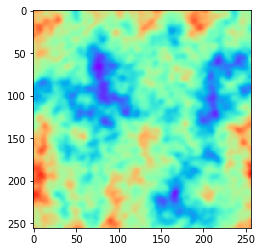

1 -0.07457 3.34231


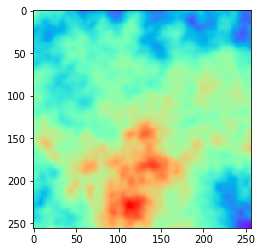

In [7]:
# Show components
for i in range(components[0].header['NAXIS3']):
    print(i, round(np.mean(components_data[i]),5), round(np.std(components_data[i]),5))
    plt.imshow(components_data[i], cmap='rainbow')
    plt.show()

In [8]:
# Read input data file
hera_hdl, hera_data = fm.read_fits_map(datafile)
hera_hdl[0].header

Filename: /home/vlad/software/utils/vladprogs/fastmem/HERA/fx=1_RHS=0_fa=1_x_256x256x32_Total_Synch+FF_varBS.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      26   (256, 256, 32)   float64   


SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                  -64 / array data type                                
NAXIS   =                    3 / number of array dimensions                     
NAXIS1  =                  256                                                  
NAXIS2  =                  256                                                  
NAXIS3  =                   32                                                  
WCSAXES =                    3 / Number of coordinate axes                      
CRPIX1  =                256.0 / Pixel coordinate of reference point            
CRPIX2  =                256.0 / Pixel coordinate of reference point            
CRPIX3  =                  1.0 / Pixel coordinate of reference point            
CDELT1  =            -0.003125 / [deg] Coordinate increment at reference point  
CDELT2  =             0.003125 / [deg] Coordinate increment at reference point  
CDELT3  =      3566808.30280

0 519.96665 100.83394
None


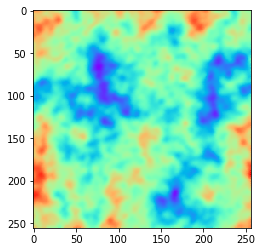

1 470.52752 91.17111
None


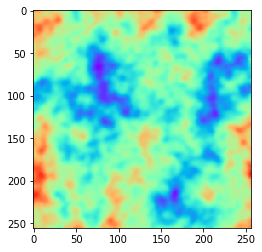

2 427.37729 82.74586
None


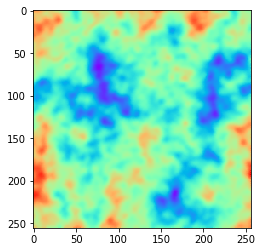

3 389.52772 75.36251
None


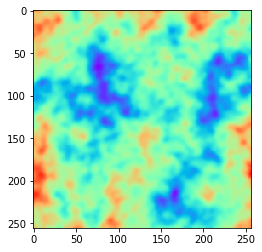

4 356.17362 68.86205
None


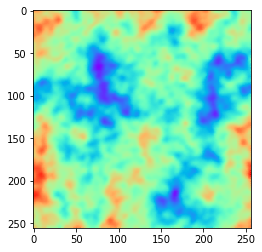

5 326.65387 63.11371
None


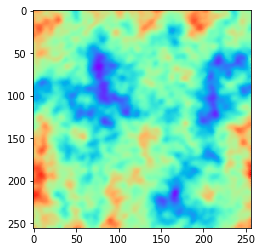

6 300.42194 58.00999
None


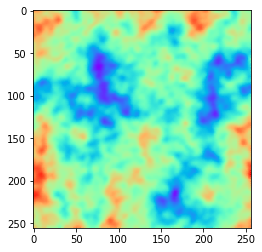

7 277.02242 53.4606
None


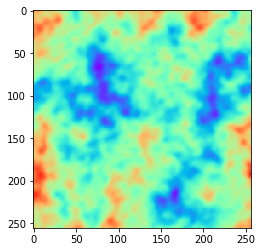

8 256.07679 49.39175
None


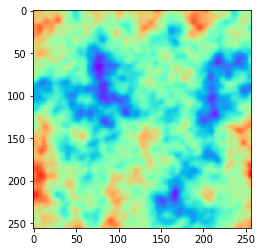

9 237.26372 45.73986
None


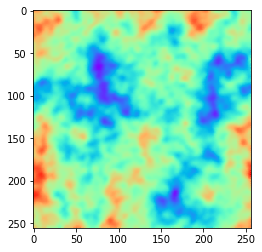

10 220.31235 42.45303
None


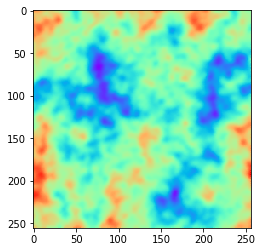

11 204.99319 39.48352
None


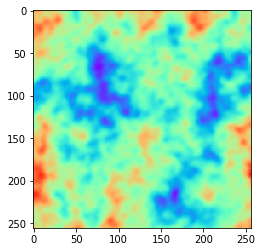

12 191.11132 36.79436
None


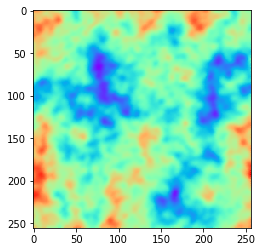

13 178.49977 34.35365
None


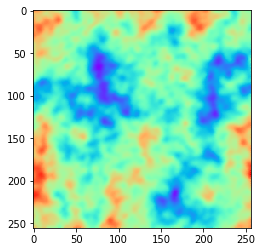

14 167.01317 32.13147
None


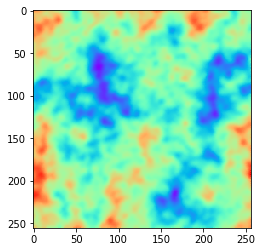

15 156.5283 30.1027
None


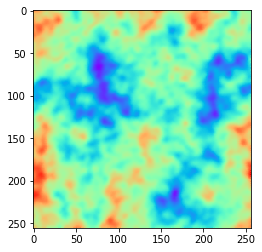

16 146.94211 28.24876
None


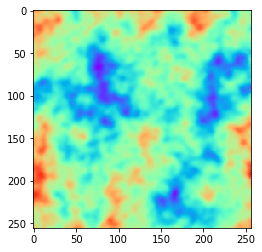

17 138.152 26.54912
None


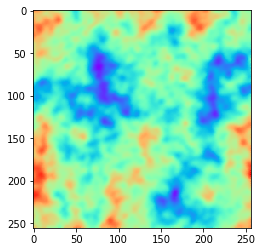

18 130.0802 24.98693
None


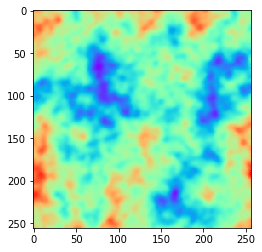

19 122.65204 23.54926
None


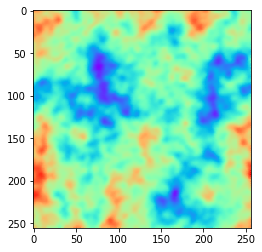

20 115.79696 22.22475
None


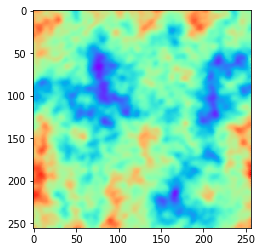

21 109.46408 21.00312
None


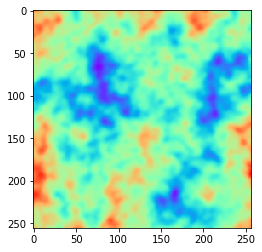

22 103.59714 19.87153
None


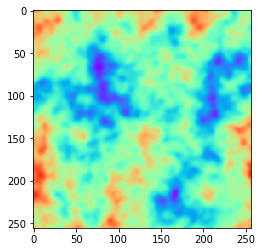

23 98.1586 18.82224
None


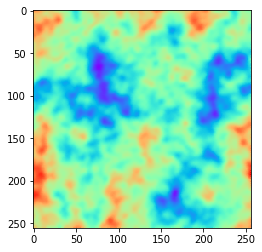

24 93.10725 17.84879
None


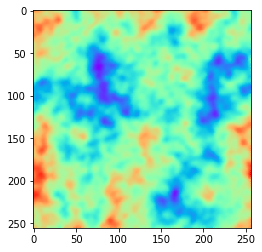

25 88.40808 16.94414
None


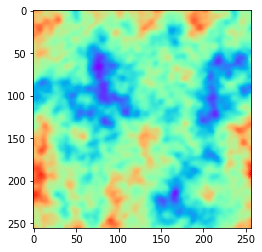

26 84.03014 16.1012
None


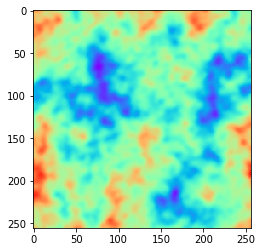

27 79.94744 15.31558
None


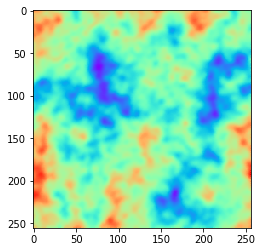

28 76.13348 14.58234
None


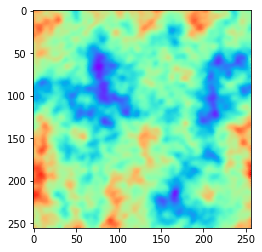

29 72.56751 13.89711
None


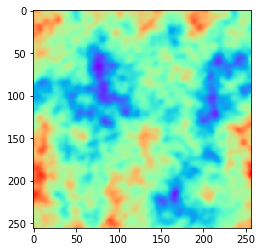

30 69.22801 13.25568
None


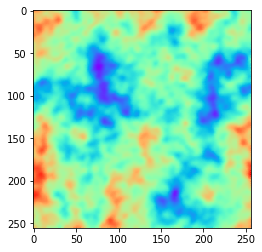

31 66.09921 12.65383
None


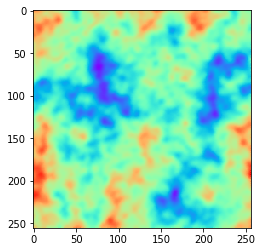

In [9]:
# Show mixed frequency channels
for i in range(hera_hdl[0].header['NAXIS3']):
    print(print(i, round(np.mean(hera_data[i]),5), round(np.std(hera_data[i]),5)))
    plt.imshow(hera_data[i], cmap='rainbow')
    plt.show()

In [10]:
# Read noise models (to calculate it's power spectum)
noise, noise_data = fm.read_fits_map(noisefile)
noise[0].header

Filename: /home/vlad/software/utils/vladprogs/fastmem/HERA/fx=1_RHS=0_fa=1_x_256x256x32_HI_lownoise.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      26   (256, 256, 32)   float64   


SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                  -64 / array data type                                
NAXIS   =                    3 / number of array dimensions                     
NAXIS1  =                  256                                                  
NAXIS2  =                  256                                                  
NAXIS3  =                   32                                                  
WCSAXES =                    3 / Number of coordinate axes                      
CRPIX1  =                256.0 / Pixel coordinate of reference point            
CRPIX2  =                256.0 / Pixel coordinate of reference point            
CRPIX3  =                  1.0 / Pixel coordinate of reference point            
CDELT1  =            -0.003125 / [deg] Coordinate increment at reference point  
CDELT2  =             0.003125 / [deg] Coordinate increment at reference point  
CDELT3  =      3566808.30280

0 -0.0001 5e-05


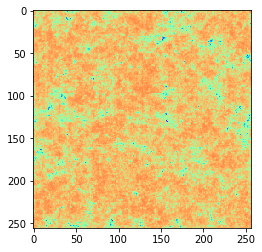

1 -9e-05 8e-05


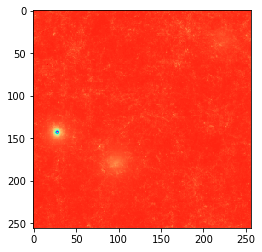

2 -0.00013 0.00022


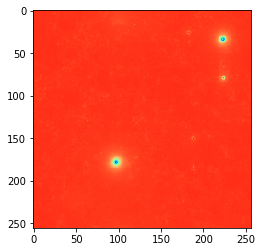

3 -0.00032 0.00046


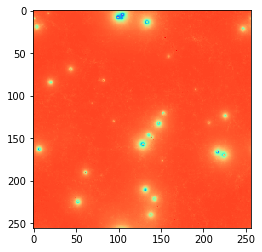

4 -0.0006 0.00061


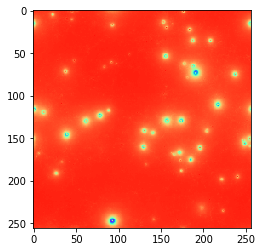

5 -0.00104 0.00079


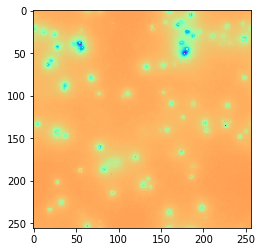

6 -0.00186 0.00096


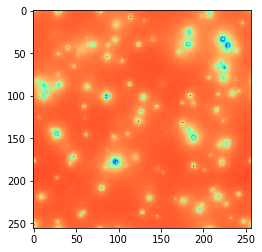

7 -0.00411 0.00179


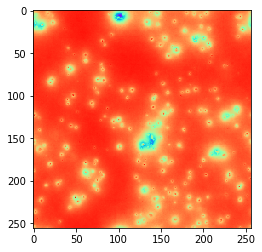

8 -0.0062 0.00189


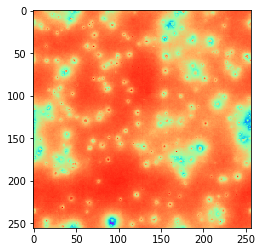

9 -0.00967 0.00273


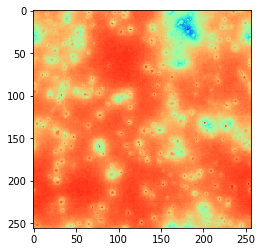

10 -0.01496 0.00306


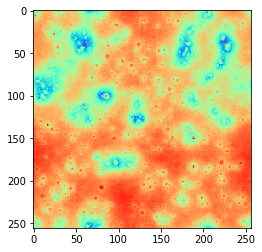

11 -0.02179 0.00328


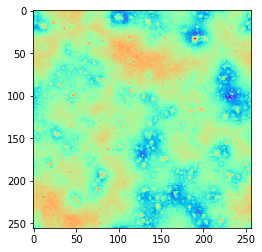

12 -0.02888 0.00338


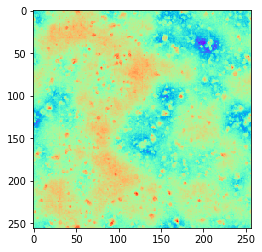

13 -0.03499 0.00374


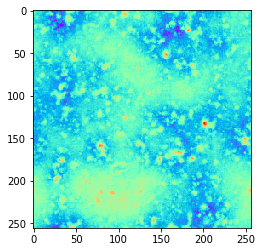

14 -0.04064 0.0045


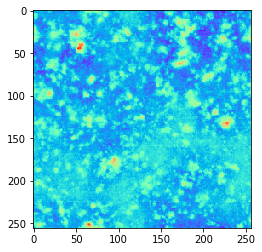

15 -0.04388 0.00596


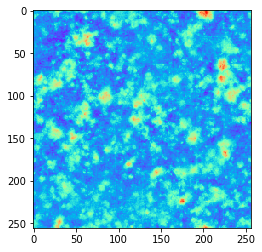

16 -0.03913 0.00943


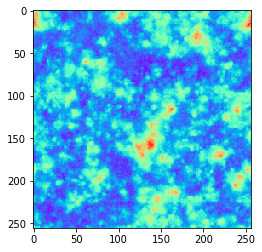

17 -0.03441 0.01062


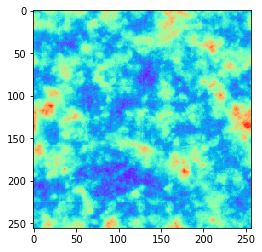

18 -0.0249 0.01156


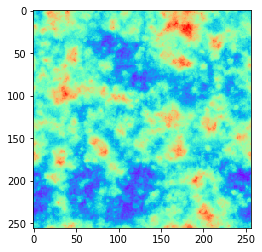

19 -0.01286 0.01023


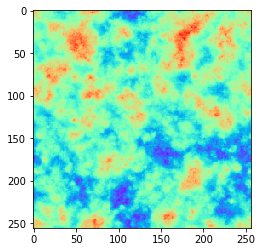

20 -0.0052 0.00836


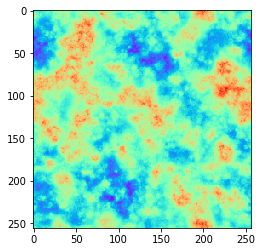

21 0.00332 0.00677


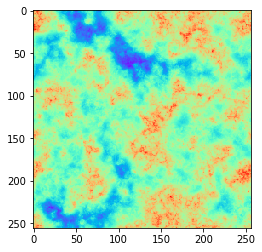

22 0.00603 0.00513


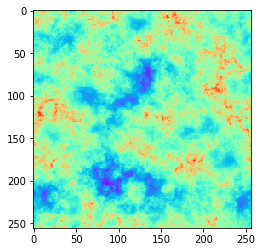

23 0.00938 0.004


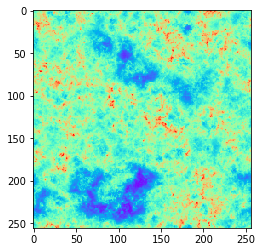

24 0.01124 0.00325


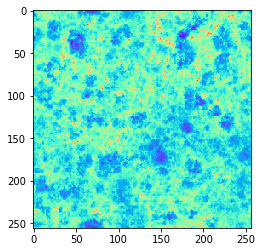

25 0.0114 0.00336


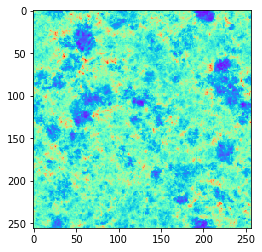

26 0.01002 0.00418


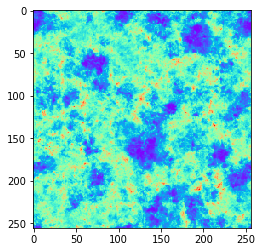

27 0.00894 0.00446


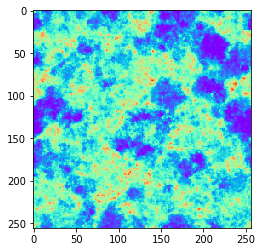

28 0.00658 0.00464


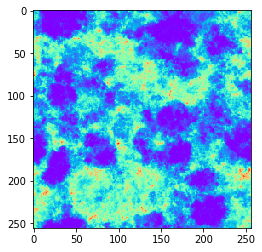

29 0.00466 0.00417


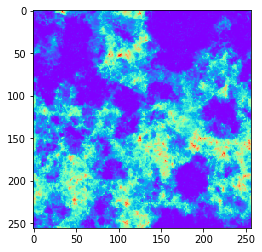

30 0.00184 0.0029


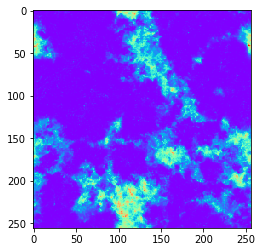

31 0.00059 0.00146


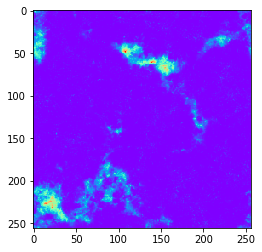

In [11]:
# Show noise maps
nvar = []
for i in range(noise[0].header['NAXIS3']):
    nvar_field = np.var(noise_data[i])
    nvar.append(nvar_field)
    print(i, round(np.mean(noise_data[i]),5), round(np.std(noise_data[i]),5))
    plt.imshow(noise_data[i], cmap='rainbow')
    plt.show()

In [12]:
# Check the shape of the maps
assert(noise[0].header['NAXIS1'] == hera_hdl[0].header['NAXIS1'])
assert(noise[0].header['NAXIS2'] == hera_hdl[0].header['NAXIS2'])
assert(noise[0].header['NAXIS3'] == hera_hdl[0].header['NAXIS3'])

assert(components[0].header['NAXIS1'] == hera_hdl[0].header['NAXIS1'])
assert(components[0].header['NAXIS2'] == hera_hdl[0].header['NAXIS2'])

In [13]:
# Pixel size in degrees
skycell = np.abs(hera_hdl[0].header['CDELT1'])
assert(skycell > 0.0)

In [14]:
# Get/calculate frequency conversion matrix (FCM, or mixing matrix)
conv = fm.get_convert()
print(conv, conv.shape)

[[ 3.566004e+00 -1.755189e+00]
 [ 3.226891e+00 -1.463452e+00]
 [ 2.930915e+00 -1.220071e+00]
 [ 2.671300e+00 -1.016092e+00]
 [ 2.442521e+00 -8.444190e-01]
 [ 2.240045e+00 -6.993870e-01]
 [ 2.060124e+00 -5.764450e-01]
 [ 1.899642e+00 -4.719070e-01]
 [ 1.755991e+00 -3.827770e-01]
 [ 1.626978e+00 -3.065990e-01]
 [ 1.510748e+00 -2.413550e-01]
 [ 1.405724e+00 -1.853740e-01]
 [ 1.310561e+00 -1.372680e-01]
 [ 1.224105e+00 -9.587900e-02]
 [ 1.145362e+00 -6.023600e-02]
 [ 1.073474e+00 -2.952400e-02]
 [ 1.007695e+00 -3.053000e-03]
 [ 9.473780e-01  1.976200e-02]
 [ 8.919540e-01  3.941600e-02]
 [ 8.409280e-01  5.633400e-02]
 [ 7.938630e-01  7.087700e-02]
 [ 7.503740e-01  8.335600e-02]
 [ 7.101200e-01  9.403800e-02]
 [ 6.728010e-01  1.031530e-01]
 [ 6.381470e-01  1.109000e-01]
 [ 6.059210e-01  1.174520e-01]
 [ 5.759090e-01  1.229570e-01]
 [ 5.479190e-01  1.275460e-01]
 [ 5.217820e-01  1.313320e-01]
 [ 4.973420e-01  1.344140e-01]
 [ 4.744620e-01  1.368790e-01]
 [ 4.530170e-01  1.388010e-01]] (32, 2)

In [15]:
conv.shape

(32, 2)

In [16]:
# Get central frequencies
freqs = fm.get_frequencies()
print(freqs, np.mean(freqs))

[ 90.533  94.1    97.667 101.234 104.801 108.367 111.934 115.501 119.068
 122.635 126.201 129.768 133.335 136.902 140.469 144.036 147.602 151.169
 154.736 158.303 161.87  165.436 169.003 172.57  176.137 179.704 183.27
 186.837 190.404 193.971 197.538 201.104] 145.81890625


In [17]:
# Get FWHMs, arcmin (same for all freqs)
fwhm, sigma = fm.get_fwhm(freqs.shape[0], 0.01)
print(fwhm, np.mean(fwhm))
print(sigma, np.mean(sigma))

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01] 0.01
[7.07768167e-05 7.07768167e-05 7.07768167e-05 7.07768167e-05
 7.07768167e-05 7.07768167e-05 7.07768167e-05 7.07768167e-05
 7.07768167e-05 7.07768167e-05 7.07768167e-05 7.07768167e-05
 7.07768167e-05 7.07768167e-05 7.07768167e-05 7.07768167e-05
 7.07768167e-05 7.07768167e-05 7.07768167e-05 7.07768167e-05
 7.07768167e-05 7.07768167e-05 7.07768167e-05 7.07768167e-05
 7.07768167e-05 7.07768167e-05 7.07768167e-05 7.07768167e-05
 7.07768167e-05 7.07768167e-05 7.07768167e-05 7.07768167e-05] 7.077681669066825e-05


In [18]:
# Check shapes
print(conv.shape, freqs.shape, fwhm.shape)
assert(conv.shape[0] == freqs.shape[0])
assert(fwhm.shape[0] == freqs.shape[0])

(32, 2) (32,) (32,)


In [19]:
nx = hera_hdl[0].header['NAXIS1']
ny = hera_hdl[0].header['NAXIS2']
nf = hera_hdl[0].header['NAXIS3']
nc = components[0].header['NAXIS3']

In [20]:
# Convert variances from a list to an array
nvar = np.asarray(nvar)
# Find the variance in Fourier domain (per Re or Im field)
nvar = nvar*nx*ny/2.0

In [21]:
print("Assumed noise variance per Re or Im part of the pixel in Fourier domain, nvar: ")
print(nvar)

Assumed noise variance per Re or Im part of the pixel in Fourier domain, nvar: 
[6.91690021e-05 2.00345406e-04 1.55428297e-03 7.01275478e-03
 1.21354532e-02 2.03854719e-02 3.00747170e-02 1.05185253e-01
 1.17510899e-01 2.45007164e-01 3.06094838e-01 3.53470346e-01
 3.74621018e-01 4.58347348e-01 6.64287624e-01 1.16542864e+00
 2.91398999e+00 3.69272424e+00 4.37750824e+00 3.42692057e+00
 2.29119891e+00 1.50337014e+00 8.63631229e-01 5.23414175e-01
 3.46578708e-01 3.70044971e-01 5.71828181e-01 6.52962771e-01
 7.06943221e-01 5.68814906e-01 2.76354744e-01 6.97431212e-02]


In [22]:
bins, topbin = fm.calcbins(nx,ny)

In [23]:
bins

array([[5923, 5922, 5921, ..., 5919, 5921, 5922],
       [5922, 5920, 5918, ..., 5916, 5918, 5920],
       [5921, 5918, 5915, ..., 5912, 5915, 5918],
       ...,
       [5919, 5916, 5912, ..., 5908, 5912, 5916],
       [5921, 5918, 5915, ..., 5912, 5915, 5918],
       [5922, 5920, 5918, ..., 5916, 5918, 5920]])

In [24]:
topbin

5923

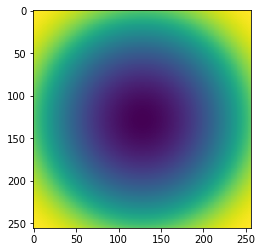

In [25]:
plt.imshow(bins)
plt.show()

In [26]:
beam, beamarea = fm.makebeam(nx,ny,sigma,skycell)

In [27]:
beamarea

array([2.97477949e-09, 2.97477949e-09, 2.97477949e-09, 2.97477949e-09,
       2.97477949e-09, 2.97477949e-09, 2.97477949e-09, 2.97477949e-09,
       2.97477949e-09, 2.97477949e-09, 2.97477949e-09, 2.97477949e-09,
       2.97477949e-09, 2.97477949e-09, 2.97477949e-09, 2.97477949e-09,
       2.97477949e-09, 2.97477949e-09, 2.97477949e-09, 2.97477949e-09,
       2.97477949e-09, 2.97477949e-09, 2.97477949e-09, 2.97477949e-09,
       2.97477949e-09, 2.97477949e-09, 2.97477949e-09, 2.97477949e-09,
       2.97477949e-09, 2.97477949e-09, 2.97477949e-09, 2.97477949e-09])

In [28]:
beamfft = np.fft.fft2(beam)
beamfft = np.fft.fftshift(beamfft, axes=(1,2))

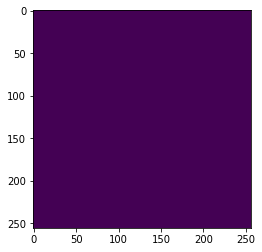

In [29]:
plt.imshow(abs(beamfft[0]))
plt.show()

In [30]:
datafft = np.fft.fft2(hera_data)
datafft = np.fft.fftshift(datafft, axes=(1,2))

In [31]:
noisefft = np.fft.fft2(noise_data)
noisefft = np.fft.fftshift(noisefft, axes=(1,2))

In [32]:
compfft = np.fft.fft2(components_data)
compfft = np.fft.fftshift(compfft, axes=(1,2))

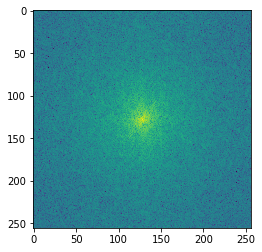

In [33]:
plt.imshow(np.log(abs(noisefft[nf-1])))
plt.show()

In [34]:
# Finding power spectra for the noise realisations
noiseps = np.zeros((nf, topbin+1))
for i in range(nf):
    workspace = np.abs(noisefft[i,:,:]**2)
    print("Noise level calculated ", round(np.mean(workspace)/2,5), " and assumed ", round(nvar[i],5))
    summ, num = fm.azav(workspace, nx, ny, topbin, bins)
    print(round(np.mean(workspace)/2,5))
    noiseps[i,:] = summ

Noise level calculated  0.0004  and assumed  7e-05
0.0004
Noise level calculated  0.00048  and assumed  0.0002
0.00048
Noise level calculated  0.00213  and assumed  0.00155
0.00213
Noise level calculated  0.01044  and assumed  0.00701
0.01044
Noise level calculated  0.02401  and assumed  0.01214
0.02401
Noise level calculated  0.05557  and assumed  0.02039
0.05557
Noise level calculated  0.1438  and assumed  0.03007
0.1438
Noise level calculated  0.65899  and assumed  0.10519
0.65899
Noise level calculated  1.37678  and assumed  0.11751
1.37678
Noise level calculated  3.30919  and assumed  0.24501
3.30919
Noise level calculated  7.64264  and assumed  0.30609
7.64264
Noise level calculated  15.91344  and assumed  0.35347
15.91344
Noise level calculated  27.69819  and assumed  0.37462
27.69819
Noise level calculated  40.56566  and assumed  0.45835
40.56566
Noise level calculated  54.79669  and assumed  0.66429
54.79669
Noise level calculated  64.24769  and assumed  1.16543
64.24769
Noise

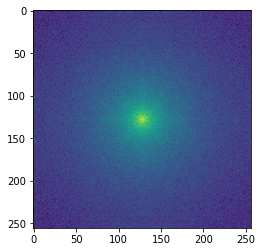

In [35]:
plt.imshow(np.log(workspace))
plt.show()

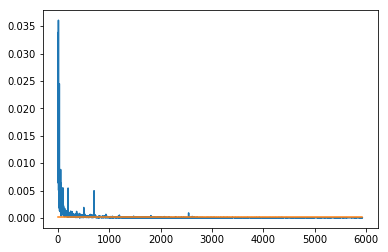

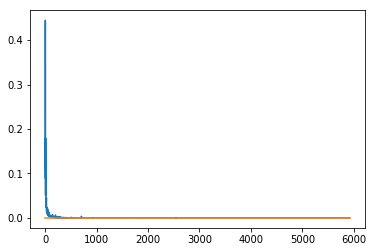

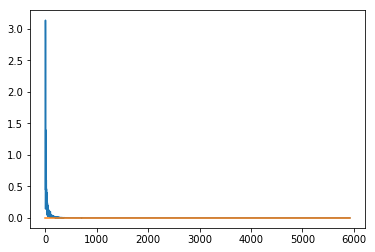

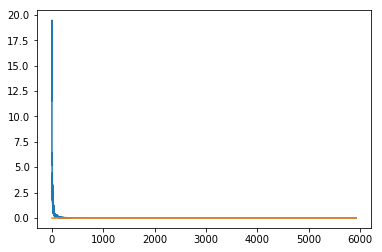

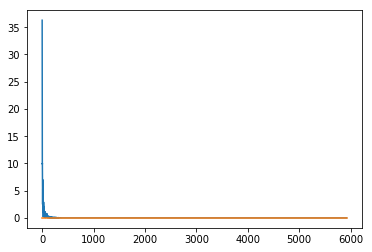

...

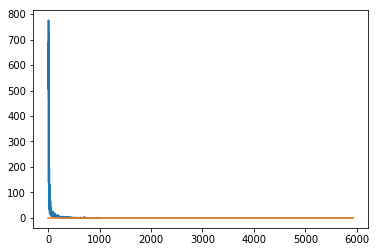

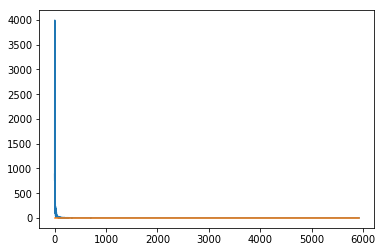

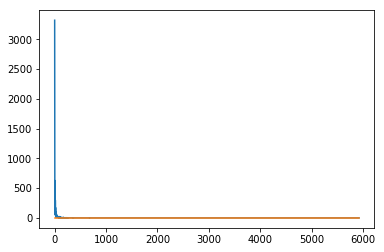

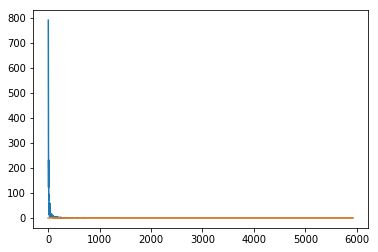

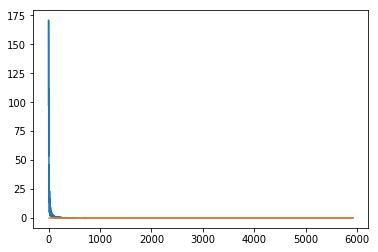

In [36]:
# Plot the noise power spectra and the noise floor for each frequency
for i in range(nf):
    plt.plot(noiseps[i,1:]), plt.plot([1,topbin-1],[nvar[i]*2, nvar[i]*2])
    plt.show()

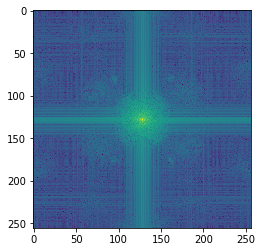

In [37]:
plt.imshow(np.log(abs(datafft[nf-1])))
plt.show()

In [38]:
# Finding power spectra for the data
dataps = np.zeros((nf, topbin+1))
for i in range(nf):
    workspace = np.abs(datafft[i,:,:]**2)
    summ, num = fm.azav(workspace, nx, ny, topbin, bins)
    dataps[i,:] = summ

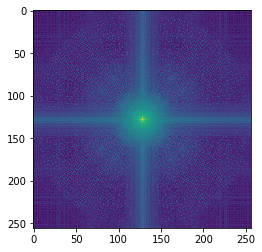

In [39]:
plt.imshow(np.log(workspace))
plt.show()

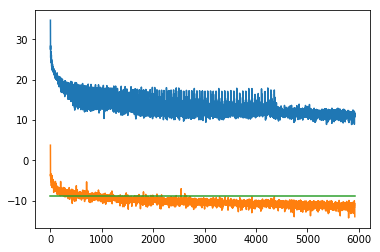

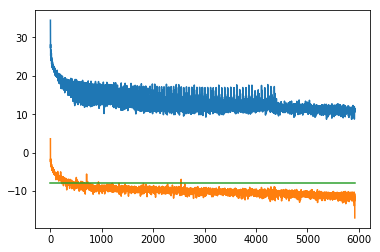

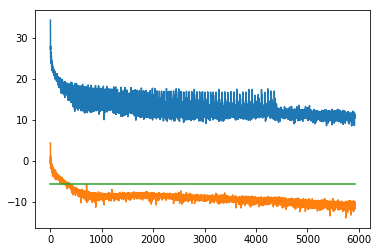

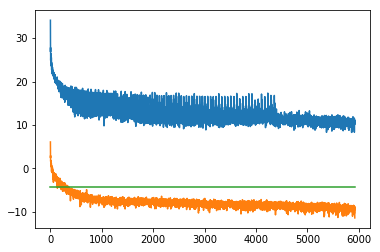

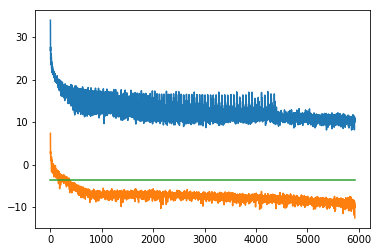

...

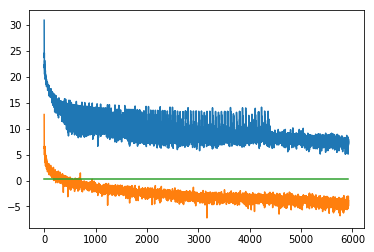

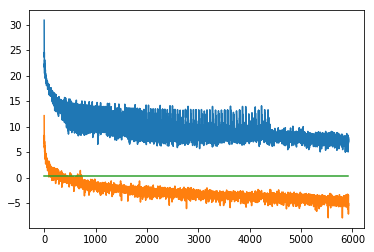

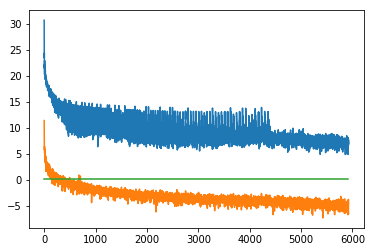

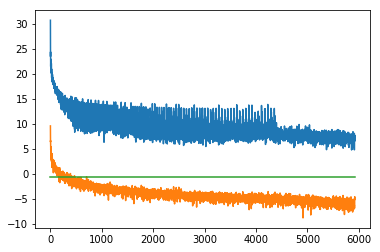

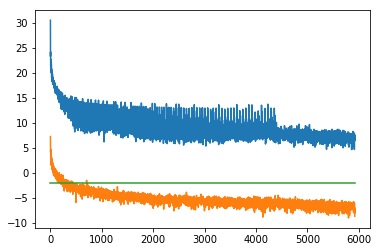

In [40]:
# Show logpower spectra of noisy data and noise floor
for i in range(nf):
    plt.plot(np.log(dataps[i,:])), plt.plot(np.log(noiseps[i,:])), plt.plot([0,topbin-1],np.log([nvar[i]*2, nvar[i]*2]))
    plt.show()

In [41]:
# Find Intrinsic Correlation Function (ICF)
icf = fm.make_icf(components_data,nx,ny,nc, topbin, bins, usecross=True)

0 0
1 0
1 1


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in log
  


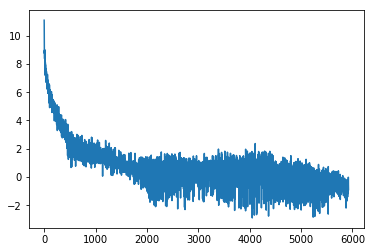

In [42]:
# Show the off-diagonal ICF values
plt.plot(np.log(icf[1,0,:]))
plt.show()

In [43]:
# Find hidden (uncorrelated) variables
mapsfft = fm.vistohid(icf,bins,compfft)

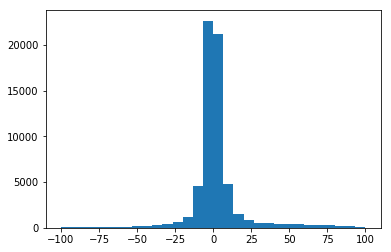

In [44]:
# Pixel value distribution of the visible Fourier image
plt.hist(np.real(compfft[1,:,:]).reshape(nx*nx), range=(-100,100), bins=30)
plt.show()

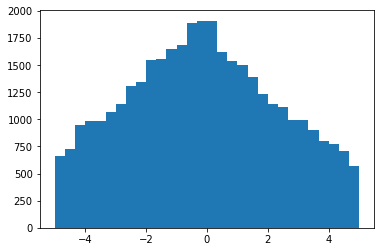

In [45]:
# Pixel value distribution of the hidden Fourier image (uncorrelated part)
plt.hist(np.real(mapsfft[1,:,:]).reshape(nx*nx), range=(-5,5), bins=30)
plt.show()

In [46]:
# Calculate RL = FCM*L, where FCM is the mixing matrix and L is the Cholesky-decomposed (cross)-spectral terms (ICF)
rl = fm.updaterl(topbin, conv, icf)

In [47]:
datapfft = np.zeros((nf,nx,ny), dtype=complex)

In [48]:
# Calculate predicted frequency maps with the component mixture
for i in range(nx):
    for j in range(ny):
        #fm.predict_mode(mapsfft,beamfft,rl,datapfft,bins,i,j)
        #predict_mode(skyfft_mode,beamfft_mode,rl_mode):
        ibin = bins[i,j]
        datapfft[:,i,j] = fm.predict_mode(mapsfft[:,i,j], beamfft[:,i,j], rl[:,:,ibin])

In [49]:
datap = np.fft.ifft2(datapfft)
datap = np.fft.ifftshift(datap, axes=(1,2))

0 90.533


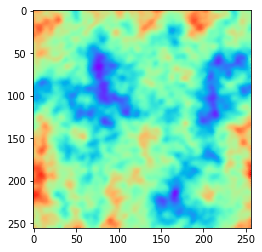

1 94.1


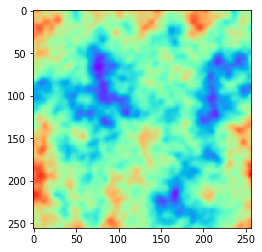

2 97.667


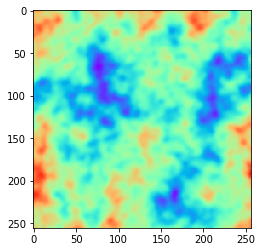

3 101.234


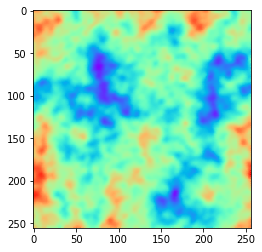

4 104.801


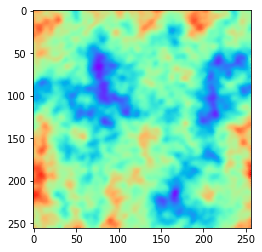

5 108.367


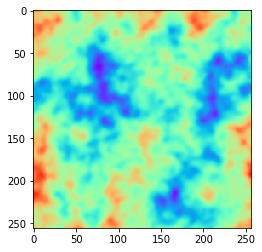

6 111.934


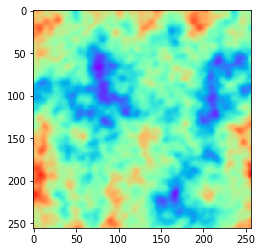

7 115.501


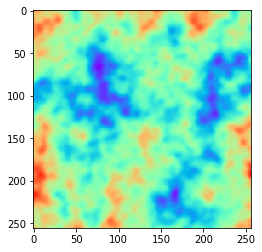

8 119.068


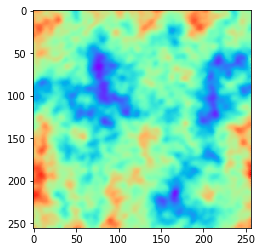

9 122.635


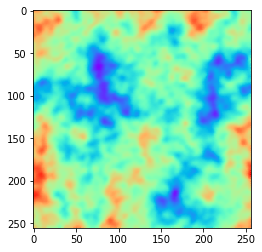

10 126.201


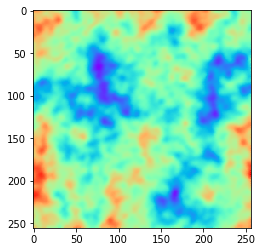

11 129.768


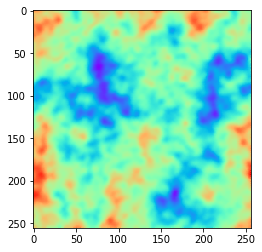

12 133.335


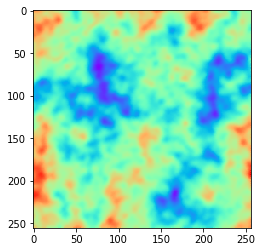

13 136.902


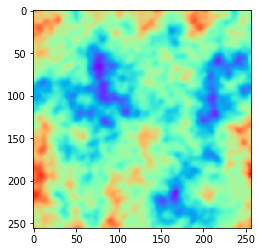

14 140.469


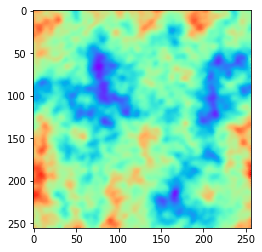

15 144.036


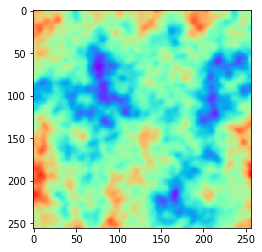

16 147.602


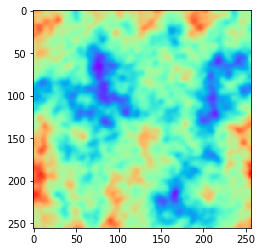

17 151.169


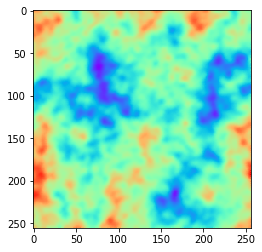

18 154.736


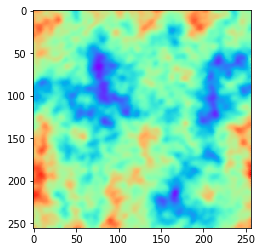

19 158.303


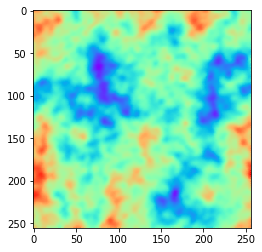

20 161.87


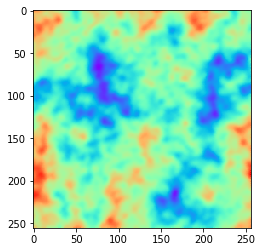

21 165.436


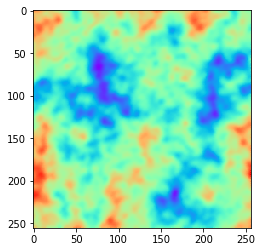

22 169.003


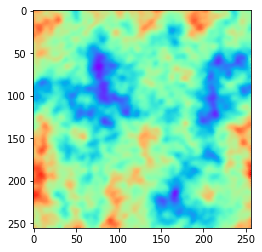

23 172.57


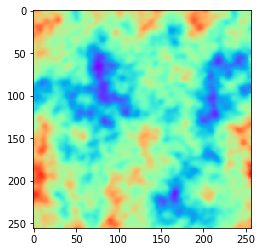

24 176.137


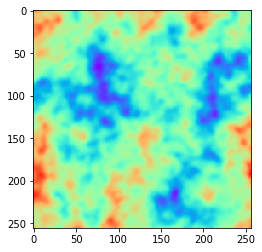

25 179.704


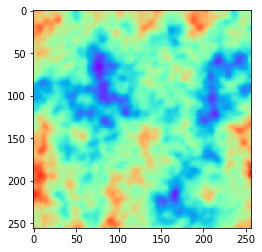

26 183.27


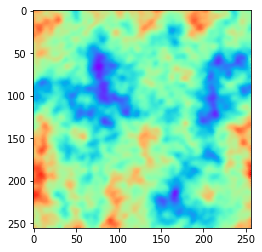

27 186.837


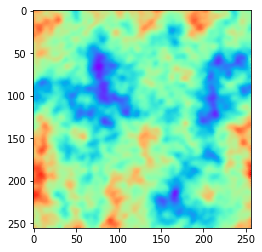

28 190.404


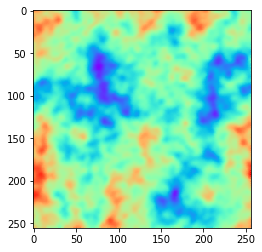

29 193.971


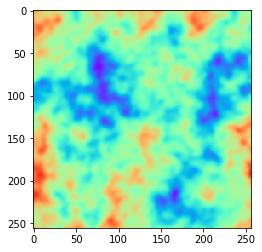

30 197.538


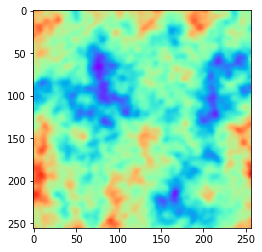

31 201.104


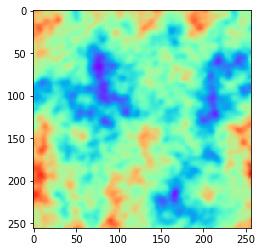

In [50]:
#Show predicted frequency maps
for i in range(nf):
    print(i, freqs[i])
    plt.imshow(abs(datap[i]), cmap='rainbow')
    plt.show()

In [51]:
comprec = np.empty_like(mapsfft)

In [52]:
# MEM functional to minimise
def F_mem(x,i,j):
    n = x.shape[0]
    endRe = int(n/2)
    xRe = x[:endRe]
    xIm = x[endRe:]
    xCmplx = xRe +1j*xIm
# Predict data
    ibin = bins[i,j]
    datap = fm.predict_mode(xCmplx, beamfft[:,i,j], rl[:,:,ibin])
# Find Chi2 term
    chi2Re = np.sum((np.real(datap - datafft[:,i,j]))**2/nvar)
    chi2Im = np.sum((np.imag(datap - datafft[:,i,j]))**2/nvar)
    chi2 = chi2Re + chi2Im 
    
# Entropic part
    sfftr = xRe
    sffti = xIm
    psir = np.sqrt(sfftr**2 + 4.0*modelp*modeln)
    psii = np.sqrt(sffti**2 + 4.0*modelp*modeln)
    tempr = psir + sfftr
    tempi = psii + sffti
    valuer = psir-modelp-modeln-sfftr*np.log(tempr/(2.0*modelp))
    valuei = psii-modelp-modeln-sffti*np.log(tempi/(2.0*modelp))
    value = np.sum(valuer + valuei)
    fmem = 0.5*chi2 - alpha*value 
    return fmem 

In [53]:
# Chi2 functional to minimise
def F_chi2(x,i,j):
    n = x.shape[0]
    endRe = int(n/2)
    xRe = x[:endRe]
    xIm = x[endRe:]
    xCmplx = xRe +1j*xIm
# Predict data
    ibin = bins[i,j]
    datap = fm.predict_mode(xCmplx, beamfft[:,i,j], rl[:,:,ibin])
# Find Chi2 term
    chi2Re = np.sum((np.real(datap - datafft[:,i,j]))**2/nvar)
    chi2Im = np.sum((np.imag(datap - datafft[:,i,j]))**2/nvar)
    chi2 = chi2Re + chi2Im 
    return 0.5*chi2

In [54]:
# MEM functional to minimise, returns F_MEM and the gradient
def F_mem_grad(x,i,j):
    n = x.shape[0]
    endRe = int(n/2)
    xRe = x[:endRe]
    xIm = x[endRe:]
    xCmplx = xRe +1j*xIm
# Predict data
    ibin = bins[i,j]
    datap = fm.predict_mode(xCmplx, beamfft[:,i,j], rl[:,:,ibin])
    dfftr = np.real(datap - datafft[:,i,j])
    dffti = np.imag(datap - datafft[:,i,j])
# Find Chi2 term
    chi2Re = np.sum(dfftr**2/nvar)
    chi2Im = np.sum(dffti**2/nvar)
    chi2 = chi2Re + chi2Im 

# Find Chi2 gradient
    cgradr = np.zeros(nc)
    cgradi = np.zeros(nc)
    
    for l in range(nc):
        for k in range(nf):
            resp = np.sum(np.real(beamfft[k,i,j])*conv[k,:]*icf[:,l,ibin])
            factor = -2.*resp/nvar[k]
            valuer = factor*dfftr[k]
            valuei = factor*dffti[k]
            cgradr[l] += valuer
            cgradi[l] += valuei

# Entropic part
    sfftr = xRe
    sffti = xIm
    psir = np.sqrt(sfftr**2 + 4.0*modelp*modeln)
    psii = np.sqrt(sffti**2 + 4.0*modelp*modeln)
    tempr = psir + sfftr
    tempi = psii + sffti
    valuer = psir-modelp-modeln-sfftr*np.log(tempr/(2.0*modelp))
    valuei = psii-modelp-modeln-sffti*np.log(tempi/(2.0*modelp))
    value = np.sum(valuer + valuei)

# Find entropic gradient
    egradr = -np.log(tempr/2./modelp)
    egradi = -np.log(tempi/2./modelp)

# Total gradient for each Re and Im part
    fmemgradr = 0.5*cgradr - alpha*egradr
    fmemgradi = 0.5*cgradi - alpha*egradi
    fmemgrad = np.array((fmemgradr, fmemgradi))

# Total F_mem value    
    fmem = 0.5*chi2 - alpha*value
    return fmem, -1.0*fmemgrad.flatten()


In [55]:
# Chi2 functional to minimise, returns Chi2 and the gradient
def F_chi2_grad(x,i,j):
    n = x.shape[0]
    endRe = int(n/2)
    xRe = x[:endRe]
    xIm = x[endRe:]
    xCmplx = xRe +1j*xIm
# Predict data
    ibin = bins[i,j]
    datap = fm.predict_mode(xCmplx, beamfft[:,i,j], rl[:,:,ibin])
    dfftr = np.real(datap - datafft[:,i,j])
    dffti = np.imag(datap - datafft[:,i,j])
# Find Chi2 term
    chi2Re = np.sum(dfftr**2/nvar)
    chi2Im = np.sum(dffti**2/nvar)
    chi2 = chi2Re + chi2Im 

# Find Chi2 gradient
    cgradr = np.zeros(nc)
    cgradi = np.zeros(nc)
    
    for l in range(nc):
        for k in range(nf):
            resp = np.sum(np.real(beamfft[k,i,j])*conv[k,:]*icf[:,l,ibin])
            factor = -2.*resp/nvar[k]
            valuer = factor*dfftr[k]
            valuei = factor*dffti[k]
            cgradr[l] += valuer
            cgradi[l] += valuei
            
    fmemgradr = 0.5*cgradr
    fmemgradi = 0.5*cgradi
    fmemgrad = np.array((fmemgradr, fmemgradi))

# Total F_mem value    
    fmem = 0.5*chi2
    return fmem, -1.0*fmemgrad.flatten()


In [56]:
def F_mem_deriv(x,i,j):
    n = x.shape[0]
    endRe = int(n/2)
    xRe = x[:endRe]
    xIm = x[endRe:]
    xCmplx = xRe +1j*xIm
# Predict data
    ibin = bins[i,j]
    datap = fm.predict_mode(xCmplx, beamfft[:,i,j], rl[:,:,ibin])
    dfftr = np.real(datap - datafft[:,i,j])
    dffti = np.imag(datap - datafft[:,i,j])
    
# Find Chi2 gradient
    cgradr = np.zeros(nc)
    cgradi = np.zeros(nc)
    
    for l in range(nc):
        for k in range(nf):
            resp = np.sum(np.real(beamfft[k,i,j])*conv[k,:]*icf[:,l,ibin])
            factor = -2.*resp/nvar[k]
            valuer = factor*dfftr[k]
            valuei = factor*dffti[k]
            cgradr[l] += valuer
            cgradi[l] += valuei
            
# Find entropic gradient
    sfftr = xRe
    sffti = xIm
    psir = np.sqrt(sfftr**2 + 4.0*modelp*modeln)
    psii = np.sqrt(sffti**2 + 4.0*modelp*modeln)
    tempr = psir + sfftr
    tempi = psii + sffti
    egradr = -np.log(tempr/2./modelp)
    egradi = -np.log(tempi/2./modelp)

# Total gradient for each Re and Im part
    fmemgradr = 0.5*cgradr - alpha*egradr
    fmemgradi = 0.5*cgradi - alpha*egradi
    fmemgrad = np.array((fmemgradr, fmemgradi))

    return -1.0*fmemgrad.flatten()

In [57]:
def F_mem_minimize(args):
    f,x,i,j = args
    xmin = opt.minimize(f, x, method = 'CG', args = (i,j)).x
    xmin = xmin[:nc] + 1j*xmin[nc:]
    print(i,j, xmin)
    return i,j,xmin

In [58]:
def F_mem_grad_minimize(args):
    f,x,i,j = args
#    xmin = opt.minimize(f, x, method = 'BFGS', jac = True, args = (i,j)).x
    xmin = opt.minimize(f, x, method = 'CG', jac = True, args = (i,j)).x
    xmin = xmin[:nc] + 1j*xmin[nc:]
    print(i,j, xmin)
    return i,j,xmin

In [59]:
# Initial starting value - zero assumption
x0 = np.array([[0.,0.],[0.,0.]]).flatten()
# Assumed unit model for entropic term
modelp = np.array([1,1])
modeln = modelp
# Regularizing parameter
alpha = 0.25

In [60]:
print(opt.minimize(F_mem_grad, x0, method = 'BFGS', jac=True, args=(120,100), options={'disp': True}).x)

         Current function value: 34.785451
         Iterations: 9
         Function evaluations: 85
         Gradient evaluations: 74
[ 0.58131447 -0.41795814  0.75638283 -1.10255398]


In [61]:
print(opt.minimize(F_mem, x0, method = 'BFGS', args=(120,100), options={'disp': True}).x)

         Current function value: 34.793581
         Iterations: 8
         Function evaluations: 570
         Gradient evaluations: 93
[ 0.58131139 -0.41811387  0.75637973 -1.10271044]


In [62]:
args = (F_mem_grad,x0,10,10)

In [63]:
f = []
fg = []
iaxis = 1
x0 = np.array([[0.,0.],[0.,0.]]).flatten()
ax = np.linspace(-10,20)
lenax = len(ax)
f = np.zeros(lenax)
fg = np.zeros((len(x0), lenax))
for indx, xx in enumerate(ax):    
    x0[iaxis] = xx
    f0, fg0 = F_mem_grad(x0,120,100)
    f[indx] = f0
    fg[:,indx] = fg0

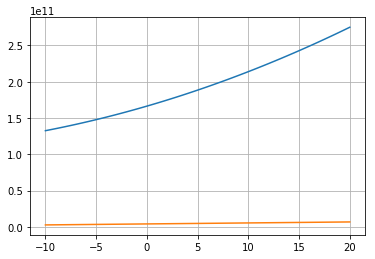

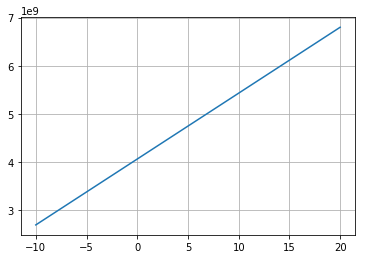

In [64]:
plt.plot(ax,f), plt.plot(ax, fg[iaxis,:])
plt.grid(True)
plt.show()
plt.plot(ax, fg[iaxis,:])
plt.grid(True)
plt.show()


In [65]:
# Make reconstruction of the components
if (not multithreaded):
    start_time = time.time()
    for i in range(nx):
        for j in range(ny):
            ibin = bins[i,j]
            xmin = opt.minimize(F_mem, x0, method = 'BFGS', jac =F_mem_deriv , args=(i,j)).x
            xmin = xmin[:nc] + 1j*xmin[nc:]
            comprec[:,i,j] = xmin
            print(i, j, ibin, comprec[0,i,j])
    elapsed_time = time.time() - start_time
    print("Single-threaded minimization took ", elapsed_time, " sec")

In [66]:
F_mem_grad(x0,10,10)

(317368996.3508335,
 array([-1.81028998e+08,  3.37472423e+05,  1.26093270e+08, -2.35058363e+05]))

In [67]:
if multithreaded :
    args = []
    for i in range(nx):
        for j in range(ny):
            args.append((F_chi2_grad,x0,i,j))

    start_time = time.time()
    p = Pool(8)
    datarec = p.map(F_mem_grad_minimize,args)
    elapsed_time = time.time() - start_time
    print("Multi-threaded minimization took ", elapsed_time, " sec")
    
    for dataelement in datarec:
        i = dataelement[0]
        j = dataelement[1]
        comprec[:,i,j] = dataelement[2]
    

0 0 [ 3.6247769+0.j 20.       +0.j]
32 0 [ 13.95945064-7.75581016j -95.62103757+4.07043325j]
48 0 [  4.23299091 +4.68419081j -17.0511115 -37.16200564j]
0 1 [-2.90448736+4.38589173j -1.45543436-3.78557256j]
24 0 [  5.97540127 +1.8785765j  -18.36649427-23.05666069j]
16 0 [  0.62142252-2.81128576j -19.26662614+3.57353839j]
8 0 [  5.19798759-1.02799636j -45.81403196+0.29441245j]
32 1 [-15.52367871+8.99687838j  11.66799386-5.86621131j]
56 0 [ 2.29658201+2.39738758j -4.68379038-1.49301841j]
24 1 [-12.43300564+2.08639353j   3.78330764+4.7748546j ]
56 1 [-1.76252828-1.51677434j -1.17062803-0.88587361j]
16 1 [ -2.87579803 +7.85202783j -12.63354882-17.07878003j]
40 0 [ 16.60734173-28.70375824j -60.4952531 +37.50077449j]
48 1 [-6.27330947-6.80809328j -7.10451062+1.4369134j ]
32 2 [ 9.44342527-11.66414455j -7.04684159 +2.92702086j]
8 1 [-3.43007545+4.88427246j  0.72863059-7.35030727j]
24 2 [2.80901044 +3.61741621j 7.62837059-55.9883234j ]
56 2 [-0.65231347+1.07954296j  4.05480691-1.49975928j]
16 2

48 23 [  0.77491394-1.199844j   -11.46107014+5.32765172j]
32 14 [10.89784174-5.86803742j -6.52088912+0.75664446j]
8 18 [  5.83398978 -4.99192248j -12.96447651+10.19240022j]
56 21 [0.73802202-0.78825257j 0.236818  -2.31217368j]
24 16 [ 3.06595404+5.24178496j -1.79586509-9.1751428j ]
48 24 [-6.41582471+7.42097237j 11.24144666-7.32532765j]
56 22 [0.2239077 +0.41120015j 1.04360067-0.62673939j]
8 19 [-4.36557029 +6.770573j   21.0519618 -12.82381731j]
24 17 [-4.89092823-3.11351752j  8.8990847 +5.67930553j]
48 25 [ 0.66179851-0.6635749j  -8.99278899+3.39396995j]
8 20 [  8.7989332 -4.62734931j -15.01469893-1.62617695j]
24 18 [1.88093352+0.78648862j 4.60927524-1.82748381j]
24 19 [  0.61713709 +1.16132934j -21.21904613+10.26731606j]
48 26 [-1.51841602+2.91111969j  3.43066274-6.01866411j]
8 21 [-6.02556765-0.15489573j 12.38897246-2.58200194j]
56 23 [ 0.42505712-1.62280583j -4.16209863+0.75853182j]
24 20 [ 3.89788135 +1.76434268j -1.58120293-25.86834888j]
56 24 [-0.37864713+0.85010206j  0.63413026

48 43 [ 1.28480209-0.25294372j -5.0730903 -1.94998749j]
40 39 [-0.40322348+0.31735698j  2.58355817+3.3717932j ]
16 24 [ 1.91961389-1.93990671j -1.92164839+4.08184841j]
32 28 [ 19.73972666-7.44960366j -19.61393922+0.68716434j]
48 44 [-0.66863721+0.19180868j 12.53116552-2.40649411j]
32 29 [-14.38404453+10.18084066j  12.49364887 -2.21325795j]
40 40 [  61.92469267 +15.195201j   -101.60311251-106.09123345j]
16 25 [-1.11530662+2.53481477j -3.63544782+1.27033103j]
48 45 [ 1.65550579-0.48995875j -3.32003325+0.72261862j]
0 43 [ 18.68645141-28.68784436j -49.59264748+33.58218263j]
56 45 [ 42.48412057-23.59252434j -58.15682043+30.34739969j]
40 41 [-34.09350126  -3.39604485j 169.08833915+226.98089379j]
24 36 [-7.07543076+20.7125668j  50.58188741-93.73681879j]
48 46 [-3.0538095 +0.85059974j 19.50528506-2.9254826j ]
56 46 [-1.50056688+1.30658606j  3.1710239 +0.98056461j]
0 44 [-14.75693387+15.86579758j  69.94644533-64.07034856j]
24 37 [-0.00304669-0.46559683j -0.76206436+1.56992741j]
40 42 [-0.094753

40 63 [  3.59904636 -1.0815134j -12.67542761+24.1493618j]
24 57 [ 0.34405268-0.71942978j -9.85148176+5.28541976j]
56 65 [ 2.29391489-1.12551275j -8.81895466+4.83545379j]
16 32 [ 7.63006222-4.06651431j -4.09255756-1.59896321j]
32 45 [ 0.31248012-0.18692055j -2.85030217+1.1813996j ]
40 64 [ 1.82187735 -0.62295172j -2.96902803-12.26862043j]
0 64 [ 0.84213749-0.15241015j -1.67047241-5.56799266j]
16 33 [-1.75484177+2.46707221j -0.92372892-2.42699064j]
24 58 [-1.97218934-2.47685888j  8.17445399-2.4475499j ]
48 61 [  4.80211869-2.45857988j -14.45393359+9.86455786j]
56 66 [-1.12273014+1.16428538j  4.05222706-0.01912298j]
24 59 [-1.20643244+2.01771062j  2.38624203-7.3175629j ]
40 65 [ 1.13301636 -0.76523239j -6.6693971 +11.12340432j]
56 67 [ 3.59177336-3.20372783j -7.05392943+8.5072301j ]
0 65 [  0.76593844 -1.15016344j -24.33160294+25.27686405j]
32 46 [0.31352824-0.0977879j  0.48741124-0.77329038j]
56 68 [-1.87543936+2.39675437j  2.20390974-3.26289719j]
40 66 [-0.82336248 +0.32707031j  6.27003

32 65 [-1.05855375+1.93628167j -5.09699357+1.24361908j]
40 82 [-0.55494351 +1.82794021j  6.60996462-10.63318554j]
56 84 [-2.65710655+4.02815023j  1.37583468-8.86968766j]
48 73 [  8.2687595 +0.96367948j -14.65323976+1.63769766j]
24 83 [-0.57534378-1.60472673j  3.42691161+7.25182744j]
8 62 [ 2.06437433-1.34021359j -0.27131142+9.88185126j]
0 86 [-0.47948837+2.18517916j  2.52042374-4.99391217j]
32 66 [0.59307985-0.61250919j 0.50513252+1.79580256j]
56 85 [0.81218776-3.20577123j 5.6763121 +2.697837j  ]
0 87 [0.09892187-0.11067914j 0.180222  +5.73514502j]
48 74 [-2.69626309-1.07070006j  4.04054681+2.87698709j]
24 84 [-0.81627243 +2.49893684j 26.93377897-20.92709497j]
8 63 [-0.16318535-0.59253305j -7.65182955+2.70925248j]
40 83 [ -0.27176362  -2.55567457j -20.03877817+162.98309413j]
32 67 [ 0.05850413+0.97327732j -4.70484553+1.86669572j]
24 85 [ 0.23823354-2.12956358j -1.60052854+5.84314424j]
56 86 [-0.27824822+2.43769638j -3.20811015+0.3991339j ]
48 75 [  2.88759881-1.17390374j -14.23881862+7

24 99 [0.56370756-0.00570827j 0.03945447-2.66991803j]
56 103 [ 0.98774295-2.09869528j -2.42462532+5.29269614j]
0 108 [-1.53212839+0.59685371j  7.09652265-9.91300093j]
24 100 [-1.31020799+1.45708031j  5.75328834+0.68184826j]
32 92 [  4.94021648 +1.49099947j -22.34938446-19.65276596j]
48 87 [  2.23682726+0.70828183j -13.66003632+6.78014357j]
8 83 [-1.16345836-1.17658093j  2.5624807 +0.51977661j]
0 109 [ 0.75112145 -6.28827893j -5.34965576+17.55928707j]
32 93 [-1.61318343-0.51677624j -0.92092198-0.4772881j ]
16 50 [  3.61417495+0.18840789j -26.6618928 -0.27481905j]
48 88 [-1.15699515-3.26471672j  5.39894883-2.0280282j ]
0 110 [-0.69912171+0.84198183j  1.93088311-0.03667502j]
8 84 [1.05974675+2.30973827j 0.110615  -1.88999252j]
32 94 [ 2.21429583+1.58320741j -0.20837626-8.08360312j]
56 104 [-0.01132693+0.66885902j -6.18648107+1.13373943j]
24 101 [-0.96558581 -3.75096562j -1.66398673+11.2010854j ]
16 51 [-1.90982515 +1.56676088j  5.40175799+15.51886354j]
8 85 [-1.19798852-2.2878916j   1.419

40 112 [-5.59177214+11.60455682j 36.41963298 -8.54070677j]
32 108 [ 1.48912161 +3.97176421j -0.62877274-10.75634242j]
8 108 [ 0.91415335+2.51615232j -1.42544089-1.01048791j]
48 98 [-2.1085903 -2.32842482j  3.32169251+3.926563j  ]
56 123 [11.00793275-6.08605502j -6.70767364+9.20519794j]
0 129 [   5.12598094-10.00529362j -209.4502613 -17.57867119j]
32 109 [ 4.97243188-9.03109996j -1.30132631+9.26393645j]
8 109 [-0.65048827-0.98821111j  0.45301324+1.21602358j]
16 70 [ 2.03809769+2.07327495j -4.66152583-6.17525907j]
48 99 [ 2.22196912+0.89405078j -5.18115294+2.17150827j]
0 130 [ -2.78203806 -3.68851548j 115.12370738-35.94601785j]
40 113 [ 26.47824755-24.2410129j  -36.16258825+38.95674308j]
8 110 [0.08438739+1.59500463j 0.07924516-0.89699945j]
56 124 [-5.50564739+23.95448875j 29.16947137-35.97912452j]
16 71 [-1.15346224+0.03616763j  4.28346878-0.46716422j]
32 110 [ 4.71366618+3.62398914j -6.66904803-3.74707251j]
48 100 [-5.05337509-1.42489153j  3.51028594-1.22317048j]
24 120 [-0.45587897+6.

16 94 [ 0.44419029-0.22091167j -3.64817984-1.671374j  ]
0 153 [-0.71890862-1.37769826j -0.33489105-1.01427193j]
8 126 [-3.1586378  +3.7204996j  37.80315286+19.94999815j]
56 135 [-11.59035469-23.93450288j   4.85779462+48.62338626j]
32 124 [ 7.19537468 +83.99718121j 27.25101214-174.24851387j]
16 95 [-3.75972935 -2.29781955j 11.57448917+14.35061551j]
24 138 [-0.49660706+4.77918089j -4.87321197-6.17380324j]
40 127 [   4.51957365+20.97805767j -209.53555344-85.27253578j]
0 154 [-0.43186276-0.94659736j -1.0766838 -1.32951165j]
8 127 [   1.81737715+6.54904606j -106.94512857+2.40544445j]
16 96 [-1.02299813+0.83666039j  5.33219121-4.78954416j]
32 125 [ 8.47369638-19.73394589j -1.4724504 +33.77297441j]
24 139 [ 1.80975149-2.01109501j -4.23508853+7.50921971j]
0 155 [0.58123402+1.99852182j 2.56540085-1.35715372j]
56 136 [  9.08266599 -3.50139812j -24.6035679 +13.88409265j]
48 113 [  5.55481717-2.38516867j -10.82096222+8.38113393j]
32 126 [-22.28272465+13.73143717j  81.9926084 +14.70955381j]
24 140 

24 157 [ 1.23574473+0.28594082j -0.70662337+1.99532437j]
0 173 [1.39028699+1.49262762j 2.70756769-1.16788724j]
24 158 [-0.16866657-0.55441667j -0.57188251-3.25560504j]
40 142 [-0.12736774 -7.71388338j -3.31778123+19.95807824j]
32 134 [-29.12276918 +2.1761602j   33.41829008+44.75116763j]
16 118 [ 0.30895279-2.68681486j -4.21131797+0.01720045j]
0 174 [1.61781328e-02 -3.37129987j 1.91637119e+01+20.91241397j]
24 159 [-1.92872228+1.4772298j   3.57374573+1.31526106j]
8 146 [1.30793754-0.35226508j 0.38693511+2.29408865j]
48 128 [   4.7436181   +2.73534176j -371.25030189-248.64756787j]
32 135 [-33.69175798 -29.10460703j  62.06136758+156.35495228j]
56 153 [-0.73150111+0.03028789j  4.10330267+2.7981704j ]
24 160 [ 1.48581114-1.40503956j -1.32743162+0.729848j  ]
56 154 [-0.83802234-0.46295306j -3.09663097+0.72974252j]
32 136 [ 8.54880656 -7.6109804j  -4.19052189+10.17344011j]
8 147 [ 0.84566956+0.58696841j -1.06359264-4.01144454j]
56 155 [-1.51724944-0.27941914j  0.78969429-0.62360923j]
56 156 [-

48 151 [-0.60223174+2.36219567j -5.6926573 -2.58768342j]
8 165 [-0.25453514-0.42619736j  1.76181414+0.5476058j ]
0 195 [  0.02229165 -0.05759718j -10.46359071-25.27618242j]
32 146 [ 5.8226758 -3.94369503j -8.88566761+6.52875653j]
24 179 [-0.29076712+0.86171526j -3.63117559+5.8512529j ]
8 166 [  0.28495621+1.53043204j -10.51851263-4.40170356j]
48 152 [4.66946292-1.07592013j 0.99580674-4.21619796j]
24 180 [ 0.83569808+1.08551383j -2.46122899-2.02706695j]
40 153 [  3.18351886+10.92499911j -14.76689397 -9.79869799j]
32 147 [-5.13058877+12.88113531j 11.6580537 -16.70361655j]
16 130 [-1.43955725-5.86713495j 17.25423724+2.2854907j ]
56 174 [-0.54693643+1.21393916j  1.82814545-2.72645971j]
48 153 [-2.56855592+2.41350332j  1.01707105-0.7046737j ]
24 181 [-1.06413261+0.29314498j  4.80534248+2.3961564j ]
56 175 [-1.65811707-0.36609382j  8.54481281+5.32656196j]
16 131 [-1.75725348+14.46276846j  9.30236533-21.02568538j]
8 167 [-1.21115264-0.11603675j  1.54608991-0.31729668j]
40 154 [-12.88090805 -9

48 166 [6.26400986-1.03995092j 0.79841739-9.62265707j]
24 202 [  1.77289135 +3.12907497j -25.20073629-28.47632823j]
40 165 [ 3.98052869+3.93000257j -7.48456036-5.47728154j]
32 168 [ 0.26780069-0.38892592j -4.19181663+1.26712177j]
48 167 [-0.09777811+0.2693554j  -8.32229844+1.82701465j]
0 210 [0.92143833 -8.46458919j 5.60580338+27.42384355j]
40 166 [-7.56624049-1.32203566j 25.90108926+2.41974002j]
16 145 [-0.17399256+0.41557753j  0.16639352+0.62832792j]
0 211 [   6.6268564  +9.67797965j -182.34999707-66.73230987j]
32 169 [-0.86066001+1.49350396j  2.10859384-2.28003948j]
24 203 [ -1.62933263 -0.12681919j -17.76171067+17.85368097j]
40 167 [  5.12224595 +3.64610598j -37.39377392-13.80644192j]
32 170 [ 1.60380379-1.90750388j -6.13644849+7.03959216j]
48 168 [ 2.99999083+0.05758974j 12.41903733-4.15238178j]
16 146 [0.68285796+0.65084076j 0.67531472-1.88696415j]
0 212 [-14.75693387-15.86579758j  69.94644533+64.07034856j]
24 204 [ 0.8591051 -0.02045638j -9.79768849-5.46747019j]
16 147 [-0.71953

24 219 [-0.53377322+0.18882955j  3.36213801+7.65973561j]
16 166 [ 0.10648303+0.50352411j -0.34328879-2.51035162j]
40 187 [ 1.94890447-0.73896411j -9.81126732-1.11573948j]
8 200 [-1.28014849-1.30635723j -7.87459961-5.882593j  ]
32 194 [ 1.58975549-1.80569687j -1.6612647 -0.49310538j]
8 201 [ 0.4393665 +0.04854349j -4.9081402+25.23916698j]
16 167 [ 0.46225909-1.59106339j -6.84510042+5.53238166j]
0 219 [-0.56256202+7.6507407j   7.29750103+3.51463361j]
8 202 [ -0.30444368 +0.31333133j -60.92117674-31.48533744j]
0 220 [-0.55629764-12.60115715j 24.84987628+50.03407064j]
40 188 [-3.52711063 -7.17808535j 13.47588591+30.34130024j]
16 168 [0.07042239+3.18176251j 0.94352004-6.71801054j]
0 221 [ 0.28089877+4.02907134j -9.18595124-2.66110758j]
8 203 [  0.52527104 +0.47657425j -39.48540438+15.74387227j]
16 169 [0.23740636+0.22569895j 0.36651584+1.07473585j]
40 189 [  2.57486427 +4.00377159j -13.34472558-26.68214132j]
8 204 [ -1.30468086-1.605907j   -23.15307943-8.94352183j]
40 190 [-3.35446963 +0.18

24 231 [-1.20871074-0.98946403j -1.74939328+4.74837458j]
56 219 [-0.19334955-0.30699108j -1.20991192+0.8511145j ]
8 218 [-0.72249098+1.99129836j -5.34787838-2.74093603j]
32 211 [-0.56933172+3.37587268j -5.28766548+2.34200243j]
0 239 [ -12.02860139  +2.78612714j 1397.85264009-236.62197812j]
16 193 [  3.15691924-0.26325164j -11.51842644+1.94262614j]
56 220 [0.649794  +3.19922251j 4.50556394+2.24103605j]
40 208 [-2.3458411 -3.5545112j   3.91950076+8.26024662j]
0 240 [ 2.19215177-1.15070971j -0.32174139+5.72563014j]
48 202 [ 13.40871497+24.25117461j -16.2843981 -35.45223603j]
32 212 [  4.9369442 -46.1454666j  -18.38745201+74.78230653j]
16 194 [-1.38927906+1.60149574j  8.68114308-9.67934321j]
8 219 [2.83248689+2.30967723j 2.68921881+2.02233784j]
40 209 [ 0.38567561+2.72163083e-03j -0.64664245-3.65057687e+00j]
48 203 [ -0.92074804-0.31568303j -12.58488878-0.70105319j]
0 241 [-0.99103896+2.31578305j 15.85169083-1.5867109j ]
56 221 [ 0.18109554-0.12589532j -1.14141442+0.39564783j]
8 220 [-3.80

56 243 [  0.54468716+0.85134703j -11.34123327+4.33908114j]
1 1 [1.91877886 -5.00457948j 6.65739075+12.98272873j]
32 226 [ 23.25371021-18.56213629j -18.76296932+18.43450005j]
8 233 [-7.81173037 +6.1586604j  18.03091111-14.52603164j]
24 246 [  6.69584333 +8.2168643j  -24.61352394-42.79401682j]
32 227 [-10.2196644 +9.2554102j   18.31302044-4.96469015j]
1 2 [0.73160498+0.56536017j 4.28263668+1.51874131j]
48 218 [0.41079555+0.81146198j 1.44900017+0.20830125j]
56 244 [  0.37228799+1.92616092j -22.05084503+3.62639221j]
8 234 [ 3.66501482-2.98930441j -5.77963386+4.13025347j]
32 228 [ 18.58900388-8.39525875j -23.28578036+1.93658991j]
16 211 [ 15.30836842+6.92004127j -20.95519129+2.13588525j]
24 247 [-5.54279369 -5.22685405j 11.22770476+10.92444597j]
1 3 [-0.20378392+4.18570658j  2.37767007-6.64458867j]
48 219 [-0.84040172-0.59062238j -9.64595533+2.79133327j]
8 235 [-3.72533197+2.68470726j  6.52012071-3.06718748j]
40 229 [ 0.7554259 +0.69558858j 11.80016117-1.52138928j]
56 245 [-0.37114659-0.995

57 13 [ 0.26414563 +0.55630521j 10.4132573 -11.07023107j]
32 241 [-6.87734813+5.91531426j  6.7883378 +3.63186815j]
57 14 [-0.7115792 -0.74951553j -7.12389592-0.70515576j]
48 230 [0.26304418+1.7421157j  4.34045336+3.42303888j]
9 3 [-9.49900646 +9.11141956j 20.49056663-10.0552623j ]
57 15 [0.13634575+0.14891854j 0.85276551+0.60242128j]
9 4 [0.29106757-0.11699656j 6.44212616-0.62137373j]
48 231 [ 0.11250773-0.74177442j -6.98479334-0.23449249j]
57 16 [-0.86901387-0.63754189j -3.02167414+1.41723653j]
40 246 [  2.10051268-8.56167606j -28.84007453-1.13249543j]
9 5 [ 2.11450998 -7.54654005j -4.52038451+18.69147896j]
1 24 [-3.15621916-0.73593113j  3.77830016-3.32261173j]
48 232 [3.32009535+7.05292422j 7.88792689-8.1274722j ]
57 17 [ 0.64060339+0.53346638j -4.47083421-3.68456074j]
9 6 [  5.88352252 +0.60253629j -15.28016182-23.04509413j]
1 25 [-0.33864313-2.40542531j  9.58130114-6.38233378j]
48 233 [-0.96366243-0.88435461j -1.41687525+4.41140531j]
57 18 [-1.7906844 +0.04416514j -2.33220325-1.413

16 235 [ 2.21155393+3.76556968j -4.8600494 -3.01547362j]
57 33 [0.67459903+0.95413549j 4.4141761 +1.44709701j]
32 254 [ 14.684609  -8.61787633j -16.04412872+2.74166977j]
41 5 [  52.35811961 +1.45132449j -146.66263693-35.07459042j]
1 45 [-9.01595607+5.7767205j  21.89105446+1.55736532j]
48 253 [  1.37626283+1.00789449j -12.2094806 -7.47553514j]
1 46 [-0.34459524 -0.14686653j -7.68750705+22.08069544j]
57 34 [ -2.25195986-0.57233524j -26.11986201+5.30484964j]
9 23 [-0.33665639+2.94759429j  4.30445536-9.40996314j]
32 255 [-6.82163054-1.19900277j  4.35119649+3.30129125j]
57 35 [0.4968353 -0.05306328j 2.04056385+2.00032768j]
48 254 [-0.58971142+3.84799923j  8.31581952+0.09660013j]
9 24 [ 1.78363662-1.34182494j -4.05451121-4.04458317j]
57 36 [-0.05702465+0.03952429j -4.60358565-0.81091369j]
1 47 [ 2.73427096 -5.69499905j -2.17833529+13.61863491j]
48 255 [  5.01599658-8.99224686j -14.09878821+3.00904439j]
1 48 [ 1.60388013+2.42333501j -4.37706976-5.25460859j]
9 25 [-5.54425095-2.04208715j 15.79

25 35 [ -5.57712964 +22.53135754j 297.66131982-558.5548512j ]
16 249 [ 4.12219444+2.42393388j -9.31930147-5.16413545j]
16 250 [-5.35660427-2.12908212j  6.05535258-1.99936611j]
41 16 [-26.15188869 -31.48431257j 111.1931453 +148.06895576j]
1 73 [-1.58694676-0.49235466j  6.26956694+0.47748552j]
16 251 [-1.36044917-2.94456694j  2.23175826+6.35928045j]
33 15 [ 3.40832941+2.12333483j -7.71610962+1.2159809j ]
9 36 [  7.85156652+1.52722469j -10.52557504+0.47762568j]
41 17 [  3.78856885 +3.50661214j -32.56594347-28.41284417j]
1 74 [-0.61749065+1.78368703j -1.97639457-6.5992843j ]
16 252 [ 1.36638481-1.15875607j -8.2203559 +4.05751836j]
1 75 [0.21553642 +1.63072897j 0.02246675-12.25031881j]
49 26 [-0.59420742-0.96566044j  3.1537299 +1.9501746j ]
16 253 [ 4.60374662+11.4492671j  -6.50774196 -7.85815902j]
41 18 [-26.76237514-17.26323572j  46.03783316+48.22204163j]
57 53 [0.73943402-0.14304913j 2.07906584+4.01348229j]
16 254 [-2.87310455-3.62648042j  1.22080743+3.20687118j]
1 76 [-1.549307  -0.6173

49 49 [ 60.25136837-48.61693388j -25.58004797+37.56341203j]
41 39 [ 0.42711035 +1.09932853j -6.3340508 -23.14315598j]
33 25 [ 7.99138987 +6.10584848j -6.09642754-10.74424098j]
25 51 [0.13188526+3.57565154j 5.44855211-8.92228838j]
9 51 [0.32748982-3.30255086j 0.5465055 +6.38282066j]
1 99 [-0.02768309-0.38528974j -4.592935  +2.90674128j]
17 11 [ 11.07428964-2.29558038j -18.76667079+5.61228735j]
25 52 [0.57259159-0.36549276j 2.8113743 +0.50178287j]
41 40 [-55.80093072 -82.45089281j  49.74009027+256.74420358j]
9 52 [-3.42323439e-02 +3.0270394j   4.63064431e+01-29.74487683j]
49 50 [-1.26916081-0.21144921j  4.68784938-1.52841465j]
1 100 [0.02187745+0.97382118j 3.3939912 -4.18618232j]
25 53 [-2.45964728+3.1833384j  25.64231397+3.96676597j]
17 12 [-5.31450707 +1.56694238j 68.38699568+34.93122169j]
49 51 [ 0.8015828 -0.11137045j -2.35832393+0.18620099j]
9 53 [-1.31599789 -0.7052124j  18.53554896+20.85807284j]
41 41 [ 0.43446295+0.78395426j -1.23000816-4.4518779j ]
57 66 [-0.45962171-1.46775867j

41 55 [ -1.58863577+101.91817441j -19.64558844-186.45382728j]
9 77 [0.06997055-1.12458482j 4.1503335 +3.14424263j]
17 25 [ 5.71198584-4.43671162j -2.36883416+1.67675788j]
57 75 [0.84582393 +7.09787057j 6.22550312-11.2238687j ]
1 126 [  5.33130323-3.42766097j -28.32623122-7.52639361j]
25 72 [ 0.05869254-1.38342918j -4.52097274+9.45650376j]
33 46 [-6.69574513-10.94443677j 22.30026285+17.03892463j]
17 26 [-9.43751797+5.19359488j 16.27559488-5.17733267j]
41 56 [1.34543693 -6.53420589j 1.29935266+29.40806381j]
9 78 [ 1.15562188+0.98914511j -4.93942498-8.02552583j]
57 76 [-1.72734862-0.01210458j  2.59807781+1.26368274j]
25 73 [-1.25719871+1.48569894j  7.3128614 -6.38846948j]
41 57 [ 0.18252799 +1.15777955j 15.44770438-15.90378674j]
9 79 [0.17239642-1.40082987j 1.24075599+6.65123678j]
25 74 [ 0.33034595-0.46675931j -5.5731477 -2.07646426j]
57 77 [0.69244735+2.34069228j 9.60051167+1.9899538j ]
1 127 [ -6.1580284  -5.22714266j 135.92968694-10.99424548j]
17 27 [ 7.32264071 -6.67030581j -6.503977

41 70 [-1.50900617 -4.72476028j  0.16877634+19.2716434j ]
49 67 [ 0.97928532-2.08196754j -4.04797006-0.40315315j]
1 143 [-1.06496482-6.70116394j  1.71800286+8.17100723j]
17 40 [-29.99385094 +3.27804207j  26.20430524-13.71208862j]
9 104 [-2.86522167+0.36354693j  9.80775852-6.27959347j]
1 144 [ -0.10747345+1.35063226j -11.07252734-1.54798336j]
25 101 [-0.29320273+2.40591115j  0.18337484-4.23735921j]
49 68 [-4.1022183 +0.34890984j  4.37760873-2.19954833j]
57 89 [-0.12317869+0.39187739j -0.68596808+3.71883525j]
33 69 [  3.46663153+3.07275402j -10.40631428+0.83316029j]
41 71 [0.46991028 +5.11752872j 1.34110053-41.03690176j]
9 105 [-0.50783435+0.48917493j  3.77137641+0.38757771j]
49 69 [ 1.78428082-0.79873857j -4.16837901+4.65011355j]
57 90 [-1.05055721-0.77800913j  1.41312035-0.94818691j]
25 102 [ 0.98588959-1.55627386j -3.65646003+1.66090725j]
17 41 [ 4.1406836 -0.06327672j -8.82377509-0.99249465j]
33 70 [-0.66461197-3.71230458j  5.11580507+5.21414557j]
9 106 [-0.50365436+1.16089979j  0.92

1 161 [ 0.666726  -1.7695441j  -5.88650724+2.42643662j]
57 111 [-0.01521314+0.94738594j -0.4100294 +3.78145941j]
49 85 [ 2.55202782+1.3253717j -7.33463082-2.5482896j]
41 83 [ 1.41719415+3.09970941j -1.34135587-6.60390718j]
17 55 [ 0.56843121 +0.37084605j -1.53936074+17.49408626j]
1 162 [0.17889778-0.87393785j 1.26343835-5.48219806j]
57 112 [ 0.94775037-2.70681604j -7.47845312-3.58451866j]
9 123 [-0.95455106+2.70169144j  4.7627299 -9.21359018j]
17 56 [-0.96458946-0.70996773j  6.1427226 -4.86582135j]
1 163 [-0.19482447+0.2779521j   5.12601926+0.29953949j]
49 86 [-2.83362141-2.16652214j 10.51079187+4.21122177j]
41 84 [-0.25913481 -9.48572708j -3.85033436+12.02641924j]
17 57 [0.82619421+0.39631812j 6.7658936 -7.32515687j]
57 113 [-5.06692443+2.86219939j  9.93276702-4.62418664j]
9 124 [-4.93730125-15.16455877j -2.25250303+21.67535992j]
41 85 [0.89521381+3.75343521j 0.47663324-8.07810231j]
57 114 [  2.87500211 -3.15816209j -10.39339416+10.08867868j]
25 117 [-1.59244084 -2.92606827j  0.186989

17 82 [-1.11963816-0.86104753j  0.97845045+0.49962838j]
1 190 [  0.24313288 -0.44308279j -10.80603564+10.10062384j]
9 146 [-0.23666222+0.78923564j -1.21607993-3.03250943j]
49 96 [-0.3779473 -1.09827797j -0.78675069+2.82712192j]
17 83 [ 0.65557919+0.25280132j -4.06168057+0.23288842j]
49 97 [ 1.51903763+1.61884909j -1.780982  -2.82464552j]
1 191 [-0.75475159-0.79486405j  4.6056274 +0.45038763j]
41 96 [ 1.63070543-3.35313373j -4.90142338+4.45378488j]
17 84 [-0.61282268-1.54777801j -2.17565422+2.53238715j]
9 147 [ 0.62670474-3.81130535j -0.84961488+9.66753377j]
49 98 [-2.67790883-0.3272591j  3.93027391-0.5252363j]
33 108 [0.75027739 -5.10704487j 2.89490991+10.21833579j]
9 148 [-1.18407343+1.18578746j  2.99117425-8.92733977j]
17 85 [ 0.85316177+0.80291499j -2.83914312-1.52299279j]
41 97 [0.25530669 +2.69642925j 2.28365496-10.04387761j]
49 99 [ 2.381898  +0.77094077j -4.39055153-0.65831004j]
1 192 [-0.26888098-0.32033271j -1.87778908-0.80939689j]
9 149 [-2.44572407-0.83278204j  6.97316758-1.

25 138 [0.84655406-5.78611166j 0.29764075+9.67965531j]
41 115 [-13.3634548 +6.6188293j  139.3161593-13.54072042j]
9 167 [0.08065592-0.23285986j 5.11668895-4.35418795j]
25 139 [-4.60150079 +1.79980036j 12.59926587-15.84516165j]
17 110 [-1.15007181-5.09081486j  4.29826866+9.25206212j]
57 134 [21.3804282  +3.92895399j -9.41069871-21.01893763j]
9 168 [-0.41498477 -0.0741844j   3.55149171+11.98316425j]
25 140 [  4.24912458-0.1581885j -12.2368302 +1.5867862j]
17 111 [-0.64032824+1.42732432j -3.55936864+2.93475477j]
49 116 [ 1.19040549 +5.30648743j -0.41893537-10.56117808j]
57 135 [7.60267637+15.41444378j 7.46172835-29.99496583j]
9 169 [ 1.4209367 +0.62611938j -4.37940296+0.76419063j]
1 210 [ -0.58478569 +1.43868212j -11.44386734-17.35862247j]
17 112 [-1.75056667-1.80405285j -4.02297143-0.67194036j]
49 117 [  4.06810005 -8.85473955j -13.05762262+39.25762047j]
25 141 [-2.81150401 -7.97320272j 13.94906262+12.23677057j]
17 113 [-1.99593857 +4.33240472j  2.9842451 -16.71162115j]
9 170 [-0.9191178

9 193 [-0.68225536-0.13263192j 12.26876876-1.00835389j]
57 147 [ 1.71569567-2.88655863j -4.29501566+5.39939442j]
25 157 [-1.04063883-0.01008606j -0.91814412-6.0226701j ]
17 130 [  5.09156894+8.46002723j -42.65891939+2.89408279j]
9 194 [ 0.20495733 -1.07782231j -8.59382436+10.07092637j]
57 148 [-0.62919102+0.32482766j  1.36751024+0.77450042j]
25 158 [-1.21640391-0.09573617j  4.55329267+6.85723486j]
33 144 [ -2.30840298+3.28939815j -13.26368002-1.58478691j]
41 128 [ -5.29889862  -2.64111695j 258.88370438+140.16035087j]
17 131 [  3.04139765-10.08607085j -17.19410289+30.41940264j]
49 134 [  36.39988972  +1.40316747j -145.71605306-143.35268125j]
9 195 [ 0.3216576 +0.09202895j -0.50065106+2.47744754j]
33 145 [-0.11793588 -1.95804725j -0.89481973-12.33091542j]
57 149 [-0.81036451-1.74535409j  3.28733804+5.0458612j ]
25 159 [ 1.67759133-1.89270359j -2.77567469+1.57950801j]
41 129 [-19.72407205 +9.38644412j 138.1727005 +87.74553077j]
17 132 [-14.8404665 +19.95764598j  18.21424384-69.84671455j]


33 158 [ 1.13826348 -0.06904162j -8.31788639+41.13095826j]
25 175 [ 1.47519655-1.36451803j -2.3456642 -0.80182737j]
49 142 [-4.48077894 +4.46957232j 11.14867197-15.95774554j]
57 169 [ 1.90366049-1.35735851j -7.68149879+2.91207105j]
17 153 [ 1.54071544+0.43223177j -6.25993932-1.33549726j]
33 159 [-0.77470183-1.26414565j  3.56194358-5.4781624j ]
25 176 [-0.18495415+1.24727882j -0.39476023+0.33083931j]
57 170 [-3.87359251+1.7832848j   9.14253725-5.42220274j]
1 235 [1.63029836-1.6141021j  1.65899241-0.39660436j]
17 154 [0.87349527-0.93601604j 2.89408649+1.77500196j]
33 160 [ 0.49962771+2.0877853j  -1.90936921+1.39252583j]
57 171 [ 1.09450815+0.15622811j -3.64941121+1.90071184j]
49 143 [ 5.43605724 -7.0749546j  -3.12955678+11.99237341j]
1 236 [-1.14752167-3.60071033j 14.41357701-0.71141729j]
25 177 [-0.75140802+0.66982659j  4.40931362-6.45865648j]
17 155 [ 1.21661568-0.32192307j -2.87697407+0.92672024j]
57 172 [-1.77743239+0.83374742j  5.32355114-0.94685888j]
33 161 [ 0.63207105-0.98172487j

25 196 [-1.54439791-0.48837617j -5.80865667+0.28329329j]
2 1 [-3.81989703+6.41630148j  0.35884643-8.29552331j]
9 225 [2.09706689+4.19226296j 0.50176006-0.97689697j]
17 173 [-0.84174306-0.08714126j -0.21189966-1.29894779j]
49 162 [-0.94416573-0.53061344j -2.63793483-3.23145627j]
25 197 [  2.41995111+0.09803858j -10.33540927-3.51948713j]
33 181 [ 2.57665163-2.88191055j -2.53265998-0.70789234j]
57 190 [0.04434424-1.48551311j 0.407244  +2.46229568j]
2 2 [ 0.07391467+0.71563783j -8.78190822-3.89384379j]
49 163 [3.41335958+0.43777671j 6.45717809+0.05893864j]
17 174 [ 0.9047394 +0.09067368j -6.53663701-1.7163744j ]
57 191 [ 2.35942009-5.54474377j -5.17138534+4.91401645j]
41 157 [  5.69181084+0.12290432j -15.01198439+4.47683941j]
33 182 [ -0.5686465  +1.11069922j -12.57277952+23.27944462j]
49 164 [-4.80785014-2.88919283j  3.29139857+0.55945774j]
33 183 [0.16272543-0.05755387j 3.39748838-9.52441333j]
17 175 [-0.66655847-0.87161727j -1.88256484-2.97816793j]
25 198 [-0.89215588-0.0376262j   2.904

49 183 [ 1.32459747+2.69852726j 10.62100756+4.2989898j ]
33 203 [-0.08665215+0.05457819j 18.81711238-5.04288797j]
25 214 [ 0.07072411-0.25623797j -0.92684077+2.71432932j]
2 22 [ 3.64145821+2.53307697j -6.27473309-4.8363798j ]
33 204 [-2.52687962 +3.41033166j  8.79010023+14.36576262j]
49 184 [ -3.66805535 +0.93096042j -14.61989122-15.85048279j]
25 215 [  2.29022623+0.1658284j -10.06013587-9.7590522j]
57 208 [-1.32314366+0.4108874j   6.48775735+3.49684359j]
17 196 [  0.86745391+0.54301532j -16.55143546-2.97997452j]
41 169 [ 4.74632947-0.77394154j -9.90981911+6.58548636j]
25 216 [-19.06195259-11.13975918j  13.00994192+22.12784685j]
17 197 [-1.49075041-0.75467187j -9.02697947-1.66506317j]
57 209 [ 5.52142819 +9.32171394j -9.81357056-11.03440731j]
49 185 [1.10535069+2.06034126j 3.93166689-2.62339356j]
25 217 [ 2.08190066+0.96830354j -3.53467247-7.8870786j ]
17 198 [ 0.52355806+1.7474756j -1.02989974-6.6070422j]
41 170 [-5.28169413 +2.68240196j 19.4494592 -12.11907323j]
57 210 [-1.08493137-0

33 221 [-1.39017104-6.01758177j 56.83237628-8.25728113j]
57 226 [-0.60702448+0.02433818j -0.70144296-1.61548882j]
25 233 [ 11.50432426 +4.32322509j -18.5887521 -12.79017734j]
9 251 [ 0.85834359+6.60113113j -4.07850159-5.57630136j]
33 222 [-1.53323196+2.06959671j -5.26417655-0.91126845j]
17 213 [-69.79392514-37.26769377j 127.89930826+43.69328539j]
2 38 [ 4.5745232 -7.39407924j -7.6409726+12.62331725j]
41 187 [ 2.61668743+2.2807377j -9.30386735-0.9923568j]
9 252 [-1.82008796 -0.69441213j 14.37659025-13.14749474j]
57 227 [ 0.70311887-0.08780385j -0.53935014-3.57945643j]
33 223 [ 1.19713813-0.6764265j  33.964468  -6.39731342j]
17 214 [ 75.23427503+30.63127705j -57.36527008-15.74036088j]
41 188 [-2.17374291 +1.54851383j 16.98402431-10.72925457j]
9 253 [-6.08022192 -8.96271239j 16.88600774+20.63803875j]
57 228 [-1.06188366-0.05617819j  0.41790555+1.61116805j]
2 39 [-8.00916087-0.74383742j  6.21862598-1.79467771j]
41 189 [  4.56484927 -3.54697728j -23.69038444+27.26856072j]
33 224 [-0.2633507

2 60 [0.09563054+0.06684258j 5.30366474+0.14497245j]
57 251 [-0.15915063-0.57102458j  1.51044049-2.11671506j]
2 61 [ 0.16677718-0.0736443j  -0.347787  +2.77901984j]
41 211 [  73.38132523-11.18117781j -310.92358992-11.04548341j]
10 3 [  2.64954084 -10.98982289j -58.53992138+143.82605316j]
49 218 [ 0.47286537-22.1012993j  -4.27460498+28.42873342j]
57 252 [-0.83556688-1.85687257j  0.19049753+2.15565527j]
17 226 [-0.86519965+11.87310519j -1.33316726 -9.83789942j]
10 4 [  7.71768267 +7.66366507j -30.18568779-27.43519446j]
41 212 [-0.49411846-0.06770583j  7.36769064-1.60178353j]
2 62 [-0.55394472-0.01970024j  3.87431323+4.96943142j]
49 219 [0.03711878+0.66247153j 2.19368518+2.01168406j]
10 5 [-8.12521571+4.6416268j  21.76874117-9.17052054j]
57 253 [1.09460475 -1.25173518j 7.28200837+10.61515707j]
2 63 [  1.09095643-0.33626467j -13.72620124+2.77440414j]
41 213 [  1.34388991+0.5591036j  -15.93131697+0.47330143j]
49 220 [ 0.00974634-0.37455674j -0.56548287-2.98580919j]
57 254 [ -0.28382928+1.71

2 85 [-0.46986964-1.16889144j 10.59425941+6.36741951j]
17 242 [ 0.16335179+5.81718538j -3.6310785 -4.03703105j]
2 86 [ 1.41519127+2.48416238j -6.00108466-4.48872449j]
58 22 [ 0.31700647+0.99392588j -0.50206956+0.76392278j]
33 251 [ 12.58865933+10.18873476j -15.40968597 -7.9634807j ]
41 229 [  52.05692108 +64.73014392j -274.91822287-237.47258404j]
49 244 [-0.4776687  -2.51057913j 23.71492462-20.58312872j]
10 11 [-4.26360136-11.59820545j  2.66910491+18.70333219j]
17 243 [-7.35177446-14.95895421j 13.70202116+16.94539159j]
26 6 [-9.03007616-2.7386236j  14.41377537+7.60765634j]
49 245 [-1.42033203 +2.89231558j 13.41970345+11.80966709j]
10 12 [  1.36140246 +4.52740675j -26.79832902-38.39018882j]
2 87 [-0.36757746-0.06761786j  1.68615826+4.83895028j]
17 244 [-2.384808   +6.28771965j 72.56520621-45.53075305j]
58 23 [ 0.39910647-0.53139224j -2.27778637+0.39432311j]
26 7 [  6.43562076-0.25718736j -11.44165478+4.00393991j]
10 13 [  7.88377039 -7.20991042j -11.7583391 +12.36050261j]
2 88 [ 0.16111

10 27 [-2.07047947-0.1289954j   0.76286644-1.02510101j]
2 110 [ 2.13241504+0.35280767j -0.03526206-1.68317876j]
58 41 [0.31816928-1.35405071j 0.88939411+0.71542903j]
10 28 [ 2.87374589+1.76468418j -2.3276894 -2.22362955j]
50 9 [-3.01613994 +1.32442892j 20.11060386+35.69454526j]
26 27 [-0.18832742+0.01752196j -1.22753132-4.24831096j]
41 239 [  4.98237914 +2.88546545j -32.7361028 -15.51059834j]
18 8 [-8.76017517 +6.60027694j 12.33538947-12.1172376j ]
58 42 [-1.24181336-0.20720005j  1.74172415+7.10892315j]
50 10 [  3.76901102-3.80575397j -11.91787834-5.66323341j]
41 240 [-40.1418154  -27.78528158j 176.79309658+114.23271568j]
2 111 [ 0.53391269+1.85265566j -1.69453647-4.39625143j]
26 28 [-0.92212041+1.22240876j -1.21334405-5.696992j  ]
18 9 [-1.31696075 -1.57497202j 34.22952296+21.99332363j]
58 43 [ 1.10611123-0.27859582j -0.19843946-2.93384493j]
50 11 [-1.68064544 -1.76202033j  3.18782985+41.05814385j]
2 112 [-0.21478454-0.94159454j  6.15601315+3.09591269j]
34 5 [-26.65233314+11.63933692j

2 132 [4.94967951-12.16533946j 4.22773704+33.60157872j]
26 41 [ 11.39247097-23.53020781j -28.03158153+82.53735142j]
34 14 [ 10.61631647+4.98224039j -17.60054416-6.56324665j]
2 133 [ 0.66648119+2.54021329j -0.22984323-8.49049561j]
42 2 [-28.09822095-41.51484886j  60.76067987+21.02321127j]
50 39 [-0.07660654-0.14737773j -2.03146819+4.6822322j ]
26 42 [-0.95619377-0.20003446j 22.26404845+7.33023754j]
58 54 [-2.80853803 -2.29751726j -5.82297816+11.25179262j]
10 42 [-50.14748732+1.26872513j  39.58497972-5.1343414j ]
2 134 [-4.05869324 +3.01490689j  7.639739  +22.73095983j]
34 15 [-1.72366832-1.69172297j  9.44412599+1.65763074j]
50 40 [ 22.1998661  +24.75919947j -75.23349323-171.79661247j]
42 3 [  38.98560426 -2.14185116j -107.4098943 +79.3630775j ]
18 29 [ 7.10898139-1.1259951j  -5.37309975+2.29004664j]
2 135 [-3.4659242  -1.21210423j -0.95132254+14.82942042j]
26 43 [ 1.33926107-0.11907884j -5.68476652-3.68105828j]
10 43 [ 29.51749101-10.94787663j -52.96212664 +3.47824535j]
2 136 [0.8269198

2 161 [-0.07642975+0.65680988j  1.04613923-0.83434706j]
34 38 [ 15.58622767+25.32997884j -29.35468833-21.65529465j]
42 17 [-26.24044613 +5.16704347j  35.73606256+21.01856134j]
10 67 [  0.38932834 -0.55097273j -14.72906867+17.52312036j]
2 162 [ 0.32234276+0.36689558j -2.81845491+2.23311999j]
34 39 [-0.8709996 -1.63052255j  5.92046016+1.66018809j]
58 66 [-1.47020799+2.58002522j  2.37652028-0.6789229j ]
26 61 [-0.15211203-0.13678188j -1.954189  +1.29214068j]
2 163 [ 0.94963017+2.76252016j -4.70992779-2.70745856j]
42 18 [ 3.35072693-28.63230927j 13.31574974+22.25741346j]
10 68 [0.05115339+0.21683398j 3.34246857-4.81156788j]
50 49 [-1.54786311+0.61273754j -6.49186705+3.16375233j]
26 62 [-1.03394776+0.17427136j  2.9331456 +6.93932636j]
34 40 [  3.95368434 +4.50104582j -32.47912847-27.61601j   ]
18 38 [-10.74347711+1.22404415j  14.88718629+3.03914343j]
10 69 [ 0.05376849+0.0238297j -5.58390602-6.0785508j]
50 50 [1.1295897  +0.77028293j 3.97700681-16.78657985j]
34 41 [-1.06553614-1.60257521j  

10 86 [0.31281063+0.61898125j 1.82123287+1.15991818j]
2 186 [ 1.54057844-1.94456134j -4.24817053+7.40710898j]
26 88 [-1.37103113-0.39759171j -0.20204397+2.25845283j]
18 46 [-1.9188046 +0.1270716j  6.29169163-2.1837939j]
34 56 [  0.61182187 +5.92208629j -19.72436742-12.96748755j]
58 80 [  0.11454861+1.8507804j  -19.1829223 -5.13530807j]
42 38 [ 0.07319817 -0.47767971j 17.19346367+18.20177078j]
10 87 [ 0.76421852+1.20450281j -0.62484012+0.20560873j]
34 57 [-1.68080742e-02 -3.69508984j -3.03726943e+01+82.07811211j]
18 47 [ 4.47110061 +9.0418136j  -4.6831755 -33.08699004j]
2 187 [-0.28469662-0.14412309j -3.2547561 +4.94037222j]
10 88 [-0.1016207 -0.42089669j  3.29660646+4.22051383j]
58 81 [1.69759782-1.6223813j 8.01741673-1.995404j ]
10 89 [ 0.51132489+0.55678618j -5.0440459 -4.35021118j]
34 58 [-1.01662216 +0.25031808j -9.13429266-11.64746597j]
42 39 [-0.18529936+0.03465121j -3.98704573+0.23769557j]
18 48 [-2.54657937 -1.49575022j 15.75672553+21.41556739j]
58 82 [  0.81946987+1.86517312j 

34 74 [  0.40451884 +3.21312715j -10.81486038-11.43987316j]
58 100 [-1.31333329-0.02880139j -3.4310266 +2.95486297j]
18 63 [ 2.43027738+0.2889156j  -5.34597478+0.56151803j]
26 107 [  9.53971746 +3.02797217j -28.24466339-22.04363868j]
42 53 [ 0.33550016 -0.16124559j -7.44474614-12.13152933j]
2 208 [0.19020063-0.00812858j 4.05750544-6.57034837j]
26 108 [-3.86794832+2.88909642j  5.19639125-3.13340411j]
34 75 [1.39398569-5.30677261j 1.71269302+6.35805904j]
50 72 [-0.1985621 +1.66361379j  5.8365079-15.01871893j]
2 209 [-4.86607863 -5.30830953j  4.61290681+17.93415261j]
18 64 [ 0.10041312-0.56750144j -2.08025592+1.32513696j]
34 76 [-1.14570277+4.74559441j -6.72342991-4.31732673j]
58 101 [-0.43241338-1.6204118j   0.76653032+5.30667595j]
50 73 [ 1.51634297+0.8856573j  -3.24022631+3.87313124j]
2 210 [1.14263673 -2.1126709j  2.63569169+11.42567949j]
26 109 [  3.94922565 -5.34910332j -12.68572669+13.92430078j]
34 77 [ 1.39163692-1.69469711j -0.8391833 +2.38133092j]
58 102 [-0.57054448+1.11226389j

34 92 [ 0.06311013 +5.53819082j -6.49685808-16.03045222j]
18 81 [-0.61079228+1.69016273j  1.6771522 -4.7470175j ]
50 89 [-0.64566528-2.077014j  -6.05040943+6.5670455j]
34 93 [ 3.6048463  -8.38606492j -1.83516254+20.50787695j]
58 125 [ 29.10828524-27.68469794j -14.02836133+24.82640049j]
50 90 [1.24510804+0.97485245j 1.90610002-4.57122148j]
26 131 [-4.48581966+20.27869083j 26.48849335-45.09255729j]
34 94 [ -0.19125573 +4.04085485j -12.73857019-26.06249119j]
42 64 [ 2.71773809+0.11225116j -1.29030519+0.99829284j]
10 128 [   2.89326781 +0.26603449j -552.70225921-67.35027988j]
2 220 [-1.312426   -8.31401233j  9.86735865+17.00353407j]
58 126 [-16.11305435 +4.26205198j  84.69538074+96.97021675j]
50 91 [ 0.84360003 -1.19743856j -9.49030187+12.72230967j]
42 65 [  1.44974889-0.56645958j -23.35999775-2.34138977j]
2 221 [ 1.71146445+1.40288631j -2.67269012+0.50858306j]
34 95 [-0.1606025  -9.81073453j 30.44725503+49.20363135j]
50 92 [1.46589908+3.00023034j 5.61139287-8.69165444j]
58 127 [  -0.38290

26 152 [  1.60044976-1.98394588j -12.77020586+2.33543035j]
50 111 [ 1.84927541-3.07988268j -4.7224884 +1.16995205j]
2 235 [-3.77192406+2.43438288j  1.62716137-1.72521101j]
42 75 [ 1.10886071-4.18870023j -6.7445745 +5.61335848j]
10 148 [ 0.18583479-0.4896075j -0.94633874+6.2342282j]
26 153 [-1.59644046+0.79821667j  3.43841632-2.47950361j]
18 101 [-1.42075437-0.36809435j  8.81337643+7.43302358j]
50 112 [-1.52717663+4.48103235j 14.67574281-1.23899445j]
26 154 [-1.1176035 -4.60225399j -2.62349931+8.92535197j]
58 141 [-0.3575872 +4.12535477j -7.27131583-5.4703973j ]
10 149 [ 1.2313666 +2.72092084j -8.71245314-1.53158681j]
42 76 [ 1.66219859+1.44915118j -4.26464577+1.72209091j]
50 113 [ 13.39679537-10.10202566j -32.7914472 +25.6332259j ]
18 102 [-1.35491126-0.3206272j  -0.98028071+1.26649154j]
42 77 [-2.16628119-3.14830709j -2.05865993-0.65190125j]
34 110 [ -0.0690238 +18.97415363j -10.77207275-87.56181023j]
50 114 [-4.2779967  +4.20963689j 18.78315092-20.24766264j]
18 103 [ 1.52289088-0.370

34 121 [-31.78749078-4.20505374j  28.46751605-4.05598799j]
2 250 [-2.2232945  +1.44058417j -0.74671153-14.30622427j]
26 168 [-0.00259808+1.62544087j -0.70170758-5.3978354j ]
18 126 [-6.08030992+5.80404603j 25.85596921+9.39179136j]
34 122 [-42.87723483-39.09359832j  45.93735058+14.70209003j]
42 93 [ 1.45449483-4.70485645j -2.08376865-1.35167626j]
2 251 [-5.82795867 -7.53423123j 35.39055418+26.39913212j]
26 169 [-0.1021491 +0.32472253j  7.70536009-3.20503993j]
58 162 [-0.17318909+0.68601551j -0.29192515-2.12282056j]
10 163 [-0.10901469+1.26337668j -1.91644617-3.40440351j]
18 127 [   6.71726723+14.8127819j  -274.15565392-54.03937793j]
42 94 [3.80964622+17.66120003j 2.76328195-15.52539413j]
2 252 [  4.02005896 -1.76190628j -29.25326498+18.19659545j]
26 170 [-0.89788947-1.61692288j -3.21354073+5.56565951j]
58 163 [0.27675802-0.53695858j 0.2700489 +3.24978503j]
10 164 [ 2.2358681 -0.17443968j -5.54164654+5.9724955j ]
2 253 [ 0.54027553 +4.63978931j -3.47754601-19.88649875j]
2 254 [ 0.2369290

42 105 [-1.1102935 -2.07990397j -2.17427636-4.51658584j]
34 132 [ 58.46652955-52.56896405j -59.07478107+86.44866333j]
10 182 [0.10124571+0.34098271j 2.24025374-2.08242064j]
18 146 [ 4.11905117-2.44297461j -4.17050652+2.08095074j]
26 191 [ 0.81316751+6.15786339j -1.09023956-6.7099269j ]
58 181 [ 0.84030944-0.80823395j -2.35317027+9.69029794j]
34 133 [ 5.49202481+26.24801774j -0.51845064-48.01516965j]
3 14 [-3.62029162 +2.8566626j   2.74672234-10.23491098j]
50 151 [ 0.45648361+0.74516654j -7.09385728-1.23514554j]
42 106 [  5.21857102 +8.29922184j -33.37694711+15.06911368j]
18 147 [-2.24970928+4.38895845j  3.3317748 -4.50559942j]
26 192 [-0.13234041+0.10146406j -1.82436264+1.86961389j]
10 183 [ 0.13991817+0.10286553j -0.73954277-0.15318615j]
58 182 [-2.78848522+2.60138803j  3.9292235 -5.91908278j]
18 148 [ 1.64075769-3.03876438j -6.70473122+7.35012261j]
18 149 [ 1.20828322+2.40698699j -7.69417517+0.44616291j]
26 193 [  0.56815723-0.98793113j -13.20346172-5.80960267j]
10 184 [0.38099673-0.

18 172 [ 0.98303014+0.09796082j -1.54735955+0.3350735j ]
42 119 [36.3927297 -147.64061068j 36.69151811+244.76874471j]
58 195 [  5.51777233-2.55727687j -11.13834086+5.94381487j]
3 25 [ 1.63531214-1.81914572j -0.83351932+1.02392074j]
50 176 [ 0.40604646+0.46764604j 18.64128149-4.09919029j]
42 120 [-0.74547662+14.46398019j  5.64198452-30.68271821j]
18 173 [-1.88210292+0.36770118j  7.34075546+2.40275237j]
10 201 [ 0.41383828 +1.1540664j  -7.20729313+23.76213093j]
26 213 [0.64517307+0.1819879j  0.10698463-0.32888649j]
3 26 [-6.80645395+1.04409863j 10.05448465+0.27666925j]
50 177 [ 1.80818102-4.08190937j -3.47751055+9.9028987j ]
58 196 [-1.27600086+2.33702107j  0.74854879-2.0260198j ]
42 121 [-22.07901766 -4.18497329j  52.29174294-36.13221551j]
10 202 [  2.12303208 +0.85050694j -26.33274332-15.73905475j]
26 214 [-0.79790054-0.19126794j -0.20830153+3.29568693j]
3 27 [  8.29724959 -8.13082243j -14.49696023+17.57164935j]
58 197 [-4.03396089+0.44377941j 11.54068948+1.81463755j]
18 174 [ 0.700303

50 197 [-4.42904707+5.05174496j 10.24668416-6.77417111j]
58 211 [  6.18909988-2.99250732j -29.52835386+8.01517648j]
18 196 [0.34222176+1.58694555j 8.61451162-1.92002049j]
3 37 [ 0.95476647 -2.92643672j -9.86448475+13.6972553j ]
58 212 [-23.97077989+6.24040796j  53.69320573-0.18110065j]
42 133 [ 0.17647058 +93.66079289j 58.29070773-177.97214869j]
26 232 [ 1.95703349+0.81998086j -4.63378777-5.55948809j]
3 38 [-2.17105954+3.96132315j  2.53266599-4.9669807j ]
18 197 [-2.12165407+0.74217867j 14.63333364+4.23302072j]
58 213 [ 0.57429343-0.69557414j -0.7007139 -0.01589888j]
3 39 [  8.89433947-1.28380901j -16.43991765+8.02888747j]
42 134 [-89.21423551  +7.21130738j  42.06229628+144.71434671j]
58 214 [-1.60826587+0.19572607j  3.17192957+0.31622936j]
26 233 [-4.87449103+2.21617951j 18.83163357+0.43460772j]
3 40 [-17.88043948 +3.58625533j  27.97283929-27.06413136j]
34 164 [-0.16931392-1.41271907j -3.36341993-2.61227673j]
26 234 [ 0.63473794-2.2036653j  -4.41807993+3.48702022j]
18 198 [ 0.60452001

3 61 [ 0.31593247+0.18843248j -4.78791425-3.62002555j]
58 237 [-0.59759831-1.1914269j   8.30178272+1.74697295j]
34 184 [-2.86261266-0.97703412j  6.95395646-3.58384546j]
58 238 [-0.62228372+0.36968258j -4.89511537-0.81926088j]
3 62 [ 0.13448767+0.38236865j -1.37870233-9.32779347j]
42 149 [  6.00860621+1.43395609j -17.63492779-4.41748114j]
50 211 [  24.72411003+48.18212106j -137.34234388-44.39842812j]
58 239 [-0.13672995-0.96254104j -2.29816799-1.00481892j]
18 215 [-29.27399761-13.66360041j  39.94903893+21.16896258j]
42 150 [-7.49822142 +9.15785298j -2.6501801 -32.7370801j ]
34 185 [-1.37305871 +0.70835472j  1.67189491+11.4685917j ]
58 240 [-0.39264376+0.84352784j  2.5027132 -0.9553906j ]
50 212 [-0.83589219-0.7925746j   1.49043933+0.47114446j]
3 63 [-0.36288527-0.12239932j  2.9817017 -0.07353569j]
42 151 [ 1.86633659-1.21151871j -3.05671553-3.15764289j]
42 152 [  8.65557058 +9.06061453j -66.06915435-18.46276679j]
34 186 [ 2.65003771-0.67909687j -2.21711619-1.42991227j]
3 64 [-0.71300251

59 10 [-2.56052034+2.17711604j  4.01498278-0.70960974j]
10 233 [-13.21983095+1.90722261j  11.50118747-2.1788048j ]
50 235 [-0.66608311+0.20191166j -0.92536813+3.12951802j]
34 205 [ 1.84068589-0.62994615j -7.28965499+4.81547007j]
42 164 [  0.20608596+1.19456971j -12.94161549+1.22892749j]
50 236 [ 0.13653226-0.1390512j  -4.16339619-4.65067004j]
59 11 [  3.60543122+0.11890084j -11.78899292-0.28435896j]
59 12 [-2.67500735-0.99920641j  9.61798606+6.3858854j ]
34 206 [ 0.0859233 -0.99275733j -5.80327347-2.96011679j]
42 165 [ 1.800304  -1.23085976j 11.95641312+3.68569125j]
34 207 [-2.7038812  -0.63219547j  2.25563182-29.21491265j]
50 237 [-0.37855023+0.87176039j 13.57344525+9.19083623j]
42 166 [-1.88352531+2.16326495j -3.63303461-4.0356392j ]
59 13 [-0.70356826-0.5303512j   2.79339889-3.40533217j]
34 208 [-0.25091392-1.12256246j  5.23052126-5.11394927j]
50 238 [ -0.05777814 -1.28743689j -18.18108677-43.35709714j]
34 209 [-0.46622799-1.2980086j  -2.83810963+5.61483356j]
59 14 [-1.51084222-1.01

51 3 [ 0.26694118 +1.9578524j  13.87616852-30.69532761j]
3 110 [-1.37925105-2.35525502j  1.69189373+2.8900758j ]
59 35 [1.50995056+0.32434898j 2.89176879+2.32341299j]
42 180 [-0.8393327 +1.54538974j -5.99643407-4.6376177j ]
18 235 [-5.05147791 -7.46528812j  7.80229803+21.80592011j]
34 226 [ 13.19412326 -7.36977885j -23.60893318+31.73352257j]
59 36 [  0.03441442-0.09799319j -13.64137454+0.05782378j]
51 4 [  0.99896337 -1.86587696j -14.99413183+70.93809079j]
10 245 [-7.76284177-2.56491626j  8.05170019+7.37507293j]
3 111 [1.0145934 +2.68786671j 1.00991411-2.23767095j]
42 181 [1.22661598+2.6386362j  3.53285053-5.32027218j]
18 236 [  1.95335203+12.08772116j -16.24572093-34.61398021j]
51 5 [ 3.08938051-1.29216941j -2.89904827+0.75283164j]
59 37 [ 3.55625532-0.91240558j -5.02465235-0.37434018j]
34 227 [-4.76610916+2.22986824j 20.50182165+0.47738828j]
3 112 [ 0.01611883-0.07603736j -3.84262799-3.03064446j]
42 182 [-12.92779851 +4.9353385j    2.04633822-36.86632612j]
18 237 [3.95724195-12.80522

27 30 [  0.06355286+5.74306595j -12.21036572-7.96627814j]
11 4 [-3.37511933 -4.10456443j 24.1044072 +27.62760756j]
59 56 [ 2.37961384-5.96295455j -0.53252167+6.75907401j]
3 132 [-5.12225967+10.87294134j  1.01139392-24.03689638j]
19 0 [-3.20116817 +1.89538656j 36.83619889+15.35090386j]
51 26 [-1.3197728 -3.14500392j -3.1782689+27.87933185j]
59 57 [0.50296164+0.35400382j 6.02952702-1.13076125j]
27 31 [0.18355701-0.69943411j 4.28901681+3.32407443j]
3 133 [-0.01592021-3.31521342j -1.29885568+7.9571357j ]
27 32 [-4.28887858+5.32192188j  3.34917031-0.18227299j]
51 27 [0.19830544+0.28966427j 0.80043698-0.74549562j]
59 58 [ 1.32098712+5.86673551j -4.55876448-5.58060069j]
11 5 [  5.40214677 -6.61436346j -30.24957136+37.87923589j]
3 134 [ 3.66841696-0.47829961j -2.65163606-7.89763406j]
42 197 [-14.79625819+51.49394718j  77.7037953 -58.1861836j ]
51 28 [-0.46600995-0.35045024j -3.733386  +9.73267369j]
11 6 [ 4.66214836-0.3322623j  -5.01977075-2.98618576j]
51 29 [0.15571172+0.689249j   5.50117331-

3 161 [ 0.51262205+0.41215125j -3.96828071-1.91255488j]
34 247 [-5.74357051-3.35131094j  4.7152789 +3.11485014j]
59 64 [-4.73825765-1.7707044j   3.88031247+4.59597264j]
27 49 [8.00181252-12.17701899j 8.31995836 +8.2010366j ]
34 248 [ 5.26338541-0.64067568j -3.44868443-1.36691956j]
3 162 [-1.49884019-0.18731497j  1.7961349 -2.66459606j]
11 24 [-1.04542472-4.05035903j  0.66850054+2.92231941j]
27 50 [-1.35579171+1.05171528j  7.65905964-5.88655434j]
59 65 [-0.49078703-2.19471996j  3.99027449+8.84029985j]
27 51 [ 0.47710339-0.51905012j -0.08807184+1.07713201j]
51 49 [1.07466829+0.05194021j 5.95422667-1.1512736j ]
59 66 [ 0.59066775+0.44919792j -3.87707066-1.2205002j ]
42 213 [ 119.01532178+21.66122978j -186.48003241+19.37938821j]
11 25 [-0.24091176+1.44920588j  5.46946915-9.10595118j]
27 52 [-1.20042217+1.83957529j 13.08020406-4.43939411j]
51 50 [-0.49212895-0.94654871j -3.10911619+3.96419274j]
42 214 [-69.87507224-25.36783864j  66.16772128 -9.19328768j]
3 163 [1.36936757-0.16030252j 0.5761

35 1 [ 5.92545602-15.9797483j  44.12405598+77.07275595j]
59 82 [-2.31185378-2.48757648j  0.31441588+2.8381259j ]
42 229 [18.65316961 -8.94175454j -9.593602  +58.68285914j]
27 75 [ 2.31260174-1.01322926j -7.91037448+3.75961678j]
11 49 [ 3.37930347 -4.35375748j 18.72424024-13.65615751j]
35 2 [  9.2126628+17.26582552j -10.19654  -12.64026524j]
11 50 [-2.62181532-1.68201262j 37.07068916+3.73563872j]
59 83 [ 2.65274169+2.00051541j -2.14469563+0.50535426j]
27 76 [-1.24511388+1.84567727j  8.43239432-5.5602538j ]
3 184 [ 0.3214452+0.37526761j -0.6300228-1.81601461j]
11 51 [0.7221612 -0.91467296j 1.38743194-5.04375995j]
35 3 [-11.96179596 -4.16346559j  33.42901966+10.12540768j]
27 77 [ 5.68638144 -2.3952779j  -3.71741364+11.99745025j]
42 230 [-0.4903046 -0.3288237j   0.56343237+0.86334208j]
3 185 [ 0.39586494-0.41740687j -7.96347867-0.14668076j]
11 52 [-0.39400321-0.68214756j 19.89910401-1.77848167j]
59 84 [ 1.39978558-2.31239808j -6.52727764+5.8189115j ]
42 231 [ 0.79527756+0.14563537j -3.1925

19 40 [ -3.42850932-1.975625j   -11.21358007+5.03226504j]
59 103 [-0.29377701+0.81430219j  6.38392872-9.2629968j ]
3 205 [ 0.77297128+1.13766209j -5.96037477+3.19322535j]
3 206 [-1.77413314-0.13294539j 22.14283174+0.17290823j]
19 41 [2.50302543+19.38510344j 4.48145645-24.96455073j]
42 242 [-20.96740312 +6.42527063j  59.26932433-41.08465968j]
11 77 [1.10032696+0.47925129j 2.01750845+0.73815409j]
59 104 [-0.14826734-0.51760747j  3.50672238+0.18631857j]
19 42 [  52.94012606+16.93119617j -122.11824571-12.08553571j]
11 78 [ 0.75688918-0.48000864j -8.6869333 +0.49570222j]
3 207 [4.23571727 +3.43271519j 8.978091  +24.26235309j]
42 243 [  30.83442409+43.82007959j -125.94538624+22.34413993j]
59 105 [1.16013369+0.74381198j 1.12321719+0.37781879j]
11 79 [0.05227989-0.9937448j  3.7763563 +5.43424475j]
3 208 [-1.07843797-0.92981755j -0.57139717+6.48791566j]
42 244 [ -0.57963788-2.14419919j -16.70639385-0.90769564j]
35 12 [-0.20431619+6.72403678j  0.02238413-3.81346333j]
51 73 [-3.52306338+2.9698882

35 26 [-0.07912524+16.23951567j -1.6128665 -24.75738802j]
11 102 [0.39689697-1.13910767j 0.61645555+3.25615043j]
35 27 [0.49697316-1.60047502j 0.29515198+8.83374229j]
51 90 [-0.56698843-2.33977806j -4.10396155+5.53188187j]
11 103 [ 0.07295388+3.12302974j -2.02891217-6.57705602j]
35 28 [-5.73411565+21.32448325j  7.31714308-33.17856808j]
35 29 [0.09120332 -4.65441924j 7.00824399+38.04555112j]
11 104 [-1.4417488 -1.58456769j  2.57708511-0.69045893j]
3 221 [ 0.44900135+1.04911173j -0.48229184-4.73642451j]
35 30 [ 1.91617765e-03+10.81161088j -3.47384033e+00-20.00300489j]
11 105 [0.7929154 -0.31362169j 0.41848668-0.5628652j ]
42 254 [1.24937427-27.26447941j 2.53117061+11.41798158j]
35 31 [3.33516258-14.87399712j 0.11579828+39.0474001j ]
3 222 [-2.85698325-1.41242785j  5.02038918-0.32076809j]
35 32 [-8.35190436+21.44608919j  6.59593309-17.09165783j]
3 223 [1.26089476+0.58846797j 1.70710685-4.39282571j]
42 255 [ 18.88576422 -3.74100296j -52.60426039+31.2978032j ]
11 106 [-0.99048711-1.19038535

35 49 [1.69633852-3.88386392j 6.78395936+8.04937902j]
59 137 [ 14.04593072-11.7198163j  -69.97215881+27.13529788j]
11 127 [ -8.34366402-16.4920613j  172.34482737+14.87832332j]
3 233 [ 5.46546022-2.90974916j -7.13277915+3.79895682j]
51 113 [-5.36710287 +4.82966407j 15.68027728-14.40902409j]
43 8 [-15.82651735-40.10276419j  63.7718899 +54.61156695j]
35 50 [-6.67964888 +9.30224243j 55.18382155-71.06713322j]
3 234 [-4.66074295+0.30704932j 13.90216601-6.47346724j]
59 138 [1.62935843 -6.58640192j 0.63738464+10.99247158j]
19 86 [-0.16726725+0.33312508j -4.93033157-6.11530992j]
35 51 [ 1.46243293 -3.39599644j -0.24884896+12.06713436j]
27 134 [17.05555231-10.47743017j -5.30797216 -8.53276724j]
51 114 [  2.96824398 -3.59019508j -10.08133058+15.42842974j]
35 52 [-0.18504089+1.13261746j  6.40883189-2.0343753j ]
43 9 [  57.1554288  +38.34527645j -502.23347817-113.09901176j]
19 87 [-0.34734663+1.00381054j  4.48078153-4.46809349j]
35 53 [-0.17751153 -1.79876802j  4.79696791+16.17766507j]
27 135 [ 26.

59 154 [-0.67985975+0.76587987j  3.2502627 -0.99778007j]
11 144 [-1.40194087+0.23112068j -7.86225554-0.04459612j]
51 132 [-46.30153695+24.93215652j  58.13208749-63.76217464j]
35 74 [-2.53974487 +1.62043405j  5.86778197-30.64660334j]
3 253 [-0.86514185 -5.9920069j   5.75120734+26.87334509j]
19 110 [-0.70887187-1.80846731j -1.12809654+0.84580549j]
51 133 [  2.92167954-24.83643745j -10.92539477+58.44676244j]
27 146 [-7.11648312-2.0750566j   8.84347787+2.58260571j]
59 155 [1.56234476-0.16901523j 0.22725141-1.1615951j ]
19 111 [-1.41235134+1.07941053j  2.34800567+1.55991094j]
35 75 [ 1.13425918-2.31868667j -3.63500305+7.4909551j ]
3 254 [ 0.03135309-0.51580646j 11.09927883-8.14082455j]
11 145 [-0.1165745 -0.71516507j  0.02765916-0.85978834j]
51 134 [12.41199967 +0.68926521j  1.01277172-28.25105489j]
35 76 [-0.87073521 +2.39786593j 15.87176981-19.01189317j]
19 112 [  1.61065184-1.2995777j  -11.83852245-0.31108883j]
59 156 [-0.51940066+0.05774658j  0.5865029 +1.2901614j ]
27 147 [ 5.37310009-

35 98 [-1.24164826 +2.652348j   22.21744829-23.59037451j]
27 163 [  2.05170209+1.63948051j -10.3167218 -9.11671505j]
4 17 [-5.75958649 +0.49079959j 25.31443465-11.91361166j]
11 165 [ 0.06455863-0.26081211j -6.92754883+2.41392602j]
27 164 [-2.39344131 -4.84982474j 21.42656236+12.22423189j]
35 99 [ 3.71984045-3.40835563j -9.93888467+7.63111714j]
59 169 [ 0.56948134+0.01049699j -0.02198998-2.93514284j]
4 18 [-1.53320484-2.19104188j  1.8641095 +7.08224315j]
19 127 [-10.63389576-22.68278584j 321.81980286+68.3699085j ]
27 165 [ 0.9219512 +3.09065207j -4.06394688-5.83389155j]
11 166 [-0.69701854-0.09224004j  4.84659288-1.09361624j]
4 19 [ 2.2078144 +1.39461087j -2.85073748-1.30827299j]
59 170 [-1.59757094-1.05823283j  5.65593102+2.71357387j]
43 34 [-44.34113847-117.53407998j 187.13857692+304.26436627j]
11 167 [0.24575424-0.11687772j 0.41654405+0.45001668j]
4 20 [ 0.58930836-2.78864184j -7.58877139-9.98193531j]
27 166 [-3.32329234 -4.83872808j  8.34111585+11.64517271j]
19 128 [ -6.50309042  -1

27 189 [0.67330302+1.44282431j 0.3815982 -0.09562487j]
19 150 [0.58894606-0.67096977j 0.25064445+2.05074338j]
43 46 [0.17144961-1.52594312j 0.50011574+2.65571634j]
59 184 [  0.84920883 +3.07659901j -12.75231499-18.0078863j ]
19 151 [0.51339463-0.25665763j 3.7286517 +1.00458265j]
35 108 [-0.15993857+0.75177466j 14.2712536 -7.44862162j]
27 190 [ 0.66116834-2.73090114j -1.34720083+9.0322282j ]
43 47 [  1.75695089+1.2609481j  -12.12147886+9.87759658j]
4 35 [  4.29626093+0.62499829j -13.74671296-7.52510628j]
19 152 [-0.3317955 +0.02652363j  5.50796426+0.84663241j]
59 185 [1.48923406-3.56257338j 4.98453088+7.07349765j]
19 153 [ 0.65150304+0.23946323j -0.40623548+1.61317045j]
27 191 [-0.54338144-0.21415854j  0.34221742-0.61933248j]
4 36 [-5.24786594 +3.60233653j 42.10389449-31.03013088j]
35 109 [-3.00647654+6.28140318j -0.38263139-9.55947806j]
19 154 [0.4074741 -0.2202539j 4.18920294-5.6878489j]
11 187 [ 1.56511696+0.98256469j -0.93423702-4.95178522j]
43 48 [-0.17788862-0.55371274j  1.9365286

11 208 [ 0.43447572-4.14545388j -2.7619208 +7.54124995j]
35 122 [ 10.68286155+18.83742577j -22.96815761+11.25240497j]
4 50 [  0.03973609+1.13383122j -13.16039383+1.17659572j]
19 170 [ 0.10046771+0.76312872j -0.05622361-4.91217339j]
27 210 [ 1.40576006 -4.04430293j -1.46926757+14.0138152j ]
43 62 [ 0.23547016-3.42993486j 13.51912367+3.14626795j]
35 123 [-12.712043  +11.6033772j    3.23029824-25.81445659j]
4 51 [ 0.40385752+0.5892605j -8.75868502+2.0844447j]
43 63 [-1.12102542+1.35004984j  3.65648965-5.38141763j]
11 209 [  3.15552399 +9.13777303j -10.98122624-43.44970725j]
19 171 [ 2.04247127-0.69698602j -6.95716559+9.25121996j]
27 211 [-2.27861285 +1.96920747j  7.70454021-11.44000111j]
11 210 [-0.97684121 -2.5355724j   0.88327655-12.95461716j]
4 52 [ -0.87566738+0.04159828j -10.27760888+3.62683018j]
59 197 [  6.34430392-3.12554821j -22.4218504 +5.08538545j]
19 172 [-0.92808962+0.62994581j  9.6913077 -7.74077475j]
59 198 [-4.64199557+1.1513634j  8.1090811 -2.7087121j]
4 53 [  1.38926549 

27 231 [-9.87972821 +7.50532169j 85.53823225-58.95851522j]
11 221 [-4.64367412 +4.4952372j   9.97562824-15.47804447j]
35 141 [-1.7939652 -22.15247794j  7.66903161+21.47226273j]
59 209 [ 1.34812665+2.13558464j -1.47535633-3.67596262j]
4 79 [ 0.52782199-0.38066859j -2.32424686-4.44546429j]
43 76 [-5.58001984-38.99840826j 36.73930137+62.07255822j]
11 222 [1.49031764-4.62536571j 4.38530343+0.15120223j]
19 194 [-0.71758931-0.10488878j -0.15700929+3.39983154j]
35 142 [-5.06824852+10.09186811j 19.60904779-32.48418246j]
4 80 [0.48289694+0.95147873j 0.13179271+2.62873844j]
27 232 [  5.59900893 -6.78167617j -28.44832934+49.22083852j]
43 77 [1.24109742+6.83793044j 1.65700927-9.39688806j]
35 143 [ 1.84996621 -6.96850245j -5.95974832+13.62407917j]
59 210 [-1.33202644-0.80240604j  0.57254362+0.40534653j]
19 195 [-0.1394638 +1.22166441j -6.81403039-0.35234011j]
59 211 [ 0.55294582-0.31715938j 15.53800182-4.76016459j]
19 196 [ 0.21622536+0.2368765j -3.4486097 -1.0131495j]
43 78 [ 3.57004043-4.1485405j

11 231 [-1.59536343+4.70692314j  4.38902374-0.22008786j]
4 98 [-0.38074386+0.74901313j -2.16228048+0.08801305j]
35 157 [ 2.10036985+0.21457731j -5.86412729-5.1006349j ]
27 254 [ 11.67762388+2.04663322j -12.41494727+1.58418427j]
4 99 [-1.80506588-1.55591414j  5.90274785-1.57892123j]
59 230 [-0.01816531-0.00674686j -1.04217821-0.86402047j]
27 255 [-9.91205206 +3.69337976j 77.38507644-25.18948343j]
35 158 [-2.08817489 +0.06038751j 12.75682001+15.74131905j]
51 213 [-32.38117167 +35.04283392j 349.95035946-325.09480845j]
28 0 [  8.67587546-9.3960534j  -16.71983495+2.22940728j]
43 88 [0.49158661-11.06442937j 0.16956218+18.25458811j]
4 100 [-0.45035873-0.05772178j  2.69338792+2.72830779j]
59 231 [-0.02578099+0.40059464j  4.16731881-1.55705998j]
28 1 [-6.56477747 +8.12889327j  6.1299214 -11.47078649j]
51 214 [ 0.60515196+0.1120946j  -2.73699335+2.00874919j]
35 159 [  1.68789175-0.77866972j -11.6723346 +1.33683025j]
51 215 [0.6463584 +0.21077613j 1.91500221-7.95296115j]
35 160 [-2.67879931+4.059

19 228 [-4.1064144 +0.35727567j  6.76648805+2.58501773j]
35 179 [-2.54102551+1.64893985j  5.42998057-5.75474213j]
59 253 [0.52828947-1.46154202j 7.62339754+1.73748352j]
51 236 [-0.51481886 -0.89037576j -0.80575996+13.97973659j]
19 229 [-0.37655121 +4.34248986j -2.92224265-15.19137851j]
11 251 [  4.36401666+12.5301946j  -40.45651084-74.38051207j]
59 254 [ 1.78143941+0.75459096j -7.69649317-3.6677103j ]
35 180 [-1.83861914 -0.45125779j  5.71708824+15.22613151j]
19 230 [ 1.59721736+2.77724113j -0.22030419-8.74091535j]
43 97 [-7.54624433 +50.43849999j 22.10957617-196.7737606j ]
51 237 [-0.01654536+0.24575951j -2.10228733-7.84600268j]
4 116 [-1.75965777-2.08342155j  3.54510286+6.13631429j]
11 252 [-3.36535083-2.11923239j 22.81755779+4.21563062j]
35 181 [0.10305842-2.63761732j 1.07784358+7.41926145j]
59 255 [-1.87372052+0.52552558j  3.59688568-0.77874547j]
43 98 [ 0.61915112-2.12189029j -0.05139616+2.80773171j]
11 253 [-1.8073467 -2.76728834j  1.58402355+2.61673169j]
4 117 [-0.43630447 +1.43

52 0 [  4.31718829 +0.38197783j -73.67007113-36.71059909j]
60 27 [ 0.02943024-0.55290123j -0.83814986+0.11078927j]
35 195 [-2.698632  +0.29378727j -0.08872898+0.59287131j]
43 112 [ 31.43372165-91.04212175j -75.89195183+45.05419861j]
52 1 [-6.71150599-2.81944619j 17.72548599+9.75840484j]
60 28 [-0.43680287-0.16055257j -3.10267035-5.88963593j]
12 15 [-3.40539444-1.96318018j 19.37207405+0.75194434j]
35 196 [ 0.9000931 +0.71800317j -7.55038984-2.19189739j]
52 2 [  2.61358372 -1.78251324j -13.5117175 -10.72664825j]
4 129 [   5.02578667-7.01331745j -114.97226696-8.71165156j]
60 29 [ 0.28870654+0.05852455j -0.38579926+1.04259095j]
52 3 [-2.33959748 -1.69289404j 23.05982066+16.60849432j]
35 197 [ 1.91915833-2.74909786j -5.98293726-2.22920561j]
28 32 [ 7.54244524+2.23349256j -9.82582756-7.81390673j]
4 130 [-5.51101762 -1.57260646j 33.39405282-10.15971928j]
43 113 [-5.54489305+6.10787766j  8.38859242-9.57895419j]
60 30 [-0.5410877  +0.57654142j -0.41796277-10.3567862j ]
35 198 [ 0.74688901+0.560

20 7 [  0.98594782 -6.19931245j -17.16019076+42.63392649j]
4 152 [ 0.85258693+0.11999266j -2.74204742-2.65043891j]
4 153 [-0.40998502+0.94173426j  2.26902572-6.96491883j]
60 47 [-0.29452098+1.75074957j  4.73176403-8.39101574j]
43 130 [   4.22979105 +20.0045604j  -579.47167421-212.29963889j]
12 26 [ 3.10651674+0.05453152j -3.76179023-3.16208883j]
52 22 [  3.84100671 +2.19896274j -10.09995395-13.75007894j]
20 8 [-3.52194041 +5.2983804j   8.11306137-14.47357356j]
4 154 [-0.50624687-0.04718554j  2.60729519+0.60396653j]
52 23 [-1.41209008-1.04243731j  1.64578167+8.74564493j]
43 131 [  28.76774893 -48.59875396j -151.58911216+173.67763892j]
4 155 [ 0.25187136+0.78799542j -0.3799788 -4.60625062j]
52 24 [ 0.66548183+0.78059458j -6.05634427-5.31040437j]
20 9 [-1.71139773 -2.01666678j  4.71705535+18.25526129j]
4 156 [0.67048512-0.32310139j 0.57141412-0.61406188j]
35 213 [-64.38651834-37.57001155j  93.02272475+32.4540762j ]
43 132 [-98.44461223 +66.46013481j  85.85020979-101.88200844j]
20 10 [ 2.6

35 228 [-1.7280357 +6.49987137j -5.52607555-5.94590391j]
43 145 [0.72412534-1.52065609j 7.52124311+0.12729708j]
4 183 [ 0.44438128+0.46208265j -1.73216047-0.08483195j]
28 64 [-0.57590004-0.27948442j  5.3838877 -0.95715902j]
20 25 [  2.05225973 -3.90558321j -11.8421171 +17.36790235j]
35 229 [-0.65853817-0.02725299j  2.79642229-2.51729621j]
60 57 [ 0.15692148-0.82790101j -6.90636542+5.29123553j]
20 26 [-1.06445314 +6.94670089j 10.96791189-58.13716821j]
4 184 [-0.15957154-0.68391203j  3.96618694+6.60854819j]
20 27 [-2.83794313-3.34597956j -0.15204398+3.36985674j]
52 44 [  56.83185115 +82.01910442j -245.45051315-417.31675343j]
28 65 [  2.3610787 +0.43852153j -15.92388715-1.1681784j ]
20 28 [0.42105996 +5.65600488j 1.30972187-13.56752668j]
4 185 [-0.16646236+0.51893619j  3.38982142+0.15193044j]
28 66 [-0.87783918 -0.75614453j  3.36295748+10.8374634j ]
12 36 [-0.90202697 +4.83560611j  7.97049017-20.017065j  ]
52 45 [0.22293927 -2.09537615j 0.89533754+11.48375671j]
20 29 [ 2.92472567-2.484768

35 247 [-3.19015293-4.48230818j  5.30192756+7.99732456j]
35 248 [  7.53421888+14.25609427j -10.46267086-14.05745629j]
43 159 [15.51823167+4.93916004j  0.81440718+6.66181576j]
28 89 [ 0.08615831-3.44238034j -1.60371313+2.82585709j]
35 249 [-8.99684602-13.9549526j  28.7767023 +37.90562885j]
28 90 [ 0.48754853-0.40467165j -5.20558464-4.04670869j]
12 49 [ -5.24160231 +1.39198879j -15.47330917+23.13668434j]
35 250 [ 14.91691551+19.21606414j -12.87189855-13.5352677j ]
43 160 [-0.79895392+1.35841924j -6.68020712-7.07615219j]
28 91 [0.12725315-2.12600828j 4.35513761+1.66071496j]
12 50 [  2.90174254+2.97776833j -20.12301339-5.95799546j]
20 41 [ 2.37080376-30.75256172j -5.27634783+37.8970517j ]
28 92 [0.28383021+0.90329407j 0.69596744-7.91167076j]
12 51 [-3.15109726-0.45387699j  3.934294  +7.29369446j]
4 213 [ 16.5228064 +14.65941024j -44.40711145-21.71168509j]
35 251 [0.16094517-2.22238509j 1.67327633+4.30367362j]
28 93 [-0.91270766-2.69062058j -2.30508641+0.46035999j]
12 52 [  0.80540724+0.468

60 86 [-0.44226822+3.05700599j -3.05078831-8.26183059j]
4 223 [-1.55321822+6.42418489j -6.90844198-0.79249932j]
52 73 [-0.23882502-2.79402759j -1.09178519+7.14042731j]
28 114 [-4.03641642 +6.51374624j 15.645759  -32.76104887j]
20 58 [0.87131509+0.4057042j  1.89810595-4.65289734j]
43 171 [ 2.81114026-0.21559115j -0.46524217+4.75947703j]
4 224 [  9.28736737 -5.299084j   -25.31187999+31.13642347j]
12 78 [-1.2100901  +0.81604024j 21.73672581-20.76947406j]
52 74 [0.6576677 +0.54007074j 1.86765018+2.02584966j]
20 59 [0.02308644-2.03916051j 0.7086502 +1.99740827j]
36 11 [12.62992004-19.61936711j  0.80719518+17.89649016j]
28 115 [ 10.40457546-6.72756429j -25.68596653-4.44539402j]
43 172 [-28.49001278 +4.45529804j  12.12572799-25.38633253j]
12 79 [-0.11391709+0.14387984j -0.70010052-1.13016788j]
4 225 [-2.278195  +1.32618699j -2.2344666-11.7856585j ]
20 60 [-2.19918746+1.00169465j 24.53982029+1.51240854j]
28 116 [-6.57047201 -1.7867279j  13.8310927 +16.35208927j]
12 80 [-0.43996393+1.09325555j 

60 106 [  0.3951073 +0.0124129j  -10.11223509+3.63599185j]
4 240 [0.22523813-1.91657156j 3.37885493+1.6588791j ]
43 184 [-0.2940492  +4.11656581j -5.05486331-10.61058588j]
36 22 [-3.35589883+5.34448889j -7.8255109 -4.50731224j]
4 241 [-0.91720081+3.23026762j  6.24629638+0.53585013j]
60 107 [ 0.97574386+0.33511484j -0.43282978-3.14870549j]
60 108 [-0.15241337+1.53852726j  2.38480499-3.51951514j]
20 80 [-0.87906988+1.13347918j  5.69171405-4.71806922j]
12 99 [-2.42688962+1.12690303j  6.73327304+2.4499114j ]
28 136 [3.17323248-5.40034879j 2.60486322+5.06548914j]
60 109 [1.4280937 -1.34596019j 0.98890088+4.01988181j]
43 185 [ 5.61628034 -7.70523422j 10.23186152+64.89696535j]
28 137 [-7.2206397 +15.65724966j 40.35574795-31.71375408j]
12 100 [-1.48323622+0.6504895j  -1.31991642-2.56005265j]
20 81 [ 0.3081645  +0.14545757j -8.59880054-11.35214306j]
43 186 [-26.09450599 +9.84282356j   9.21870089-71.11333936j]
52 91 [-2.82112274-4.19892872j  5.36127077+9.55937109j]
60 110 [0.74391482+4.76389493j

20 102 [-0.69903835+1.98816873j  5.41133546-9.63352192j]
28 149 [  4.13036708+2.87301392j -24.92396775-4.56908881j]
36 40 [-27.35934235 +77.14532572j  51.38993533-380.45311673j]
52 110 [ 2.04971189+5.80288953j -0.90202688-6.35682245j]
12 115 [  1.79989327-2.53808337j -13.50079413+4.04076618j]
5 6 [  0.54762062 -1.45103165j -15.73981799-24.11326367j]
60 125 [ 12.72739181-12.16980155j -39.80070846+54.77989113j]
20 103 [ 1.25351402-2.39324126j -3.8444394 +6.56218943j]
28 150 [-3.64635618-0.28171454j  4.37733767-4.98723653j]
5 7 [-1.21952897+4.32454478j  3.86339851-7.41307606j]
36 41 [40.40564551-65.53743126j 15.87527483+96.07842017j]
28 151 [ 3.15646568-1.15743885j -9.16017984-4.44020933j]
12 116 [-0.50412729+1.30812294j  2.6818141 +5.72812528j]
52 111 [0.00605187-2.30928765j 2.27482963+4.4410736j ]
60 126 [-6.92791196 +1.33144773j 15.97962532+25.51210691j]
5 8 [-0.19120361-4.44614541j -1.25060552+7.35279936j]
20 104 [ 0.81558713+4.12820415j -7.44598218-1.83630569j]
12 117 [ 0.15853766-0.

12 133 [0.06555693+3.90023644j 2.90393275-7.15076899j]
20 119 [2.62555611-10.38564391j 5.36069473+10.91717976j]
52 130 [-0.3293598 -10.30981956j 43.78272968+22.65904204j]
5 22 [-6.58597284 -8.07398374j  5.74259509+10.37096866j]
12 134 [-5.3865342 +3.28107372j  3.55021762+3.64264059j]
28 165 [1.91405525-0.30203119j 0.02374871+0.42964498j]
36 60 [-3.74887553+3.2604323j  10.85739092-7.42077114j]
60 138 [-2.94367629 +8.13330664j -0.15197453-15.11054044j]
20 120 [2.14411759+10.04095552j 3.43095354-17.10741034j]
28 166 [ 0.29140028-0.24912298j -1.66435771+3.65116904j]
52 131 [-7.99606815 +9.43170823j 35.72443246-23.51988089j]
5 23 [ 4.83420133+8.82844181j -1.91866162-9.07870812j]
12 135 [-6.02429741 -4.00664671j  1.63431081+17.07822165j]
36 61 [ 1.69474858 -0.10703141j 28.56724903+20.10723381j]
20 121 [-12.47013746 +3.24022526j  20.92113467-36.52841678j]
28 167 [ 1.53956468+3.75982741j -7.59146076-8.36195329j]
43 219 [ 58.85989225+12.95306316j -55.51607578+35.46677685j]
60 139 [ 3.25870843-1

5 30 [-3.9292558  -8.16683255j -0.96455331+13.78598531j]
60 158 [-0.30020385+0.3942708j   1.15177889-2.01422691j]
28 190 [-2.06651752-1.15830957j  5.45882884+1.31721167j]
36 84 [-3.65825223+2.19151392j  0.54015475-5.83833665j]
60 159 [-0.07855689+0.04320602j  1.70660604-0.75216246j]
12 151 [-0.62870581-0.4672915j  -5.69991489+5.57778735j]
5 31 [ 4.01453937 +5.06843245j -1.92222048-11.4602673j ]
43 231 [0.90681646+1.69048855j 1.56361221+7.7699589j ]
20 136 [  6.30653022-5.13761592j -10.9911281 +9.78216893j]
12 152 [ 1.58222634-0.65675252j -8.46449049-3.49577467j]
28 191 [ 1.06777388 +7.0278717j  -4.42816903-18.88761422j]
5 32 [-4.35167935 -4.67233414j  6.37536288+13.17036771j]
36 85 [ 2.90484874 -2.28045765j 27.91119986+75.59494418j]
60 160 [0.42283279-0.00991358j 0.11335674-0.55432342j]
28 192 [ 1.98184937-0.44618361j -9.35136081+1.96132615j]
20 137 [-5.56243034+8.62788605j 12.7267284 -5.08974931j]
43 232 [-64.24468766-52.76330382j  79.33034218+26.6547161j ]
5 33 [0.37277012+7.92183976

60 176 [0.62260443-0.39955713j 7.12583228+2.9762584j ]
12 174 [-0.24029918-0.21611216j  3.51265948-0.09020381j]
36 107 [ 6.30328105-1.84570143j -8.04818272-0.37694634j]
28 209 [ 0.35126797-1.6017279j  -1.65802982+3.65413464j]
52 165 [-3.0901094 -0.48396503j  7.09665304-2.2125278j ]
5 44 [ 19.73841987-16.45655151j -48.32802092+32.18208974j]
60 177 [-0.20176869-1.69116576j  0.56527021+5.96459974j]
5 45 [-17.72094098+18.36868397j  84.51338442-33.46308793j]
12 175 [-0.36615436+1.082369j -0.79026424-0.286699j]
28 210 [-0.69797129-1.04148465j  0.32836211+9.73628245j]
20 156 [-1.77817517-1.48096576j  1.3136963 +2.86425332j]
52 166 [-0.44282535-0.62394733j -3.33883314-1.66624928j]
60 178 [-2.9194753 +1.62219128j  8.23763651-0.50061097j]
36 108 [-2.56892528 +7.73014645j  1.04729099-36.88021339j]
12 176 [-0.75627151+0.08656669j  3.76566467+0.01437007j]
28 211 [ 34.14566175+41.6456879j  -83.59906806-62.33119378j]
20 157 [1.19428572+0.18037388j 1.31693332-1.75064554j]
60 179 [ 0.04087839-0.7701199

52 189 [-0.85600903 +0.86745381j  9.68116779-13.85389415j]
5 61 [0.21858076+0.58208381j 0.83311203-9.46152022j]
43 251 [ 59.84998489+87.17554697j -65.57684824-25.51572552j]
60 195 [ 6.0834272 -5.2571386j  -5.44618317+4.54184884j]
20 179 [-1.38793082-0.42983619j  0.36344295+1.95295321j]
28 226 [3.41675136 -9.11178933j 1.72221663+30.8560996j ]
52 190 [ 2.34036664+0.22517233j -4.11137515+1.89751568j]
60 196 [-9.7919675e-04+1.90276051j  1.6827361e+00-2.19774941j]
5 62 [  0.48734413-0.98797679j -10.36905937-5.32951787j]
28 227 [ 2.93625605 +3.96516422j -0.24873055-11.01840963j]
20 180 [ 0.87076106-0.41379625j -4.63918059+1.44879642j]
43 252 [-47.38851058-55.75516897j 118.39735086+64.76320028j]
5 63 [-1.07948283+0.86023657j 12.66046021-4.26409288j]
28 228 [ 0.40745653-0.54682038j -3.39182355+0.26185037j]
60 197 [-2.54302749-1.38602546j 11.26915114+4.73264273j]
52 191 [-5.71941946 +5.08707352j 16.7565263 -18.62929559j]
28 229 [ 3.07190911 -0.61809189j -0.78782895+15.91680842j]
5 64 [ 0.055335

5 87 [0.31387959+0.42115514j 2.19551744-3.26360043j]
28 243 [ 3.94795083+6.5009575j  -3.06465933-2.61912264j]
52 204 [ 20.99228674-11.78069751j -61.25968807+18.56845794j]
60 211 [ 1.15520715-0.31244329j -5.18251873+0.55684123j]
20 202 [  0.54995552 +2.07065038j -18.08925428-13.65157172j]
5 88 [ 0.71429963-0.10479203j -0.77923697-2.99884442j]
20 203 [  0.3189104 +0.23634312j -10.67086926+2.57366174j]
36 131 [-21.60569294+42.45878041j  88.02099637-98.12338566j]
28 244 [  2.38478053 -4.39493344j -24.92272318+18.37249811j]
52 205 [-0.89445726-0.3930499j   7.81520346-0.19567505j]
60 212 [-2.13204317+0.32503941j  1.72273346+1.25797408j]
5 89 [0.451252   +1.42677114j 1.40595601+10.85348037j]
20 204 [  1.8992374  -0.10534704j -19.12174072-11.05420269j]
60 213 [ 1.51073665-1.12250041e+00j -0.36404188-3.52119650e-04j]
52 206 [  2.17363052-1.39083916j -12.19179969-1.48410006j]
20 205 [-1.35214622-1.89014944j  6.74129798-4.68634558j]
5 90 [-1.21493083-1.03103205j  3.33532697-0.65815113j]
52 207 [-

5 113 [ 0.17399281+0.29384212j -1.03757507-8.47178855j]
52 220 [ 1.76529418-0.41842465j -7.70192764+0.47431364j]
20 220 [ 5.44828932+1.53065441j -7.81063286+1.3838281j ]
44 25 [  4.0689569 -11.7042187j  -35.33419261+35.81804813j]
60 238 [-1.39478423-0.71040212j -6.36286732-0.00460371j]
20 221 [0.03943317-0.01765178j 1.49503349+2.5320285j ]
36 151 [ 1.24034301 -9.04528071j -6.56683924+13.94052955j]
20 222 [ 0.5661817+0.57472949j -3.1539738-0.54241418j]
52 221 [-0.57274876+0.34886876j  3.90813374+1.26621943j]
60 239 [-0.24381363-0.9027549j   4.58226937-0.32758775j]
5 114 [ 0.86791718 -3.69118763j -3.05432864+26.11155215j]
44 26 [ 3.21559785+17.70392393j -4.68571432-31.88509624j]
60 240 [-0.07773494+0.21543661j -2.77561915-5.43716996j]
52 222 [  1.29389213+0.07723873j -13.44493999-3.56410549j]
5 115 [-2.62705979+1.39833j     6.89247906-1.21443921j]
36 152 [ 5.19303433+11.59883149j -9.83142701-12.64663602j]
28 254 [ 0.28767665 -8.89993442j -0.2669915 +12.1318158j ]
5 116 [ 0.95902964+0.121

52 241 [-5.87467131 +0.93387295j 38.97868931+20.01246492j]
61 4 [-0.01203267-0.24449058j  1.82812477+5.05350546j]
12 246 [  1.95102965 +3.58987164j -25.79623614-27.24722285j]
29 13 [  4.76850554+11.89674433j -11.07200943-18.22234753j]
12 247 [-2.64270209-3.22054948j 12.8345646 +5.45976473j]
20 233 [-9.35709663-2.26736972j 15.17126691+7.55163053j]
29 14 [-11.99528689 -6.16512945j  30.75391788+11.8090924j ]
5 136 [-0.05637054+0.99213186j -0.27597409-0.35960346j]
52 242 [  4.87453449 +4.50345385j -19.35553874-11.59429433j]
12 248 [0.21309967-2.78687582j 0.93277397+3.40896629j]
61 5 [ 0.59139239+1.06626196j 11.76835144-5.46519861j]
52 243 [-3.40210598 +1.94555645j 38.00289185+44.77138467j]
44 42 [-58.30830188 -14.18257704j 396.84530759+130.08131695j]
29 15 [10.02727322+9.20198062j -6.91620514-1.09828948j]
20 234 [  6.77319117 +4.52805817j -28.06654164-17.98100862j]
5 137 [  0.63725596-4.17373595j -10.15027144+2.7557753j ]
52 244 [  3.31324525 +0.68554923j -42.55957434-13.65079299j]
12 249 

53 6 [ -3.0454377 +4.05731144j -11.94982294+0.7247464j ]
44 59 [0.85652387-1.03662222j 0.38128889-0.24094989j]
61 28 [  0.03912907 -0.14921754j -19.46208969+39.02791j   ]
36 176 [-1.61731221 +3.92326318j 15.677087  -23.57585491j]
53 7 [ 0.58015928-0.34849946j 17.70648104-6.46578295j]
20 246 [  3.61819204+11.61945435j -19.27367141-38.41658314j]
61 29 [-0.22623586+0.32759885j  6.99745804-5.46441139j]
44 60 [-2.19779498+0.17937716j 10.08172857+2.62891697j]
53 8 [ -1.41161336+0.31012015j -32.7249764 +7.56201471j]
36 177 [ 1.52716684-4.01653984j -0.15752509+5.13411656j]
61 30 [ 0.65748675 -1.20176878j -4.93959537+13.07916999j]
44 61 [ 0.659865  -0.55501365j -8.71850531-0.6975787j ]
13 7 [-1.54612123-8.08992339j  2.49210619+6.25246741j]
29 27 [ 18.39606462+13.79013481j -29.71977139 -6.56397548j]
53 9 [3.11662717-1.69800602j 2.26008944-3.26613914j]
61 31 [-0.2435354  +1.20495848j  9.34302943-11.29892116j]
44 62 [-14.28499073 -0.43507112j  58.72123538+64.87628248j]
29 28 [-14.40354909-13.84742

36 198 [-1.51324081+2.53131514j -2.69568918+7.61439123j]
61 50 [-0.59989129-2.72774715j  0.91644663+1.75184243j]
29 45 [-12.77543338+38.93481447j  12.43301955 -9.11246325j]
44 76 [-0.45875639+0.66039722j  0.52443588+2.57970564j]
36 199 [ 1.14286751-1.75688239j -0.61332948-1.14396092j]
29 46 [ 0.01492216-2.14460093j -0.90780286-2.25456115j]
44 77 [  0.58371434-2.70070137j -13.50903442+0.08151617j]
5 174 [-0.02258103+0.20625216j -2.89986272-2.03683224j]
53 28 [-0.65844049+0.09662355j -3.69761776+1.4588474j ]
36 200 [-2.51692998+10.24012633j  0.09679898-20.12416353j]
21 3 [5.48159405+13.28844915j 0.29123719-17.188322j  ]
5 175 [-0.40575451-1.26263517j -1.59207923-1.42834265j]
53 29 [2.66088146-1.09714329j 2.41075118-0.28246704j]
29 47 [  6.09769965 +5.97036471j -11.21652888+23.73890001j]
36 201 [ 0.84112663 -2.08383378j -8.86875935+14.48952865j]
53 30 [-0.50196616-0.10422214j -4.1908169 +1.31529948j]
5 176 [-1.01077631+0.71953169j  0.02866796-3.60554539j]
44 78 [-7.54846314 +0.84394139j 5

29 71 [-0.55828004+1.34114724j -4.58211616+1.62646951j]
5 199 [-0.15819349 -0.21980566j  6.96795836+15.19009369j]
44 90 [-0.60700662+0.78516881j  0.7815849 +0.51392056j]
29 72 [ 1.05171042-2.59356521j -0.60854649+1.70681042j]
5 200 [-0.88951324+3.03510567j  2.26833456-1.61791833j]
61 60 [  7.65658733-3.05059878j -18.34037836+3.49322534j]
44 91 [ 2.79699846-0.5247362j -4.12126138+1.0314369j]
5 201 [ 0.31008218 -0.88618913j 11.0622023 -61.59238509j]
29 73 [-0.06556341 +0.99066651j -4.59038781+11.4859801j ]
5 202 [-1.54277806-2.19653578j 16.87548874+8.80170071j]
5 203 [ 1.53230936-1.80500059j 15.51342056-5.23526173j]
44 92 [-0.55704896 +4.51608375j 37.16504372-40.78146707j]
53 53 [0.35576314+0.09657557j 5.22921703+8.87992226j]
5 204 [-1.99353893+0.08928226j 11.87116559+3.27743264j]
29 74 [ 1.50210496-2.52756416j -0.09395566-2.80601833j]
53 54 [-2.1183354 +1.23701362j  6.85374805-1.81129578j]
44 93 [  0.36059874-0.15681022j -11.89931798-4.62061526j]
29 75 [-3.53421033+2.61397951j -0.344996

36 237 [20.33750769-25.72183297j  0.53178962+13.49794117j]
61 78 [ 0.86600914 -1.76207233j -6.72062039+11.72226046j]
29 106 [2.86015282-2.17694731j 2.63391125-2.98371769j]
61 79 [ 0.54528905+0.58297681j -1.73094855+0.24414549j]
13 46 [-3.2410144 -0.056148j   -0.07199995+4.73611454j]
29 107 [-12.12697383 +0.40228223j  16.86814921+12.3742749j ]
21 31 [ 14.4942907 +13.8471462j  -14.44851648-19.80175438j]
53 61 [3.14483552+1.18165518j 1.85581814-0.03577299j]
61 80 [1.545559  -0.7170114j  0.13078655-0.25710001j]
13 47 [ 2.18798934 -2.41606739j -3.59146327+12.06639561j]
36 238 [-13.62449208+16.70759338j   1.85715305-10.97505047j]
29 108 [0.88950142-0.39120905j 2.3638965 -0.26843487j]
53 62 [-3.47607556 +2.12586195j  7.30434617-22.35427646j]
13 48 [-1.81219208 +4.44979553j -1.19568915-13.15493522j]
61 81 [-1.84084956+1.36002228j  1.47161941+2.28846191j]
61 82 [ 2.19810803-0.69226407j -5.1260188 -0.80985215j]
21 32 [-13.75345399-13.33517773j  10.09508723+18.65844382j]
61 83 [-1.37305095+0.0676

61 106 [ 1.70812405 +1.60479399j -3.28055204-10.4090011j ]
13 71 [ 0.39834539-0.0684749j  -4.34020791+2.10745864j]
36 253 [ 17.71830977-7.38752886j -11.16769436+2.75696934j]
53 83 [ 2.20946494+0.84342663j -1.79118766+2.08220554j]
5 226 [-8.28088304+3.03654118j  2.36456394-9.44380376j]
36 254 [-16.64930067+20.46236697j  -5.12936426-16.49926939j]
61 107 [-1.28019062-0.76427325j  4.23219028+7.06213167j]
53 84 [-0.34310772-0.09086304j -2.16950279-0.92197285j]
13 72 [-0.23670568-0.42862197j -0.23502021+9.27545181j]
36 255 [ 34.35288247-48.37412756j -33.48137529+49.94354049j]
53 85 [0.33717097+1.61721345j 0.03219537-0.68323509j]
29 124 [-2.43903853 -78.34363371j -9.80110991+110.36973454j]
53 86 [-0.19964911-2.46242621j -3.74738715-0.91691083j]
13 73 [0.0276389 +0.43455184j 0.68043033-0.65890217j]
37 0 [-42.72045057 +8.60273995j  74.75495094+22.7340936j ]
61 108 [ 1.30881523-0.70960873j -3.72862056-0.21888392j]
29 125 [-12.7242826  +22.03843182j  14.18770535-106.69178149j]
53 87 [0.75580244+2

29 136 [-6.71138388+14.1218952j   3.7984079 -23.04458242j]
61 130 [ -0.72672227 +9.48712722j -50.01707629-37.39240662j]
13 99 [ 2.53886145+0.39744607j -5.31911746+2.71788993j]
21 68 [ 0.15322018-4.43326559j -9.20541127+9.54531245j]
5 238 [-2.44551402-5.14189829j  4.48208075+7.19877086j]
44 133 [-1.04778159+32.61238674j  9.52783243-81.12550777j]
29 137 [  4.31317506-12.5000509j  -45.09991801+17.03310942j]
61 131 [  7.1267459 -6.99429387j -22.8877357+11.60663608j]
13 100 [-1.9528934 -0.51759175j  4.60236979-3.25327082j]
5 239 [ 12.17698531 +4.53203946j -80.20782227-26.87117857j]
21 69 [0.10703011+0.1569639j  3.08440555+2.10716666j]
29 138 [2.61245287-4.58730913j 8.78174899+5.26639691j]
53 100 [ 0.24077429-0.56506193j -1.41399892+0.49545973j]
5 240 [-3.00357646-2.03284761j  1.80412873+2.0751617j ]
53 101 [0.17354708+1.75915854j 1.91260187-2.31476783j]
13 101 [  4.11180948 +2.91462494j -13.1106464 -16.69939634j]
44 134 [-117.21927795 -8.37040134j   83.36609955+85.33512098j]
21 70 [-2.55169

29 152 [ 0.58428871 +8.3058529j  11.82912812-12.53044279j]
21 93 [-3.34349967+2.86147019j 18.5796439 +1.28457461j]
61 154 [-0.15275786+0.59919683j  6.35781806-1.18942631j]
6 0 [   4.39482582  +0.31288635j -803.24553908-125.5895861j ]
21 94 [ 3.31366697-0.30877896j -7.84785474+0.2317402j ]
53 111 [ 0.0056078 +1.47516473j -0.56484235+0.19219264j]
29 153 [-0.76062748 -5.52163527j -8.54822495+12.51231549j]
61 155 [  3.23333728-0.57954082j -20.84663203+2.62550672j]
13 122 [ 4.34601006+2.14120855j -4.7506951 +5.56427309j]
61 156 [-0.06572305+0.34278773j  0.7241045 +0.48511584j]
6 1 [-8.51607032+5.31708964j  2.61921543-0.38239984j]
21 95 [-0.71690024+2.462513j  11.08710724-4.6951651j]
37 20 [-24.96064158 +3.82251086j  22.99225486+10.44471967j]
13 123 [-2.88459329 +4.79499175j  0.65260665-15.39341545j]
29 154 [ 2.14418738+4.66418799j -1.08096633-9.39416714j]
21 96 [  2.39321976-2.33046519j -31.4442285 +3.68736572j]
61 157 [ 0.07907255-0.25189739j -1.37612256-2.13817839j]
13 124 [-6.71388351-18

21 117 [-2.74896935 -2.51078467j  4.27804475+14.866434j  ]
13 141 [-1.19827036-4.69372204j 34.39992144+5.89752968j]
53 126 [  9.37160302 -2.54672109j -32.93765377-39.34534314j]
6 19 [ 3.08174181+2.54965634j -3.33328382+0.78019404j]
21 118 [1.09445769+3.47556622j 0.96427928-2.81197556j]
37 27 [ 17.88822211 -0.26855794j -15.28938061-10.519385j  ]
6 20 [ 2.61218458-0.88320584j -3.9957095 -6.17012065j]
44 164 [ 10.95650696 -5.3823509j  -56.50248407+81.22499925j]
53 127 [ -0.25389914 -18.77950377j 244.32813811+148.69019164j]
21 119 [-0.33963254+3.96260482j -4.44145388-2.77742673j]
13 142 [-0.76166808+0.98263217j  2.78189908-9.21709098j]
6 21 [-2.44118953 -3.85464279j  3.13199797+18.41476969j]
37 28 [-16.3609438  +1.0108799j   48.57428671+28.12037955j]
44 165 [-2.23500375+3.2683905j   2.04169309-5.35063401j]
21 120 [ 1.35721088-6.54289077j -6.55792076+3.18410767j]
61 175 [ 0.18546119+0.06568935j -3.93375013-1.29152993j]
13 143 [ 1.67533622-1.10442398j -4.39460966+7.38626953j]
21 121 [ 10.289

13 161 [ 1.28430322-1.1083382j  -1.55506856+2.98701927j]
44 186 [ 5.71726448-3.45115177j -5.43676099+7.62051407j]
29 194 [ 1.13151282+2.12416121j -4.38252418+8.03094288j]
37 37 [ 2.4350921 -0.37792037j -7.58899504-6.98053251j]
61 186 [-3.91476238+2.23122217j  6.16516733-1.93973621j]
53 145 [0.86736854-1.25425233j 0.93923231-3.47709602j]
13 162 [ 0.39930684-0.52151567j -3.10455809-6.4660442j ]
44 187 [-4.47818411-5.4532471j  1.49451106+4.6700412j]
21 141 [-4.50410297 -9.95258j    13.94155621+14.27042667j]
29 195 [ 0.18599859-0.89148778j -1.36203624+1.89003974j]
53 146 [-3.59076019+0.86446855j  4.69670466-1.8113177j ]
6 36 [-4.22132195 +5.76734859j 12.12284079-14.70442188j]
44 188 [4.38118604 -11.79890305j 4.07707632+126.88272218j]
13 163 [-0.43195962+0.32301466j  4.62563216+0.06941521j]
61 187 [-0.310179   +5.95953106j  2.32971504-28.31166945j]
53 147 [ 3.04008448-4.45863526j -3.48872014+4.54333915j]
29 196 [-0.34183445+1.31390188j -1.95678933-0.36401868j]
44 189 [-2.71865774 +5.5177679

21 155 [ 1.054665  -4.7467703j  -1.66593618+4.79286645j]
13 183 [-0.4971432 +0.00395993j  2.51301064-0.30417633j]
37 55 [  3.45472203+1.41499272j -10.44638932+1.90938829j]
44 202 [ 0.80257285+0.95134447j -8.13055572-7.6758324j ]
6 49 [ -3.887334  +4.17780437j -11.32968307+9.51942819j]
21 156 [ 2.29012575+3.44640884j -6.05894161-4.32976474j]
53 165 [ 1.48798404-0.83830517j -1.78695574-1.75247797j]
44 203 [-49.49829322+24.5196725j   43.55527673-67.93919891j]
13 184 [  0.43964242+0.16561508j -10.64004503-8.52720665j]
6 50 [ 1.3561486 +2.07382339j -7.36679102-2.38290048j]
61 206 [-0.36279368+0.6386005j   5.92276102+2.82424267j]
21 157 [-0.59008702-1.11424857j  1.03160406-0.770442j  ]
53 166 [ 0.41267804+0.56796096j -0.36695906+0.15987827j]
37 56 [-1.24077721-1.83922794j  1.63519051+3.54173699j]
44 204 [  90.19592297 -81.45850754j -448.4368106 +310.65104983j]
53 167 [-0.40202993-1.18759324j  6.14840747-0.98858099j]
13 185 [-0.20223972-0.11309572j -1.12060567-1.24588195j]
21 158 [-1.14201416

6 66 [-0.24968096-0.47511811j  3.75226994+2.26215052j]
44 217 [-1.97742344-0.77674671j -0.12940193+0.7855423j ]
37 76 [-2.4199255 -1.05316486j  6.35281999+5.6762428j ]
61 215 [  7.31941183 +3.65599461j -15.22602114-26.97500795j]
21 177 [ 1.9332506 -1.65999735j -4.59847536+0.43109866j]
6 67 [-5.78542842e-03 -0.32832127j -7.78537237e+00+19.63629284j]
61 216 [-0.72597762-2.85522499j  3.29052367+9.77164798j]
13 205 [-0.05779281+0.72319049j  2.0525995 +3.48026947j]
37 77 [ 1.74070229 -1.20739874j 11.81443693-21.39443788j]
6 68 [-0.10986931+0.54103615j  2.1611299 -4.40253168j]
13 206 [-0.14243638-0.17857056j 22.98582076-0.89151088j]
44 218 [ 29.38710842+19.50236128j -32.29208829 +6.0527255j ]
21 178 [ 0.06652618+1.28626175j -1.25618847-1.65014149j]
37 78 [-1.1690889  -1.23220922j -4.93109314+22.52864131j]
61 217 [ 1.03132305+1.64630496j -1.18803936-6.93591017j]
13 207 [ 1.93716566 +4.83436118j 18.03067578+38.83533316j]
21 179 [0.58012527+0.23916518j 2.33404816-1.22898316j]
61 218 [-1.6762515

44 230 [ 5.82610234 -0.39010929j -2.48746075+21.76187339j]
6 95 [-0.41127524-1.41455216j  2.48954634+2.44276222j]
21 203 [1.55223448-0.87659272j 5.65348817-2.41391814j]
61 240 [-0.49480073-1.92039327j  0.17749437+8.61967975j]
21 204 [-1.48286941+2.74855517j 13.04188004+5.45932212j]
6 96 [-1.00377193+1.66060617j  3.66543306-2.56891018j]
6 97 [-0.78433896-1.73847268j  1.6233412 -0.9469983j ]
13 215 [  7.14037872-2.71044391j -19.05665943+4.99928204j]
61 241 [ 0.29546709+0.28264378j -0.37695815-7.32323778j]
37 97 [ 5.52511993 +2.60272227j -9.25610734-28.56107987j]
21 205 [ 0.950145 -2.08123219j -4.6886652+4.05809754j]
6 98 [ 0.11919877-1.28206337j -1.09480544+1.52394114j]
13 216 [-4.87995451-5.3249103j  -5.89130819+1.44994036j]
21 206 [-0.99547426+0.8572235j   9.81866173+2.34040589j]
6 99 [0.13959395+0.13376313j 3.74940565-3.31658766j]
29 238 [-16.68508348+0.87837098j  13.2661466 -0.54701048j]
61 242 [ 1.33498057-1.86481462j -6.22209409+6.16970229j]
6 100 [-0.16886361+1.92240277j  1.179981

37 109 [-2.69264988 +6.97155282j  6.88088249-13.51824335j]
29 248 [-22.79361426-0.95368037j  16.40452717-1.37347395j]
62 14 [-0.33903532+0.54319572j  3.64099175-2.48015977j]
21 220 [-21.5856434 +14.5349019j   21.17603377-14.85840212j]
53 211 [25.21826636 -74.11583962j -4.22575162+131.74054714j]
37 110 [-8.93539376-6.70915948j  5.68527108+6.82246584j]
21 221 [ 0.81550795-0.64689549j -1.54129506-4.30382419j]
62 15 [0.04961335-1.13256798j 4.17834357+1.28747038j]
6 122 [-7.78497858 -2.87376916j 21.92836035-24.23474802j]
53 212 [-10.49082166 +95.22658713j  -8.84385098-167.6227528j ]
29 249 [ 20.42322376-1.52640477j -16.54974419+7.09355978j]
37 111 [ 5.47252333+3.46392658j -4.71580784-6.52719962j]
21 222 [-14.92444351+4.40713717j  15.53285809-0.9163654j ]
62 16 [ 1.32720615+1.76010236j -2.86382238-3.42856637j]
6 123 [ 2.81070789 -7.37299813j -0.13093847+17.36418577j]
53 213 [0.44087414-0.68285763j 1.26316506-0.91878303j]
37 112 [ -3.55986536 -8.99659628j -12.13395082+12.45734902j]
29 250 [-1

6 138 [-0.44224039+0.77998529j -2.07960111+4.34947499j]
37 127 [ -3.95358684 -24.48998698j 392.44880867+131.78243815j]
13 242 [-1.10726954-1.91540168j  0.01306438+0.87266399j]
62 44 [-10.52653202+15.35304936j  61.61026884-27.83790744j]
53 235 [2.63515259-1.2104537j  5.82066162-0.93105695j]
45 13 [-1.03258693-0.11106218j  1.922795  -6.61920722j]
6 139 [-0.77514239 -0.91941547j  0.02947782+21.46028318j]
13 243 [-5.0887735 -7.09712429j  5.41074006+5.80424581j]
62 45 [ 2.79066304-1.45865886j -4.54558404+2.73841984j]
53 236 [-0.56033439+0.0432045j  -3.63685364+6.53161056j]
6 140 [0.77154784+2.02600293j 1.56611013-9.35793427j]
21 228 [-16.97911785-0.32781577j  28.55366459+6.9999242j ]
45 14 [-0.79212451+1.7336894j  -4.31215215+3.40929086j]
37 128 [ -6.12909433  -2.47968599j 984.95187305+483.70403681j]
62 46 [-1.43615531+1.5345841j  3.94618226-0.5455186j]
13 244 [-1.33076498 +2.53179023j 22.43732065-17.47994225j]
53 237 [ 1.72620863-1.37072886j -3.33344036-0.19531825j]
21 229 [ 11.18412813 +3

14 4 [  4.74381835+1.34658648j -18.73752218-8.31701126j]
62 59 [ 0.10132369 -3.8820921j  -1.71267635+11.56034692j]
6 164 [ 2.84325968-1.34678092j -4.29804874+2.61964226j]
45 39 [ 0.23430618-0.1136462j  -0.47144437-2.69809109j]
30 15 [ 7.25915198+4.5521181j  -3.1139281 -3.12082397j]
54 2 [-2.06432265 -1.16350827j 15.21547194+15.11294416j]
62 60 [-2.82084681+1.62936013j  9.51169864+1.58261772j]
6 165 [-0.98088672+0.28399235j  7.96702936-1.38443118j]
14 5 [-4.4036071  +5.13131169j  9.78683622-11.64026014j]
62 61 [-0.68455862-2.25671361j -3.49051212+2.10951864j]
6 166 [  1.49902589 -0.56426576j -39.90505293-10.21460639j]
14 6 [-2.81696453 -2.86383624j  0.41889267+11.54435941j]
54 3 [  2.79756314-1.96357366j -30.48634822-8.4462373j ]
45 40 [-56.18178215-34.02761147j  59.31148628+73.24995674j]
62 62 [ 0.8123528  +1.50623821j -2.38547972+16.83982741j]
30 16 [-7.12254989-6.15999496j  8.58324908+7.88700028j]
6 167 [-0.35984802+0.85240038j -0.63783439+2.74202007j]
45 41 [  48.60605971 +19.486326

45 59 [ 0.44711137+0.27803531j -7.72153135-1.08040342j]
22 2 [-5.14546349-2.99436339j  4.73242848+2.08151701j]
62 73 [ 0.14086302-1.95600289j -1.7113362 +2.22412371j]
30 35 [ 15.0148092 +19.49527794j -21.92356759-41.14194963j]
54 27 [-0.03851545-0.24927659j -1.70263186-8.2114117j ]
45 60 [ 0.45285757+0.40244585j -4.48577626-0.63564737j]
6 183 [ 0.24088842+0.43014318j -5.68553603+1.77744145j]
22 3 [  8.51495371-3.9217049j  -18.1213537 +8.20660804j]
62 74 [1.11318704-0.58468493j 1.28800149+2.75802482j]
37 151 [ 2.91762763-1.82552033j -2.37334714+6.50690021j]
14 22 [ 2.99007246+0.46046144j -1.35867551-1.11837747j]
6 184 [-0.45972139-0.46399719j  1.98633869+2.08773833j]
54 28 [-0.00257904-0.20431576j -0.98056524+2.11173091j]
62 75 [ 2.29585027-4.17720408j -4.07737201+3.55478409j]
30 36 [-21.89275337-16.98366163j  58.49376742+32.3278872j ]
14 23 [-4.19032174-5.37207741j -0.04847936+5.96283626j]
22 4 [-1.54337829+0.64311935j  0.2743611 -8.71037799j]
6 185 [-0.38612059+1.27852647j  3.24094877

6 204 [  2.91388415-1.72923912j -21.76339933-7.27567704j]
37 172 [-2.20753647+0.46839224j  2.08697613+1.27678583j]
14 32 [ 2.97922411+0.10110404j -2.95763654-4.97852613j]
6 205 [-4.83939963-2.68161194j  2.37784457+0.73472034j]
54 46 [-1.13291085-0.17270813j  1.43012438+2.44011455j]
62 91 [-0.31831845-0.30497746j  2.00083207+0.58044469j]
30 57 [ 0.65708124+1.45959696j -4.60818596-1.31662122j]
45 81 [  3.4546523 -0.5875075j  -10.83571912+6.25320638j]
30 58 [-1.80778241 -3.96073933j  3.18300082+11.62444257j]
37 173 [  3.42805322 -1.91807433j -61.96883274-32.52488007j]
54 47 [-5.65361745+32.1132019j  11.16369734-53.94845006j]
30 59 [-1.61722905+1.83198489j  3.92430951-3.91957712j]
45 82 [-2.51670272-1.57557502j  2.25434488+3.70320623j]
22 14 [-4.36298765-4.59221235j  5.43811708+2.38631845j]
62 92 [ 0.81352638+0.81272759j -3.14734109-1.60422174j]
54 48 [-5.12327716-16.68755984j  5.87257152+27.52298962j]
37 174 [-4.41781925+1.40090819j 11.76225201-0.49468498j]
30 60 [ 0.29460104 -1.3877418j 

22 22 [-2.26739282+0.21191025j  8.43402377+1.74969838j]
54 70 [-0.12761508 +5.50912072j -2.32983643-10.57501547j]
62 109 [ 1.63597624-0.91316714j -3.42895163-1.01937423j]
22 23 [  3.40512977-3.39260502j -13.71524231+4.72215945j]
37 193 [0.42762095-1.52360707j 3.98584518+5.99107191j]
22 24 [-4.56244363+0.74343622j 12.55983753+2.42449877j]
45 103 [ 2.76911933 +5.27157994j -7.49198966-16.72454687j]
30 81 [-0.78209592+1.14208199j  2.35146692-8.12639703j]
37 194 [-0.93612836+2.73906454j -2.56264052+7.39331337j]
54 71 [ 0.53230388+1.94817547j 11.21058745-8.02891377j]
62 110 [ 0.19061935+1.15601828j -0.73875529+0.89311154j]
45 104 [-1.76323782-1.55427117j  6.3621587 +4.15427702j]
37 195 [ 0.70324582-0.01727483j -1.8734791 -0.43416529j]
30 82 [-1.31711664-0.849722j   -1.29764678+5.32078948j]
54 72 [-0.79513327 +3.34221841j -2.0366333 -16.95477487j]
45 105 [ 13.92834004 +5.74579099j -12.54550604-19.10410495j]
62 111 [-0.13688212-1.3255672j  -1.12001115-1.54094768j]
30 83 [-0.02133324+0.69174892

37 216 [-2.08094318+0.0328663j   2.92892029+1.12988798j]
30 104 [ 1.77722151-0.911063j   -7.14336964+1.96820556j]
45 118 [-5.87188736 +3.52140016j 22.52640841+11.33811675j]
54 91 [-0.45388715-1.26321569j -0.31792655+4.79706478j]
30 105 [-2.53399144+3.62640944j  2.70811061-7.41481523j]
45 119 [ -2.37374247+14.96287634j -12.68584036-26.48667263j]
54 92 [0.13719789+0.83795441j 3.54871347-7.23097429j]
14 66 [0.1872924 -0.16141454j 0.87887466+2.49438866j]
6 229 [-7.23791661 -5.16153813j 11.29288525+12.0764278j ]
62 128 [   2.44257506  +1.89774269j -475.58859233-446.22415069j]
30 106 [  2.22723685 -2.76036724j -19.33283596+16.8487375j ]
54 93 [ 1.84542644-0.79610111j -5.75514234-2.96424215j]
14 67 [ 0.05242625 -0.86886524j -5.11420394+10.90133274j]
14 68 [ 0.28896767+0.13491121j 14.92321459-7.42204878j]
6 230 [  6.84317586+0.20201282j -11.21413641+2.43464103j]
54 94 [-0.13932854+0.27995248j  0.97384523-3.02146428j]
30 107 [ 2.65212284 +5.90443995j -9.26774894-33.57042913j]
22 33 [ 5.9477251 

14 89 [-0.36478907+0.03368534j -2.60570245-3.77988206j]
62 142 [  3.54129867 -3.75871364j -13.41703415+12.49770114j]
54 115 [  5.56428317-1.2899413j  -11.78469166-8.44196184j]
6 248 [0.36061769+1.1711136j  1.59735591-2.69758527j]
30 125 [ 7.09404442-17.28716023j -5.15401914+56.13235867j]
45 137 [ 10.60069572-9.35783747j -28.14358068-1.03905129j]
54 116 [-2.58826496 -2.22592592j  1.36588633+10.42870135j]
37 229 [ 13.54885462 +1.04664847j -19.65074267-18.7599272j ]
14 90 [ 0.1828602  +0.8782353j  -2.44838508+15.16047702j]
62 143 [-2.77461985 +5.58902915j  7.48107186-11.18606039j]
22 42 [-42.11306984-29.17987217j  98.74167838+69.44901165j]
6 249 [ 1.0099671 -1.20085j    -5.28739205-1.06202394j]
37 230 [-2.93223009+0.91746783j 14.09787288-2.22425499j]
14 91 [-0.58815922+0.02400232j  2.61769887+0.96388503j]
30 126 [-12.16756908 +6.46809017j  45.96665132+20.58963406j]
62 144 [2.47352527 -1.40544201j 4.55780507+18.44415051j]
14 92 [ 2.2571329 +1.23107764j -2.09219272-1.74464094j]
62 145 [-0.6

30 138 [ 0.40573822+3.14010247j -5.028522  -2.86425481j]
62 168 [ 1.20129167+0.94774504j -3.78438747-0.34858105j]
22 62 [-1.94105353-0.5802711j   3.77529471+3.46693105j]
14 113 [ 1.32779222-3.70544661j -4.67263933+7.85228907j]
37 242 [-22.17427657 -2.0667988j   72.34915782+14.96109479j]
54 130 [-0.67024854-13.6446875j  66.04959217+36.25627244j]
45 153 [  5.13019235+0.04392305j -14.64143501-6.05804784j]
22 63 [  4.06843099+1.33521686j -16.4948702 -5.0625307j ]
62 169 [-0.262748  +0.0335955j  -0.89060162-3.37753127j]
30 139 [  6.84886969 -2.91230873j -12.29660612+20.020482j  ]
7 7 [-7.46034033+4.99152135j 10.81610447-8.60507741j]
22 64 [ 1.80402777-1.84931568j -4.33933595+7.96102074j]
45 154 [-1.60009156+0.25377109j  8.47364996+4.64665329j]
30 140 [-2.26712458-1.24869166j  3.2316101 -1.59562277j]
54 131 [-11.86685847+14.57257347j  38.70993658-29.7474965j ]
14 114 [-0.18014226 +1.40631112j  1.30294094-16.74364042j]
37 243 [ 19.03545228-14.73858229j -13.27716312-12.5301691j ]
7 8 [ 3.56716

14 128 [   3.24935325  +1.01567563j -767.87822002-131.17839724j]
7 24 [-0.45948407-4.02332592j  0.84221144-0.17053293j]
54 150 [-0.05642019+0.67206453j  4.97646537-5.25502934j]
62 182 [0.08934911+2.08666603j 1.7336091 -3.91557544j]
22 90 [ 0.55050629-0.04654388j -8.60535821+5.42630655j]
14 129 [  11.34186406-12.49638133j -175.45854058-38.55141908j]
22 91 [0.40195185+0.03316806j 2.72994327-1.89527541j]
62 183 [-1.09744702+0.71443455j  3.22670144-0.15986498j]
45 172 [-7.85121555-3.81482549j 10.66283019+9.84080382j]
7 25 [-4.58539766 +3.25093766j 13.09876148-12.55658879j]
54 151 [ 0.43215731-0.77321728j -8.26360603-0.14790111j]
22 92 [ 0.42438011-0.21160149j -0.33363657+1.16031584j]
14 130 [-2.87856405-6.92191093j 42.68127461-4.19384285j]
62 184 [2.06098559-2.55073651j 1.04521555+7.62471649j]
7 26 [1.70460269 -5.70568883j 0.63270271+15.91797013j]
45 173 [  2.29345156 +5.90737871j -31.54105037-83.2010044j ]
22 93 [-0.94560456-0.67091798j -2.35190544-2.34715291j]
30 158 [ 1.08948923-0.03982

14 160 [0.7333049-1.35626167j 2.5202797+8.36799604j]
54 172 [1.1595424 +0.28850121j 3.35171211-0.12358434j]
22 110 [ 1.75941989+2.36626305j -4.05940771+1.81127649j]
30 182 [0.95490668 +3.29436921j 1.59914636-15.83476987j]
14 161 [-0.14629302-0.38565253j  1.11039514-0.44281947j]
38 3 [14.87955837+1.16898772j -2.94172511-5.64248011j]
54 173 [ 0.16465684-0.54672358j -1.3438912 +2.71307499j]
30 183 [ 1.29674923-2.12350835j -1.7278569 +2.77440476j]
45 187 [0.82732672+5.82495816j 0.87532127-8.9995328j ]
22 111 [-0.40126537-1.97580985e-03j  1.05873079-5.80988425e+00j]
54 174 [ 0.16636871+0.13558549j 15.14423963+4.75760889j]
14 162 [ 1.52494973-0.18921566j -3.18726336+0.9102603j ]
30 184 [-0.86368532-1.44854116j  3.86591811+0.95775862j]
22 112 [1.91970384+4.63492766j 3.56450698-5.18457456j]
38 4 [-7.75092699 -2.61218729j -9.00414946+17.42305844j]
54 175 [-2.75239833+0.81555647j  4.76258461+6.50114655j]
14 163 [-1.23957694+2.35675263j -2.92529678-5.71475522j]
7 35 [-7.50233233+4.19828757j 17.03

7 45 [-21.72605752+12.75734367j  31.78586133 -1.41915783j]
22 130 [-3.31624316-11.03212661j 39.04183798 +4.42774585j]
54 193 [  4.53257831-1.31692106j -14.22076349-0.58560768j]
14 186 [ 1.36444521-0.88195403j -5.05163544+8.97818988j]
45 203 [ 0.7232178 +24.16846796j 39.92282163-72.03514609j]
30 208 [-8.10648938 +1.52739409j 15.3919045 -12.44729552j]
7 46 [ 5.59429921-4.02226864j -6.08868468+8.77887947j]
45 204 [-0.82177835 +0.57109651j  8.72097633+13.51675597j]
30 209 [ 0.24455483-0.58413686j -0.75991715+2.01328071j]
22 131 [-6.19726483+24.89217548j 35.62994003-55.86165398j]
7 47 [ 0.55546702 -3.00077497j -3.5210549 +38.63700689j]
14 187 [-1.29830541-0.89186505j -0.06227065+5.49797527j]
45 205 [-0.64931986+0.72715572j  0.87998514-1.88605915j]
38 17 [ 1.9557695 +12.05701087j 14.57475959-12.60423529j]
62 205 [-0.92959096-2.61111753j  3.54491846+2.69084158j]
22 132 [ 27.8258741 -29.79068058j -26.33530752+62.06941362j]
7 48 [  4.09770948 +0.68587406j -23.46272921-25.15401444j]
30 210 [-1.2

62 224 [ 1.02998958+0.98168808j -4.44486472+0.73499032j]
7 65 [-0.45726975+0.77617239j  3.10297023-5.38692764j]
14 211 [ 11.34179845 +2.63878661j -29.74831503+10.33322119j]
45 223 [-0.34182679+0.33842985j  4.25605405-5.27215137j]
62 225 [-1.05246377-1.39488587j  4.2613652 +3.02460272j]
54 203 [ 0.63207314-0.62529531j -8.87581037-4.89516725j]
54 204 [0.87882758-1.16371685j 0.16448934-2.82701996j]
62 226 [ 0.89290072+0.61282703j -1.83563168+0.79706979j]
14 212 [-19.50720057+3.59238298j  14.52299509+4.01625937j]
7 66 [ 1.0793262 -0.25527344j -4.38410287-1.58803505j]
30 225 [  9.59684312-1.21655197j -15.52147582+1.5972516j ]
54 205 [ 1.73277847-0.7452041j  -5.88457359-3.38542398j]
62 227 [-1.16815064-0.94283287j  6.4833775 +5.12005854j]
45 224 [0.10417074-0.80286514j 0.29941246+1.04953517j]
30 226 [-3.33384781 -5.54530401j 53.00163898+59.27736383j]
22 152 [-0.243107  -0.49046864j -3.70022525-1.12895587j]
7 67 [-0.48460593+0.67770474j  0.78370665-2.83308989j]
45 225 [-0.14976411+0.25614638j

62 245 [-0.60698844-0.54885863j -0.7159539 -1.19356207j]
22 171 [0.57193374+1.34142986j 3.66358405-0.52444277j]
54 220 [-0.42938232-0.01438416j  2.42839298+3.71585679j]
45 243 [-0.77252695-0.75938904j  9.63956348-9.90691795j]
38 41 [33.15161744+38.11633721j 14.79676729-71.86006427j]
62 246 [-0.14756637-0.39022943j -1.26300582-2.72773291j]
7 90 [-0.48887128+1.63952905j  5.99027145-5.01353446j]
62 247 [ 1.37528525-1.54421199j -1.9121086 +8.12265934j]
22 172 [0.47335389+0.70761009j 1.5064679 -1.51425037j]
45 244 [ 0.23247245-1.21295307j 15.95092717+7.65163304j]
30 242 [-11.71264078+0.50200939j  39.25146748+2.79172032j]
54 221 [ 1.18271387+0.40474797j -6.6221525 -3.35493886j]
7 91 [-0.67926928+0.07576471j -2.7685234 +0.00301597j]
22 173 [0.9998226 +0.2209306j  0.59457593+0.42565277j]
62 248 [0.55863497+0.16657771j 0.11510307-0.61407273j]
38 42 [ -1.4760843  -1.65354217j -12.03368831+38.73755543j]
45 245 [-1.04648565+2.21078189j 14.02649691-7.50799097j]
54 222 [-8.6365961 +1.65269368j 11.79

63 15 [-1.03425396-1.11088821j -1.72218953+2.58042295j]
54 240 [-0.25510303-0.19724575j  4.44420061+3.99954569j]
7 113 [-1.69820929 +2.75733501j  2.77048267-11.48071194j]
22 198 [-0.84940964-1.95788097j -1.56536765+4.12170034j]
46 2 [-7.32728227-11.02872326j 38.35856132+25.65246879j]
63 16 [-2.00841213+0.91313891j  2.33521534-4.74319888j]
38 54 [-16.07473334-47.94784564j  -8.34949945+50.57680157j]
54 241 [ 0.56293957+0.30495003j -5.20334176-4.17286471j]
7 114 [1.50326063 -1.00983237j 0.76301731+13.06618385j]
22 199 [-0.10288527 +1.44155954j  0.4741929 -10.2425278j ]
46 3 [  7.02806753 +4.85636351j -60.5262454 -14.06025408j]
54 242 [-1.11857021+0.75204513j  5.53347381+4.98486453j]
38 55 [ 1.2224587 +0.28898433j 21.0320779-36.80369084j]
63 17 [ 0.73289376-1.56653053j -5.97771484-2.158718j  ]
22 200 [-0.27338737-0.23913099j -0.13615245-0.70658719j]
14 232 [ 2.52075966-0.80863871j -5.37577532-9.23676143j]
46 4 [-2.23111853-0.90271558j 10.02184871+2.10328501j]
7 115 [-4.7387608 +7.41255443j

7 134 [ 4.03027181 -3.58302433j -1.20543048-17.31670317j]
31 7 [-18.91849007+3.00300066j  20.26961714-2.09960562j]
55 9 [  1.50556162 +0.48052464j -30.1838886 -47.9436132j ]
14 248 [-3.05556691-0.1377451j  10.08057264+1.16322701j]
38 77 [ 0.4754901+0.75608176j -1.8737857-5.48310142j]
7 135 [ 6.23582548 +4.25625953j -1.19620051-21.27817511j]
55 10 [-1.44107452+1.56924324j  4.01142417+3.16923295j]
7 136 [-0.34320979+3.64328378j -2.8223678 +0.13212291j]
46 21 [  2.71578592 +6.92822667j -27.40748567-24.75242625j]
38 78 [-1.96578655 -2.72894656j  0.9554674 +13.64566318j]
22 210 [-3.47077169+1.30719937j  3.1865759 +2.16341568j]
14 249 [  4.24996565 +1.70183963j -26.05051398-24.29955074j]
55 11 [-0.68138362 +1.12529694j -1.7435156 -12.21081677j]
7 137 [ 1.59028748+0.08965081j -6.8182151 -1.28998718j]
38 79 [1.34153777 +4.95531681j 2.49498548-13.91930191j]
22 211 [  1.70964863+0.92534355j -12.32538988+6.17846147j]
46 22 [ 1.47919812 -4.40879971j 17.53763163+10.23700271j]
14 250 [-4.33342993+0.

55 32 [-0.5747276 -0.38134925j  3.9872995+13.6553969j ]
15 13 [-14.1301013 +8.22128172j  16.85360782-9.87209664j]
31 19 [-10.76702598 -7.56798138j  11.31820004+13.9320624j ]
46 36 [-41.89441516 -48.50492093j 272.25820781+216.67352227j]
7 162 [ 0.30836166+0.51805585j -0.56953966-6.00633711j]
55 33 [-0.15574789+0.3884731j   3.129646  -0.80771199j]
38 100 [ -3.13139309 -1.75748208j -11.66877399+12.64705923j]
31 20 [ 5.94328118+4.47005837j -0.71410385-1.76815686j]
22 223 [ 5.66178785+0.26881972j -6.77205575+2.93656963j]
38 101 [0.71188893-1.9177592j  8.94285495+0.48805906j]
63 42 [ 6.03399248+20.7143419j  -9.48389036-20.23161152j]
55 34 [-0.2097565 -0.08589433j -0.50634284+5.29973422j]
31 21 [-9.95310313+1.48079458j  7.86019384+0.46465109j]
22 224 [-0.34750458-0.08739876j -2.4516465 +4.80972958j]
7 163 [-0.08926253-1.48516984j  3.37193523+1.39877763j]
38 102 [-17.12516067 -7.07851824j  36.53514078+30.44946317j]
63 43 [-0.71469426-0.6110176j   1.44157118+4.08317688j]
7 164 [-1.13646093+1.27

31 38 [5.61266785+13.71727384j 3.33254974-28.08085607j]
55 50 [-5.37939537-2.54172555j  3.47770368+3.0913148j ]
38 114 [-25.03740026+20.35181231j  57.07427835-94.44113839j]
46 60 [-14.8381602 -22.52681476j  40.83826601+40.87994659j]
7 186 [-2.11430847+1.46546633j  2.98140041-6.1149518j ]
15 25 [-6.02372543+0.78522322j  5.26958081-3.92154925j]
31 39 [ -4.10535048-10.65708162j -12.92777758+21.11222545j]
7 187 [0.97215375+1.280024j   3.31387583-9.83392114j]
46 61 [ -1.48993728+11.33679206j -24.88307971-34.02314307j]
7 188 [ 0.01336962+0.56032355j -3.57669034-2.0805274j ]
55 51 [1.22895482+0.47895786j 3.21902764-3.73956742j]
31 40 [-1.39615358+0.15271601j  2.78900126-7.69292979j]
38 115 [ 25.66465266 -7.40105237j -51.70765752-24.04947287j]
55 52 [-2.53615403+3.21125917j  8.62582694+2.02600811j]
46 62 [-0.22003395 -3.50928939j  7.70956872+16.54413348j]
38 116 [-10.70288962-10.59213434j  12.64394883+36.35324153j]
31 41 [  0.56545103-0.33343979j -16.76691746+3.3856925j ]
46 63 [  8.80968731 +

46 78 [-2.47258236 -3.3022751j  19.50002486+23.83554362j]
31 68 [8.78747859e-04+0.5708792j  3.61796082e+00+0.50238732j]
55 64 [-3.27042075+0.12929553j  5.28887728-2.94861316j]
7 213 [-0.67182524+1.58061268j 11.95237043-8.41802166j]
38 132 [  83.16529788 -70.2209265j  -110.51967991+163.95236879j]
63 78 [ 1.6513933 -0.5208682j  -6.92511855+1.90158456j]
31 69 [ 1.74346864+1.87457249j -1.12110824-2.43345113j]
15 37 [-15.96861819+0.6235767j   20.607292  +1.02487677j]
38 133 [0.98097874+20.16570586j 9.61231073-30.77214487j]
63 79 [-1.04920914-0.37142304j  3.38649684+5.28433804j]
31 70 [-1.50990561-1.20177136j  5.54871695+6.02270848j]
15 38 [ 16.37963119+0.96255104j -13.24498243-2.10055081j]
63 80 [ 0.19148663-0.23234007j -0.04212812+1.68078689j]
38 134 [-53.21452418 -0.62396709j  44.61391187+74.68663402j]
63 81 [-0.21669403-0.68673642j  0.03288222+0.26773345j]
31 71 [ -0.99441804 -0.90274348j -12.96171615+15.71747965j]
55 65 [1.49599072+0.09853944j 1.18195774+0.96745604j]
38 135 [-13.6438632

23 5 [ 3.88645001-9.93901779j -4.6489855 +5.31447693j]
38 150 [-1.46027386-1.4031373j  -1.49037334-0.32190695j]
55 86 [-0.59517506-3.53709584j  2.41490629+2.36163281j]
31 96 [-3.8406258 -0.89953922j 26.31456485+0.15683006j]
15 54 [ 0.84087243 +1.81834771j 19.68145576-10.91304739j]
7 223 [ 0.91508605 +3.86467817j 20.08426689-39.67994583j]
31 97 [ 3.79045551+1.33537351j -6.51905814-1.07161552j]
63 97 [-0.14189376+0.22599382j -2.20791921-0.76810654j]
38 151 [  4.55819583 +5.11980742j -23.33875277-36.8183625j ]
55 87 [0.43028447+1.1978464j  0.21886395+0.17301754j]
23 6 [ 3.03000272+4.98569864j -0.20510702-4.09169341j]
7 224 [-7.32656541-4.54500643j 14.00082439+0.88734827j]
15 55 [-0.16979406 -0.82363768j  0.29632222+21.45491737j]
63 98 [0.26828172+0.29930886j 2.01759092-2.69147687j]
31 98 [-3.45678461+0.23123559j 12.17041034-2.8416062j ]
38 152 [  3.6101288 -4.32108436j -25.53204708+8.71131135j]
23 7 [-1.88306041-1.30665614j  2.84215562-2.67619254j]
63 99 [-0.02713335-0.43642591j -1.674825

15 78 [ 0.56889987+0.02299691j -5.91002066+1.51752173j]
38 173 [0.68009325+0.3706212j  4.88418748-3.15473938j]
31 117 [ 2.21646864 -3.36964598j -8.07216913+18.43852357j]
38 174 [-0.92815567 -1.16094432j -1.65378194+16.54961333j]
31 118 [-19.36415538+5.31583851j  18.46430447-2.27139285j]
15 79 [-0.90745303-1.23031153j  5.42115855+3.6090925j ]
46 99 [-1.44749851 +1.36483565j  3.5347233 -11.82452064j]
15 80 [ 0.15296855-0.87395503j -0.29366912+1.050467j  ]
31 119 [  5.68756391+20.25631707j -29.66221861-21.05327688j]
7 237 [-4.50196583+9.50707427j  4.19418254-9.58732175j]
55 100 [ 2.28968825-0.56119517j -0.78223722-2.56639142j]
15 81 [-0.47692767-0.4283259j   2.84482044+2.97420829j]
31 120 [-7.55424848-14.14723454j 27.03687417+39.42170886j]
38 175 [0.69869937+1.96067493j 2.49131052-6.16157087j]
15 82 [ 0.11363   -0.36249061j -1.92610333-0.39426641j]
7 238 [ 1.68529541 -7.68480865j -0.3914505 +10.76383659j]
31 121 [  43.08798854 +3.17857567j -226.09514895+43.92363207j]
55 101 [-0.20892461+1

23 30 [-0.47958297-0.08482931j -0.70754811+2.31125467j]
55 121 [ 21.85291372 +6.2226427j  -46.95016496+12.87383208j]
15 104 [-2.39553328-0.12596676j  8.6787939 -1.29403818j]
63 138 [1.0140771 -1.29824987j 1.03643768+1.80360789j]
38 194 [-3.7383024  -0.94003306j 10.90927945+39.59491505j]
15 105 [-0.38984791-0.51897492j  5.05271573-3.37863656j]
46 118 [ 10.51425041-12.89836985j -18.69689764+21.22812232j]
55 122 [  3.73813832+9.06711162j -16.89409311+5.94528612j]
63 139 [-2.45128774+1.01488433j 17.57763812-9.5814517j ]
7 247 [ 3.10509459+4.53772273j -7.80923548-0.79282056j]
15 106 [-0.25836868+0.50002521j  3.19292707-2.87669532j]
38 195 [ 4.46114493 +0.98276663j 14.32885597-29.23705029j]
23 31 [ 2.98230953-3.73128981j -0.2940158 +3.91808327j]
55 123 [-15.03403014 +6.33220068j  26.17558551-12.85519143j]
7 248 [ 2.29779516-2.76370605j -4.25916282-1.35602102j]
46 119 [ 3.13938038-10.91455829j 20.82284766+10.75726126j]
15 107 [-0.911435  -1.22080729j  7.78644793+6.05405979j]
23 32 [-2.9317838

55 130 [  0.87461852+19.88929216j -23.96521296-27.75742939j]
15 131 [-0.78678184 -7.85760996j -5.94658809+22.70182877j]
63 162 [-0.09955186+0.17976953j  7.72541981-6.24517906j]
31 152 [-5.2859916 -4.13564698j 11.48048466+8.8438964j ]
23 41 [ 13.02338764-7.14151797j -15.47495483-1.35990068j]
64 15 [-0.31132116+0.21219714j  5.38416761-5.82833711j]
38 210 [-1.15460198 -0.84729127j -7.04424007+21.70129163j]
31 153 [  9.78781691+5.53716022j -26.0167334 -8.05337502j]
15 132 [-16.25311876+25.21357454j   9.0710401 -90.6752677j ]
55 131 [  3.9442946  -4.81900853j -18.94709848+11.05426512j]
63 163 [ 0.4569498 -0.35461891j -1.45665907+0.22078036j]
15 133 [-4.45843988-15.48387896j  4.58929884+22.96553809j]
46 134 [-21.25013261 -1.94438613j   7.32308283+45.39155137j]
64 16 [ 0.79491172+0.38928361j -1.44612503+0.28753776j]
38 211 [ 1.12834925+1.10525175j -7.84985232-8.56310142j]
63 164 [-0.21434428+0.56587278j  2.12411277-0.99416006j]
55 132 [-30.00587476+15.26736269j  41.04795394-52.6124377j ]
64 1

63 181 [ 2.27129034-1.92882895j -1.3601983 +4.33268403j]
46 148 [ 0.21230777-1.50053679j -1.73471142+9.22552503j]
55 147 [ 2.1815772 -3.98374145j -1.12033886+7.02168071j]
15 150 [-0.14867082-0.84182472j -0.1805352 +7.05238j   ]
23 62 [-0.790808  -0.27978355j -1.57894543-2.36678517j]
64 40 [2.54200628+3.73865767j 0.27772562+0.85975006j]
46 149 [  2.68499367+3.20394316j -14.70607941-8.79816548j]
55 148 [-0.31699431+1.61962743j -0.15707654-3.33489449j]
63 182 [ 1.07535167-0.75001107j -3.99075055+4.33815796j]
15 151 [0.26535248+1.0723827j  6.32582883-2.45365351j]
38 222 [-24.66364192-15.23276369j  17.59320823+35.14615005j]
31 168 [-0.14795133 -7.05960451j  3.21795186+12.62454546j]
64 41 [-0.82302527-0.98101158j  0.99739481+3.93955535j]
55 149 [-2.33503814-3.12029218j  7.10845656+5.63720908j]
23 63 [-1.13491179+0.01874j     3.18845612-0.08960479j]
63 183 [-0.00865648-0.85557568j  1.14470195+3.44125643j]
15 152 [-3.53368493+0.91735664j 17.32550957+1.4088452j ]
31 169 [ 1.03113291 +4.47059969

31 187 [-0.07840797+2.55297278j -0.62114033-6.48584908j]
23 84 [ 0.15326832+0.26482704j -7.79777433+2.1293716j ]
15 175 [ 1.02703224-0.16696758j -2.56628512-1.95782834j]
31 188 [1.1301716 -1.01350263j 0.31041238-1.79887953j]
55 172 [-0.80629893-0.98540557j  3.66519878+2.96634484j]
46 164 [ 1.7028799 -1.09682903j -7.22637318+9.42181981j]
23 85 [ 1.48838005-0.93213394j -0.59215418+0.98513251j]
64 57 [-1.97238753-2.96724963j -1.40153717+2.13663783j]
31 189 [ 1.3464461 -0.79592998j -2.20087134+4.22725532j]
55 173 [-0.92589325-0.51313075j -1.04022657+3.55739186j]
64 58 [ 1.84201845-2.12831862j -8.40433047-0.71346667j]
15 176 [-0.05246918+0.79803007j -4.50797426+0.56224314j]
23 86 [ 0.48675098 +0.58242091j -4.4604707 -10.0980022j ]
55 174 [-0.59985929-0.81546936j  3.45847089-9.24879264j]
31 190 [-2.28816345-2.26314978j -2.08315378+3.67027821j]
46 165 [-1.37025949+2.32983594j  6.2151706 -4.19358966j]
15 177 [ 0.99430909 +1.33110646j -1.41311253-10.11924995j]
55 175 [ 0.23661183-2.46316478j -5

55 191 [ 0.1871545 -2.95499047j -0.52885077+3.43086048j]
23 109 [-0.74066624+3.78029587j  0.74450199-5.53745422j]
64 72 [ 0.74054905 +1.8359119j  -7.667611  -12.82620306j]
31 213 [-56.19897384+114.97799083j 112.44403429-238.4870198j ]
46 180 [ 1.91017957-0.65581002j -7.85370756+7.20245529j]
15 200 [-1.19059344-0.1202942j   0.97405409+4.59687786j]
64 73 [ 0.73838325-2.82553908j -2.25543768+6.39615028j]
31 214 [ 2.51036036-3.06885529j -3.11143377+5.11465968j]
38 240 [-6.5969929  -5.80788832j -3.37012545+11.14147409j]
55 192 [1.6021972+1.46055595j 0.8918068-4.44611766j]
23 110 [-3.81955467-0.14583726j 12.99280001-4.33341196j]
46 181 [ 2.20864288+17.7308745j  -8.91811661-18.95945437j]
63 201 [-0.10917985-4.21604476j  5.77312093-0.14881295j]
15 201 [1.22469949 +0.8070575j  7.85792563-27.66340689j]
64 74 [0.49383185+0.60286046j 0.20595367+7.4262396j ]
31 215 [ -0.31004674 +3.27136154j -10.13848702-13.46900856j]
38 241 [8.84753324+17.64529492j 8.56103325-14.37585503j]
23 111 [ 0.64180591-0.61

64 97 [-4.41244727e-04-0.63691058j  7.24744809e-01+1.09084943j]
15 218 [ 2.34220071-18.00630059j -3.70682593+15.40262728j]
55 204 [-3.23535907+4.65178455j  7.13799936+0.14751161j]
23 127 [ -8.10745656-19.61338933j 118.35546432+28.66230121j]
64 98 [ 0.4057626 +0.74559307j -0.75848876+0.98895284j]
55 205 [-1.26865347-0.39486508j -3.07372706-0.68410549j]
63 217 [0.40698634 +0.37983953j 0.6336094 -11.91351075j]
15 219 [-5.43925553 +7.88660643j  8.20006855-20.18966112j]
23 128 [  -6.4515193   -1.506753j   1449.73613785+409.87334768j]
64 99 [-0.0861053 -0.95354593j  2.87970698+5.30764141j]
63 218 [0.11578732-0.11179497j 1.68195463+0.9394997j ]
23 129 [-16.14217696+12.67894949j 115.13382819+37.24789654j]
15 220 [  5.06833459-4.88641723j -11.68294481+3.06482472j]
23 130 [  4.47264278+10.77765596j -27.18320176 -1.92681086j]
64 100 [-0.49089562+0.80393414j -2.61527926-0.14066176j]
15 221 [-7.17932904 +8.54886918j 13.36979998-15.55485694j]
63 219 [0.13233816-0.71441168j 0.27200696-2.09039561j]
23

63 241 [ 0.79722429+0.17893611j -4.79602372-6.14225933j]
55 216 [-0.4195954 -0.54274725j  9.93333078+2.24294936j]
46 219 [ 0.27901399+0.61170835j -3.53911017+0.14396785j]
39 7 [-10.56432727+1.40419297j  -4.56784147-3.48558231j]
15 230 [ 1.00545185-4.1206844j -4.79353804+2.7171332j]
55 217 [ 0.59128161+0.00842547j -2.7911474 -2.79204739j]
39 8 [5.85849833-0.67610585j 2.34017596+0.23132017j]
46 220 [-23.54013354 -48.20000887j 112.8103637 +202.79411709j]
64 120 [-0.95962916+3.42485413j  2.10243601-2.36422951j]
23 152 [-2.42159929-0.35868638j 11.84686312+8.84972763j]
63 242 [ 1.00961752-0.20703224j -1.84802102-3.13394098j]
46 221 [ 17.32434199+21.55661972j -68.92835515-51.72522989j]
55 218 [-0.14440903+0.15934158j 16.13534654+5.02480558j]
64 121 [-7.33311948-3.61656194j 12.2290105 -5.13681906j]
23 153 [  3.98975061-2.28680878j -16.6960103 +2.18651938j]
63 243 [-0.48389177-0.65617905j  2.1024624 -2.63061778j]
46 222 [-0.58780224-0.54160094j  3.56635351+2.21038873j]
46 223 [ 14.97409978 +8.1

72 6 [ 0.10216547-0.21289502j -1.44686513+4.75738077j]
23 172 [-2.01015633 +2.61214526j  5.80002479-10.06273225j]
46 242 [-0.50331836-0.16648563j 11.19003955+3.1466365j ]
80 12 [-0.19011913+1.10065009j -3.23442271-4.09136684j]
55 242 [-1.66678088+0.29966627j  3.66546736+1.66501424j]
23 173 [ 2.20530308-0.00375391j -3.57181928-3.39808358j]
72 7 [ 1.19263681-0.64581199j -5.07783567+5.7112705j ]
46 243 [  7.06832545+12.75995513j -19.96640987 -3.19366858j]
55 243 [-0.42235874-3.57336818j  2.67730532-4.65354627j]
64 133 [-2.94446525 +7.91807348j  7.65916497-10.19399433j]
72 8 [-1.3574375 -1.37504064j  5.67874303+8.55599038j]
80 13 [ 1.14321921-0.96966493j -0.3294107 +1.42659037j]
46 244 [-2.31558286 -6.88336151j  2.02789581+18.86724149j]
64 134 [-11.40083842 -1.32653503j   4.67721014+10.83545367j]
23 174 [-1.01553962+0.0529307j   0.55386391-2.93659734j]
55 244 [0.39503635+0.54679369j 8.2215248 +0.87806452j]
72 9 [0.47505866-1.2229952j  8.51233369+4.17973049j]
46 245 [  3.96572178 +5.4336279

80 31 [-0.07797363-1.69392605j  0.29461908+3.78444468j]
23 194 [-1.06240749-0.15289214j  1.7920003 +5.07099671j]
39 30 [0.19852017-0.48281551j 3.8012207 +2.55556247j]
47 7 [-1.42003772 -3.89034421j 77.66338734+24.33913357j]
15 253 [-5.02745477-1.90432068j 28.41260914+2.02498905j]
88 4 [-0.41155152+1.69233436j -2.6955242 -4.50995833j]
80 32 [ 0.65454293 +1.93748381j -7.81037363-15.19980392j]
64 153 [-0.83931059+0.3832857j   6.15369252+4.59083033j]
23 195 [-1.47508325+1.2049602j  -4.17967847-4.38014174j]
88 5 [-2.20597791+0.07470742j 10.95270091-3.80917869j]
47 8 [  1.29054362 +6.79428161j -20.21237916-11.22685854j]
15 254 [ 3.97049602-3.67603899j -2.75011087+6.80612928j]
80 33 [0.74649414-1.98477282j 0.83464293+2.41274005j]
23 196 [ 0.04639273+1.44146701j -6.04750033-1.4201964j ]
72 25 [-0.74542704+0.01852916j -2.69211575-1.08768155j]
15 255 [-3.84466097 +9.12855262j 20.7006941 -19.20989643j]
64 154 [ 0.44457078-0.15034896j -4.9813538 -0.05555982j]
88 6 [ 0.28302699-0.13397926j -3.59047

72 43 [-0.78350009+1.58609246j  3.15800992-5.69851419j]
64 174 [ 0.67118449+0.12071524j -0.70511026+3.47522049j]
96 20 [0.49157355+0.07284789j 0.19804944-0.20198285j]
88 25 [-0.17805547 -1.60726156j -5.25813917+10.73177275j]
72 44 [1.7485898  -0.60584542j 1.79318154+11.19153213j]
39 43 [-95.4782001  -5.10776435j -27.99077822+64.33297503j]
64 175 [-1.93592747+1.54730439j  1.74562275+0.14944816j]
96 21 [ 0.14696785-0.95155529j 14.30599602+3.96559187j]
64 176 [0.14498339-0.03226679j 3.34028204+1.82926079j]
88 26 [ 0.63590726 +2.26870108j -3.51833814-11.63434374j]
39 44 [2.55885624-0.1966426j  3.48470632+3.87321944j]
96 22 [ 1.25054609+0.89285045j -1.70432913-0.73474649j]
88 27 [-0.33662141-1.64966334j  1.96109801-6.10283296j]
39 45 [-3.20899003+0.75508651j -1.69199089-2.42076565j]
96 23 [  0.21448027-0.22963761j -12.22324508-3.77802341j]
64 177 [-0.11820215-1.63007147j -0.50734159+6.44301263j]
96 24 [-0.92258855+0.79661373j -0.9225303 -2.51703474j]
23 209 [ 3.62601372+9.581293j   -3.76672

80 69 [-0.40893424-1.24684338j  1.18769157-1.02296359j]
88 52 [  1.47943111 -0.6730381j  -33.70251881-24.13455971j]
39 57 [-20.14101764 -1.12735604j  51.28376796-23.8860252j ]
80 70 [ 0.08573161+2.25064662j -2.81207896-6.49474418j]
72 61 [-2.89946248-1.09764996j  6.04380818+0.5529691j ]
47 40 [-0.63467159+0.12785202j -2.66108817-5.02994954j]
72 62 [ 3.71170605+0.80315547j -9.02431202+1.75940933j]
96 37 [-0.62349814-1.44602803j  3.83100343+3.85257235j]
80 71 [-0.16769223-1.48723851j  1.84858435+7.49476075j]
88 53 [0.44593216-0.1054123j  2.95991436-3.43797741j]
64 196 [-0.11280692+1.00176022j  6.46029859+1.55154397j]
39 58 [ 24.96430771+22.08293882j -80.49406469-56.64522182j]
80 72 [-1.86245304+0.83797462j -0.10374369-3.41862248j]
88 54 [-0.41152977-0.66425513j -8.65465811-0.29078852j]
96 38 [ 0.23364753+0.22506365j -9.22371443+7.44716869j]
72 63 [0.5644725 -1.3484684j  0.79974677+5.36057057j]
64 197 [-4.44093617+0.87563611j  5.9949928 +2.61625487j]
47 41 [0.8362201 -0.60542241j 1.414401

39 74 [ 0.50887905+0.11653471j 68.3130941 -7.55726318j]
80 88 [-0.16592919+0.25863164j  1.32956543-3.52854621j]
88 79 [-0.88682995-0.06616039j  1.78158809-2.01485895j]
64 207 [-2.79475972 -2.02550618j 16.67124399-11.24765039j]
72 86 [ 0.16385402+0.57747197j -2.15928806+0.11738417j]
23 231 [-1.82934203+1.41441128j  4.02331491-1.02256988j]
39 75 [-3.12520986+1.56936188j  0.1747097 -4.27818477j]
96 56 [-3.25690637+3.59873227j  0.92738132-5.43607319j]
72 87 [-0.04472007-0.63364758j 10.93704565+7.57982126j]
80 89 [ 0.68633158-0.03507082j -1.89635749-0.69314598j]
88 80 [-0.58811776+0.18530533j  0.07749463-3.27986672j]
64 208 [  1.40128029-0.16957395j -25.89100852-9.11129407j]
23 232 [-4.23481687-0.25417033j  2.16000104+6.63453753j]
39 76 [0.37189439+1.39474318j 5.22318714-1.28666068j]
72 88 [ 0.44216273+1.16222851j -9.45853532-5.26464627j]
80 90 [ 0.09964405-0.12292168j -0.56415072-2.114375j  ]
88 81 [ 0.81314679-2.1165195j  -3.56889001+0.66543969j]
39 77 [-0.24819956-1.16690413j -5.14823362

23 244 [-2.73800069+1.0865267j  24.5841347 -3.81013274j]
96 74 [-0.24811419-0.05850646j -1.21077839+0.80900926j]
47 80 [-3.56509764 +2.52920585j 27.00960586-22.97731738j]
64 226 [ 1.45242226+0.19044469j -1.75450785+4.85074774j]
23 245 [ 3.64556288-1.28391017j -6.5190879 -4.03098851j]
72 110 [-0.22402966+1.04958585j  1.40071763-0.22893371j]
64 227 [-0.69970512-0.1159861j   4.67186125+0.50746389j]
96 75 [ 0.10412193-0.9001981j  -0.17475432+1.58160414j]
47 81 [ 0.5912593-0.92072618j -3.7669831+4.72074579j]
64 228 [ 1.81488104+0.79277307j -3.52859292-1.88184291j]
23 246 [-0.93580056 -7.4489616j   7.98775111+13.96872982j]
88 98 [-0.07562209-0.16585595j -1.06003909+0.69344432j]
96 76 [ 0.53022276-1.19874359j -1.94969076+0.31958745j]
64 229 [-0.96104049-1.31812989j  1.03538781+5.71850131j]
88 99 [-0.27940576-1.29503612j  1.20032517+3.22552002j]
80 101 [ 1.29038378-0.21785666j -2.3799368 +3.41330246j]
23 247 [  1.03766761 +5.05359935j -12.35571883-21.66046525j]
96 77 [ 1.0585532 -0.02177151j -

96 94 [-1.10998994+0.53417483j  0.38488018-1.28002152j]
88 117 [-1.34310381+3.51160887j  2.44405372-3.00256123j]
104 9 [0.56206675-1.01087517j 8.58078664+0.0032478j ]
80 118 [ 1.90006403-1.31236988j -4.51835755+0.72233378j]
47 93 [ 1.03570921-0.02851643j -4.08970023+2.52573862j]
64 252 [ 0.17309387+1.25043081j -0.85371457-9.3230398j ]
96 95 [-0.09160979+0.24195792j  3.33094182+4.92205605j]
80 119 [2.93508862-4.33562308j 1.16862707+8.3062572j ]
96 96 [0.21640296+0.70426188j 2.47512974-8.33891741j]
64 253 [-0.62706941-1.17975701j -2.46458382+6.78625112j]
80 120 [-3.17933162+4.64535207j  9.19417091-6.4554486j ]
96 97 [ 0.10693176-0.30915518j -0.4051376 +2.35309573j]
39 101 [-0.21924779+0.64811542j -3.00220355-3.56414167j]
64 254 [ 2.06464967+1.37133772j -5.41613023-2.53936306j]
80 121 [-14.73472475-9.11816726j  18.62224694+4.63852531j]
39 102 [10.53109139 +0.73448617j -4.08594297+12.64961935j]
96 98 [-0.15213134+0.11316517j -0.39508516-0.6672098j ]
72 127 [ -2.05053828+10.7707438j  -72.71

65 25 [-0.06376648-0.33148839j  9.16525014-4.52951675j]
72 142 [  1.7370476 -1.23355632j -18.9895001+13.23983859j]
47 107 [-2.67030573 -5.9439127j  -2.31565841+13.34034271j]
88 130 [3.28852458-6.15604351j 4.03564557+9.20789701j]
96 110 [-0.19902351-0.01419118j -4.73036393-1.38464119j]
72 143 [-2.18743954+1.47316658j  5.70279441-2.70167668j]
88 131 [-10.96371176+4.23156746j  50.58695233-7.71566033j]
72 144 [ 0.07446975+0.25001291j 14.77238023+6.20936584j]
47 108 [-1.99388902-1.83141519j  6.82606393+3.44179848j]
80 132 [ 21.70685003 -3.85622652j -24.23572594+14.48306531j]
88 132 [ 18.95825616 -1.79956574j -35.33675328+10.26952726j]
39 119 [-10.50584972 +35.59245912j -39.51947162-104.92901018j]
72 145 [ 0.08447747+0.05748012j -0.2290502 +1.18743304j]
47 109 [-5.70593521 +6.70601699j -5.35547382-11.19182914j]
80 133 [-2.71173093+4.81772471j  6.0797763 -6.11370217j]
72 146 [ 1.01937715+0.15903865j -3.70078722+0.39815746j]
104 33 [ 5.69781215-1.84305092j -0.11335917-1.42228573j]
104 34 [-2.4

80 154 [ 0.03485576-1.32891955j -0.35524618+1.09570399j]
72 170 [-0.11381935+0.19916667j -0.18568735-1.09995658j]
65 44 [-0.02707067+0.18300899j -9.30505652-4.70782568j]
80 155 [-2.03815281-0.14148829j  5.31340836-3.27803405j]
47 128 [ -2.9640501   -1.68169568j 475.35681351+306.72494873j]
39 131 [ 12.39574247-26.27798046j -91.95969621+82.22229409j]
72 171 [-0.05133869-0.91023279j  1.66402555+1.27930009j]
65 45 [-1.39915704-0.74558681j  5.61515579+1.42360497j]
104 52 [ 0.99154723-1.37062951j -8.7047815 -3.13603956j]
47 129 [-20.08949593  +7.87187532j 165.89150498+128.99978751j]
80 156 [ 1.37578755-0.73488012j -1.4445499 -0.13886976j]
39 132 [-130.82138786+106.92279376j  439.40220443-509.9003897j ]
104 53 [1.63693832+1.67923024j 6.54853298-3.09363551j]
72 172 [-0.42811086 +0.48728025j  3.25240545-10.13462488j]
65 46 [-0.10067234+1.36877499j -2.04545876-3.41038725j]
65 47 [ 2.25269551 -2.48530392j -6.29497628+10.82985669j]
80 157 [-0.33335936-1.14843161j -0.03055979+1.30565076j]
47 130 [ 

39 147 [ 0.79291124-3.49665106j -7.54383158+5.71515833j]
72 192 [ 0.29894775+0.64979933j -3.96145318+2.84719465j]
88 155 [-1.22772485+0.27956266j  1.73919036+0.00720456j]
104 81 [1.91258476+1.35990274j 0.19530078-0.38305318j]
65 64 [-2.06989308+0.0429497j   2.05238589+0.97014858j]
47 145 [ 1.84645679-1.20933764j -3.84193559-6.5896282j ]
72 193 [  5.46809781+0.67428281j -19.81605065-6.1361577j ]
80 171 [-1.33814813+0.74129793j  2.60177135-5.28850236j]
104 82 [-1.87768209+0.61403434j  1.2211421 -0.61982398j]
88 156 [ 1.02205892+0.59585531j -2.34397124-0.04507541j]
72 194 [-4.39123663-1.82772285j  8.6870518 +3.54539335j]
47 146 [-7.89338888+0.92738881j 19.11430525+6.27569868j]
88 157 [-1.05648033-0.72175358j  1.57726442+2.06263749j]
65 65 [-0.66145074-1.37846679j 10.12163883+2.65415656j]
72 195 [ 2.64392025+1.72631346j -3.04895465-2.38527139j]
80 172 [ 1.61116254-0.10723446j -6.47988399+5.54284449j]
104 83 [0.46259403+0.28023035j 0.13575554-0.1459176j ]
96 128 [  0.46775553  +1.19524628j 

88 173 [0.17777927-1.28725024j 0.39948779+1.03582771j]
96 136 [ 0.57465032-1.19566407j -1.50397814+4.58723029j]
72 221 [ 0.34787134+1.07968099j -0.84245842-2.25581018j]
47 167 [0.87839273 +0.37044767j 7.27538869-56.65649238j]
65 81 [ 1.0118512 -0.20763922j -2.92164501+1.09211404j]
80 188 [  3.89661902+0.48134871j -12.56909371-2.4177325j ]
96 137 [-0.98920257+0.00567686j  1.83589932+1.53201892j]
88 174 [-1.17961337+1.00121447j  0.52176545-2.51656761j]
72 222 [-0.30873058-0.59991475j  0.42632799+3.79761296j]
65 82 [-0.35571071-0.40326728j -1.99635004-2.92945919j]
80 189 [-3.56331804-0.37529281j  5.99875743-3.07202652j]
88 175 [0.06601954+0.24694765j 4.76895365+2.81449216j]
104 102 [ 0.91644734-0.7696086j  -0.25561004-1.46634406j]
72 223 [ 0.39451382+0.3814172j  -2.31027609-1.84694117j]
65 83 [ 1.31818391+0.67677313j -3.10426513-0.25685436j]
47 168 [-0.10830404 -1.42056841j  0.98644935+31.10831202j]
104 103 [-0.03045461+0.50318005j  2.80104692-1.972086j  ]
72 224 [-0.34739338 -0.4112557j 

47 186 [-8.41771655 +3.40911743j 24.18925883+14.17766453j]
72 245 [-0.02179763-0.60615575j -1.47269144-0.67844343j]
104 109 [ 1.03403943+1.82951027j -2.66702892-3.32709586j]
65 108 [-0.31053065-1.55705354j  0.67556818+2.35261486j]
96 149 [ 0.85613165+1.64046955j -3.38326901-3.81747784j]
47 187 [ 0.57126887 +5.27820577j 10.11466355-37.49267477j]
80 209 [-1.34679542-5.65651421j 18.8941437 +1.44424454j]
65 109 [-2.03093191+1.07563636j  4.62708869-1.57416914j]
72 246 [ 2.21020828+1.24992049j -2.63986994-3.47873509j]
88 187 [-2.55685621-1.0201423j   6.15405214+6.54760397j]
47 188 [-1.42740293+2.17363135j  1.15074924+5.18428484j]
39 178 [ 0.24919329 +2.7412475j  25.23138959-17.91391761j]
96 150 [-0.01951381-1.36498314j  0.39811546+0.02672534j]
65 110 [ 0.6158769 -1.74488899j -0.27435833+1.26776015j]
80 210 [ 1.47035114+2.86784401j -3.61004476-1.69980059j]
72 247 [-1.41194822-1.90118005j  8.88452284-0.95091147j]
47 189 [ 1.74153788-2.28190869j -5.20220596+6.6622313j ]
39 179 [-1.20611564+0.97

39 195 [-0.20752689-0.11851136j -5.04939107+1.28113226j]
88 209 [-1.21318314-4.2942831j  17.05503802+2.70256641j]
80 231 [-0.39019901-0.23337906j -2.54972464-2.87282617j]
73 10 [-1.19291433 +1.89071449j  1.93556373-15.65474927j]
96 166 [0.5708413  -1.86898494j 1.36370426+11.98418183j]
47 202 [ 2.05115777-27.77328225j -0.72684263+57.39968126j]
39 196 [ 0.03676424+0.35853223j -0.54560988-3.35623624j]
88 210 [  2.94909728+3.2841182j  -23.83847172-6.65377162j]
104 117 [-2.05798955+0.22495424j  2.21294077-0.65104927j]
96 167 [ 1.30205069+0.01956394j -3.88548966-1.89759396j]
73 11 [ 0.39891662+0.77328332j -3.21808946-0.72674094j]
47 203 [8.68105958-7.77232538j 3.50929955+4.65052376j]
39 197 [  1.70789472-1.86703518j -21.44013143+1.85896196j]
96 168 [0.04503721-0.5133134j  1.72559932-0.80522717j]
80 232 [0.62437796+1.19956447j 0.14027798-2.81081879j]
88 211 [ -0.85215338-2.57878647j -11.10480513+2.10323385j]
65 128 [ -2.02853696  -1.80124566j 226.98379379+228.31213243j]
47 204 [-0.76435668 +1

96 181 [-1.12508307+0.99382763j -0.76691898-1.26203866j]
88 229 [0.27085536 -0.1602541j  4.27131792+14.01236551j]
73 33 [ 0.60390043+1.17123231j -3.64435429+1.05319526j]
65 143 [ 2.87698874-5.73780052j -5.52181624+9.62728425j]
39 211 [-0.35227108-1.36760797j  1.58606854+0.08182048j]
96 182 [ 0.9521914 -1.46124418j -0.92516682+1.05526885j]
81 0 [-0.56061313 +0.35856973j 27.31589481+28.25705631j]
39 212 [0.96563246+1.21006925j 7.21332392-5.38770845j]
65 144 [-0.26930846+0.66801586j -4.78090176-1.90277503j]
73 34 [-1.47246659-0.83002191j  3.07573292+1.60048292j]
88 230 [-0.04308692-0.06688726j -1.70661747+3.47567398j]
81 1 [0.47958812+3.54511512j 2.40480751-2.35400927j]
65 145 [ 0.59883794 -1.86581222j -2.76561464+12.13377766j]
96 183 [ 1.13947024+0.45015233j -5.51172937-5.62061657j]
39 213 [  -5.8780176-19.3142642j  -153.8395955+66.25000725j]
73 35 [ 1.12316553+0.03032267j -1.380167  +0.92394009j]
88 231 [ 0.19862117-0.79092172j -5.65552657+2.48539789j]
96 184 [0.80460907-1.48377636j 0.3

88 251 [-1.86220464-2.00620267j 12.59258057+8.75632477j]
65 169 [-0.03154491-0.83192453j -0.60682817+1.48573885j]
81 24 [ 0.91469967-1.21477264j -0.61889225+1.47654545j]
104 130 [ 1.84143289-0.43349888j -1.81272215+1.38785195j]
47 235 [ 3.64362148-3.89958855j 16.01333495-2.69220177j]
88 252 [ 2.40427712 +3.00984868j -8.32572597-12.75380612j]
47 236 [  0.49042952 +2.14376822j -25.89429613+20.60055423j]
65 170 [-0.40733786+0.3042712j  -1.91787331+3.61860686j]
81 25 [0.33464875+0.56294593j 0.92768475-2.40056859j]
88 253 [-0.98054083-2.62900206j -0.70351085-0.44086525j]
65 171 [ 0.81605423-1.13279157j -2.80002893-3.73361158j]
88 254 [-0.5129195 +0.55031176j -0.63179962-3.49634555j]
47 237 [-1.65521321-3.02956779j 18.50002937-2.30251202j]
81 26 [0.25199543 -1.43463619j 5.9898855 +19.20936312j]
39 227 [  5.6996421 +2.41381417j -50.46824356+2.85563834j]
88 255 [-1.17000429-1.21328867j -0.06878685+1.79410665j]
65 172 [-1.88599859+0.90835712j  3.02319537+1.44527918j]
96 203 [-0.7803079 -0.02574

39 247 [  2.68134135+5.84140832j -25.01096439-5.53316198j]
73 69 [1.19266012-0.85126901j 0.12411997+3.58874695j]
96 213 [-1.22032327-0.28213418j  5.21314219-0.6059068j ]
47 255 [-3.96023561-0.44222067j 25.24375397+4.30810885j]
65 188 [-0.34050514+0.21190171j  2.17627872+2.85013637j]
89 24 [0.13605123-0.87766763j 0.69806201+3.16386665j]
73 70 [-2.00456024 -2.6581959j   8.02664319+10.20960948j]
96 214 [  5.43458878-6.05015584j -12.41108852+7.6290789j ]
65 189 [ 0.63311318 -4.29109363j 12.44374315+26.34051163j]
89 25 [0.03593842+0.13427037j 2.72077962-5.35316757j]
96 215 [-2.7103693 +0.52032681j  3.08239843+0.26546768j]
65 190 [ 1.15349263-1.45987155j -5.16960956+2.11157467j]
73 71 [ 0.55156183+0.89947433j -2.80092277-4.85291797j]
112 0 [ 2.43040855-0.89417408j -5.78813925-0.35985689j]
104 137 [-1.24168973-0.61573089j  2.18119023-1.21403744j]
89 26 [-1.70677468-2.08711743j  3.1196978 +6.23479689j]
65 191 [0.37031661-3.78166754j 1.6490744 +1.94997559j]
96 216 [  1.08306495+1.9686656j  -75.

65 205 [-2.12898072-1.91974471j  8.66077687+5.45862585j]
104 145 [-0.71103972+1.12967399j  1.41436638-3.11734854j]
81 64 [-2.58306545-2.27644776j  3.61956174+3.43508489j]
112 22 [ 4.59538595-0.88810345j -6.32231176-2.78808144j]
89 51 [ 0.06607567+2.42463757j -0.30734616-2.51889071j]
65 206 [0.05467483+2.72130347j 8.95814923-6.0334527j ]
96 235 [-1.60586151+0.22376153j  8.67481961-9.0603445j ]
73 93 [-1.06042941-0.24427848j  2.37354068-0.07219272j]
81 65 [0.91628427+0.96016356j 3.27044977-2.26636474j]
89 52 [-2.90893915 +0.14785561j 25.68706942+15.10677002j]
65 207 [ 1.55002938-0.52476951j -4.16021399+6.05425849j]
73 94 [-1.05245703-0.6132918j  2.72068767+4.3200714j]
96 236 [ 0.59433607+0.3180128j  -1.71904936-0.51001452j]
81 66 [ 3.14532619-1.10564788j -2.86182603+0.58459369j]
112 23 [-2.88518332+1.14278765j  1.56543159-0.52184076j]
73 95 [ 1.13445765+1.2590688j  -2.20430912-4.84776058j]
104 146 [-0.04374428-0.42931848j  1.32469661-0.23345838j]
81 67 [-0.60604201-0.09614348j -0.3933932

89 70 [-0.62003618-0.96376234j  0.35628121+6.56078914j]
65 224 [-0.02774332+1.31746342j -1.70247206-3.55821647j]
81 82 [ 0.30184976-0.03301408j -2.15615698-0.51581763j]
112 36 [ 5.1832325 -1.72452432j -8.85290621+2.04419824j]
104 158 [0.32690052+0.65313272j 0.17820997-0.73765897j]
73 117 [ 2.13938782-3.02586087j -2.86407088+3.70677212j]
120 24 [-4.28905248-5.8288729j   5.36128476+8.06346187j]
112 37 [-10.47809304+1.66248731j  15.68610291+3.73420655j]
89 71 [ 0.71394529+1.28440041j -0.78499554-0.9346084j ]
73 118 [-1.84414458+0.14261267j  7.30934615+7.20507033j]
120 25 [  3.60727328 +5.23950838j -24.79955067-21.77997462j]
65 225 [0.03906165-0.30271381j 7.41239418+3.11992459j]
81 83 [-0.488458  +0.85885536j  0.25801856+0.15701128j]
73 119 [-3.57231137 +5.34817397j  2.97698308-16.88706023j]
89 72 [ 1.13513547 -0.03474079j -1.0352617 +15.19531726j]
65 226 [-1.19774986+1.04681549j -2.97346451-8.12942149j]
81 84 [ 1.31978466+0.30713795j -0.39549137-0.1623271j ]
120 26 [-4.66116313 -7.3647060

73 134 [ 8.92436788 +3.33096075j 10.08930639-26.70729116j]
89 91 [ 0.38921048-0.25609872j -0.49179891-1.27098567j]
104 173 [-0.00268333-0.61050982j  0.17205475+1.54621645j]
112 47 [-8.06828474+2.11085848j 18.88382155+2.39524216j]
81 101 [-0.18619812+0.44813437j  0.50980913-1.96762825j]
120 39 [  9.71741192+22.56280893j -31.44604904-55.7836154j ]
97 9 [  0.44475674 +1.30379692j -26.1168998 -10.10674874j]
73 135 [3.51063208+11.23047023j 2.24245058-16.40172991j]
65 251 [1.38020642-0.46628464j 0.60592257+2.85246529j]
81 102 [-0.54542807-1.00052019j  3.20042006+5.79918727j]
120 40 [-46.22272165 -88.87335254j  85.64798987+165.01612838j]
104 174 [0.92178055+2.50445099j 0.901186  -3.67161898j]
97 10 [-0.37331567+0.28293069j  0.25044569-2.77145445j]
112 48 [  8.01663286-0.59640193j -12.16490185+0.58115079j]
89 92 [-0.44634823+0.23497372j  2.05190469+0.55229557j]
81 103 [0.19236508+1.41042858j 0.30380046-2.4165763j ]
120 41 [  2.22707312 +6.18397262j -26.68034893-39.38351113j]
65 252 [-0.0204514

104 193 [  1.48967134 -1.43434569j -11.78420919-11.362637j  ]
120 59 [ 0.26658524 +5.82169878j -4.38710871-13.64070083j]
73 150 [ 0.43431993-0.2095884j  -2.94546391+8.12411242j]
89 106 [-1.0961169 -1.04742041j  8.29612548+3.37873692j]
97 28 [-0.01456832-2.41691611j  0.79423134+3.66736335j]
73 151 [-0.11072759-0.01761656j  3.30076622+1.89047697j]
81 118 [-2.10820246+1.28289006j  2.24306464+0.12148569j]
112 64 [ 2.43195652+2.74163818j -2.01917384-9.13949724j]
104 194 [-0.74929371 -0.62503483j  5.97362917+12.53641036j]
89 107 [-0.1622983-0.24452924j  0.1740656+2.76564637j]
120 60 [-1.48189994-13.25953631j 11.50387085+49.08682015j]
73 152 [-0.74854445-0.1313443j   1.73082406+1.51819157j]
81 119 [-4.76064888+4.70464281j -0.06006135-3.94286519j]
112 65 [-1.24407556-0.0607946j   2.13852456+0.93359865j]
120 61 [ 0.85956579+2.30390456j -1.81626755-6.99874935j]
73 153 [ 0.16046676+0.01995575j -2.25585611-0.20983924j]
112 66 [0.52526036-0.71558657j 0.93270373-1.53647347j]
104 195 [-0.55741436-0.6

89 118 [-2.84509119+2.12050439j  3.98009941-0.03663072j]
112 85 [-3.38733478-1.1959175j   4.25602109+2.44500692j]
97 52 [-3.05059232 -1.75183361j 11.6627898 +10.06746015j]
73 176 [-0.22106624-0.29249738j -4.80062979-0.53545935j]
81 133 [ 4.13989846 -9.8913291j  -5.95099029+10.41497168j]
112 86 [1.62686242+1.97085366j 0.98103193-0.91737565j]
104 211 [ 1.45571162-1.82143623j -5.17596196-2.341371j  ]
97 53 [-0.78618583+4.83180744j -2.96351893-1.7592902j ]
66 31 [ 0.92387285-0.42320549j -2.11806971+1.03673396j]
73 177 [-2.02664259+1.17651545j  2.57309711-2.02160529j]
89 119 [-6.76733467+7.81572956j  1.78117549-5.212465j  ]
81 134 [10.06932005+5.79283322j -1.23541852-7.12292889j]
104 212 [-9.2902004  +7.71671608j  7.03039596+16.38254409j]
73 178 [ 1.20707668+2.06089573j -3.11324382-3.3321709j ]
66 32 [-0.6979731 +0.50253086j  0.30548221-1.54507465j]
120 71 [-1.27167334+8.37162225j  0.76603269-4.96398688j]
112 87 [-0.53574555-0.84978223j -0.27354372+1.95026347j]
89 120 [ 3.71339411-5.2031800

104 227 [1.46475636-3.96054423j 0.29431   -0.35385761j]
120 83 [-1.3956928 +11.05259619j  0.07443246-20.39499489j]
73 199 [-0.60601473-1.9227201j -1.89591564+7.5667543j]
112 100 [-0.030406  +0.95807598j -0.47036218-1.26891115j]
104 228 [ 0.19441643+4.48796547j -1.45566291+4.22504512j]
81 152 [-2.59141729-0.84501204j  2.35541697+1.27829973j]
73 200 [ 0.31797381+0.03669583j -3.50095492-0.50566344j]
120 84 [0.5625956 -10.65448785j 4.37061018+38.17144872j]
104 229 [3.35571594-3.5017826j  1.56046261+2.81783701j]
73 201 [0.23669938-3.06844894j 8.34941584+2.93648956j]
112 101 [ 0.01391872-0.12217297j -1.49581191+0.39135936j]
66 52 [-0.22119097-3.70098704j -7.61045288-0.21351726j]
120 85 [0.02059957 +6.82267725j 1.91244044-14.83327865j]
104 230 [ 0.17566854 +0.26589958j -3.90733488+14.84984699j]
73 202 [-0.41012459-0.45881752j  4.13397192+4.84293433j]
104 231 [ 3.60587501-3.492736j   -4.55850644+2.33994219j]
66 53 [ 4.92457263+2.45846413j -4.26177112-8.82569969j]
73 203 [0.22101911-0.37472533j

66 71 [0.43830755+1.99065684j 2.59494653-3.87825531j]
89 139 [-5.93411122-0.68001156j 20.12440002-1.59787838j]
73 220 [-0.45844532+0.43254329j  7.62069984-7.93164729j]
105 0 [-0.9684865-0.22680044j 18.8141854-4.18257382j]
81 177 [-1.25033131-0.91951799j  1.99593991+0.09965307j]
120 93 [-0.41300349+3.66494299j  1.58427979-6.79787878j]
112 110 [-0.82243778-0.67550924j  0.46425286+1.31094076j]
105 1 [  1.55676978+0.36938028j -19.93389659-7.54545234j]
89 140 [ 1.23457571+1.45820694j -3.00571378-2.02429078j]
73 221 [ 0.09403723-0.68449764j -0.05825898+0.48932032j]
66 72 [-0.4651649 -1.46839296j -4.91384766-3.13849054j]
81 178 [ 0.047399  +0.17232935j -5.51978949-4.90642819j]
66 73 [ 2.37274448+1.60905637j -1.1186706 +1.29282518j]
89 141 [ 2.51352164-4.20089474j -1.75648289+7.67697334j]
105 2 [-1.34043056+1.23105112j  6.88419759-2.81864675j]
81 179 [-0.53238667+0.92952728j  1.85926781-1.17233085j]
73 222 [-0.45664176+0.14182285j  1.61172684-1.01920348j]
89 142 [-3.73274696+3.04566265j  8.307

120 100 [ 0.58131447+0.75638284j -0.41795799-1.10255358j]
89 155 [ 2.14623702-0.3664886j  -2.81852123+0.71830156j]
105 22 [-4.05322375-1.18420928j  9.51126084+1.05403225j]
66 100 [-0.24328199-0.47336743j -0.53696914+2.75830926j]
81 201 [1.13195953+0.08594465j 8.85706264-1.62431549j]
73 247 [-0.64639751+1.73492274j -4.17831565-8.77683755j]
105 23 [ 2.42026216-1.61437044j -1.05082774+0.56605776j]
97 113 [-0.97161443+0.27052891j  2.92311699+1.07840951j]
81 202 [-0.65144778 -2.08906341j 11.77293238+18.00130411j]
89 156 [-0.12280215+0.01002979j  1.03007911-0.84923642j]
66 101 [0.11566009-0.30846912j 0.35791093-0.11000651j]
112 116 [-0.29400886+0.76825326j  2.04334563-2.43444763j]
73 248 [-0.57897887+1.23280447j -1.60101013+2.31684419j]
97 114 [ 0.38928421+0.07884512j -2.02799104+3.99205403j]
81 203 [ 1.53832674+0.85555552j -0.0511261 +1.45548496j]
66 102 [ 0.28737203-0.50272193j -1.40333335-1.20983481j]
105 24 [-1.89426589-1.36497106j  6.94698621+5.85214077j]
89 157 [  1.41273955 +0.1477638

74 24 [ 0.63222893+0.98491036j -1.70108646+1.02227843j]
81 225 [ 0.76187368+0.49317046j -1.82301228+0.61349599j]
66 120 [-1.21345235+4.07540949j  1.04661515-1.20351034j]
74 25 [ 0.32318955-0.43948292j -3.44938929+1.12695804j]
81 226 [-1.31095255-0.40943782j  4.20937799-4.22416174j]
66 121 [-17.35775839-8.11413633j  28.35401315+2.42346038j]
81 227 [ 0.34558114+0.06672182j -6.7388557 +0.6095782j ]
120 107 [-0.28459755+0.82737312j  2.23487641-2.79196016j]
74 26 [ 0.28585277+0.68829241j -1.3412919 -2.2102504j ]
112 123 [ 0.4188146 -0.36332622j -7.03646553+1.39664743j]
89 181 [ 1.66129358+0.45383995j -7.64179746-1.23464081j]
66 122 [-0.75893086-6.20331639j  9.80913131-3.10315948j]
81 228 [-1.32275159-0.84514128j  5.27684803+2.34072946j]
89 182 [ 0.0403877 -0.1347829j  -0.12827721+0.70793296j]
74 27 [-0.27538327-0.51985149j  0.27295156-1.5711028j ]
81 229 [ 0.59929225+1.32959632j -1.34218294-4.41293589j]
89 183 [ 0.53017919-1.34909164j -3.47907433+4.14660898j]
74 28 [ 0.42539926-0.26344124j 

66 148 [ 1.49465305-0.44178991j -4.64996526-1.33009369j]
120 114 [0.9564445 +0.65603327j 1.89746001-1.55921888j]
97 132 [-3.65412789-0.29264049j  5.14444626-1.53591078j]
82 0 [  3.17211276 -0.89037962j -16.06131831-10.88665049j]
112 131 [-0.92929614+0.36013299j  1.59150263-0.16359669j]
66 149 [-0.28776882+0.33710963j -1.88399781-0.34375527j]
74 48 [ 0.30856257-0.21770634j -1.39959035+3.70642705j]
97 133 [ 0.7937985 -1.18650799j -1.70529202+1.0092204j ]
82 1 [-4.33511175 -3.16153297j  6.31183811+10.62738444j]
74 49 [-1.28888605 -0.20816553j -4.37988469-15.79679423j]
66 150 [ 0.80656387+0.08159738j -1.43087964-9.49974625j]
112 132 [ 1.100006  +0.4735829j  -5.65126427-0.15337417j]
74 50 [ 1.35236319+2.34280929j -6.70084891+4.76395194j]
66 151 [-0.7706413-0.64000948j -0.1775565-1.1634168j ]
105 52 [-7.80428887+0.39668075j 11.48749766+6.11295996j]
82 2 [1.31047235 +0.92378597j 2.18733478-15.7425789j ]
120 115 [ 0.96783875+0.24097138j -6.49113962-4.8357247j ]
66 152 [ 1.71656655+0.38269775j 

97 142 [-1.11612769+0.51387958j  6.79916046-2.30696659j]
89 224 [-1.11300323+0.01265303j  7.48649474-8.53384157j]
105 79 [-0.56206984+1.48954746j -0.40233588-4.05705717j]
66 177 [-1.21657729-3.0727452j   1.82692689+6.47744695j]
89 225 [ 0.36020664-1.02138027j -1.71819583+4.35780921j]
105 80 [-0.88719494-1.56245988j  3.20823792+9.11722897j]
66 178 [0.05367953+1.37575117j 0.80214167-3.87217408j]
82 26 [-0.10866608+1.7314783j -2.69332425-9.8009874j]
89 226 [-0.97982285-0.94528511j  1.92527497-2.24882609j]
120 125 [0.01648757-0.88051578j 1.46991395+2.12673985j]
82 27 [-0.49135238-0.70282797j -4.05015395-2.3474881j ]
89 227 [ 1.43640921+0.48902695j -3.53132612-0.45575037j]
66 179 [-0.1163474 -4.02233161j -1.76706391+4.79364135j]
82 28 [ 0.60376636+0.07800235j -3.40679316-4.81204706j]
105 81 [ 2.3159714 +1.49145748j -5.20499352-1.81717756j]
112 137 [ 0.05633923-0.21066603j -1.72961318-0.15899339j]
89 228 [-2.58967654+0.22562349j  2.21589031-1.44817334j]
82 29 [ 0.05779695+0.03807393j -0.4885

97 161 [0.1522817 +0.00823213j 0.02096584+0.29749337j]
105 102 [-1.72296186-0.74098197j  2.37442444+1.84121733j]
89 249 [ 1.05802528-0.71642911j -2.83104692+7.97808334j]
74 87 [0.6175516-1.03470905j 1.0913365+9.76468197j]
97 162 [-0.34846118-0.08590426j  2.46071563-1.1780921j ]
89 250 [-0.22894253+1.04095087j -0.75839714-2.6222373j ]
82 48 [ 0.02064328-0.85927779j -0.86768806+3.74539944j]
74 88 [-0.26343151-0.12733673j -1.50363021-1.06125783j]
89 251 [  1.01385281-0.94187411j -16.28832261+3.07295175j]
97 163 [0.40866877+0.47218766j 0.90867728+2.09638245j]
120 133 [-0.78456161+1.57422133j  1.09201477-0.86869925j]
82 49 [-1.66579352+0.29812869j -2.77353419-7.04588014j]
89 252 [-1.17692004-0.800663j    6.24626507+1.04626705j]
97 164 [-0.79041803+0.88080112j  2.08318413-2.10501126j]
112 146 [-0.59872438+0.45542342j -1.08106943+0.81974257j]
105 103 [-0.28642732 +1.59445477j -1.19078627-10.93249257j]
82 50 [ 0.49230245+3.07669622j -1.89838242-2.26913366j]
66 194 [-1.05146763+6.10682218j  1.4

120 140 [ 0.69297406+0.61846539j -0.31318604-0.10805552j]
82 73 [ 2.21006195-0.59984723j -2.30980989+0.56246833j]
97 189 [ 0.97139585+1.21088718j -1.44725241+2.84490741j]
105 110 [-0.8468779+0.31137799j  0.9663571+0.31544458j]
90 23 [-1.20880956+0.44036448j -5.05712751-3.8393823j ]
82 74 [-0.87185869+0.15066852j  0.25072796+0.39835594j]
74 111 [0.20434903-0.57652754j 1.63774572-0.07825272j]
112 153 [0.51959568+0.68868776j 0.30206994-0.68971572j]
97 190 [ 2.36181526-3.41659434j -6.23938168+3.70576133j]
82 75 [ 1.6357518 -0.16398301j -2.90711827+2.01897524j]
112 154 [-0.89458117-0.07960688j -0.72336071-1.20070483j]
66 210 [-0.55669663+5.46461869j -1.73847063-6.90194313j]
90 24 [-0.60799558+1.25639564j -2.07573025-2.85745528j]
97 191 [-2.1514562 +0.49160789j  2.70732114-0.75029803j]
82 76 [-0.07088503-0.4912668j  -0.74459173-0.99245173j]
66 211 [  3.25227328 -8.46257787j -88.56706483+80.02336854j]
82 77 [-0.10162077+0.50060589j  0.09232417+1.4320067j ]
120 141 [-0.67037415-1.69677097j  5.

112 166 [-0.35686475-2.64781039j -1.27039748+2.17767114j]
66 237 [1.0033285-0.10322334j 2.9729598+1.81760539j]
82 102 [-1.73406183+0.62136346j  6.11565634-2.36745964j]
82 103 [ 1.34472146-1.04640424j -2.56693325+3.61134296j]
66 238 [-0.10664201+0.86560393j -1.02386718-2.70335649j]
97 216 [1.42720382-5.57032788j 2.7374621 +2.62171424j]
120 149 [ 0.99598254+0.62059988j -1.88810716-0.56476954j]
105 120 [-0.89163339+0.20675452j -2.51324582-0.13018603j]
97 217 [ 4.15736304+13.20136549j -0.00433015 -6.7408816j ]
82 104 [-1.22412279+2.52124586j -0.27168882-2.68635592j]
74 122 [-1.93445324-13.34381131j  8.69042848 +1.68148557j]
66 239 [ 0.43843594-1.52567394j -1.9964334 +3.93737595j]
97 218 [-1.42216639-2.89790612j  6.83242216+4.21493777j]
82 105 [-0.54108512+0.09785608j -2.61529879+0.75945437j]
105 121 [ 0.0590735 +0.6742139j  -1.59500592+1.14150804j]
82 106 [-0.5701917 +0.80414812j -2.02694346-0.88027019j]
97 219 [ 3.18693837+2.5259558j  -2.35119181-0.95666015j]
97 220 [-0.6969129-2.35986345

67 4 [-1.11520601-0.16077695j  5.18834995+6.11355766j]
112 185 [-1.21130993+1.58037548j  7.08527849-1.02140296j]
90 69 [ 1.05378717-0.33126125j -2.16996102-0.30538574j]
97 245 [0.12841455+0.69010257j 5.86444947+3.75511566j]
120 158 [-1.55745779+1.46051249j  3.69627723-2.96422915j]
67 5 [ 0.37753404-1.3168025j  -3.90180251+3.79372457j]
112 186 [-0.27244645-1.08291265j -1.26183335+2.14615367j]
90 70 [-0.15288601+2.20411005j  0.49928531-5.82590761j]
97 246 [-0.26187865-0.68305165j  0.12427092+2.54964354j]
67 6 [-3.61169083 -0.74395491j 20.48057716+19.39793379j]
90 71 [-0.71908521+0.94345673j  2.62106767+1.09783114j]
112 187 [ 2.41578707+0.33457122j -0.32325962+0.6703645j ]
105 129 [-2.17808449 -0.54299277j  6.41670594+15.41505934j]
67 7 [ 0.71988644+1.20755531j -0.87950308-2.81055423j]
74 129 [ 10.13917977 -0.66646015j -37.65752202-48.55432231j]
97 247 [ 0.04608536 +2.03856497j -2.11949422-16.91108144j]
67 8 [ 0.51885862+0.94519008j -1.75210613-0.89734361j]
112 188 [ 1.23217584-0.6652434j

67 38 [-1.19489506+0.40910747j  3.50772336-7.36529512j]
74 140 [-1.65829536-0.84717905j  5.01719459+0.08717842j]
98 15 [-0.22972281-1.55084966j  2.24051663+1.11589636j]
82 130 [ 3.74126556 -8.71101816j 11.68894513+16.44440683j]
112 210 [ 1.06319983-2.09948639j -7.68769905+0.3931671j ]
90 90 [-0.92171826+0.70078858j -1.06094135+4.27014612j]
105 136 [ 0.52354837-0.4447214j  -4.87334417+3.01608897j]
98 16 [-1.30950842+0.398153j    3.21794041-8.81767054j]
90 91 [ 0.30834203-0.61790836j -0.65352804+1.54784316j]
98 17 [ 0.86625217-0.66475595j -0.23335247+3.81819639j]
120 170 [-6.60934144+0.86048168j 19.89904837+1.47238686j]
74 141 [-2.40077024 +6.23207081j -2.3627021 -11.40271993j]
82 131 [-7.64740228+3.82011191j 18.12454276-2.44597722j]
90 92 [ 0.15543605-0.53991112j -0.55700761+0.79088751j]
120 171 [  6.75103765-1.91484941j -16.90560144+2.75126173j]
74 142 [  1.69868393 -3.23702457j -15.6617073 +11.26941366j]
90 93 [ 0.33942719+0.85652226j -1.51055781-1.79966686j]
67 39 [  0.9545639 +0.001

67 53 [ 0.46431935-0.11894855j -4.60229458+8.73223305j]
90 114 [-1.50195216 +0.15694265j 14.09591709-11.56265498j]
74 166 [0.05544262+0.28937201j 1.08387842-2.14387975j]
112 225 [-2.80230944+3.78938833j  5.6468721 -3.87960807j]
98 29 [-0.28590254-0.42777963j  2.07614406-1.22156468j]
82 153 [-1.15846324+0.38814004j  3.3821068 -2.24168837j]
112 226 [  4.91078156-4.12798106j -11.70677523+4.05260636j]
74 167 [-0.04108845+0.39161076j -0.76307237+0.54464669j]
82 154 [ 0.70910983-1.11869411j -5.32514653+2.28793874j]
67 54 [-2.04384074+1.2832404j   9.60219147-3.94897439j]
90 115 [ 6.99246615+0.98110628j -6.90741139-3.34076284j]
112 227 [-2.98234185+2.25742279j  3.58142201+1.28699562j]
74 168 [0.12902925+0.20554007j 2.28614264-1.40620275j]
120 190 [-7.87247465+0.84154557j  5.66743934-0.42009335j]
90 116 [-1.0214242 -1.8661658j  -1.78400013+5.47430932j]
98 30 [-0.51904785+0.6139714j  -1.81029757-2.30971626j]
105 142 [-0.32968576-0.19693008j  2.92482233+0.67149784j]
74 169 [ 0.49096203+0.37516697

98 50 [ 0.23276357+2.13189762j -3.3335447 +2.2095596j ]
105 148 [-0.2997674 +0.86523335j -0.12171751-0.77879325j]
90 130 [ 3.86363452-5.96846966j -0.08076864+9.17615622j]
98 51 [ 0.91729615-1.08253661j -0.88652152+4.06874775j]
74 192 [ 0.76490559+0.73231421j -3.07385985-0.99161096j]
98 52 [  1.84006777-0.22571447j -12.58451036-5.51440786j]
82 170 [ 0.18503918+0.07734702j -0.12344924+0.66099006j]
90 131 [-8.62817121+3.01622521j 56.44748046-8.83631079j]
120 203 [ 23.6949601 -0.50440477j -31.06351255+1.10448293j]
82 171 [-0.44329426-0.19708622j  1.81975804+0.24851793j]
74 193 [ 4.00425206-0.66238056j -7.56417272-0.83768437j]
112 252 [ 1.20686765+0.26243782j -1.73063444-2.14893872j]
98 53 [ 3.72279459-1.39861012j -1.51484182-0.05553353j]
82 172 [ 0.57228579+0.518919j   -2.6239766 +1.00677076j]
112 253 [-0.69029584+0.60919986j -0.56339886-0.6554952j ]
120 204 [-6.33849116-0.61110967j 13.44903075-0.96435145j]
82 173 [-0.49243002+0.6893893j   2.95007381+0.14310952j]
120 205 [  6.54244617+0.97

98 67 [-0.35063662-0.2390457j   2.01906229+5.26038926j]
120 213 [ 61.49855582+7.40812652j -66.69271307-0.160935j  ]
74 212 [-0.59148485 -0.94524299j 16.67088725+22.71664386j]
105 159 [-0.00693889-1.4176265j  -0.20007245+3.37764456j]
82 189 [-3.91830576+3.43580824j  4.29736358-7.38399162j]
67 95 [ 0.62657106+1.39287143j -4.09638439-5.11382812j]
90 149 [ 0.4643178 +0.55832226j -3.39154757-2.00454821j]
105 160 [-0.8617798 -0.56835135j  9.37748328-3.27600682j]
120 214 [-16.64740172-3.86069568j  58.19544399+7.93996244j]
74 213 [-1.80850712-2.79347455j  6.6652165 -6.10429614j]
90 150 [-0.77531509-0.29552177j  4.14058811-1.11743805j]
98 68 [ 1.06838549+0.55688639j -2.22523342+0.05879938j]
120 215 [  6.22071809+1.29922496j -41.21542667+3.22741107j]
105 161 [  1.99397278-0.5491641j  -29.89231225+3.49129747j]
82 190 [0.73121017-0.23480706j 0.60537677-1.67982681j]
67 96 [0.27910845-1.20669961j 0.27353604+1.24149662j]
90 151 [-0.44145668+0.40924694j -0.49519501-0.38445893j]
98 69 [ 2.29067364+1.56

90 167 [-0.38783449+1.40697523j -0.35958101-1.54525679j]
105 172 [-0.22494155-1.22696002j  0.90062998+0.47431885j]
74 233 [-1.32886923-1.98701084j  1.53620425+7.65566551j]
82 203 [-0.71523325-1.20864391j -3.78297372-3.126668j  ]
98 89 [ 0.66120854-0.5025041j  -2.51936679+0.50011344j]
120 228 [-9.59297062-3.04497617j 18.86156387+3.57412332j]
113 36 [  3.22908152 -4.66585209j -26.34242832+38.14667381j]
67 119 [-4.31044924+7.23158157j -0.18132596-7.00787749j]
98 90 [  0.28363468 +0.67705758j -36.30568962-21.60622057j]
105 173 [ 0.60358244+1.73320975j -5.12991848-0.22505657j]
74 234 [ 2.39474427+0.55471342j -4.28277567-1.64340276j]
82 204 [  4.90435266-0.93522012j -14.07061859-6.98677144j]
67 120 [ 0.97466582-2.83891307j -1.17879326+0.89885607j]
120 229 [ 14.87146847+4.87119667j -37.39027152-6.98493426j]
113 37 [0.62168376 +4.13552522j 6.5245728 -22.11343955j]
67 121 [  5.67206906+2.37427358j -14.36077337+6.42968941j]
82 205 [ 1.15685301-0.4298467j  -1.3904026 +1.67948077j]
74 235 [-0.8409

75 1 [0.56703779+0.51252504j 2.55735481+0.14220235j]
113 47 [-0.95035318 +0.68828738j  2.70062099-19.48324262j]
67 132 [-16.3806949  +5.71985088j  14.27076154-12.24512309j]
98 104 [-0.64648719-1.11803656j -0.66837629-1.79871123j]
90 189 [-1.37645478+2.49405086j  2.49846193-9.22746478j]
105 194 [0.01997909+1.32303911j 1.19474462-6.83882864j]
120 244 [-3.71765482-1.55171383j  6.59980878+4.50550256j]
75 2 [-0.53020107+2.90708069j -0.3962871 -1.10584746j]
82 222 [-0.54730185+0.80337736j -0.77533458-0.91753097j]
98 105 [ 0.18501536-0.92611408j -0.11607949+0.30210949j]
113 48 [-0.14649905-1.13630314j -3.25182286+6.73909964j]
75 3 [ 0.50984042-0.45908743j -1.9724163 +3.84718489j]
105 195 [ 0.57768124-1.42764463j -3.66759862+1.8506888j ]
120 245 [ 3.5908503 +1.80696619j -9.37792472-5.90231188j]
90 190 [ 1.83358346+0.33716505j -1.22361909-2.07744409j]
105 196 [-1.18360087-0.72296537j  2.16955811-0.88974399j]
90 191 [-0.52862244-0.80846978j -0.45818798-1.85506508j]
98 106 [ 0.05967893-0.26436217

105 208 [-4.42555515+1.89409477j  6.8398715 -1.48669336j]
121 7 [ 1.86882425+1.26647919j 18.34496424+8.18887633j]
67 153 [ 0.7297262 +0.42016394j -3.81045678-4.26105874j]
82 244 [ 0.16295973+0.29718345j -5.47987631-2.08743443j]
90 203 [-0.22785554-0.78360245j -0.21190482-1.93195241j]
82 245 [-0.33590309-0.17361636j -1.19975586-0.26077702j]
75 24 [-0.38221389+0.1303286j   1.72092709-0.51659799j]
67 154 [0.16003023+0.07085843j 1.78235656+5.10028342j]
105 209 [  1.79563903+1.056545j   -22.84687063+5.58070698j]
98 116 [-0.90324824+0.92128334j -3.3296633 -2.50076368j]
90 204 [  1.80976824-1.08781402j -13.66176778-0.86874093j]
105 210 [-5.08513358+1.01801209j 23.63804574-6.23892596j]
75 25 [-0.90786805+1.51476266j  3.6492179 -8.1818341j ]
82 246 [ 1.02355247+0.94611943j -1.83896274-8.87118448j]
113 66 [-0.40277932+0.86795768j -1.74601464+2.76963019j]
90 205 [0.01569842+2.63486189j 0.76001781-4.62997219j]
67 155 [ 0.60198462-0.25036878j -3.14440523-1.80130642j]
105 211 [ 7.89479693 -6.0865941

90 219 [-3.65695134+0.91262892j  1.54932525+0.07474187j]
67 176 [-0.19742217-0.15120503j -3.49800397+3.53177218j]
105 226 [-4.37636103+1.7273413j   9.71009238-5.52196283j]
121 25 [ 2.88720423 +4.70223117j 16.84527015+10.18462518j]
67 177 [-0.62952044 +1.27191651j  1.95700109-15.59440937j]
83 11 [-1.61551079+0.70712263j -0.95226122-1.33753723j]
75 47 [  0.54170045 -0.67675532j -17.64329877+12.08352769j]
90 220 [  4.3803987-0.91497084j -23.3538838-0.53645469j]
83 12 [-0.71341008+0.59244985j  7.84077516+1.48316504j]
105 227 [  2.88324449-1.80947785j -10.97454468+2.31933195j]
113 82 [ 0.71317138-0.68582163j -3.52126053+1.27985988j]
90 221 [-1.7648302 +1.55705357j 12.00422592-0.73040107j]
98 122 [-0.95053021-2.38385845j  2.80582961+2.97575468j]
75 48 [-0.16500149+0.34135351j  4.22816439-5.12218735j]
105 228 [-5.41245224-0.19843885j 13.82015545-1.73101784j]
113 83 [-0.45423552-0.62037698j  6.8404441 -2.99881932j]
83 13 [-1.2529239 -0.93978088j  0.99394285-0.3706j    ]
90 222 [ 0.91464124+0.2

75 66 [ 0.99187991-0.60258416j -0.42756082+0.12893667j]
67 193 [-3.90088934-0.98562808j 11.08717253-0.89566414j]
90 242 [-1.03833894-0.26341151j -4.10845471+6.05570819j]
83 38 [0.04069305+0.40929905j 3.70525142-4.74656116j]
75 67 [ 0.462696 +0.0978303j  -4.3706097-2.83063221j]
113 97 [-1.33007319+0.62224243j  3.7287173 -6.26502479j]
67 194 [ 0.91068786+0.58170681j -1.73574029+3.58125339j]
105 252 [-0.64743752-0.30464503j  6.83616204+1.04046337j]
75 68 [0.06425598-1.39737137j 0.57708603+1.59350749j]
83 39 [ 0.08370684+0.28485078j -1.0988544 -6.22206428j]
98 130 [ 2.11081607-1.82725121j -0.21423996+2.31356017j]
113 98 [-1.60486422+1.39489341j  2.20569834-2.31501865j]
67 195 [-3.08659482+0.80500893j  5.11834225-7.74668984j]
90 243 [-0.43418062+0.43229258j -2.97887518-0.20078167j]
75 69 [-0.89242318+0.41672126j  1.64827288+2.08821261j]
105 253 [ 0.90630488+0.08279288j -2.55329875-0.50188546j]
90 244 [ 0.1999591 -0.59350645j -3.18762152-0.21131283j]
121 34 [-3.53173909-7.00848428j -4.334074

67 208 [-1.24064224+1.17391271j  0.56217158+6.70672723j]
75 92 [-0.91667536+0.36810186j -0.07972102+0.23235423j]
91 16 [-0.4946261 -1.6935543j -1.33680828+2.3836216j]
67 209 [ 0.39829093+1.79350273j -2.81411311-8.73380304j]
98 139 [-0.68117112+0.16394672j -2.21331376-1.75133369j]
83 52 [-3.73232968 +0.65722935j 23.71438978+16.27634272j]
75 93 [-0.55089047+0.4448641j   5.27068481+1.92019007j]
113 106 [-0.05358619-0.21979978j  1.22745158-0.19679838j]
67 210 [-0.40336713-0.35839832j  0.58497877+1.99743378j]
91 17 [ 0.39667815+0.23540481j -2.18068557-0.88566039j]
83 53 [-1.11524124-0.43856673j -1.86712402+5.36805492j]
98 140 [ 0.0893231 -0.10129274j -2.16738873+1.64680654j]
75 94 [-0.41628722-0.00967662j  0.94835741+0.48007947j]
91 18 [-2.3340788 +0.47104885j  0.85306601-4.79623807j]
121 50 [-8.44216042-23.06563301j -5.17921694-20.33679085j]
83 54 [-0.54836992+0.48120947j  4.09599035+0.20458406j]
91 19 [ 1.74406707-0.98017412j -3.41131804+6.69340803j]
106 21 [-0.27339933+0.99709403j  0.348

83 80 [ 1.20103098-0.15197162j -5.01161839+5.61369967j]
91 42 [-3.40202014-6.14952794j  2.93632742+3.37459332j]
75 108 [ 0.64348988-0.34622936j -0.13727802+3.7138257j ]
121 63 [-0.61851906 +1.19778199j  9.32333813+17.79545569j]
106 34 [0.07275768+1.49765655j 1.86393548-1.14942859j]
67 235 [0.74783847+1.27082028j 4.45030479-0.54760621j]
83 81 [ 0.99008796-0.09551055j -1.83802331+1.29949164j]
121 64 [-0.23256601-1.90800818j -3.98312801-8.30194278j]
98 153 [0.00463423-0.56835j    0.90578383+0.96671619j]
113 114 [-0.50641036-0.42212453j -1.26527957+0.85519573j]
106 35 [-1.14358913-2.29000291j -1.88919472-2.9462942j ]
67 236 [-0.28703666-0.00264368j  2.12698482+1.76317313j]
121 65 [1.10526605+5.58645112j 5.32789531+9.30156007j]
98 154 [ 0.46923824+0.3788385j  -2.44897017-1.37967599j]
83 82 [-0.10781705+0.29696868j  1.42524477+0.28586464j]
98 155 [-1.34054556-0.81209874j  5.52544384+1.71810137j]
67 237 [ 1.46926808-0.19104618j -6.94880492-1.62369806j]
83 83 [ 1.54639987+0.14678805j -1.652723

91 61 [-1.64676016+4.74500575j  5.43711875-4.52202803j]
68 5 [1.53191737 +2.59115004j 2.29751   -13.54819873j]
121 80 [ 1.89677567-3.48874304j -2.61420681-0.94526647j]
106 45 [  4.83016597-0.73089243j -11.71879139+0.36777111j]
91 62 [0.30787932+2.31125587j 2.76710968-2.99514536j]
68 6 [ 0.19702838+0.583384j   -3.48261974+4.44748202j]
121 81 [-0.56253281+3.8879252j  -0.02671623+5.95956108j]
98 176 [ 0.71910086-0.62201257j -1.33816109+1.70127887j]
83 101 [-0.06196419+1.13856555j  0.36182435-4.4380006j ]
91 63 [ 0.19712623+0.62475382j -0.73484378-3.25153686j]
121 82 [ 1.14200408-2.09096069j -4.10314385-5.46618803j]
68 7 [-0.27966544+1.1813104j   3.5331223 -0.47240266j]
91 64 [0.87840304-1.87077043j 0.95139322+0.9718686j ]
68 8 [-1.24257676-0.3552792j   9.30052746-0.11079781j]
91 65 [0.09955486-1.07861821j 1.78748795-0.81239272j]
75 128 [ -2.66633426  -2.78113361j 216.1291328 +279.43727686j]
91 66 [-0.0848469 -1.19859523e+00j  0.48616177-2.77438645e-04j]
68 9 [ 0.6303727  -1.59528495j -2.5

75 149 [-0.22544897-1.26917451j  2.99497931+1.75398422j]
68 28 [ 0.90714779-0.10745774j -5.49214721-0.31428j   ]
75 150 [-0.51298132+0.49197282j  1.36267475+7.17531714j]
91 83 [-0.21460578+1.57020481j  2.04739215-1.56664289j]
106 61 [0.03684247 -4.68955606j 0.57643595+10.89133426j]
98 201 [ 0.29046158+0.0390349j  -7.03752647+0.04422675j]
68 29 [-0.97486307+0.52199312j  5.84812206-1.70691023j]
75 151 [1.00484871-0.47073974j 0.93550971+2.06985566j]
106 62 [ 0.87008117+0.23582049j -0.61449587+3.82514549j]
98 202 [ 1.81408014+2.17455168j -1.63435281-3.77697131j]
91 84 [-1.29080454-0.0942572j   0.81587011+2.72829136j]
68 30 [ 0.20022405+0.1118214j  -2.10790836-0.68229669j]
106 63 [ 1.80786472-1.59209268j -9.07566834+1.37415516j]
75 152 [-1.07217226-0.5439193j   6.76945327+5.79277016j]
91 85 [-1.48873032+0.23017985j  3.42522566-3.93381639j]
106 64 [-2.1532248+0.70113031j  2.8000486+4.71144624j]
75 153 [ 0.62057989+0.12342531j -1.53349119+0.81464357j]
121 96 [-0.13497353+0.28688801j  3.897772

106 85 [ 1.26327587+1.73009134j -1.25022835-8.20930083j]
91 105 [1.23090212+1.40905128j 0.10716283-0.63089555j]
75 177 [ 1.97808845+1.83727081j -1.32433206-3.96187706j]
98 213 [-0.51560414-1.02000406j  2.58855086+0.62013659j]
91 106 [0.0133894-0.12349275j 1.9205075+2.90651085j]
106 86 [-2.83555965+0.19881318j  8.78262472+5.09574598j]
75 178 [ 0.41443848-0.57085929j -2.24982712-3.15963472j]
68 57 [-1.79356549-1.43422574j -3.1969726 +1.55084835j]
106 87 [ 1.82915464+0.2857292j  -1.41605294-0.27918483j]
91 107 [-0.93712008-0.79907874j  2.17390795+4.22656312j]
68 58 [ 1.45753353-6.30265279j -4.50733841+6.2465732j ]
75 179 [-0.36225042+2.5253443j   1.40588501-4.01449169j]
106 88 [-0.8447296 +1.63280585j  6.34107489-4.2515452j ]
113 134 [0.01208031+1.38809727j 3.51984929-2.83980756j]
121 103 [ 0.42915839+0.9268477j -0.90630905+0.6643604j]
83 131 [ 15.40186807 -8.00076629j -48.92495252+13.96247989j]
106 89 [ 1.34601265-0.70591127j -1.53077567-2.15919182j]
106 90 [-3.6799003 +1.18084658j  6.29

68 86 [ 0.52752922+1.43515505j -7.144575  +0.69920821j]
91 121 [  8.58514674+7.7254914j  -15.36651863-7.26617629j]
106 105 [ 0.75510669+0.45966747j -0.36622196-3.91841831j]
121 112 [-0.64751897-0.96497928j  2.9682169 +0.88239811j]
75 196 [-1.99422645-1.36682827j  3.09932952+2.24569406j]
83 148 [-0.25937877-1.11452677j -0.15819561+1.94982935j]
68 87 [0.27225721-0.74226718j 1.13667847+4.60005143j]
75 197 [ 1.56431357-0.13608528j -2.58899594-0.8275688j ]
98 237 [-2.97782993 -3.79232656j 21.1383029 +13.95258786j]
91 122 [ 0.0546201 +8.38544936j -3.60236436-4.47817777j]
121 113 [ 0.63490119+5.97583226e-03j -1.8310741 +7.10516483e+00j]
106 106 [-0.22796082-0.77962439j -1.66371079-0.14992482j]
68 88 [ 0.18790666+1.1940581j  -1.62302315-3.31416072j]
98 238 [-0.06952561-0.15900765j -1.28179187-1.1628653j ]
68 89 [-0.4378622  -3.89767887j  5.64714043+10.39734343j]
75 198 [-2.80110566-0.52919557j 15.03954799-3.85113637j]
113 144 [-0.39837988+0.76093467j  0.63854825-1.7708744j ]
68 90 [ 0.78679924

83 170 [-0.46279787+0.08393391j -0.13721621-4.66041753j]
99 12 [-0.82029628-2.40327779j  2.91829548+4.93822242j]
91 131 [ 4.72174621-2.17218591j -7.93522057+0.86720808j]
68 106 [ 0.30766396+0.17256755j -3.41102394-1.08979522j]
75 224 [-0.78337757-0.57762057j  4.02773865-2.88492601j]
113 156 [-0.35503062-0.2267449j   1.18805981+0.56398062j]
99 13 [-0.96168299+0.8241959j   0.8997123 -6.74131792j]
83 171 [ 0.18490147-0.0903876j  -0.30892454-0.08404949j]
75 225 [ 1.14547014+1.38860463j -2.19644807+0.21462973j]
68 107 [ 0.67354134+0.04758297j -0.54427008-2.17367561j]
75 226 [-0.92872242-0.6632499j   3.17817142-5.06783299j]
99 14 [-0.49625711-0.96447896j  0.12127371+1.69614786j]
68 108 [-0.09034959+0.88052014j  0.26640845-4.41348892j]
75 227 [ 1.22964599+0.7576875j  -6.32763403-1.94995576j]
83 172 [-1.12840281-0.09043449j  0.57618753+0.62171359j]
99 15 [ 2.65655864+0.62243074j -3.40778689-6.62783605j]
121 123 [ 0.194369  +0.52730282j -2.72974512-1.46214737j]
99 16 [-1.37635815-1.8151473j   1

106 122 [-0.80352815-0.19591095j  0.93940761-0.04927512j]
68 126 [-7.39059822 +1.11334984j 19.08649209+30.83182559j]
75 250 [-0.53531777-1.52873024j  1.16574023-2.08513337j]
68 127 [ -2.00705088+14.57931302j -96.62432781-86.11512261j]
99 37 [  5.48179174 +6.98447781j -17.12302489-28.53464384j]
75 251 [ 0.81117307-0.08634789j -3.56502999-5.6094161j ]
91 151 [ 1.4419604 -0.66817679j -0.52166674+0.83439292j]
99 38 [1.38729093-3.45266337j 6.02805784+1.65843462j]
75 252 [0.11507862-2.52508287j 3.72376646+2.93277178j]
121 128 [-1.31059058-0.41554092j -0.06726395+1.95123163j]
75 253 [-1.20741646-2.97195332j  1.98892835+3.47728599j]
68 128 [   2.60350095  +2.94610701j -114.07650886-125.97276426j]
75 254 [-0.90293994+1.05459154j  7.29590326-2.46582205j]
106 123 [0.15198726-0.21389416j 0.79708741+0.37918642j]
113 171 [ 2.43476351-0.00678555j -3.99953293-0.5803001j ]
83 196 [-1.52402351-0.09997342j  0.6491622 -0.63380985j]
75 255 [ 0.28371143+1.85129103j -4.37240759-1.11617255j]
68 129 [ 15.71850

68 142 [ 0.50870738-0.92676013j -6.9564422 +5.81886798j]
91 174 [ 0.08082766+0.15369j    -0.29216759-0.21726116j]
91 175 [ 0.32070698+0.31884702j -4.87627508+2.08820301j]
99 56 [ 4.74371369-3.5044832j  -4.03293147+8.71563728j]
68 143 [-0.64102811+1.02533319j  3.43866052-4.4346841j ]
91 176 [ 0.4619101+1.33584255j -2.0486329-1.58865544j]
91 177 [-2.45610146e-04+0.20302722j  2.25357562e+00-0.65523895j]
99 57 [-0.37201917+0.83813441j 11.4918617 +0.42796458j]
68 144 [0.96922588-0.67294249j 2.62143397+5.17007353j]
91 178 [ 1.2446916 -0.92348989j -2.26753613-0.36438929j]
68 145 [-0.87346386+0.79352845j  1.05757871+0.16968372j]
76 24 [0.02104046+0.90133878j 0.10896956-0.56883268j]
68 146 [ 1.61364433+0.74779729j -0.59587291-2.16934649j]
113 194 [-1.56033125-0.17045088j  6.93335627+5.63136313j]
91 179 [-0.81493739-1.12987534j  2.20118238+0.56625425j]
76 25 [ 0.4495438 -0.32356073j -2.75985644+4.78255006j]
121 136 [ 1.00197242-0.76304448j -3.94082313+3.33110759j]
91 180 [-1.66979699-0.9623407j 

99 80 [ 0.0877013 -1.71428006j -2.17137573+2.37382504j]
121 142 [-1.17951427+0.51956104j  0.20848243-2.25783846j]
68 162 [-0.44660723-0.41477824j -0.61181861+3.38832298j]
99 81 [ 2.64758292+1.46697794j -3.76691996-1.91839045j]
76 43 [ 4.6781279  -7.34863237j 11.86838007-18.72931583j]
113 214 [-24.9237014  -7.20425348j  79.19466991+73.31397946j]
76 44 [-0.56185924+2.10732532j  6.34628496-5.41657825j]
99 82 [-0.70686339+0.54037747j  1.56348001-3.66141561j]
68 163 [-0.58952433-0.11375241j -2.15111512+0.39013647j]
76 45 [  3.26560319 -1.39673992j -10.10155173+12.38923674j]
76 46 [-0.84826915+0.7976177j   2.55071759+0.52492716j]
91 202 [-3.65566726-1.61810582j  5.78325919+4.60720238j]
99 83 [-0.93221704+0.53931484j  1.62497613+0.85176272j]
68 164 [ 0.18256324+0.62746758j -0.51047018-1.03410259j]
106 140 [ 0.37009819-2.1642985j  -0.73676035+8.59055561j]
76 47 [-2.31170264 +0.36987974j 21.39435179-14.63718192j]
68 165 [-0.27789495-0.30085641j -1.20055265+1.65049956j]
121 143 [ 0.41505678 -1.9

84 0 [ 2.41106709-1.16431686j -7.93548767-1.30757686j]
106 147 [-0.96205854-0.46601574j -0.32186318+0.96919491j]
113 235 [ 0.57345821+1.3416154j  -1.56403826-5.49447667j]
68 189 [-0.24301566+2.44467933j -4.69818429-9.68358866j]
113 236 [-3.83375018 -3.47883485j 10.47716717+12.70554532j]
76 59 [-0.15376843-0.36642435j  2.40187041+0.29061142j]
91 216 [-2.70858949-2.76425972j  4.10894946+3.42502044j]
68 190 [-3.20236345+1.83482208j 17.09107751-1.73843331j]
121 152 [-0.1239404 -0.21615887j -1.39473131+2.87499915j]
76 60 [-0.73323799+0.32235282j  4.67721865+0.37019604j]
84 1 [-1.47087804+1.20852164j  8.31754226+1.10031471j]
113 237 [  2.33528923 +0.90031591j -59.06712756-87.32252085j]
68 191 [ 0.10799031+0.44253335j -2.08463764-0.42091059j]
91 217 [ 4.87873475+2.99180119j -0.35503863-5.80229772j]
84 2 [ 0.27208584+0.18135934j -4.11632208-3.78185076j]
91 218 [-3.04869329-1.38982531j  5.91803879+1.69236348j]
113 238 [-0.58486048 -1.76634323j  3.84047298+10.83215242j]
76 61 [ 0.08746297-2.1957

99 112 [  0.16980649 -3.04658252j -13.70293554+43.61547346j]
114 5 [-2.34709334-0.03905579j 27.02342966+6.6005158j ]
121 164 [-1.77074768+2.53304573j  0.28909862-3.12477958j]
84 28 [  1.47724841-0.63132175j -31.62055051-7.8299997j ]
106 157 [ 0.35979594-1.25062499j -1.14746207+3.9468817j ]
76 79 [-0.50010174-0.02689116j  1.19585613-3.93105904j]
106 158 [0.89695309+0.66330518j 0.68570531-0.53668906j]
84 29 [-0.47332039+0.91181516j  0.25270804-0.6380402j ]
114 6 [  3.88900514+1.58538181j -21.25575056-9.53207965j]
76 80 [-0.59706793+0.53860308j -6.09583837-7.742359j  ]
114 7 [-1.09511151-0.73955279j  8.54266638+6.05652187j]
106 159 [-0.68665257-0.09762043j -1.77764118+1.71084402j]
84 30 [ 0.36277213+1.00841603j -2.28213886-5.03865077j]
76 81 [-2.30757447-0.33246592j  4.16741218+0.09752585j]
114 8 [  1.59895271+0.40098245j -13.49959863-5.40557391j]
106 160 [-0.5722363 +1.58574661j -0.06033335-1.56388489j]
99 113 [-0.92198951+1.05471149j  0.87347538+0.16601713j]
84 31 [-1.33728605-1.5564952

76 100 [-0.32969007+0.73585201j -1.67747682-3.08515006j]
121 177 [1.91139206-0.89496188j 3.30912594-1.54406747j]
106 174 [-1.11928583+1.62063683j  2.41010488-2.99069343j]
68 221 [ 0.19687409+0.93194713j -1.018753  -0.57403313j]
92 7 [-1.24360608-1.16421853j  3.45585717+5.48624236j]
121 178 [-3.88325368+3.43480264j -3.74045437-2.85041568j]
76 101 [ 0.31954903 -1.22013941j -5.11887209+13.64082617j]
68 222 [-0.36685179-0.4763185j  -1.02460238+7.73930601j]
121 179 [1.8175408 -1.66218182j 7.62061243-6.0629924j ]
92 8 [-0.47533386-1.08898941j -0.65500248-0.89992879j]
106 175 [-0.23057162-1.70082855j  1.52741488+7.86882324j]
114 31 [-3.90430676 -2.63905664j 18.06334625+13.58327031j]
68 223 [ 0.59924869+0.14899752j -1.1139903 -1.18960518j]
76 102 [-0.01407062+0.68981107j  0.36989561-1.87168412j]
92 9 [-0.29537032+0.66328925j  1.53413509+0.20156355j]
121 180 [-4.11486178 +0.76314735j  0.64715647+11.84573853j]
106 176 [-0.07965546+0.66988318j  1.21267412-2.54810849j]
99 121 [ 3.04467509+1.896363

92 30 [-0.63470609+0.44018155j -1.20415237-4.31572684j]
114 47 [-6.77060745 -5.05568624j 29.85194897+24.0839193j ]
92 31 [0.51062969-2.61750508j 2.22447956+8.14533982j]
68 242 [  0.16441662+1.4979794j  -10.79474994+2.45593911j]
121 199 [ 6.10086652-2.5214051j  23.82124791-7.78381727j]
106 192 [0.29525583-1.30172747j 2.97935855+3.49317958j]
114 48 [  7.93714884 +5.9485743j  -16.55161141-15.25853021j]
92 32 [ -0.25503436 +2.39039034j -18.74153022-26.83793857j]
68 243 [ 0.03016914+2.11695874j -5.21557559-2.55746339j]
106 193 [-0.25500436+0.56463549j -7.05143791-7.16789312j]
92 33 [1.43417727-0.80787305j 0.95448764+0.69595014j]
114 49 [-6.35186189 -5.34843713j 14.84585886+11.75385519j]
68 244 [  2.42011125-1.68869001j -13.61497844+5.35218428j]
92 34 [-0.99951823+1.17497708j  0.21347025-3.79418192j]
76 123 [ 8.61610254-1.65262088j -6.38647451+2.30041199j]
68 245 [-1.55478804+0.64249552j  0.17679697-1.3458379j ]
99 126 [ 1.47641186+0.79433245j -0.40444642-3.54751617j]
114 50 [  4.92713737 +7

92 50 [-0.9974152 +3.16738799j -4.00493819+0.14061618j]
99 132 [-5.27871609-0.47767476j 20.83744409-4.02286811j]
106 214 [4.07717057-1.13895258j 7.34206036-7.27636757j]
92 51 [ 0.29662489-0.43077158j -0.76466235+2.23984823j]
121 208 [-19.458077   +0.20960847j -31.59747896+10.16604851j]
84 86 [ 0.55918911+1.50696414j -0.76585143-1.55336992j]
114 71 [-2.06299698-4.31042125j  1.73110971+8.47719172j]
84 87 [-0.0484314 -0.58764484j -0.69442973+2.85575847j]
106 215 [ -5.84230137 -3.49298451j -15.34658932+15.46795743j]
114 72 [ 2.95685934 +2.87416224j -5.96508291-23.48325361j]
84 88 [-0.16790403+0.58014188j -0.62947205-2.42138978j]
92 52 [  1.47997581 -0.23232209j -11.05604836-12.34687902j]
121 209 [ 5.93015203+0.73396175j 26.32374464-6.55602988j]
92 53 [1.93351025+0.37124821j 2.37217323-5.67947954j]
69 10 [-1.5279719 +1.41423029j  7.54393637-1.44838627j]
92 54 [  1.17410047-0.49610497j -10.08847072-2.96979659j]
84 89 [ 0.65457727+0.32488983j -1.00307329-0.06152569j]
69 11 [ 1.55846608+1.8344

92 69 [-0.19373747-1.07011729j -3.37478765+2.06519947j]
69 29 [ 2.57401697+0.82256235j -3.03713642-1.60984587j]
92 70 [-2.10224542+2.64731667j  1.09644879-4.2414297j ]
114 86 [ 0.6566528  +5.46979774j -0.48386987-15.16328337j]
106 235 [-1.84592489-1.93476951j  0.80932999+2.67020475j]
99 141 [ 0.97931566-0.88118702j -0.50914921+2.44838743j]
69 30 [-0.67201678-0.71933041j  3.71697999+9.21532641j]
114 87 [-1.07470813 -5.4884176j  -3.35768823+56.38117169j]
92 71 [-3.35702087e-03+0.60468467j -3.37342454e+00+4.32895871j]
106 236 [0.67577243+0.28195799j 1.4472655 -4.87845434j]
69 31 [ 0.67822104+1.03321364j -1.2250662 -1.43088251j]
99 142 [-0.38216472-0.42993993j  2.68057572-1.44615762j]
92 72 [ 0.94538872-0.26288681j -0.1395785 -2.84231799j]
106 237 [-1.2126547 -0.94632268j  1.72961777+3.2984322j ]
106 238 [-0.0753232 +0.24650373j  4.29342047-1.66084744j]
69 32 [-2.23506245 -2.57507j    16.83136193+24.82434535j]
76 158 [ 0.10137724-0.01324774j -0.46624228-1.02004962j]
69 33 [ 0.84993704+1.64

114 96 [ 0.15674882+0.97476467j -0.03929152-2.82181665j]
107 4 [ 0.47023357-0.80203905j -1.5734278 +1.54585006j]
121 235 [ 4.35181035 +1.21280205j 65.67158656+21.90112475j]
92 89 [-0.29087599-0.78221537j  0.52669799+3.9170402j ]
107 5 [ 0.69620812+0.2979014j  -4.24895227+0.69498709j]
107 6 [-0.04487748-0.82924566j  0.52209519+1.64967566j]
121 236 [ -4.73648458-0.4591245j  -25.94216336-9.20387381j]
99 157 [ 0.24524594-0.25787194j -0.83430506+0.30990117j]
92 90 [ 0.03436103+0.55580446j -0.81571527-1.61838615j]
84 127 [ -4.55267414+12.07861146j -43.64554906-63.41726649j]
99 158 [-1.46622688-0.83772451j  0.12138053+0.9729335j ]
69 57 [1.51682468+3.65252766j 2.74161613-3.74244979j]
121 237 [ 5.08965618+1.04688261j 16.79948653-0.05896558j]
107 7 [-1.01703838+0.76079667j  1.65985475+0.61185908j]
69 58 [0.17563899+3.10667763j 0.87089106+0.15294308j]
99 159 [ 0.76816673+0.52764365j -1.06657468-0.14710053j]
69 59 [ 0.76741683+4.15968764j -8.74648572-6.46789589j]
76 174 [ 0.09837747+1.5661691j  -

99 179 [0.38180505-0.03258883j 3.73508839+3.5406048j ]
122 3 [  0.04052616-0.18945687j -11.57239513-3.16314152j]
84 141 [-3.80723422 +8.68144277j  0.91607126-10.97240494j]
99 180 [-0.81539081+1.5926547j   3.49375241-1.48752198j]
122 4 [-0.14892607+0.1434739j   9.16813111+6.09808369j]
107 28 [ 1.24674214-1.13888916j -5.53323132+2.47578191j]
99 181 [ 2.06992118+1.71114456j -2.2277929 -0.07393965j]
69 74 [ 0.23366863-1.93017687j -1.24617007-0.1109541j ]
107 29 [-2.63150948+2.11843903j  5.21713251-0.63350435j]
84 142 [ 3.09717847-1.70910319j -8.62034575+4.51417102j]
114 105 [0.26916287-0.41356076j 0.66220855+0.9298289j ]
92 106 [ 0.19952942-0.38093351j -1.40805167+0.25236576j]
122 5 [ -0.53886076+8.19675999e-03j -20.09212456-9.58304269e+00j]
84 143 [-2.16694856+2.34786984j  2.5924533 -2.21385401j]
69 75 [-1.86888424+2.62705061j  0.63908544-6.4976728j ]
99 182 [-0.78082793+0.73601145j -0.33542366+2.58024645j]
122 6 [-1.02501287 +2.10778928j 52.1072385 +11.29451498j]
107 30 [ 2.57381758-1.26

69 100 [ 1.58887206-0.19415619j -0.57384792-0.39060011j]
122 30 [-0.76129073 +3.98577607j 30.77926725+19.79330096j]
76 202 [ 1.29885686+4.27692013j -4.98484291-9.27814319j]
69 101 [-0.21771215+0.71744576j  0.15250214-3.3660816j ]
76 203 [-0.96997211-0.3515631j  -4.31547522-5.78696713j]
84 163 [ 0.55423626+0.72094261j -0.211795  -0.81277495j]
107 48 [1.47442341+0.15150672j 1.94179025-8.52882204j]
76 204 [ 2.60154186-1.3225427j  -5.84311145-2.30042483j]
92 114 [-2.14539833+1.17690938j  6.32077529-4.47942929j]
99 202 [-0.17341712-0.67509058j  2.10315287+3.29717032j]
107 49 [-1.79117391+1.00360438j -1.24969258+5.5436792j ]
76 205 [ 0.3905969 -0.76392229j -0.68913404+0.61331702j]
92 115 [ 5.11979833+0.97001728j -7.36719409-5.05124369j]
114 111 [ 0.79672281-0.33845416j -2.27467439-3.16929224j]
107 50 [1.07151423-3.92777189j 3.21182244+0.15882906j]
92 116 [-0.47811714+0.77314616j -2.2720277 +0.64859297j]
92 117 [-1.16477637+2.17690635j  4.73228544-6.66245447j]
99 203 [ 3.21588466+3.14256282j 

122 45 [  2.9129446 -2.90969379j -27.0137682-22.89509807j]
76 224 [ 0.20793181+0.07356246j -2.52208759+3.18662658j]
107 69 [0.26782522+0.3387973j  2.80336928+1.42080707j]
69 119 [-1.40643517+3.21805098j -2.84123313-4.5432621j ]
84 186 [ 2.82503957-2.46408387j -4.43685357+3.05268836j]
122 46 [-2.53450745 +3.03988949j 39.02607078+44.91900077j]
76 225 [-0.11240176-0.06204837j  1.76269498-1.84763342j]
69 120 [ 1.23613207-3.96187995j -3.73810454+5.03335702j]
99 225 [ 2.92665025+0.02659739j -2.53543742+0.48303115j]
84 187 [ 1.85187281-0.95717618j -7.19967142+5.24769891j]
107 70 [-1.05041669+0.16603845j  1.84751658+2.01400292j]
99 226 [-0.41091565-1.58023189j  1.95077284-0.58036432j]
69 121 [ 11.3828616 +6.29855929j -11.26113611+3.34406405j]
122 47 [  4.86727189 -5.80865846j -28.5429125 -33.59170698j]
107 71 [-0.45238657-0.11823349j  0.19539835-1.2293683j ]
84 188 [ 1.30231988-3.11614171j -1.29338017+1.89937958j]
114 118 [ 0.0992871 +2.19499666j -1.07615096-3.52828842j]
76 226 [ 1.00078628+0.

76 251 [-0.25804522-1.85274004j -1.11352488+9.33309607j]
114 124 [-0.10268587+0.25271301j  3.3261999 +5.33341863j]
99 251 [  2.27461153 +3.97265005j -11.0771331 -20.16884386j]
76 252 [-0.56584513+2.18163617j -3.22220071-0.45072004j]
122 76 [-1.9482012  +0.39788376j  5.96294357+13.56208682j]
76 253 [-1.60133238+2.21337598j  0.72396598-9.93586286j]
107 89 [-0.71025772-0.38438305j -1.16786593+0.43846635j]
99 252 [-0.63380889-1.1708242j  -0.35037942+2.86660759j]
76 254 [ 2.30506173+1.01294807j -1.4173498 -1.61465581j]
122 77 [  3.01138904 -3.37113162j -24.43250774-45.67216236j]
99 253 [ 1.11634104+0.26278194j -1.793787  -1.45261602j]
107 90 [ 1.46295948+1.46278279j -2.002476  -1.0287157j ]
122 78 [-4.97837901 +3.75167219j 18.10160665+24.59474019j]
84 199 [-0.22077761+1.35135962j  1.59922584-1.04925252j]
99 254 [-1.63926335 -2.08165538j  3.90926961+15.03200765j]
76 255 [ 0.93961423-0.51317995j -5.76093306+5.80305791j]
107 91 [-1.31492184-1.53962698j  2.5853885 +2.47324656j]
84 200 [-1.05211

77 29 [ 0.37375675+0.43144857j -0.29730106-0.0618849j ]
122 91 [ 3.67240373-1.1176474j  -0.93475711-4.35289063j]
100 22 [ 3.13855994+2.41102629j -0.64493798-2.46506147j]
107 102 [-0.98850557-0.04410103j -0.31212515+0.82425624j]
77 30 [-0.24668491-0.78490357j  1.02380786+1.81525887j]
122 92 [0.40768541+0.76599306j 2.49986174+3.21864555j]
100 23 [ 1.15251188-0.04998874j -9.70006345-2.32581814j]
107 103 [-0.1989479 -0.01945585j -2.03749982-0.63264418j]
77 31 [-0.06654178+0.77865897j -0.38713852-2.6620225j ]
100 24 [-0.50630547+1.24306553j -0.33751689-3.51122659j]
84 213 [-0.7557479 -0.1323738j  23.14970733-8.14706554j]
77 32 [-0.02116751-2.09764423j  1.78913471+5.01657976j]
84 214 [  0.17194898-14.85570549j -23.3476635 +51.42219676j]
69 149 [-0.11064661-0.33930239j  5.57368756+0.24119232j]
69 150 [-0.43442839-0.03730658j -0.57992948+2.93155426j]
100 25 [  0.92223782 -2.01257883j -15.61109675+15.22437367j]
77 33 [-1.0727431 +2.69175743j -2.76988796-2.69223271j]
114 131 [-0.12162674+1.56753

84 226 [ 1.9186753 +0.24739123j -1.31586449+5.35806386j]
77 59 [ 0.51918985+0.45481744j -3.18193323-0.65163608j]
100 46 [-4.18589156+1.84014095j  3.36922643-0.05416806j]
84 227 [-0.41122943-0.28264204j  3.74448331+1.33886784j]
69 179 [-2.21593217+0.43301734j  6.21492391-0.04335614j]
84 228 [ 1.04478495+0.51861831j -8.25980198-0.51406449j]
114 139 [0.18732296+1.2277283j  2.1349634 -3.64333194j]
77 60 [ 0.27938009-0.20826681j -3.63197039-3.85047011j]
69 180 [-2.06041186-0.43330819j  6.87824896+1.84866415j]
100 47 [0.12181676-0.06204637j 3.36986542-1.8182662j ]
84 229 [0.5988905 +0.2854349j 0.86135613+1.6574952j]
77 61 [0.07917139+1.39637489j 0.50423287-1.23816965j]
107 111 [-0.13105203-0.13867187j -3.58039736-2.24064848j]
122 104 [-0.24353055+0.67398154j  4.26174514+3.19639152j]
100 48 [ 1.07498736-0.29151079j -1.91954873+2.89167212j]
77 62 [-0.4737056 -0.95399114j  6.49527849-5.11419181j]
84 230 [ 0.50702368-0.18469686j -3.12374539+7.26569322j]
69 181 [ 1.64139056-1.47368129j -0.9277606

92 187 [0.98774324-2.10799057j 0.62876873+3.17120021j]
100 72 [ 0.99765712+1.90767339j -2.27061362-8.27773791j]
85 1 [ 2.80021448+1.80335822j -6.71800358-0.22194019j]
92 188 [ 0.2135544 -1.09578268j -0.24766189-1.21642852j]
107 118 [-0.5475709 -0.01135236j  0.99460911-1.23633215j]
77 85 [ 0.31093196-0.0500629j  -2.36150178-2.73693988j]
100 73 [ 0.14319963+0.83412403j -2.49368871-4.44046371j]
85 2 [-1.90337814-1.56665014j  7.85263637+4.12457075j]
100 74 [-1.41884547+0.31319707j  1.46357137+2.17353405j]
77 86 [ 0.80508452-0.30581132j -0.6539318 -2.47871156j]
92 189 [-1.45961368+0.86836014j  0.39293088-2.98449671j]
77 87 [0.06712198+0.21728993j 0.12888645-2.38955324j]
92 190 [ 1.78551649+1.25509035j -1.29039473-2.16089964j]
85 3 [-0.15260356+0.45467937j -2.21701451-2.72933701j]
100 75 [-0.34340137-2.19095506j -0.69603193+8.83349037j]
114 147 [-0.58789085-1.22494489j  0.61479974+2.09902993j]
77 88 [ 0.32736161-0.3651145j -0.43220799+1.0137118j]
92 191 [-0.15325301+0.53008493j -0.42388554+0

100 95 [-0.11172   -1.03757505j  0.62613948+2.88640559j]
69 217 [ 3.06658902 +1.20861248j -6.51582982-14.85892052j]
114 155 [-0.69828862-0.68165057j  0.07033674-0.82840163j]
85 30 [-0.27479982-1.66124508j  1.15426756+2.68132626j]
100 96 [-0.60911378-0.19290437j  1.95791187+0.95887983j]
100 97 [ 1.66952546+0.4099986j  -4.43700444-1.09002187j]
69 218 [-3.97151498 -1.25177009j 48.63126909+10.59488675j]
85 31 [ 1.40460876+2.42920471j -1.63505092-2.23181902j]
100 98 [-1.46493351+0.55902546j  0.18171951-2.94913718j]
85 32 [-1.3522906 -2.41232063j  5.68942304+6.49882995j]
69 219 [  5.04721758-0.7889j     -14.93861009-4.04376526j]
107 126 [0.36750492-0.41713543j 0.71912424-4.29161703j]
92 212 [-8.1249858 -1.41864983j 15.28915616+2.62646092j]
85 33 [ 0.61100041+2.38271771j -2.73767183-0.41794474j]
100 99 [-0.20947255-1.90621965j  0.02083006+2.11496947j]
85 34 [-1.48127865-2.54014271j  2.79908412+2.74327809j]
69 220 [-1.48581486+0.05332486j  2.42038698-0.66364917j]
114 156 [-0.53344809-0.3324325

92 229 [0.73961403-0.88878755j 2.20873719+9.6578007j ]
122 126 [-0.89538764-1.735238j    0.23215954+4.17089509j]
100 113 [ 0.73025759-1.09930422j -0.5471038 -0.33273989j]
92 230 [ 0.0625083 -0.94884071j -1.71109199+3.49203186j]
114 178 [  1.66309235-1.71070371j -12.68238397+8.21786243j]
77 127 [ 3.06368114-11.81581253j 28.71743621+35.17184902j]
69 245 [ 1.05611142+1.35685899j -0.79841186-1.9551518j ]
92 231 [ 0.24819071+0.64322492j -8.31017926-4.20811896j]
92 232 [ 0.39338782+1.6249214j -2.00892262-0.7927834j]
85 55 [ 1.05208248+5.58498567j -4.3111036 -6.41007155j]
100 114 [ 1.40426963-1.14825864j -0.40013012+1.16311878j]
69 246 [-0.99063342 -1.63872514j  9.37067872+17.86186439j]
114 179 [-1.11848933+1.27077332j  4.22757849-4.96162775j]
122 127 [-0.32376003+0.79686821j -3.11865473-4.64485111j]
114 180 [  2.18470884 -1.35586928j -13.93943005+12.38459693j]
69 247 [ 1.84727792+1.08720315j -5.62236277-2.7627516j ]
85 56 [3.61990103 -6.57210924j 1.57847328+10.24033708j]
114 181 [-3.2483903 

70 11 [0.15749017 -0.34366127j 9.01012289+11.60044958j]
77 147 [  1.98906835-1.28047718j -11.45764798+4.33716693j]
114 206 [  6.17800484-3.6846587j  -24.12585845+3.30067158j]
100 123 [-0.11780322+0.92178268j -0.01208487+2.04142704j]
70 12 [ 0.40155532+2.12620043j -2.23291254-9.45208926j]
93 3 [0.31010163+0.27481816j 0.74165684-1.05006373j]
77 148 [-1.16936115-1.16370791j  5.20941439+4.76190467j]
85 73 [-1.02443515+3.02073933j  8.26448163-7.03129098j]
70 13 [ 1.50813043+0.06239536j -4.40859107+5.46108836j]
93 4 [-2.1177315 -4.75082213j  2.45738768+2.2505175j ]
114 207 [-7.43930396+1.62861253j 21.96971129-5.1863486j ]
77 149 [-0.14246831-0.70839362j  6.88402767+3.26178623j]
107 143 [ 1.39129211+0.17559593j -2.3685609 -2.1725764j ]
85 74 [ 1.23310454-3.38163146j -1.22094424+2.02387375j]
93 5 [ 2.44769293+0.10201614j -1.0481117 +0.55503106j]
77 150 [ 0.31724314+0.18288822j -1.18051303+3.11233228j]
70 14 [0.00952894+1.28681539j 1.34741336-0.47871358j]
93 6 [ 0.73037062-0.63993952j -1.695895

85 93 [-1.39972398+0.87245353j  2.19007434-0.32952266j]
70 41 [ 0.34735415-1.07067059j -0.84396362+3.58799422j]
93 34 [-1.67423305 -4.05218002j  4.12554772+11.17839887j]
77 175 [ 1.43149578-1.37939142j -4.87881229+3.90836501j]
85 94 [ 0.9807844 -0.52528292j -4.96884195+6.9448291j ]
93 35 [ 2.17459385+2.00346844j -4.92638737-2.32708458j]
70 42 [-1.26132683-0.88518691j  1.97339206+4.83525564j]
77 176 [-2.32968859+0.05682894j  1.34901587-2.76413919j]
85 95 [-2.63663815+1.51198114j  3.58709838-3.43646414j]
122 141 [-0.17196064+0.24125653j -1.57636628+0.61284273j]
85 96 [-0.06888128-2.03814226j -3.99214859+2.06085077j]
70 43 [ 9.93533694 +0.67015907j -2.47454372-32.24463988j]
77 177 [-0.63925334+1.23805553j -0.90594052-3.99289257j]
93 36 [ -0.54745535-0.72806415j -10.99487337-2.59658093j]
85 97 [ 0.03282029+0.66931974j -0.96459511-0.34687054j]
70 44 [-1.9677926+0.41431715j  3.5267588-0.06064338j]
93 37 [ 0.26782802+0.23102581j -1.8443963 -3.23870365j]
77 178 [-0.39077759+0.85992522j -3.1011

77 203 [0.84173124+0.91857325j 1.86804316+4.16033398j]
107 162 [-0.70408219-1.34942611j -1.90942166+4.73016837j]
93 59 [ 3.83185511+0.70044496j -3.59016486+0.5785748j ]
100 138 [0.326843  +2.81806123j 0.91853386-5.87089135j]
77 204 [-1.75743033+0.55684646j 12.67154287+4.36043821j]
107 163 [0.36263241+0.36596564j 6.26794562-3.73353095j]
70 63 [ 2.37274754-0.67469515j -5.48982296+1.86995772j]
122 148 [-0.37043879+0.13179463j  0.29844123-5.68384603j]
77 205 [-0.89365569+0.37501796j  2.4266229 +4.99319825j]
93 60 [-0.89474776-0.92528116j -1.58376565-0.24687358j]
70 64 [ 2.13815678+1.56132305j -8.56320004-5.67620895j]
100 139 [-0.10448911-0.18601357j -1.00982541-0.99604945j]
85 120 [ 3.25312434-4.12655038j -8.47126175+6.59613637j]
93 61 [-0.330903  +1.06657581j -2.93664726-2.80110201j]
77 206 [-0.42988113+0.85712051j  8.59502463+2.88557721j]
85 121 [ 10.53955066+8.49210397j -14.53263666-1.3019633j ]
93 62 [-2.76175973-0.04027246j  5.18826972-1.26220071j]
77 207 [  1.41778227 +1.81539536j -1

70 84 [ 0.19529105+0.59560285j -1.07754252-0.35284079j]
122 157 [ 0.33298906-0.40157157j -4.23259292+4.14650544j]
114 255 [-2.53954953+0.0808655j   8.2620559 +3.40533488j]
107 181 [0.2764842 -0.3651608j  1.64512537-1.90100362j]
70 85 [-0.41593348-0.89704236j  4.19938275+2.60100655j]
93 91 [-1.35430313-0.49446484j  1.31587348-0.50482416j]
115 0 [-2.66647322 -1.44921169j -1.20774237+27.76617194j]
93 92 [ 0.49034044-0.47254758j -1.06974596+0.69881381j]
77 231 [0.78610131+0.56260202j 0.42411937+1.14603118j]
107 182 [-0.27291939-0.23098729j -5.52985306+5.55367469j]
115 1 [1.51412266 +1.64972139j 4.03765296-20.7809348j ]
93 93 [ 1.08345911+0.14864568j -0.8163123 -0.06252407j]
77 232 [-0.55677756-0.74963892j -1.9058745 +1.75409606j]
107 183 [1.51701234+2.05347661j 2.79722985-0.64365657j]
85 129 [-14.43269572 -0.71993712j  54.42540923+83.57226889j]
77 233 [ 0.05093214+0.20855869j -1.42412508-3.16115664j]
115 2 [-1.15667367 -0.7829792j  -5.57061754+18.64870357j]
122 158 [0.51134422-1.29970649j 

77 254 [-2.0776553-1.65679672j  3.5600721+1.70916678j]
115 24 [  0.63336406 -2.86540337j -14.53149513+23.27378999j]
100 157 [-2.61187019-0.56444496j  2.62805323+0.60451896j]
122 169 [ 0.66324294+3.62852836j -4.55184764-0.41727472j]
85 140 [ 2.46965814+1.99197886j -9.64811732-2.90098539j]
93 108 [ 0.35131824-2.36895192j -1.20361794+3.2390688j ]
107 206 [-0.38826354-1.11945941j  6.15869038+8.45950883j]
77 255 [-2.16760208+2.01972355j  4.90606381-1.17897649j]
115 25 [ 1.19303051 +3.60182543j 19.92307802-29.8419514j ]
122 170 [ 0.22577264 -1.45045973j 12.90612813-12.42549603j]
100 158 [ 1.48883698-0.54993971j -0.70329649-2.07229078j]
85 141 [  6.29962283-15.87125624j -11.55469523+63.26483802j]
107 207 [ 5.1031505 +4.4870363j  -8.18789122-2.24418037j]
85 142 [-1.77740124+1.27956458j  7.27383555-3.34484909j]
100 159 [-0.45810441-0.71809113j  4.76352165+0.10654531j]
93 109 [-4.70530268+0.62353389j  4.02713842-2.40289665j]
78 0 [  0.9006476 -0.24782582j -32.72768511+0.5635401j ]
93 110 [0.1061

115 40 [ -1.54548299 -40.97955748j -84.00696934+123.35005942j]
85 158 [ 0.12877285+0.18954014j -1.03957156+1.71125706j]
70 117 [-0.94160009+1.39991191j  3.59305626-5.94258517j]
78 22 [-0.65932875+0.4163289j  -1.6118365 -3.52133035j]
70 118 [  3.49098159-1.731432j   -23.66910549+3.44173739j]
85 159 [-0.26867384+0.20471212j  0.49054456-0.48118179j]
115 41 [ 2.7197485   +8.01091198j 58.57046594-126.08722693j]
85 160 [-0.7845047 -0.16113616j -1.13026238+1.9730305j ]
78 23 [ 0.38872506-1.36920178j -5.66392434+4.24005262j]
70 119 [2.14304701-5.01497688j 3.72831749+5.52370785j]
93 125 [-6.02019821+0.93396886j 12.98419866-3.73496113j]
85 161 [ 0.58618639+0.99017386j -0.24413017-1.02153961j]
115 42 [ -4.33970902-12.27071892j -28.33289655+45.60574308j]
122 184 [ 1.7551466-1.59900508j 17.0873882-4.06913742j]
70 120 [-1.79395877 +7.09740283j  4.78914421-16.06207308j]
107 225 [-0.25880737+2.08543412j -0.03440914+0.41253634j]
100 177 [-0.89579889+0.07582695j  0.65300478+0.84420085j]
78 24 [-0.473360

107 248 [-0.75847734-2.92236429j -0.92164196+3.97399018j]
115 54 [ -0.38998774 -2.07585746j -19.19924066+13.71061933j]
100 200 [ 0.13074981+1.64712903j -1.52581737+0.44137698j]
85 185 [ 1.95899634-1.02754403j -1.4344058 +1.47025962j]
122 202 [ 1.19651737 +1.53574247j 27.46786812-12.862938j  ]
70 129 [ 16.33895065 -1.35169118j -89.04418256-97.07748882j]
78 40 [-1.20944571+5.95666745j  1.16408029-2.0733345j ]
107 249 [-0.62028321+0.97336872j  1.72485747-1.60942372j]
85 186 [-3.13269143-0.87056882j  7.02118508-5.90631338j]
78 41 [ 0.25116976 -3.1014124j  -1.50365129+12.68469733j]
93 132 [-8.84433698+0.13028984j 11.06636586-4.30144631j]
122 203 [ -1.2837498 -1.02534668j -23.55746288+9.37194685j]
100 201 [-3.66407497-0.84181374j -2.76234943-0.09269596j]
85 187 [-0.90947252+2.12669193j  2.86964646-5.17223904j]
70 130 [ 1.60269092 -8.86676749j 11.81873009+16.4744904j ]
93 133 [ 0.56960521-1.72871501j -3.73306176+1.74207807j]
78 42 [-2.97863644+1.36856142j 15.88140912+7.89932872j]
122 204 [ 7.

70 152 [ 0.85097158-0.14649204j -0.97372754-4.10666537j]
78 56 [-3.35003858+2.45491815j  0.87363546-2.23822431j]
108 17 [ 0.13644598+0.66830631j -0.99854002-2.96960423j]
100 224 [ 0.36968431+0.34317992j -1.93752509+2.28489726j]
115 66 [ -0.88035056-2.50845918j -12.57185327+5.80583085j]
70 153 [-0.38717178+0.16394134j  1.7796715 +0.97056258j]
115 67 [ 0.93399937+1.5155855j  12.05701024-9.99513959j]
108 18 [0.53410946-0.94437274j 0.9738853 +8.21008817j]
122 213 [ -2.61796452 -2.57335224j -61.91053257+22.86077329j]
100 225 [-3.65417789-2.52534939j 20.56049727+7.07821041j]
70 154 [ 0.15441596-0.09170035j -1.42919622-0.44487792j]
108 19 [-1.48302424 +1.80669333j  9.07714575-41.71069154j]
115 68 [  0.35872887-2.94937252j -15.78473532+5.38747425j]
70 155 [-0.74954548-0.28252184j  2.39596848+0.99890244j]
108 20 [0.73943674 -2.39100883j 3.78200803+12.27353986j]
100 226 [ 3.13121994+1.62619136j -3.83109316+1.47336531j]
122 214 [ 12.94999545 +3.70057597j 195.10233826-54.14504872j]
93 141 [ 4.2755

115 87 [-0.38594959+1.38257952j  7.36501937-2.39305864j]
85 220 [-2.40543374-0.26376696j 45.34005598-2.38155713j]
78 76 [-0.17461516+1.62616659j -0.5092229 -2.49462005j]
85 221 [ 2.61677892-1.2136478j -3.45304086+1.269829j ]
70 174 [ 0.44858927+0.66116283j -1.60281301-3.4047382j ]
100 246 [ 0.29470239+0.28158248j -0.18333431-2.80767517j]
108 36 [-0.54206536 -5.25831659j  3.76388291+30.97551473j]
115 88 [  1.52294578 -5.78144323j -26.80029115+13.43528617j]
85 222 [-1.32689566-0.29953881j  2.04778458-1.39755539j]
78 77 [ 1.26591657-1.06663668j -5.00553939+5.92928082j]
85 223 [ 0.87663466+0.40153205j -1.53064023+2.41665476j]
100 247 [-0.58211146-0.16677044j  5.34689156-3.72538047j]
70 175 [-0.18919137+0.93277537j  1.37110125+2.72812098j]
108 37 [-2.82299842+5.65472903j  3.85930286-8.76186566j]
85 224 [-2.00343557+0.84333821j  4.98682053-6.73968612j]
115 89 [-1.05360952+2.64698081j 10.02081846-1.43517235j]
78 78 [-0.90277447-0.53951536j  0.93614156-2.31099943j]
70 176 [1.77077819-0.4712066

85 241 [  2.44746661+1.56309969j -22.24052214-8.08528854j]
70 196 [-0.29345354+1.21659766j  3.3374717 -2.26044488j]
101 9 [ 0.99464541+0.47166006j -5.76602025-2.6586625j ]
85 242 [-0.22532189+0.45772988j -0.79764211-4.67855542j]
93 167 [ 0.73927011-0.29684247j -0.55225312-1.21917881j]
108 54 [ 1.23313811-2.33888805j -4.93394123+8.51576595j]
101 10 [-0.68483609-0.33268072j  2.41579882+2.53888248j]
70 197 [-3.33222453-0.0056962j   4.48338113+4.85054822j]
85 243 [0.68718684-1.05323943j 3.20696998+1.23042381j]
108 55 [-1.00924539+0.12429426j  1.97263154-2.38610041j]
101 11 [-0.84841979 +1.80433424j -1.40727072-10.36032534j]
93 168 [ 0.25379118-0.29887897j -1.984291  -0.30110423j]
70 198 [ 1.42503172+0.32435446j -1.29302114+0.38578278j]
108 56 [-1.84179735+0.72825648j -0.23458118+5.89045824j]
85 244 [-1.05254339-1.07198664j  7.5668291 -1.50573381j]
93 169 [ 0.43898738 -1.67609375j -1.17197049+16.1574427j ]
101 12 [-0.09785333-1.3940518j   6.83855826+5.25634349j]
115 100 [ 0.99403622-0.18862

93 187 [ 1.65695872+1.04726588j -3.47125009-1.65432783j]
78 117 [-1.59722706 +4.35536722j  8.42819019-11.06474521j]
70 213 [ 2.83296305 -8.0575486j  -2.63912358+12.88754284j]
101 28 [-1.28032618-0.55096424j  2.57658137+6.80791892j]
93 188 [-0.46710314-1.67640256j  2.14008168+2.91525232j]
86 11 [ 1.01494407+0.40545356j -1.07561805+4.30175745j]
70 214 [-1.38633143+0.33500609j  1.68423252-2.50198544j]
78 118 [ 1.58523106-1.30279149j -2.72495759-0.24555752j]
123 6 [  0.84572702 -6.71367725j -22.43249658+39.15232617j]
101 29 [ 0.06683839+0.45577265j -0.09341259-3.20104333j]
78 119 [2.37231451-2.76811951j 4.64015832+5.65339621j]
93 189 [1.35653147 -0.12542459j 0.62148431+11.34337248j]
115 106 [-0.24647243-0.92756662j -2.33982865-0.93529362j]
70 215 [-0.85726414-1.20384268j  0.47624754+7.16226356j]
123 7 [-0.30535969 +2.49993158j 15.89464592-28.8078228j ]
108 71 [0.30386972-0.14241573j 0.08589132-0.07550939j]
86 12 [ 0.86978246-1.40129782j -4.15264437-1.66769586j]
78 120 [-3.31483345+6.165560

108 88 [  1.91681562+0.89988611j -11.20158743+0.3597737j ]
86 33 [0.9883107 -0.7418273j  1.03750965-0.79355312j]
101 45 [-13.57225483 +4.53953187j  20.22120711-21.10801576j]
70 233 [-0.6923595 -1.36177472j -2.00736978+2.86705795j]
123 31 [-12.12000722+23.74593283j  71.06729659-68.27327518j]
93 205 [ 1.06405664+0.17532903j -1.68162717-0.50335539j]
101 46 [ 2.63869324-1.33266519j -0.56687275+4.27797736j]
86 34 [ 0.31534649+0.46485051j -2.31480788-2.22571162j]
93 206 [-3.13578345+2.49310927j 10.46409023+5.08696244j]
93 207 [  2.62912455+2.83067982j -13.87980895-1.67553914j]
86 35 [-0.50959107+0.48533567j  0.7800551 -1.82176916j]
70 234 [-0.72101563+0.40493679j  0.52347274-0.88607669j]
115 112 [-0.35839739-0.76631924j -1.90000739+1.71197337j]
101 47 [ -2.07243198-0.19612537j -13.15841488-0.61023267j]
93 208 [-2.45865479-0.51017897j  6.63160117+3.47858291j]
78 135 [-3.23378134-20.78902728j -3.39684021+26.19836492j]
70 235 [ 1.79534151-3.3364219j  -7.71939704+4.34823872j]
115 113 [0.24641623

115 118 [-0.20297654+0.81484389j -1.72753793-1.91740995j]
71 6 [-2.35446989-0.38169321j  8.34148015-5.90025112j]
123 44 [ 17.42860585-22.59587686j -90.12667349+75.63796726j]
86 56 [-2.06093629+1.44761222j -0.51949811-3.10618353j]
101 58 [-0.16588612+1.73848314j  2.88081861+1.64738085j]
71 7 [-1.27243533+1.01051652j  7.22046447-4.17441471j]
78 156 [ 0.44383842-0.29212741j -2.60909521-0.81291152j]
93 230 [-0.54366222-0.51731916j  3.73584574-6.62725491j]
71 8 [ 1.8607608 -0.45166292j -5.01628746+0.72353881j]
86 57 [ -1.02404133-2.10948112j -12.58194995+2.42804624j]
123 45 [-32.3436514 +34.61064508j 118.13106119-80.37155967j]
101 59 [-0.06951819+0.98943702j -2.392972  -0.355165j  ]
123 46 [ 11.38334596-12.07007998j -71.72242304+44.44259384j]
78 157 [ 0.55726471-0.25998159j -1.61040457+1.14861696j]
93 231 [0.60963109+1.24519296j 1.62177605-1.05669306j]
86 58 [ 2.67145233-4.50578089j -3.10376994+1.81144612j]
101 60 [ 3.0927898 +3.56035087j -4.05691867-3.9558569j ]
123 47 [-12.89480799+13.855

123 64 [  5.00342503-4.36413091j -21.54001903+6.1561051j ]
78 176 [-0.86108193-0.37636732j  1.27737493+0.64359913j]
94 1 [-0.87285291-1.1357494j  -0.68332247+0.69731988j]
123 65 [ -9.01064548  +9.25810344j 240.07979816-103.92518054j]
101 82 [ 1.68573437-1.58483663j -2.00867468+2.20032999j]
115 125 [0.72475565-0.75955249j 0.84451264+1.44881229j]
71 28 [-0.7995982 -0.45227883j  5.48120157+3.98176058j]
78 177 [-1.12846533-0.68249512j  0.51926516+3.44725212j]
123 66 [  3.24994001-1.70066199j -18.72451782+6.79946082j]
94 2 [-0.254594 -0.49183895j  0.9232163-1.68473974j]
101 83 [-0.93773637-0.27881629j  0.83010466-2.97521162j]
71 29 [ 0.13649621-0.10712192j -0.79982846+1.64745986j]
78 178 [0.32105982+1.43770128j 1.48845151-1.87001008j]
94 3 [-0.87015474+0.44491654j  3.64880629-0.98629009j]
78 179 [-0.22918119-0.83870515j -2.42889142+7.60175542j]
101 84 [-0.54310741-1.27564593j -0.22625812+2.31580046j]
123 67 [-8.07849059 +7.22328391j 25.41902898-14.18726654j]
108 111 [-0.9200751 -0.83327784j

115 135 [-1.05408007-1.02486094j  2.00961109-0.54836389j]
123 84 [  9.76477012-3.09341339j -15.75025287+0.99148025j]
71 50 [-3.43084774-1.1945874j  14.74377066-4.20018542j]
78 199 [0.3631252 +0.01732242j 2.27416227+2.76388071j]
108 116 [-0.34101053-1.4540604j  -0.63191155+4.62594212j]
86 97 [-0.68512927+0.44655506j  1.03557441-0.01941801j]
123 85 [-10.8805697  +6.07600282j  32.77833948-10.4918026j ]
86 98 [ 0.91385961+0.69563616j -2.64344509-1.99645573j]
115 136 [-0.37721508+0.25703517j  5.88063016-1.06622404j]
78 200 [-1.00143765+1.27914626j  1.31352721+0.0630504j ]
86 99 [-0.34168074-2.04605222j  3.95134128+4.69092767j]
94 20 [0.74697157+2.80660258j 4.70708656-5.05307488j]
94 21 [0.65750638-1.13766347j 0.31665991+2.48824384j]
86 100 [-0.38892192+0.34443172j  0.29464397-1.06671743j]
94 22 [ 1.37415031+1.12830444j -3.74299428-4.13475446j]
78 201 [ -1.00321602+0.27846903j -22.83917096+6.07700599j]
86 101 [ 0.62139951-0.49842212j -6.62653473+2.11839002j]
94 23 [-0.10814949-1.02729597j -4

78 220 [ 0.48360403+1.23047372j -3.54738629-0.44357412j]
86 125 [ 13.94423827-4.65893944j -14.78540876+7.76641454j]
71 76 [0.20598772+0.32821077j 8.43212459-0.76753372j]
123 98 [ 0.61140052-0.33586835j -5.83372884+0.77617278j]
78 221 [-0.05753566+0.01448113j  6.31513686+7.85348399j]
101 114 [-0.07148395+3.07998039j  0.40159074-3.2458194j ]
108 126 [-0.81035346-0.08374145j -0.55806229+4.17819601j]
71 77 [0.07326013+1.15155756j 1.70056185-1.12734368j]
78 222 [-0.70348329+0.8962953j  0.22003596-0.4662198j]
71 78 [ 1.80954973-0.30211827j -0.98782484-0.58525046j]
115 144 [-0.92979754+0.65984176j  3.75944703-1.59027263j]
71 79 [ 0.06257773-1.24690032j -0.22461899+3.52255427j]
78 223 [ 0.45643902-1.15057373j -2.1116787 +1.0461912j ]
101 115 [-0.8985427 -0.14779855j  2.79859042+0.45562836j]
71 80 [-0.54234108+0.58994154j  1.05957476+4.10117153j]
78 224 [-0.08765922+1.08346179j -4.21680822+5.00093247j]
115 145 [ 0.04628973-0.07953293j -0.83231015-2.64062957j]
123 99 [-2.13467409+0.59172206j  7.

108 134 [-0.44957782+0.66213636j -0.70186581+3.71197106j]
94 70 [ 0.05172199+1.70852718j -2.3688574 -5.62845005j]
86 138 [-1.80324036+1.81212943j  0.71176202-1.59372542j]
78 254 [ 0.32790316+0.58985536j -0.25013656+0.31789994j]
86 139 [ 3.41733646-0.54370434j -7.12139668+2.05566366j]
78 255 [ 0.52221154+0.6141641j  -4.37084414-3.93403725j]
94 71 [-1.17649466-2.03104165j  2.92204854+3.51468755j]
79 0 [-3.54018712-1.05109945j 10.48911408+2.5932063j ]
101 125 [-2.73044073-0.32079354j 48.74290389-3.61110937j]
79 1 [ 3.37317555+0.31146827j -3.94837887-0.31865391j]
94 72 [0.36685194+0.07572326j 3.0489782 -3.3854522j ]
94 73 [1.32788413-0.3930131j  1.31381436+0.99249761j]
123 108 [-0.27126601-0.74804923j -0.33072915-0.16171504j]
115 154 [0.77446293-0.02552661j 0.42467383+0.05687596j]
79 2 [-0.10101407-0.37016081j  2.97796284+4.82945716j]
79 3 [-1.83226773+0.84678422j  8.79659777-6.89923856j]
71 108 [ 1.50694888-0.94346677j -0.40561962+1.12633668j]
108 135 [-0.41984165-0.07198853j  1.10497132+

71 126 [ 12.93584549 -0.42544546j -53.03120613-37.04391055j]
101 135 [-1.49079641+1.58709911j  5.64827406-2.4691024j ]
86 165 [-0.60839359-0.10664212j -0.80116948+1.20449846j]
94 91 [ 0.94420911-1.23205958j -0.89868015+1.24438007j]
79 34 [0.05395839-0.72342982j 0.18382219+1.49085719j]
86 166 [-0.34465598-0.02064875j  1.78626989+0.32651158j]
108 144 [-1.08663759-0.08704225j  3.79041387-0.3150244j ]
71 127 [  3.72117162 -15.91273348j 131.58627485+123.48317895j]
94 92 [-0.0285509 +0.92446832j  0.38168814-0.72427741j]
86 167 [ 0.53985098+0.14929535j -0.31509331-0.41009514j]
115 167 [ 0.38429402+0.86199638j -7.17242839-9.21659513j]
123 118 [ 0.69182425+0.19977737j -2.59327082-2.17031592j]
101 136 [-1.26182522+0.11557445j  1.25713579-0.65699946j]
94 93 [ 0.93971468+0.08638983j -0.41341237-0.01273109j]
94 94 [ 0.95696436+2.47473652j -0.30271215-3.00407758j]
86 168 [ 0.25065056-0.23939686j -0.19977545+0.06551922j]
115 168 [-3.57532199 -1.62204085j 21.52010375+21.81586978j]
86 169 [ 0.36153597+

86 191 [-2.55150035+1.13976598j  9.25886858-3.35351727j]
115 186 [-3.93263667 -0.11452103j 12.56490937+17.52753369j]
71 137 [  5.33081236-3.77294756j -10.15487178-3.61428157j]
108 158 [-1.58901805+0.36711012j  1.89573541-0.91789426j]
123 125 [-1.43581689+0.87974882j  1.74635989-0.63486872j]
94 120 [-1.76939052+0.86955147j  2.81527363-0.85590287j]
86 192 [-0.65357739+0.73467974j  0.66339265-0.54571698j]
115 187 [ 0.522813  -1.06633194e-02j -7.78508181-1.49305492e+01j]
115 188 [0.28684193 +0.45893571j 6.27619147+10.59463649j]
71 138 [1.3166899 -1.72670342j 1.19092129+2.41975841j]
79 61 [0.042735  +0.94215728j 2.60549229-1.26360593j]
101 145 [ 0.56073889-0.89354491j -2.86716425+5.06495421j]
86 193 [ 4.10999773+0.69499203j -8.99426938-5.84700516j]
108 159 [ 1.75859204+1.58369727j -3.99218878-1.13208331j]
71 139 [-1.288224  +0.11876496j  8.13488547-3.69156109j]
86 194 [-1.7705158 -0.13997446j  6.44311697+1.5964361j ]
79 62 [ 1.89673301-1.28835561j -2.27819043-0.0362458j ]
108 160 [-2.527684

86 213 [0.76329024+0.27684169j 2.46707456-3.78122727j]
79 88 [0.09959294-0.0274358j 0.86862513+1.5464708j]
86 214 [-2.62712644 -5.78789505j  5.83058908+23.72282076j]
101 159 [ 2.06830129-1.16769601j -3.2360829 +0.06683459j]
115 202 [-2.88356716 -0.97923763j 11.41132763+26.20499314j]
71 155 [ 1.08462897-0.00819346j -0.79690138-0.67616358j]
86 215 [-0.67329824+1.13853111j  1.72420918-0.82149511j]
123 133 [-0.2572719-0.30750576j -1.5875711+0.05969915j]
115 203 [  8.73571689 +2.44405679j -20.93786959-28.62383245j]
79 89 [-0.23452899+0.14061315j  1.35093521-0.49468561j]
86 216 [-5.28074428+1.19257514j 15.29888757+1.02890338j]
79 90 [-0.23365554-0.56337445j  0.97704046+0.51942579j]
115 204 [-8.72260243 -1.64221042j 18.02194573+25.68358448j]
71 156 [-0.38809889+0.20092786j -0.83336927+1.40915422j]
79 91 [-0.00209404-0.59748977j -1.19554543-0.62444639j]
115 205 [  3.46460791 -0.30394502j -34.17607346-64.97489981j]
115 206 [-4.6694566  +0.81019304j 14.40461569+25.81545479j]
94 130 [0.26879933-2

79 107 [-0.19809293 -2.12930438j -1.95401988+10.8108285j ]
94 140 [-0.66579759-2.61839568j -0.43414866+3.00460813j]
86 232 [-0.10798849+0.31863738j  2.75714801-0.4256001j ]
108 208 [-0.11816887-1.18382585j  2.24835993+3.23065192j]
86 233 [-0.28941884+0.74720941j  1.5146395 +8.34655371j]
101 175 [-0.83244904+0.49996541j -5.06511093-0.74502879j]
79 108 [-0.39710703-0.76072335j -1.09925882+5.04905399j]
71 182 [-0.65462421+0.6364251j  -2.10756706+0.56587773j]
79 109 [-4.95953483+1.52102142j  5.01067606-1.58324869j]
86 234 [ 0.17014547-0.30300723j -2.32720987+0.81415228j]
108 209 [1.99655085+0.18179354j 0.70571664-5.96782324j]
101 176 [-0.63884986-0.78444503j  1.23291933-1.47693965j]
123 139 [-1.44079005-0.19951416j  1.31032236+2.01051103j]
86 235 [0.50644924+0.49948029j 1.47470794-0.37635384j]
115 224 [-6.55644952 -2.07988366j 13.19164171+25.04063593j]
71 183 [ 0.92172564-0.02876111j -2.89056471+0.26159223j]
79 110 [ 0.23911093-0.55793691j -1.69111564+0.46228153j]
94 141 [-3.30080519+3.457

87 6 [-0.41531158-2.63728934j  2.72031121+5.25869858j]
108 219 [-1.15176003+5.10320288j -2.7733471 -8.30955206j]
101 195 [ 0.24787696-0.39438296j -8.38241045-6.84392831j]
79 122 [ 0.1357263 +14.0959882j -8.04871952 -9.4785081j]
115 245 [0.29760023 +1.02773836j 4.64789906-23.60196544j]
94 159 [-0.92984051+0.48251216j  2.59105304-0.63199862j]
79 123 [-6.14784469 +0.55069486j 90.79321634-71.13406703j]
71 201 [ 1.13466761-1.11553266j 30.37740722-6.80306501j]
101 196 [-1.40243472-0.87122444j  2.04792329+1.85001472j]
87 7 [-0.58003369-0.61690373j  8.24232024-4.01485305j]
115 246 [ -1.72924551 -2.75441936j -13.66432867+90.58542611j]
79 124 [ 13.81955424-26.61286781j -45.06094685+49.65420798j]
94 160 [-0.07594092-0.47856775j -1.30400461-0.27374803j]
71 202 [-1.86025916 -2.83110839j  9.1958563 +15.65453469j]
101 197 [ 0.55520563+0.60226653j -2.23654313-2.0364729j ]
115 247 [ 1.81037122 +0.89081467j -0.23861371-34.66225926j]
87 8 [ 0.56959377+0.25730226j -3.62907181-5.43365001j]
123 146 [-1.6960

108 242 [-0.08585649-0.47176772j  0.07778987+3.98710927j]
101 217 [ 0.28900138+1.2920993j  -0.88871193-2.53010609j]
87 27 [ 0.63738246+0.37755536j -2.20778457+0.05590876j]
94 177 [ 0.65044303+0.41816453j -0.490514  +0.97789389j]
101 218 [-2.90739077-3.40255853j 15.36703069+7.80801533j]
108 243 [ 0.73247175+0.75120746j -3.61514038-8.2536515j ]
116 10 [0.5564583 +2.43656403j 2.92463374+0.07937157j]
101 219 [ 3.33636701+0.779432j   -7.78880498-1.96850534j]
71 217 [1.17485073+1.24345489j 1.3248099 -6.26933713j]
108 244 [-0.09886142-0.44305955j -1.24097874+8.41930693j]
94 178 [-0.07254752-0.47762948j 16.28252967-1.08107827j]
87 28 [-1.13110804-0.19127365j  1.39410926+7.7052549j ]
101 220 [-2.46182642-3.33540167j  6.21525647+5.80475485j]
116 11 [ 0.67802263-3.02181565j -8.88607038+7.17077747j]
108 245 [ 0.85437758+1.17641901j -2.97086722-8.14404366j]
71 218 [-0.92958658-1.21345612j  4.16546829+1.62083492j]
116 12 [-0.34125396 +5.24454953j 19.97623647-17.25906718j]
94 179 [ 0.1883897 -1.59392

116 26 [-2.41625457+10.33795284j 32.60847325-52.43722807j]
71 245 [-1.2294569  -0.4784694j  10.81741948+17.51322721j]
101 236 [-0.72547429-2.20553167j  5.20714939+9.20916023j]
79 151 [-0.94505318-0.31867374j  3.78908713+2.44261566j]
94 199 [-3.61331123-0.08734092j  3.39617848+1.79399816j]
116 27 [  4.12274433-12.03092356j -27.55623398+16.05451676j]
71 246 [ 0.86224761+0.52169728j -6.03205476+3.66290258j]
109 12 [ 1.10380899+1.56407353j -5.02791887-3.58683528j]
79 152 [-0.27266047+0.19684052j  1.26575978+1.34709254j]
94 200 [ 1.73583229+1.39578251j -2.52176503-2.31418332j]
101 237 [  0.83910788 +1.89953837j -12.9590936 -10.9257916j ]
123 160 [-2.52209285 -1.57151135j 24.64624272+27.41809761j]
71 247 [ 1.46035553-1.47011453j -5.01157833+4.78887103j]
109 13 [-1.10313306-1.37774658j  1.15817579-2.44749841j]
116 28 [-2.84807591+17.22341977j 24.37875541-27.11554427j]
79 153 [ 0.57935495-0.63751106j -1.02052954+0.84394031j]
94 201 [-1.28077893-1.12482657j -4.6084543 +0.86783807j]
101 238 [-0.

109 31 [ 0.27306353+0.07144942j -4.9023532 -2.01161519j]
123 173 [  6.24319161 +3.98827642j -11.68888942-17.36623577j]
102 8 [-0.07362835+0.45801156j -2.68017122-5.67794284j]
94 217 [-8.25648507 -8.99243084j 10.83616794+21.79550926j]
87 52 [-1.31408558+0.3161189j  11.56745042+9.67713399j]
79 171 [ 2.01189886-0.78966749j -2.44307718+2.04966074j]
116 39 [  7.11511005-13.50883159j -22.4755054 +23.78934309j]
123 174 [-6.40311073 -3.99651904j 21.87804502+24.22914976j]
87 53 [-1.28131846+2.48199322j -0.67367158+1.84646103j]
102 9 [-0.24438524+0.48561942j  0.5822442 -0.14514628j]
79 172 [-1.33055037-1.00872779j  3.77847723+0.56127705j]
128 7 [ -4.77050672-0.36022591j -38.1325101 -5.75117732j]
109 32 [-0.24608595 +1.22235576j  6.71516004+12.14947619j]
87 54 [-0.39721887+0.21965698j  5.21100828+1.65885327j]
116 40 [-5.38993594+10.07394048j 51.30360315-34.48839919j]
123 175 [  6.9101607  +3.83132071j -11.02837843-11.67519837j]
102 10 [ 1.60262884-0.33202938j -1.56364132+3.18518776j]
87 55 [-2.55

116 52 [-1.47381696+3.49357245j 12.98455801-6.50094418j]
94 236 [-0.39880279 +1.84440699j -2.55221757-10.3754258j ]
128 14 [ 3.17794767 +0.40690433j 82.73129662+14.94076704j]
102 27 [-0.25880828-5.58222232j -2.05261271+4.46210293j]
79 187 [ 1.82501671+1.73400474j -7.70029731-5.73019063j]
87 75 [-0.2299396 +1.61905054j  5.19820845-5.35566818j]
116 53 [  9.10883006-13.78866403j -35.7008982 +23.92531851j]
94 237 [-1.63196524-0.87427659j  6.52352713+6.1073274j ]
128 15 [ -7.83427372-0.87941116j -44.77577302-8.40535847j]
116 54 [-6.88199595+8.44730501j 14.67758939-4.92045272j]
109 53 [ 0.56808911-1.14735932j -2.37992301+1.12774372j]
87 76 [ 3.02538442-1.07726409j -3.26896257+4.40253399j]
102 28 [0.51589426-0.00236896j 0.09294482-1.10369409j]
94 238 [ 0.29103985+0.66293407j -2.22199358-5.54846846j]
79 188 [-1.01999915-0.74236386j  7.98458615+4.37536694j]
116 55 [ 4.92976337-9.14723626j -9.00409118+6.75823974j]
109 54 [0.315537  +1.55543698j 1.56048074-0.15135376j]
87 77 [-0.41487691+0.467879

79 196 [-2.24432654-1.14062466j  1.63138475+1.71509533j]
95 6 [-0.80376976-1.86088857j  1.26864278+2.74065004j]
102 49 [-2.55899206 -0.29603415j  9.08441922-10.37866711j]
102 50 [-0.05680512+2.70708272j -6.15331668-0.20623294j]
109 75 [ 1.15670397-0.29127077j -1.5469998 -0.96863761j]
79 197 [  5.00187034-1.60322804j -19.28170682+2.14966217j]
123 209 [  9.92804647 +21.0394682j  -29.48998773-112.13942499j]
95 7 [0.36121042+1.89579224j 0.89166182-3.77217386j]
102 51 [ 0.02595692-2.69821744j -0.61965341+3.69247655j]
123 210 [-7.43899881-16.26660424j 13.43821886+86.37523172j]
87 99 [-0.75919614+0.68201254j -0.85818975-1.57854652j]
79 198 [-2.82041298+0.51919873j 14.02553895-6.4713088j ]
109 76 [-2.89733959+1.66266398j  3.95224353-1.73325339j]
95 8 [-1.3709544 -0.46104286j  3.13338221-1.06430007j]
102 52 [ 1.29603621-1.26719687j -6.75146552-6.1227953j ]
87 100 [ 1.53261938-0.57449465j -1.63472435+0.84649157j]
123 211 [18.35086458 +43.04206417j -9.39436549-124.41632714j]
95 9 [ 0.05132639+1.1

109 95 [0.33944976-1.62253164j 3.56510102+1.57390734j]
102 69 [ 1.18248446-1.37088853j -2.13154275+6.07105225j]
123 229 [3.50258269 +17.98159048j 4.75567267-124.87413873j]
109 96 [-0.16055552+1.37195455j -0.57055871-0.9735239j ]
102 70 [ 0.55776845+1.70249559j -0.49347231-4.07007773j]
95 32 [0.62918754 -2.90607256j 1.81671416+12.52943266j]
79 216 [-2.21233852 -5.26431803j  8.29307868+12.25499932j]
109 97 [-0.26388232-0.24753775j  2.42391634-0.22825566j]
102 71 [-0.51520574+0.30259667j  0.68281849+0.1971973j ]
95 33 [-1.37836579+4.09706461j  0.59220816-1.85217678j]
79 217 [ 2.90536038+2.70675798j -2.44343924-5.18846252j]
109 98 [-0.18421978+0.08765434j  1.68181756+2.40541318j]
116 81 [ 7.57043619-2.71628817j -9.911608  +0.47088019j]
123 230 [-2.67116189-13.12578041j -2.61009061+41.97864177j]
79 218 [-1.64525099-2.27043364j  5.70938742+3.61474709j]
102 72 [ 1.77618683-0.40385817j -2.34527433-6.54667622j]
95 34 [ 1.44560594 -3.72295914j -7.24594652+16.63616957j]
123 231 [0.87702715+13.707

124 2 [-6.63477379+8.37438115j 38.66371662+3.49220917j]
102 92 [-0.95135084+0.33424738j  2.84490317-2.55676967j]
95 53 [-2.40010706+0.28672162j -0.87942526+2.50771683j]
102 93 [ 0.92869443+0.87208823j -2.72236474+0.17374994j]
124 3 [  4.68177135-6.26728295j -22.39999029+0.98334545j]
87 128 [-2.03828076 -2.86575924j 47.31375523+83.72143335j]
95 54 [1.43198337-2.21159419j 0.89592291+3.31866246j]
102 94 [-0.14924679+1.35983548j -0.83250293-5.64675714j]
124 4 [-4.35822461 +4.62939034j 37.89272894+14.81086187j]
128 46 [ 5.41713317 +2.98252124j 45.10540059+28.46695573j]
102 95 [-0.43932308-0.1250204j  -0.03051432+0.20708754j]
109 105 [ 0.56560475+0.61444674j -1.60795769-0.42901946j]
116 96 [-2.30873747+0.03456174j  6.90958667-0.69766368j]
95 55 [-0.55143729+0.44737135j -0.52533926-1.42885911j]
79 234 [0.02063265-1.01595094j 4.29056592+5.34506783j]
124 5 [  6.12645607 -8.10172725j -62.66662652-15.70780401j]
79 235 [ 0.44423061+3.10589623j -1.23453293-2.33309036j]
95 56 [ 4.41451174-4.05450316

87 139 [-2.74452431+0.71490902j  6.56214406-1.19315356j]
95 83 [ 0.89632768+0.39759936j -1.03311987+0.6027099j ]
136 8 [-2.19998819+1.46499074j  3.95632106-2.02449227j]
124 28 [-24.25767205+15.02016812j  63.67636341 +7.8728888j ]
136 9 [ 2.68026494-2.39797963j -7.62193529+4.91548227j]
116 105 [ 0.72313417+0.4524888j  -3.55651314+2.20994684j]
87 140 [ 2.28298529+2.4218631j  -3.25497259-2.62425478j]
136 10 [-1.74695857+1.6907577j  12.02253528-7.70031112j]
124 29 [ 45.74680229-28.50629463j -78.13038207+14.69607975j]
95 84 [ 0.91381961-0.47073735j -0.33515807+2.33603695j]
87 141 [1.23847746-2.48243346j 1.13673295+6.02582721j]
128 58 [ 4.91448507 +2.97151233j 28.74470206+24.3106179j ]
136 11 [ 3.5908503 -1.80696619j -9.37792472+5.90231188j]
95 85 [-0.1649419 +1.54317218j  0.83100038-3.41070551j]
87 142 [-2.86375916 +1.10592383j 42.69695463-18.55364392j]
102 108 [ 1.23753438-0.9052332j  -3.81332893+1.43475088j]
95 86 [-1.12879995-0.6087664j  5.1263288 +0.8600685j]
124 30 [-32.4381303+19.0523

136 38 [-19.03199159+3.33661974j  26.44732957+0.3082412j ]
124 57 [  8.22140253 -2.07778967j -16.43191642-19.90303877j]
87 159 [0.37431982-0.19693798j 0.18499562-0.30022796j]
136 39 [ 21.61507396-3.29849436j -56.00641079+3.30741349j]
109 121 [ 0.75518114+0.09844602j -2.845776  +0.99030797j]
128 68 [ 3.19670666+2.80290286j 12.4230047 +9.7385906j ]
87 160 [-0.30977916-0.12686726j  0.86535775+1.22577084j]
116 116 [  1.53827234+0.09748694j -12.18964116+4.87590154j]
102 118 [-0.11056719+0.57557651j -1.48210176-1.41990373j]
87 161 [-0.03756498+0.42812811j -1.21308442-2.03434516j]
95 107 [-1.50669868-1.50596615j  1.39140377+3.02351755j]
87 162 [-0.8581968 -0.14482573j  2.56910829-1.20551506j]
116 117 [0.18111778+0.18732904j 2.70414077-0.24956311j]
87 163 [ 0.05993841-0.11339535j -4.54516294-5.15634408j]
95 108 [ 0.66856876-0.86319002j -4.15215278+3.94189479j]
128 69 [ -1.9071256 -1.8492678j  -26.8630007-35.22333574j]
109 122 [-0.9544231 +1.29708759j  0.04723004-0.08789769j]
87 164 [-0.4008995

102 127 [-1.1552822 +4.17737992j -7.6746912-37.02169864j]
87 193 [-1.81848927-0.28132319j  2.95302919+0.74477525j]
87 194 [-0.53991242+0.81880935j -1.41168157+0.46217787j]
128 79 [ -1.60741198 -1.91472555j -41.30857449-58.31900914j]
124 77 [25.47094413+1.32476794j -9.56672404-8.53563861j]
95 127 [2.67300073 -3.52156013j 9.13921573+19.21012742j]
116 130 [-0.31392682+0.71491772j  1.02323513-0.24449125j]
87 195 [-1.4706733 -1.6913692j   2.01017062+1.40958357j]
124 78 [-16.3797468  -1.98606194j  39.62501744+37.89116333j]
102 128 [ 1.63244358 +0.95109495j -7.2008649 -19.06861931j]
124 79 [ 24.20940756 +2.48923591j -51.46479227-39.46459383j]
109 132 [-0.89156897-0.38595249j  4.10964241-2.56326239j]
124 80 [-16.33614895 -1.54945645j  16.1043496 +16.95056673j]
136 60 [-10.50654254-0.21575354j  37.61574081+2.88402566j]
124 81 [ 15.10648635 +0.36292594j -17.8510057 -21.133257j  ]
124 82 [-13.0411497  +0.90222707j  20.91709214+13.68319641j]
95 128 [-0.98024617 -1.79271012j 17.08358229+41.27838411

102 140 [-0.99463467+0.365982j    2.36347503+0.69048966j]
87 225 [ 0.05221297-0.12440052j -0.00154896-0.31401676j]
87 226 [-1.30071189-1.09517961j  0.80284487-2.21439461j]
136 88 [-7.95115328-2.63685573j  5.52634753+5.17372383j]
102 141 [ 0.28414234+0.08778944j -1.88303561-3.31012123j]
116 140 [ -0.45991972-0.34208465j -10.43942612+0.84829536j]
136 89 [ 10.13196845+2.19145586j -11.58030799-4.07017626j]
102 142 [ 0.07299778+0.20506638j -5.97403388+1.20720373j]
87 227 [ 0.66299281-0.03198158j -3.28322387-2.42655407j]
124 97 [ 3.91307816+1.96472245j -1.66863824-5.0239286j ]
136 90 [-5.81778395-1.43149924j  5.21504478+4.28636554j]
95 142 [-1.4341232 +0.18743661j  4.19775089-2.12738905j]
87 228 [-1.43172729-1.54719024j -0.9005411 +4.32457427j]
128 92 [0.66823985+1.44460168j 8.12402381+3.65323854j]
136 91 [  7.33499106+3.53631423j -13.0777964 -6.59082769j]
109 143 [-0.4806172 -0.25967508j  3.52059192+0.83094895j]
95 143 [-0.04294948-0.48771778j -2.86078686+0.6242092j ]
87 229 [-0.25110336+0.

144 4 [ 1.20686765-0.26243782j -1.73063444+2.14893872j]
136 103 [ 1.02470366+0.06244131j -0.23623841-1.57873633j]
95 172 [-0.28901785-0.43663752j  0.33151267+2.78109468j]
102 161 [-0.53869123-0.43868672j  1.20182098+1.10689222j]
109 154 [0.37794244-0.49671389j 0.73437912-0.46190797j]
128 102 [ 1.01573614+1.80417462j -0.79226617+2.38322239j]
116 153 [-1.14036188-0.64931154j  3.72657685+3.96887696j]
95 173 [ 0.28105263+0.76566172j -0.78117273-5.01887071j]
102 162 [ 0.09642243+0.17774886j -0.35148811-2.02906945j]
144 5 [-1.19390474-0.14053968j  2.53407976-3.51772948j]
102 163 [-0.54657854-0.57018017j  1.46958519-0.67214801j]
95 174 [0.30735801-1.30330685j 1.08920352+4.17227416j]
124 106 [-1.37264035-0.01032494j  2.80806073+2.59834416j]
144 6 [ 1.41313561+1.4686934j  -9.99709838+0.11486727j]
95 175 [ 0.44111893+0.5304157j  -1.62770366-1.91757239j]
102 164 [ 2.17327588-0.13632886j -5.29910591-1.68885109j]
109 155 [-0.47329903-1.01174096j  0.62616671-0.1857673j ]
144 7 [-0.84715478-0.4457393

116 161 [-1.01929527+0.56326818j  5.9024112 +9.43311343j]
144 33 [0.07632534-2.11408281j 3.43211105-0.44101391j]
109 182 [ 0.42362391-0.16290951j -3.06264135-0.30226023j]
128 111 [-0.58868883-0.25082042j -0.10295703-1.73364318j]
124 114 [-0.68307511+1.11537962j  9.26347165-3.85694808j]
109 183 [-1.38759917+0.96828835j  5.10788223+2.07321696j]
144 34 [ 2.65823079+5.81688882j -7.04895855-5.19281975j]
95 198 [-1.94242104+0.54357257j  2.35022028-1.07510223j]
136 111 [ 0.60001168+1.52160392j -1.60419211-6.6114535j ]
144 35 [-3.51075017-6.28514526j  6.34655957+3.87817519j]
95 199 [ 1.15824238-1.1252446j  -3.59448892-1.12255928j]
102 188 [ 0.12262548+0.29273255j -2.63560972-0.14500364j]
128 112 [ 1.14271314+0.70385269j -1.49290335-3.314762j  ]
95 200 [-1.06923508-2.09141262j  1.64277333+1.84581383j]
116 162 [ 2.90531912+0.72056594j -2.32065927-2.43619107j]
95 201 [0.71984322-0.03681653j 3.62701933-1.87340038j]
102 189 [-1.36342928+1.45490885j  1.80037145-6.03746049j]
95 202 [-2.57047009-4.655

136 119 [ 0.40818132-0.66107325j -0.19147943+1.21821806j]
144 52 [ 4.95258376+3.49316794j -6.79502118-2.65442203j]
128 121 [ 0.89426773-0.46242343j -0.14501013-0.5072568j ]
116 184 [ 5.77300254+2.2262499j  -8.16488047-7.10598248j]
95 224 [-0.37481344-1.74801525j  3.28421535-0.80622017j]
144 53 [-2.76158986-1.18513315j  9.95750559+2.80942299j]
95 225 [ 2.54457193+2.91080229j -2.19093661-4.07465865j]
102 210 [ 0.03414866+1.04186738j -4.32248473-0.48548307j]
109 207 [-1.60476   +0.45641851j -7.88801021-0.70363734j]
95 226 [-2.11561709-2.58538855j  1.69398674-1.08183493j]
95 227 [ 1.51123687+1.22416746j -0.91295559-3.84005026j]
102 211 [ 0.4899299 -0.34380031j -8.57126847-2.97467753j]
95 228 [-1.61689506-1.40824111j  0.41033547+1.38839222j]
109 208 [0.36944169-0.00435775j 9.45203034+3.73137946j]
136 120 [ 0.15324176+1.24320126j -2.17696582-2.05978058j]
109 209 [ -2.96748114+0.89463292j -14.26111559+0.23458139j]
124 123 [-1.20614135+0.5573751j   2.81707091-2.37534538j]
95 229 [-0.1808878 +1

152 1 [0.52420794+0.02364687j 2.99545915+1.07226236j]
102 227 [-1.4464019 +0.12306073j  4.52665861-0.52177728j]
116 213 [-53.37778949 -88.57027082j  24.59853606+184.16855791j]
144 69 [ 2.41578707-0.33457122j -0.32325962-0.6703645j ]
109 226 [-1.14593067+1.3008947j   4.43906367-7.74844528j]
102 228 [ 2.82139965+2.44234502j -2.53830142-0.92021304j]
128 130 [ 0.87779915-0.3135177j  -0.50799817+0.80951537j]
152 2 [-0.29571454-0.69868433j -3.2338963 -2.21612319j]
144 70 [-0.27244645+1.08291265j -1.26183335-2.14615367j]
124 131 [-0.10605059+0.65551469j  0.50507875-0.73369331j]
116 214 [ 7.35537239 +9.32222985j -0.47345943-38.63937901j]
109 227 [-0.37283656-0.64732489j -1.69266408-1.32792007j]
144 71 [-1.21130993-1.58037548j  7.08527849+1.02140296j]
102 229 [-0.31346274 -1.12376807j -0.20406301+10.84898071j]
116 215 [-41.61950976 -57.33370493j  -9.72597601+211.67674576j]
152 3 [0.12239782+0.36975992j 0.99861702+2.77554733j]
109 228 [ 1.85469688+2.16386995j -0.49670369-2.156301j  ]
144 72 [  0

152 29 [1.46475636+3.96054423j 0.29431   +0.35385761j]
109 254 [-0.08984264+0.13376538j  4.83434943+3.0941447j ]
152 30 [ 0.16183455-2.95592087j -2.16056883-4.22086959j]
116 234 [2.22644304 +4.44292318j 1.9120329 -11.51934907j]
109 255 [-0.51061216-0.76506939j -1.93550955+1.1698174j ]
102 254 [0.28696876+0.11011054j 0.85582623+1.27880865j]
152 31 [1.40824944+1.4455363j  1.21972217+4.18671745j]
144 83 [-0.05995004-4.28673887j  6.03320828+0.7588342j ]
116 235 [-3.03228306-10.54465543j -0.23881776+20.07662106j]
102 255 [ 0.68876225+1.98278038j -1.98871242-9.22907692j]
110 0 [1.67626925 +0.65303581j 0.08364024-10.26454277j]
103 0 [-1.15880118-0.12410941j  5.37566321-0.53063883j]
128 139 [ 0.1358971 -0.34891871j -9.30531522-1.79796131j]
144 84 [-0.85888816+0.63002038j -3.65198426+3.09100202j]
124 139 [-0.59919282+0.23620615j  1.12355283+0.7668064j ]
152 32 [-1.46993572-3.96796944j -4.37286384-8.28954617j]
116 236 [2.285556   +7.78102251j 4.14404933-23.7118972j ]
103 1 [0.58908735+0.74142219

152 56 [-1.53575472+0.95367996j  2.54682777-9.4105505j ]
117 7 [  0.74958341 +1.52578137j -23.40261933-17.77782288j]
110 21 [-3.19224319-0.54602093j  1.45099458+2.95413277j]
128 146 [ 0.28417363-1.45396397j -0.30652399+0.62016365j]
152 57 [-0.69984007+0.40883952j  0.74091415+0.35324386j]
103 22 [-1.08527238-0.86944713j -0.93278595+1.60622039j]
117 8 [-0.69180215-2.24979929j  9.22618396+5.67194865j]
110 22 [ 4.29891132+1.5915679j  -0.08340848-4.06849155j]
136 144 [-0.4410772 +0.74085135j -0.18120581-2.99567961j]
117 9 [  0.52265739 +1.80933782j -24.5996312 -13.35445876j]
103 23 [0.66128797+1.12387359j 7.52795197+2.15017624j]
124 147 [-1.49401476+0.38726108j  2.32036796-0.80065728j]
117 10 [-1.87272632-1.33283721j 22.31163057+9.25562936j]
110 23 [-3.55365368-0.6005225j  -7.10297257+3.24712428j]
117 11 [ -0.21489254+3.50801401j -11.80230636-9.94010398j]
103 24 [  1.34051063-1.80509894j -18.10396937+8.79144864j]
110 24 [1.84436334+1.15943404j 2.85268663-7.58143295j]
117 12 [-0.04411423-1.4

110 49 [-3.91522264-1.47227174j  3.13406383-1.75311791j]
110 50 [ 5.81712928+3.35647241j -2.9856998 +0.74038752j]
103 45 [-3.04262429+2.51837076j  9.24668749-9.04587273j]
110 51 [-2.40405241-4.93991728j -0.34418797+4.48533649j]
128 155 [-0.21639864+1.02150244j -5.35458628+2.10093403j]
110 52 [ 6.44047482+2.79193482j -4.08903679-4.89841244j]
110 53 [-2.55444747+0.45043248j  5.03645276-2.60174663j]
124 156 [1.70770585 +1.56095368j 4.12179169-10.61589234j]
128 156 [0.35641601 -0.23677792j 4.94351943-12.22457094j]
110 54 [ 2.78184978+1.53315872j -3.64162099+0.39088792j]
117 31 [ -1.27714193 +8.87892719j -12.15870067-30.18993861j]
144 110 [-0.59872438-0.45542342j -1.08106943-0.81974257j]
110 55 [-3.1127852 -2.60516205j -0.35364872+3.88524972j]
110 56 [-0.69542158+1.52202786j  2.21830761-8.59638501j]
152 86 [-1.21954389-3.39441918j  1.40806949+0.45705526j]
152 87 [ 1.44806655+0.32789751j -3.33354819+2.24206739j]
117 32 [ 1.8997385 -11.16367574j 15.55808284+35.94387348j]
110 57 [-1.65873839-3

128 165 [-1.92185054+2.44912592j -1.35599884+2.13848388j]
117 48 [ 1.46158305-16.72629652j 41.26809279+91.70610532j]
110 85 [-0.79275864-1.31841118j -1.27810908+3.48406374j]
124 167 [-7.83607066-19.4702272j  -5.60381182+37.35335419j]
103 70 [0.83729028+0.48142572j 0.18626784+0.20477906j]
144 119 [ 0.05633923+0.21066603j -1.72961318+0.15899339j]
110 86 [ 1.26245878+1.24448311j -0.31448791+1.63594437j]
117 49 [ -0.2538658 +11.92321113j -24.25309981-48.25661115j]
103 71 [-0.19451099+1.35933426j -1.24297864-0.59803031j]
124 168 [ 5.99418007+11.9382376j  -1.8906607 -25.11413791j]
136 167 [ 1.21468795 -8.27373596j -2.78495669+15.78839133j]
117 50 [ 0.21687645 -3.95235306j 11.78730764+13.15035337j]
110 87 [-1.49142961-2.11115872j -1.6309426 +2.73149249j]
144 120 [ 0.46807705-0.44082409j -0.3570683 +1.82297137j]
117 51 [-3.64987823 +9.9126042j  -5.57469909-22.22265721j]
110 88 [0.41949876+1.33204841j 2.00615968-0.13797553j]
103 72 [-3.08283961 -1.48608351j  8.72673178+11.63253219j]
152 109 [-0

103 97 [-0.97343418+1.48976544j -0.48361074-0.88532985j]
144 132 [-1.2487228 -1.13200769j  2.41723398+4.56817161j]
103 98 [0.16506897-1.24265268j 0.81122488+0.80302473j]
117 80 [1.84278761 -2.93372016j 0.22986265+16.20654766j]
152 120 [0.47569201-0.32383967j 1.73844297-0.14056283j]
117 81 [-1.10919681+1.91843484j -1.27931342-7.5551577j ]
110 102 [-0.11622364+0.08048215j  0.61173379-0.77754516j]
103 99 [ 0.5110745 +1.77715923j -6.39912543-7.32807497j]
117 82 [ 1.04222236 -3.50108762j -1.39603988+14.76991154j]
103 100 [ 0.89537156-1.05410799j -2.17750337+0.79053129j]
128 176 [ 1.69589841 -1.87290065j 18.98720211-20.23051156j]
144 133 [ 0.4188146 +0.36332622j -7.03646553-1.39664743j]
124 185 [ -1.43846922-4.23575714j -14.23431668+8.98078036j]
117 83 [-1.19692772 +2.1179632j  -0.55347455-18.05955355j]
103 101 [-0.74503784+0.84514481j  2.29986934+0.6052579j ]
136 179 [ 2.06465803 -5.57718957j -6.97839429+17.53894978j]
117 84 [ 2.35702838 -2.74981077j -1.47565653+13.91664366j]
110 103 [-0.52

124 209 [   4.32965178-100.12115966j -100.78954824+205.86084607j]
103 115 [-0.32516939-0.13528169j  1.50660467+0.91943309j]
136 206 [-2.63245188+16.51241125j  8.3369089 -59.76589019j]
110 117 [-0.87883411-1.03470372j  3.26810077+2.33872358j]
124 210 [-4.34639009 +51.36250824j 91.38176883-130.57134916j]
103 116 [ 0.42455873-0.17474232j -0.66999602+1.08134616j]
128 187 [ -1.9071256 +1.8492678j  -26.8630007+35.22333574j]
136 207 [ 1.77168125-12.99079207j -3.96883833+23.76657035j]
117 102 [-0.43384769+0.10347239j  2.07021899+1.2340874j ]
124 211 [  4.59919549-38.2277139j  -89.34915459+38.34994109j]
144 144 [-0.74777527+0.80768737j -0.01243478-7.58979461j]
152 130 [-1.04082544+0.1469125j   3.61375555-3.27598443j]
128 188 [ 3.19670665-2.80290287j 12.4230047 -9.7385906j ]
124 212 [ -4.56289202+37.07179091j 121.62408082-37.26263525j]
124 213 [ 10.29146671-82.86872624j -69.40566362+77.20651743j]
124 214 [-4.29462431+39.21765903j 86.66265219-93.06581981j]
124 215 [  5.64056973-51.32661658j -69.2

124 241 [  7.99584087-17.19811601j -88.15449008 +8.17908666j]
152 142 [0.96231379+1.09506152j 0.9558176 -1.01804636j]
117 114 [ 0.96096207 -1.14146251j -7.66739215+17.54689111j]
136 234 [-7.88616184+12.52390913j 14.74572049-17.68763149j]
128 202 [ 4.49056761 -3.00520784j 31.08439331-23.52673071j]
124 242 [-8.75986298+17.82499944j 62.07997267-43.2954684j ]
110 133 [-0.60775958+0.17042507j  2.63684622+0.53582128j]
136 235 [  4.63710407 -7.40513818j -12.37959994+12.0380184j ]
144 153 [-0.2709388 -0.292363j   -3.97015212+2.09401305j]
103 128 [0.84628907 -1.36483799j 6.31369741+26.43686417j]
117 115 [-1.13252198+0.15127861j -1.62113293-0.77339279j]
124 243 [  6.21727578-11.25108182j -17.96511377 +1.40930372j]
128 203 [ -5.77118465 +3.94747113j -23.63113513+19.90166528j]
124 244 [-16.22699798+27.28172129j  29.44885267-21.03965063j]
136 236 [-7.32321894+11.37990428j 30.22046745-31.80414836j]
152 143 [-0.23041888+0.70202677j -3.6220422 +0.04281882j]
110 134 [-1.2035873  +2.77711979j -3.1985633

137 12 [ 0.89442402+0.79332965j -3.2432788 -0.2368035j ]
125 15 [-1.15676449 -0.87339431j  7.0551414 +13.55842509j]
103 138 [-0.32229331-1.04116744j  1.32147489+0.09768902j]
152 154 [ 0.91644734+0.7696086j  -0.25561004+1.46634406j]
110 144 [0.36544284-0.39677402j 0.30364463+0.5808109j ]
137 13 [-1.34848103-1.75119158j  6.62747574-2.28544642j]
125 16 [  1.38745302 +3.55002117j -10.16566956-16.85061005j]
152 155 [ 0.62057717+0.81183546j -0.32446306-7.45560815j]
137 14 [  1.27011727+1.06059502j -10.90345684+0.98883711j]
144 166 [ 0.41821173-0.78802747j -0.2911562 +3.20835859j]
125 17 [0.35658131 -1.93513449j 7.04495656+22.89270085j]
128 219 [ -6.39380379 +2.65825277j -95.04200417+39.25502544j]
137 15 [-1.17987943-2.01992814j  8.39379089-1.55836159j]
144 167 [-0.9278131 +1.20146508j  2.94502749-0.3327407j ]
137 16 [  2.34966384+1.80079552j -12.03087746-0.03326531j]
144 168 [ 1.07659263-1.82342655j -0.37536472+4.70360864j]
152 156 [ 0.10177769-1.17500088j -1.19936628+1.69450939j]
125 18 [  

152 174 [-1.87768209-0.61403434j  1.2211421 +0.61982398j]
128 234 [ 6.36695981-1.83222859j 30.4301666 -9.09746384j]
137 37 [-4.83023723-14.51170995j 39.78842191 +6.85016211j]
125 35 [ 0.30206016 -11.60325231j 16.15790049+122.37148626j]
110 154 [-0.07944088-1.17321968j  0.3291322 +1.24531362j]
125 36 [  1.67801549+12.08708985j -15.24611469-87.77144062j]
110 155 [ 0.58779145+0.3267318j  -1.28520709+4.06036644j]
152 175 [1.91258476-1.35990274j 0.19530078+0.38305318j]
103 149 [-0.75107073-1.46300669j  2.26764423+2.13362162j]
128 235 [ -4.36291064 +0.6751606j  -83.19502492+24.77109231j]
152 176 [-3.81633853+0.7380788j  11.31863482-0.00207402j]
117 136 [0.44513223+0.38026744j 0.49361044-0.44283951j]
103 150 [-1.13539294-0.27965257j -0.89654859+1.2440441j ]
152 177 [1.70917819-0.41849289j 0.30758648+2.07977069j]
128 236 [  3.03223776  -0.7108187j  663.12280008-154.57618051j]
144 197 [-3.03862635+0.21006726j  0.92151785-2.26251266j]
152 178 [-0.46032366+2.31631295j -8.24759343-0.62968832j]
137

128 246 [ 3.62126928-0.35108605j 53.52389915-8.05679676j]
137 55 [-0.38561273-2.46223054j 14.70579813+1.26824905j]
103 172 [-0.16604956+0.81399412j  0.32677622+0.05275607j]
110 174 [ 1.65133066-0.61553598j -0.83521415-4.23157289j]
152 205 [3.37789385+2.45486716j 1.47693529-4.70197734j]
103 173 [ 0.41569627+1.99949446j -0.70795763-1.53876135j]
137 56 [  2.5381656 +1.73851196j -15.21934825-0.04988078j]
110 175 [-3.08225496 +0.05186053j 15.98682562+12.58700626j]
117 144 [0.65296643+0.30958527j 0.72299866-1.45879773j]
152 206 [-0.73038226-2.18773416j -7.00494947-1.58652519j]
144 214 [ 36.9974857 -0.89443308j -67.3847096+17.27431239j]
137 57 [-2.00769124-2.90402751j 16.76236887+6.33482549j]
110 176 [1.61325864-1.11449824j 0.74746519-0.00815798j]
144 215 [-9.52544808+1.15167002j 20.93459858-7.93358506j]
137 58 [  0.27975903+1.90827158j -13.51449419-0.93861766j]
152 207 [ 0.08228106 -0.56564727j 11.49626438+11.56166176j]
103 174 [-2.87175746-1.04569054j  4.22707229-0.31541125j]
110 177 [-0.13

117 150 [ 0.73922507+0.20652103j -2.89651897+0.69206837j]
137 76 [-2.48256573+4.10922014j -3.68931696-0.86743512j]
129 6 [ -9.33556283+4.71958815j -64.10752815-5.28998794j]
137 77 [ 0.42514947-3.30139345j 13.22556736+5.13664196j]
125 67 [ 0.9582718  -1.4028689j  -3.02191238+13.49776032j]
144 223 [-3.11876896+0.25945826j  8.99262954-4.65445324j]
152 220 [-7.54286939+0.92231243j  0.22213198-4.75068068j]
137 78 [ 0.64597751+2.04035236j -9.20642981+0.11210788j]
125 68 [-2.13592465 +2.55765011j 14.93106238-50.72478299j]
129 7 [11.61582853-6.25031354j 21.49755152+6.71147615j]
152 221 [1.05340331+1.06746868j 2.83467089+2.12181378j]
103 196 [-0.32374957-0.02241874j -2.25920173+0.37915493j]
137 79 [-0.50128552 -2.14392774j 14.83155164+10.94199414j]
129 8 [ -5.20216233+2.8802157j  -45.91926907-7.28683005j]
103 197 [ 1.04845548+0.42229056j -4.42711122-5.11222081j]
125 69 [-0.03409613 -0.80156202j -6.27114237+25.49287412j]
152 222 [-2.44243983-0.73775333j -1.32474819+0.65594818j]
110 204 [ 8.90441

129 31 [17.65313872 -3.3882336j  51.44974841+27.13311835j]
103 226 [-5.34135311-0.56409233j  4.17810605-2.29920228j]
125 87 [ 2.05055798 -1.30719032j -6.37286294+11.18528925j]
137 90 [-0.58907454+2.97905688j -0.83119147-4.22432546j]
152 233 [ 2.00599252 -0.88079864j -1.43217295+11.56115667j]
137 91 [1.75549968 -3.4224966j  0.69281672+12.58782005j]
125 88 [-2.24455103 +0.05882102j 16.5694076 -13.17364791j]
152 234 [-1.51010627-1.44367685j -2.44488923+1.64603136j]
129 32 [-19.94388892 +3.38760546j -80.13471768-37.4313014j ]
144 237 [-1.78390806-2.2456493j   3.83130397+3.81829008j]
103 227 [ 2.0907467 +0.58655441j -4.43828134-1.36874886j]
137 92 [-1.35450553+2.27634613j -6.24172426-7.68476198j]
110 219 [-11.25345499+0.8906766j    8.55628659+1.38499455j]
152 235 [0.98182675+0.28323223j 6.49264867+3.09294148j]
129 33 [15.06530453 -2.46295015j 83.86439151+45.38115315j]
125 89 [ 3.29222195-1.33017764j -5.24914919+8.63891125j]
144 238 [ 2.51423788+0.53081707j -3.05919693-0.13367289j]
103 228 [

145 0 [-0.53338321+1.44426198j -0.2236038 -8.44797668j]
125 98 [-0.44080158+0.45439645j  2.01439393-2.28001668j]
117 177 [ 0.85147334+2.75906495j -8.71311309+2.68688882j]
152 253 [0.39068651-0.53680791j 3.70762382+5.49386155j]
103 245 [ 0.5235683 +0.95702459j -0.69127901+4.28334062j]
117 178 [-3.27246205-4.88804723j 14.28930565-9.2077688j ]
137 101 [2.72607695e-03-0.58675359j 7.72696891e+00+2.03734802j]
110 240 [1.49548618+0.66691966j 1.82072221-2.98072289j]
152 254 [-0.25710491+0.5031697j  -4.11056902-7.03494374j]
103 246 [-1.1440913 -0.98621561j  6.34911223+9.8557941j ]
117 179 [ 3.99535686+1.97903257j -9.2409848 +2.53378382j]
110 241 [-1.91890427-0.42747505j  1.0754783 +4.11460111j]
103 247 [ 1.15580726+0.7512887j -5.87812385+0.9460447j]
145 1 [0.10186463-0.83139834j 1.42188283+3.90631863j]
152 255 [0.25230274+0.42690502j 0.42176778+0.43234258j]
103 248 [-1.2441855  -1.67560444j  2.93196702+11.96843629j]
129 52 [-17.86113786 -0.97500879j -84.06162497-70.12342609j]
110 242 [ 2.020685

153 21 [ 2.78840628-1.85966904j -6.84167757+2.01369255j]
117 198 [-5.53285612-3.9767175j  28.37122252+2.18925233j]
137 109 [ 1.01330033+0.47434522j -1.17667653+0.83097478j]
145 25 [0.67267861 -5.88467541j 1.25388947+16.35366616j]
117 199 [  1.82027443+1.06551757j -19.20160651+4.50370695j]
153 22 [-0.88706197-0.01751034j  3.21747613-0.97813489j]
160 11 [-0.42860494+0.35772672j -3.12573771+3.55376603j]
111 5 [0.17096488+1.88288245j 0.19254253-1.53680034j]
153 23 [2.52386635 -1.26152536j 6.41045461+10.6077322j ]
125 107 [ 2.45269846-0.97684065j -5.09577979+1.46554613j]
160 12 [ 1.06895137+0.0024475j  -5.84756541-0.54182045j]
111 6 [-0.07049214 -2.0013507j  -3.06594438+20.97998358j]
145 26 [-1.84191765+6.37405667j  0.33083123-5.4557668j ]
153 24 [-0.23168302 +2.46767859j -2.72403081-11.45882384j]
160 13 [-0.45700349-1.74098937j -9.80843759+7.27484894j]
145 27 [1.00708394 -6.14072518j 0.43928451+25.08835181j]
129 65 [ 8.98855184 +1.97992988j 31.8789659 +37.43790907j]
153 25 [0.46585597-0.24

111 32 [  9.91394205-22.6955265j -16.16067928+32.8676496j]
129 76 [-10.21963667 -3.39542907j -22.18337013-32.38931073j]
145 45 [ 3.49556078-11.11667629j -0.5687059 +13.42048396j]
111 33 [-7.51466273 +8.4314741j 29.56825654-29.0129693j]
145 46 [-16.76952377+38.9088357j  31.69630249-76.1812721j]
160 30 [ 2.46406675-0.09519408j -2.42180123-3.80942458j]
111 34 [ 5.67444669-10.62770316j -9.12038844+14.15782537j]
153 40 [-2.84510977+5.320546j    4.91972914-3.38211993j]
117 222 [-3.58773485-4.1347785j  32.85998003+5.33133747j]
160 31 [-0.52213301-0.02906563j  6.6457728 +6.26773454j]
145 47 [ 3.37642992-7.4389524j  -6.49879698+7.66334154j]
129 77 [9.27553414 +3.82659283j 9.55372452+13.521937j  ]
111 35 [-8.243369  +17.68111474j 39.65947511-62.0942676j ]
160 32 [ 1.12642714+0.73733155j -2.40383831-5.99897717j]
125 117 [-0.61650751+1.54849236j -1.6021323 -1.31850289j]
117 223 [  5.51036747+9.47894021j -48.04643449-7.78492611j]
145 48 [-14.04936752+16.00565644j  12.14705191-18.58885183j]
160 33 [

145 71 [ 3.1050201 -1.40844234j -6.53811942+4.83474718j]
117 236 [-2.28686761-2.69904903j 19.45650731+7.58999165j]
111 63 [-4.86479389+4.58130524j 11.05793823-6.7832702j ]
145 72 [-2.24651386+0.8402434j  3.10193956-2.7326169j]
129 86 [ -8.93575589 -5.20202438j -10.41387264-24.51162551j]
117 237 [  4.42209569 +6.2859764j  -43.38970424-23.06712262j]
137 128 [-0.29027565-0.77035956j  1.95179231-2.80080983j]
111 64 [ 2.30314049-2.00884611j -9.26667957+2.6134044j ]
117 238 [-2.62844548-3.74092882j 21.52925438+6.32505535j]
117 239 [  0.98966721+3.28823574j -16.53163517-7.58251054j]
111 65 [-3.13251709 +2.99242269j 42.28186201-27.90754323j]
117 240 [-2.52159165 -4.36423683j 39.39269695+12.01329517j]
153 64 [-2.4031897 +1.36791008j 11.96609213+1.90915943j]
129 87 [8.32128846 +4.40271204j 5.42394468+15.86546957j]
111 66 [ 4.13962317-2.28630038j -6.86617364+4.15359169j]
145 73 [  2.38427809 -2.56231212j -29.17464804+30.34418387j]
153 65 [0.15872434+0.28905697j 2.16317747+5.46969545j]
117 241 [  

118 6 [ 0.46667986-0.27907498j 20.42372959-3.52402027j]
111 90 [ 5.91359316-0.99936456j -5.3909651 +2.25588362j]
153 90 [-0.56189118-2.48880509j  0.19820641+1.71973445j]
118 7 [-0.68276747+0.53979199j -6.37137025-0.41367782j]
145 93 [  7.0787014 -2.72663244j -14.45431828+7.03691641j]
125 132 [-0.42008662-0.1409508j   0.68773823+2.61876076j]
160 69 [ 0.29370865-1.75860062j -0.79645603+1.29622481j]
137 136 [-0.64105988+0.06827556j  1.58570818+0.59984944j]
153 91 [ 0.31454921+0.52101444j -1.03534729+1.77865296j]
111 91 [-3.94020745+1.23574169j  2.11265078-0.2585449j ]
145 94 [-1.50096964+1.35882165j  2.9896974 -2.83327398j]
118 8 [1.23114034-1.82606658j 7.01252533-0.67818737j]
145 95 [ 1.18378426-0.99022133j -1.18473766+1.0442806j ]
111 92 [ 5.05795712+0.05453677j -8.57931547-0.63607733j]
153 92 [-1.94807168+1.01060062j  3.67803042-1.0628216j ]
118 9 [-1.51153201+0.84220341j -9.89939074-0.10154067j]
137 137 [-0.13780485-0.21470224j -1.75044522-1.12207501j]
153 93 [0.06587937-0.66250156j 0

129 105 [ 1.89838429+1.21070117j -1.68907763+1.88623676j]
153 114 [0.13117977+0.12515405j 3.05810636-1.20924929j]
160 92 [ 1.20552632-0.17327691j -1.9962488 -0.06028935j]
145 107 [ 0.77276149+0.53247253j -2.82390991-6.80483748j]
111 107 [-0.35848139+0.40229173j  1.60796036+2.3086413j ]
137 148 [-0.97650319-0.14254944j  0.78769917-0.31580104j]
118 38 [7.64182549-2.28001821j 0.34141606+7.84742998j]
129 106 [-0.77892135-1.48963344j -0.10340582-4.6369811j ]
118 39 [-30.51726781+10.56072154j  -1.12225842-36.69012387j]
125 142 [-0.17878798-0.00667145j -2.87977336+0.30768356j]
118 40 [10.04632368 +1.1439583j  35.56970137+26.58297512j]
153 115 [ 0.24109802+0.60440557j -0.11726658-3.22665375j]
118 41 [-23.9169027  +1.87759436j -50.11015734-25.20837713j]
137 149 [-0.26293039+0.59916634j  2.74534412-9.61932852j]
160 93 [-1.38469904+0.44929504j  0.69958513+1.75431476j]
145 108 [-0.25864837-0.58278855j  4.54642269+1.03611908j]
118 42 [50.46971566  -4.2270775j  32.68505776+120.41839899j]
118 43 [-4.

137 166 [ 3.30680468-0.94285899j -5.02962053+4.71124382j]
137 167 [-5.7148576 +2.33994643j  4.38613794-5.41893702j]
145 121 [ 1.05284567-1.68061918j -0.57716576-0.12622445j]
160 120 [ 0.57465032+1.19566407j -1.50397814-4.58723029j]
125 155 [-0.3615904 +0.14191045j 20.14016218-1.15423365j]
111 121 [-1.44991338+1.81804098j  2.50926512-0.86391882j]
118 67 [-4.45417658-0.52891405j  1.19964188-4.4139299j ]
129 118 [-1.85904935-0.34556193j  0.16423459+0.35583294j]
137 168 [ 0.46470723+0.02421788j -1.99010301+6.44497753j]
118 68 [1.54849296+0.87931275j 3.34830349+7.93910698j]
153 127 [-1.68593911 -0.23263612j 12.42712991-26.89385151j]
125 156 [ 0.11400779-0.77264044j -4.28355282-0.13573019j]
118 69 [-3.50364149 +0.89775746j -4.74341365-25.06111918j]
160 121 [-0.08691756+1.15053817j -4.17558959-3.3804309j ]
137 169 [-4.48457764 +0.22262175j  8.11038914-10.45876805j]
129 119 [ 0.75033229+1.38751745j -0.27251454-1.35957914j]
118 70 [ 3.76389751 -0.29058775j -8.90748337+16.82961531j]
153 128 [0.8

145 132 [ 1.15073288+1.32268131j -2.49788446-2.1109147j ]
118 96 [0.41305704+0.73066076j 1.09802614+0.03557471j]
125 178 [  1.39989953-1.19248057j -33.34689936-4.81668305j]
137 194 [ 2.08740079+0.04650632j -3.71634568+5.40049679j]
160 132 [-3.04675958-4.06258855j  4.4675534 +2.81166683j]
111 133 [-0.43479996-0.76920486j -2.13113821+1.38948367j]
129 131 [-0.8065875 -0.96729897j  1.77576727-1.15488759j]
118 97 [-0.01218184-0.42146322j -3.31680433-5.48399755j]
145 133 [-0.18750284+0.17708687j  1.63357322+1.94213128j]
137 195 [-1.93243472 +0.17228235j 10.18785781-12.946709j  ]
118 98 [0.24244126+0.52238935j 1.06869773+0.2743416j ]
111 134 [1.02552138-0.96505905j 1.27517928-0.39884535j]
153 140 [ 0.42455873+0.17474232j -0.66999602-1.08134616j]
137 196 [  2.56016863 -1.55981214j -10.35624382+14.52288185j]
145 134 [ 1.23662155+0.476985j   -3.94539602-4.24110486j]
137 197 [-5.34135345 +1.31763353j 35.97791241-44.40810616j]
160 133 [ 0.73709287 +2.11692182j -4.86982474-21.01050898j]
137 198 [ 1

137 220 [  5.65237284 -0.57790097j -37.10065896+34.13161591j]
125 202 [  2.50256162-1.46226641j -30.34200413-7.37376113j]
145 145 [ 0.16530508+0.09664232j -2.72766697-1.11312506j]
160 156 [ 0.24099906-1.25802658j -1.6786901 +4.19276718j]
153 155 [-0.74503784-0.84514481j  2.29986934-0.6052579j ]
129 145 [-0.59541819-2.25389697j  2.12175772-1.75324097j]
137 221 [-6.94450357 -2.37121405j 25.97023578-10.76324394j]
118 109 [ 0.35121176+0.38935976j -2.37166839-2.86824214j]
153 156 [ 0.89537156+1.05410799j -2.17750337-0.79053129j]
137 222 [ 13.60780437 +4.40255471j -64.38811705+18.34590637j]
129 146 [-0.18613963+0.54272132j -0.36789462+2.71726072j]
153 157 [ 0.5110745 -1.77715923j -6.39912543+7.32807497j]
145 146 [-0.04528254-1.03135796j -0.14854866+1.81748482j]
118 110 [0.19852958+1.29041369j 3.43095858-0.01678563j]
129 147 [-0.79350589-1.2262314j   3.4873115 -3.87829717j]
125 203 [-8.37315728 +1.5008948j  64.97761301+17.48844631j]
111 145 [-0.25327008-0.77482512j -0.77827349+3.05738829j]
16

153 183 [0.45402236-0.98654558j 0.18362632-0.56867827j]
111 158 [-1.52766039-1.07198224j  3.84239313+2.55758701j]
125 221 [-10.97275338 -5.31808317j 108.46246484+56.30701175j]
160 184 [0.52729812+0.7065233j  0.34666326+1.73445099j]
129 156 [ 0.95422253+2.60703231j -1.98515283+6.17786813j]
153 184 [-3.08283961 +1.48608351j  8.72673178-11.63253219j]
111 159 [ 2.06238766+1.37100575j -2.77170169-3.17542261j]
153 185 [-0.19451099-1.35933426j -1.24297864+0.59803031j]
118 120 [ 1.54209786+0.878261j  -4.38237593-0.2921419j]
145 155 [-2.44712631-0.4057825j   9.20199536-3.12787001j]
160 185 [-0.59186628 +0.96991392j 24.1999104 -21.67079426j]
153 186 [0.83729028-0.48142572j 0.18626784-0.20477906j]
137 240 [ 2.44912343+1.56933386j -9.33226136+6.53296224j]
111 160 [-1.81953384-0.74188182j  7.88376932+4.98013068j]
160 186 [  1.39599583 -0.6576515j  -14.6812169 +10.00444734j]
137 241 [-1.81582106-1.55934721j  7.88350032-3.77158301j]
111 161 [ 1.18378426+0.99022133j -1.18473766-1.0442806j ]
160 187 [ 

129 163 [-0.66781419 -5.39665946j 11.58055059-22.32693166j]
160 207 [-1.9017899 +0.62849438j  3.34365362+2.01996695j]
125 238 [  1.34794963 +1.90887711j -26.46152733-20.79503369j]
145 170 [  6.64003849+2.44333556j -25.62205334-9.5050882j ]
138 10 [1.20574403+0.00701585j 5.61570444+4.96979268j]
153 209 [  1.94526036+3.48532397e-03j -13.33160314-6.09526850e+00j]
160 208 [ 3.525988  +0.37902861j -9.90327043-7.06739371j]
125 239 [-0.89511419 -1.20635305j 16.01894944+17.84917515j]
145 171 [-7.48371732-2.4926176j  22.66662836+8.27953981j]
138 11 [-0.82050637-1.02265945j -8.96715867-0.52330776j]
145 172 [ 3.23173246+1.12094203j -6.59360769+1.9269053j ]
138 12 [0.67521008+1.85929932j 6.86772397+1.59874979j]
125 240 [  0.63129797 +0.90568039j -12.17495978-10.73566888j]
138 13 [ -1.40643213-1.36374474j -16.86870807-2.86551391j]
145 173 [-3.30561919-1.51340487j  5.22777484+1.48444657j]
118 127 [-1.47691736+1.12872301j -0.99749139-4.23990445j]
138 14 [0.83521369+2.00404904j 6.65174963-1.657914j  ]

145 190 [ 4.13962317+2.28630038j -6.86617364-4.15359169j]
111 204 [-6.09073797 -4.64391989j 11.86300937+11.61566542j]
118 134 [-1.51972568-0.98214841j  1.29887473+2.08192046j]
145 191 [-3.13251709 -2.99242269j 42.28186201+27.90754323j]
160 220 [-0.01268536 +0.38861405j 11.3804577 -17.13816599j]
126 9 [   8.47395081 -2.3169022j  -108.67276832+14.28486851j]
111 205 [ 5.41385602 +8.73481482j -7.16314952-11.11296011j]
145 192 [ 2.30314049+2.00884611j -9.26667957-2.6134044j ]
129 173 [-0.28676781 -7.29776906j 26.55793196-35.51077451j]
145 193 [-4.86479389-4.58130524j 11.05793823+6.7832702j ]
126 10 [-8.96037656+2.67421516j 72.41335085-9.23523998j]
111 206 [-6.64777528 -7.63721163j  7.12702313+10.8283264j ]
153 226 [-1.09684233+3.02395184j  1.0593085 -3.46347603j]
111 207 [  6.37236812 +8.41298929j -14.74414565-17.6915027j ]
145 194 [ 1.66453252+1.30701143j -7.33244525-2.32974349j]
126 11 [  8.99737595-3.28237413j -34.79459225+5.89273199j]
138 31 [-4.83763689-13.39810778j -7.72986474 +4.7051

126 29 [  50.83834606-6.32207435j -175.6601994 -3.10651524j]
160 240 [ 1.23930255-0.29150575j -2.73897247+1.79044131j]
153 255 [0.58908735-0.74142219j 1.1598464 +0.81451625j]
145 218 [ 10.58636066+12.76041827j -11.59347951-11.61820037j]
129 184 [ -1.03422951+10.46619844j -32.09409575+16.81028303j]
160 241 [-0.53929956-0.55178122j  0.04132502+0.18173778j]
145 219 [-9.07311131-11.64365243j 20.45896806+24.26189596j]
129 185 [ 1.98518145-14.03297533j 50.4759408 -54.51544428j]
145 220 [ 12.70866329+13.22224941j -46.74799539-33.36604948j]
154 0 [ 0.97663089+0.38984219j -1.49262731-3.0938997j ]
118 143 [-0.56188143-0.06937045j  1.45722832+1.80871977j]
154 1 [ 0.68876225-1.98278038j -1.98871242+9.22907692j]
129 186 [ -1.9777241 +12.76952708j -33.12954377+31.03091029j]
160 242 [-0.41631004-0.99940154j  2.52587371+6.38699917j]
145 221 [-8.243369  -17.68111474j 39.65947511+62.0942676j ]
111 218 [-6.33632049-18.75036689j 10.12034104+25.19325325j]
154 2 [0.28696876-0.11011054j 0.85582623-1.27880865

145 244 [ 0.97970471 +3.4469218j  -4.47119806-14.62286272j]
111 232 [ 1.32220132-14.53701276j -2.10970613+18.14963599j]
138 52 [5.82670952+4.84114973j 8.60730866+9.37601292j]
126 43 [  37.77330516  +3.10289511j -970.22877618-261.77895138j]
129 195 [ 2.82465442-13.31785687j 73.21666306-56.43649787j]
145 245 [-1.6209524 -3.79029764j  2.30685399+8.20871987j]
161 9 [-0.39970562-0.24327308j -1.70197595+0.4969949j ]
111 233 [1.9593897  +6.14482605j 1.93266645-13.57963558j]
126 44 [-39.80667505 -2.60713626j 203.02186173+43.65576505j]
138 53 [-1.07721876-1.77309866j -8.69579544-9.2337374j ]
145 246 [-0.59608513+2.3741665j  -0.45662725-2.91983035j]
129 196 [ -3.36952562+13.96657588j -69.63093111+61.05497928j]
161 10 [-0.83047652 +2.85703499j  4.58668635-19.77790816j]
154 28 [ 2.82139965-2.44234502j -2.53830142+0.92021304j]
111 234 [-0.95416142 -4.34218713j  1.87699842+15.3858875j ]
145 247 [-0.56382667 -3.28923337j -1.58364333+14.4471379j ]
129 197 [ 3.32077446-10.16150171j 44.58630009-35.47621

111 253 [-0.04815045 +2.69231801j  6.26969774-11.97839477j]
161 29 [ 1.51123687-1.22416746j -0.91295559+3.84005026j]
129 210 [  -9.2258737 +20.37870007j -145.67521123+83.22885569j]
138 76 [1.73935656+4.82302303j 1.16952057+1.62348875j]
161 30 [-2.11561709+2.58538855j  1.69398674+1.08183493j]
138 77 [-0.20290211-2.29564657j -5.28890348-2.7220145j ]
111 254 [ 0.21841191-1.4919637j  -1.82415352+7.22772396j]
129 211 [ 10.09953639-22.46894023j 112.66732116-56.81958338j]
118 159 [ 1.29457768 +0.88640229j -9.84815323+12.83018361j]
111 255 [0.10186463+0.83139834j 1.42188283-3.90631863j]
161 31 [ 2.54457193-2.91080229j -2.19093661+4.07465865j]
138 78 [-2.00752847+0.92028854j  7.44496631+4.21161489j]
154 45 [ 0.4899299 +0.34380031j -8.57126847+2.97467753j]
129 212 [  -5.86119172+12.4200878j  -147.13049003+85.34711864j]
138 79 [ 0.74961842-1.32663979j -4.74622051-5.23409886j]
161 32 [-0.37481344+1.74801525j  3.28421535+0.80622017j]
154 46 [ 0.03414866-1.04186738j -4.32248473+0.48548307j]
138 80 [

129 229 [  7.98776836-10.71527682j 119.26840934-38.0942153j ]
146 29 [-6.14438931-0.83742507j  8.02918488-4.18121559j]
126 76 [-15.35888474 -8.68607898j  29.12792205+20.6063489j ]
161 44 [-2.90280072 +6.23212429j  2.10588692-17.97725353j]
118 172 [-1.20233345 -1.53267078j  7.83130631-18.26881748j]
138 96 [-2.04434179+2.17786649j  3.52068575+2.62594919j]
168 16 [1.08298929-2.67673852j 2.3610327 +6.04418761j]
154 63 [ 1.57536433-0.36116909j -6.54721007+3.71986452j]
129 230 [-11.81931692+15.96997169j -93.16031886+23.05227317j]
118 173 [ 1.00738027+1.31727542j -4.82639646+7.11199643j]
126 77 [ 13.24743186 +6.59602434j -58.54150226-37.54700986j]
129 231 [ 13.41097067-16.56150442j 108.77253136-14.25902072j]
118 174 [-0.98779591-3.89718531j  0.66628098-3.90642792j]
161 45 [ 4.41886079-7.56273567j 13.64406907+9.57363503j]
168 17 [-1.53655172+1.68480633j  6.57193588-0.38153074j]
154 64 [ 0.94695174+1.46984422j -3.51419098-2.1255756j ]
126 78 [-18.72450256-10.16475753j  48.08797855+28.75365784j]

168 40 [ 0.99798465 -6.01059845j -6.15697215+11.09668956j]
126 91 [  9.92986568 +6.63902379j -20.60794769-19.36376421j]
154 81 [-1.47018117-2.50186341j  5.63656016+3.60121683j]
161 66 [-2.07371271+1.31956788j  0.9680555 -1.30068577j]
118 191 [-1.6681498 +2.3005467j  -4.39823853+3.48615852j]
154 82 [  3.13709726+3.02808839j -13.89473871-7.19826521j]
129 250 [ -8.4723751 +6.13570277j -62.65326184+6.1261215j ]
118 192 [0.13285145 -2.00842463j 4.3871244 -10.30921533j]
154 83 [-3.1922521 -0.18937684j  3.73510212-0.30166745j]
129 251 [10.06572414-7.02289698j 58.11902363+2.37085222j]
118 193 [ 1.41906439+0.74776455j -6.5939879 +3.38390196j]
154 84 [ 1.82466865-0.75771604j -0.99711153-0.58196236j]
161 67 [-0.44735769-1.42730033j  2.0410815 +0.21132919j]
154 85 [-3.46014278-0.88879044j  1.47241493+0.98364409j]
154 86 [ 1.485657  -1.72915068j -0.51114912-0.15419207j]
161 68 [0.35889101-1.32239362j 0.42422925+1.38564704j]
118 194 [-0.84194994 -1.78705968j 17.98500076-10.17736896j]
146 43 [-108.74

168 60 [1.00250165+1.37709902j 1.54980565-2.37222991j]
154 102 [-1.82911879+0.73356887j  1.75570897-2.12878002j]
161 91 [-0.32110893+0.14245935j  0.69300988+1.58696925j]
130 11 [  7.81498327 +5.27415652j -32.23283802-11.79859935j]
168 61 [ 1.63849735-0.60886824j -1.70906413-1.26093405j]
154 103 [-1.03161964-1.60667259j  4.76625128+7.08316363j]
161 92 [-2.09542745+0.75955679j  2.78317598-4.18443363j]
126 99 [ 1.95458188+1.16357249j -3.02418065-6.64514872j]
130 12 [-9.28984216 -6.78104554j 49.87075756+23.7386418j ]
161 93 [1.23549799-0.25783581j 0.0999421 -0.24951346j]
154 104 [-0.24419438+0.64937035j  1.51035203-0.56527286j]
161 94 [-1.06420136-0.60588358j  1.72963262+0.43636005j]
118 212 [ 4.63492977-33.41543423j 54.17418309 -5.80902901j]
118 213 [-0.9826582 +3.68212964j -6.68212812+3.98363665j]
130 13 [  7.39286366 +5.81439682j -45.23498935-17.29386611j]
161 95 [ 0.39432701-0.05798853j -2.83682251+6.2868769j ]
138 111 [ 0.94313546-0.76146344j -3.22745411+0.94290358j]
130 14 [-12.54094

146 82 [ 1.65133066+0.61553598j -0.83521415+4.23157289j]
130 39 [  26.16209868 +36.32792836j -154.44260143-146.28921125j]
118 231 [ -0.7440552 +4.49230182j -18.61922911-3.5197514j ]
168 86 [ 0.72501628+0.84270262j -0.93661873-1.47967731j]
161 114 [-1.4341232 -0.18743661j  4.19775089+2.12738905j]
146 83 [-3.56587334 -1.75010501j 27.10865844-13.77611488j]
130 40 [-27.24808951 -33.84581977j 122.1243052 +114.35425025j]
118 232 [-0.30126288-3.81243708j 12.70796927+1.44955664j]
168 87 [-0.95531432-1.85548338j -1.93807083+4.5857391j ]
146 84 [ 4.0580617 +1.75092318j -3.21101098+2.17390023j]
126 110 [-0.78837565+0.13903789j  3.78887001-0.41090096j]
118 233 [ -2.66395608+3.01319766j -10.92334951+3.18823742j]
138 121 [-0.77125204+0.72106566j  0.69398231-2.57858915j]
118 234 [3.71521639-3.71046096j 1.17921868+1.57192069j]
130 41 [  21.17778166 +30.07550989j -399.7082009 -380.49087149j]
154 111 [ 0.77954726-1.16549645j -1.48917022-0.22572882j]
118 235 [-2.51313637+1.69011305j -3.50852787+0.6589262

168 113 [-4.36472074-4.6011741j   5.56173758+4.31796317j]
154 120 [ 0.03337136-0.00497376j -0.18168842-2.53968158j]
161 125 [  3.83182668+0.88448071j -13.71388407-0.99301395j]
130 66 [-3.82536096-11.06019231j 25.14251695+46.64937805j]
119 9 [-1.70696133+0.60225962j  6.28940308+4.84213849j]
168 114 [  3.69281043 +3.83335841j -19.14855842-13.12348138j]
146 96 [ 0.21388584+1.19165188j -8.53764615-3.47061228j]
130 67 [  1.96390763 +5.8734588j -16.71886186-27.7144714j]
154 121 [ 0.48257134+2.01942346j -1.70141522-3.5685224j ]
119 10 [  0.52778583-0.71931298j -13.6573837 -6.98241659j]
146 97 [-1.48393637-1.35298617j  2.17250546+1.15228318j]
130 68 [-2.83590694-10.78199716j 23.64724798+46.34938856j]
119 11 [-2.01362563+0.75861088j 18.64219501+6.15467048j]
168 115 [-5.16807625 -7.81904862j  7.37534936+31.71221081j]
138 130 [0.07632238-0.080035j   2.57173668-1.34987232j]
146 98 [ 0.15346038+1.05122144j -0.06271461-0.70685961j]
168 116 [-1.80919105+2.98275241j  2.68012088-3.75237408j]
130 69 [  

168 136 [-4.91955246-6.23355792j  4.18320684+3.46516234j]
119 36 [  5.65237284 +0.57790097j -37.10065896-34.13161591j]
130 92 [ 0.98691346 -5.65900544j -0.66477057+11.93397138j]
168 137 [0.86238357+0.90828923j 1.24420919-1.97026042j]
119 37 [-13.05301944 +0.81930158j  32.87365206+25.86424937j]
168 138 [ 2.20707216-0.14264947j -3.10742253+1.68896179j]
146 109 [-1.25399139-0.54963889j  3.5143722 -0.89989007j]
119 38 [ 22.07149554 +1.76266276j -89.15037083-81.30252371j]
161 136 [0.2607259 +0.6619777j  0.47721207-1.23389749j]
119 39 [-18.73964725 -0.2630072j  111.33209193+72.90678686j]
138 146 [0.19852958-1.29041369j 3.43095858+0.01678563j]
126 130 [0.65345873+2.26281953j 2.11436463-2.69586566j]
119 40 [ 14.38007662 -3.47005056j -52.51029947-18.13386076j]
130 93 [-0.80812999 +5.04951316j -0.7856977 -25.53691039j]
146 110 [ 0.58800287+0.49043462j -0.99379794-6.33214718j]
119 41 [-5.84642356 +1.59734925j 22.76192384+15.25567384j]
126 131 [-0.61631298-0.39313738j  2.61455033+3.29790106j]
154 

161 155 [-0.156371  -1.74774459j  1.47678324+3.62529168j]
119 64 [  3.03859041 -0.31360552j -18.70459058-13.27007024j]
119 65 [-2.99735021 -1.29104155j  9.39696995+12.77885186j]
154 146 [1.26559236-1.04909382j 0.52979314+1.54556736j]
161 156 [ 1.42759147+0.45807161j -0.91756748-1.60065612j]
168 168 [-1.67933863+0.27259289j  1.32627489-0.25963515j]
138 158 [0.24244126-0.52238935j 1.06869773-0.2743416j ]
161 157 [-0.20003095-1.03804873j -0.17173572+6.09944866j]
146 121 [-0.21994176+2.21606673j -3.44109026-5.19330935j]
168 169 [ 1.04322348+2.46430252j -3.70738835-7.11519022j]
126 143 [-0.06336615-0.31950818j  1.3595707 +2.03664627j]
161 158 [ 0.78853669-0.07901575j -0.46516766+1.03576065j]
138 159 [-0.01218184+0.42146322j -3.31680433+5.48399755j]
138 160 [0.41305704-0.73066076j 1.09802614-0.03557471j]
119 66 [ 0.95648097+0.33273518j -5.43239384-7.02788784j]
130 105 [-0.3049127 +1.29404956j -0.17440662-2.87829244j]
154 147 [0.62618884-0.77530706j 0.18882085+1.50853163j]
138 161 [ 0.3477504

168 193 [ 1.12912284-0.13030335j -0.99495232-2.79059671j]
130 111 [-1.21118817 +1.88642942j  8.12254963-15.69111145j]
119 85 [-1.57818889 -1.9338467j   6.94172463+15.04176717j]
138 185 [-2.07564072+1.41261706j -1.44744787+5.01095778j]
168 194 [ 0.46402664-2.07797481j -5.60781063+3.81066996j]
161 177 [-0.82193   +1.3525024j  0.46498319-4.5429453j]
119 86 [ 3.792623   +1.31516139j -5.22804809-14.56869916j]
168 195 [-1.88864821+0.23890813j  1.1342815 -1.1005179j ]
154 170 [ 0.93644206-0.48495509j -2.13257774-1.39819855j]
119 87 [-4.48457764 -0.22262175j  8.11038914+10.45876805j]
161 178 [ 0.58807817+0.50585806j -6.52519592-2.14187664j]
154 171 [ 0.16449376+0.22647668j -0.57635764-1.23511501j]
119 88 [ 0.46470723-0.02421788j -1.99010301-6.44497753j]
161 179 [-0.82391953+0.0063126j   2.77958343+0.19734369j]
146 130 [ 0.10283863 +1.05033802j -0.20728522-12.81211405j]
168 196 [-0.87483591-0.86342458j  2.79306553-4.11369371j]
161 180 [-0.07938541+0.22858301j  1.76310686-0.42077954j]
126 151 [-

130 119 [ 0.92947468+1.43741536j -2.18303195-1.19792868j]
168 219 [-0.11178172+0.3930241j   2.62074992-2.46280385j]
138 205 [-6.06677206+2.67276037j -2.11170656+3.67370589j]
126 161 [ 0.93055968-0.96849645j -5.01267288+6.15209518j]
161 205 [-2.35372936-6.20296892j  4.45414254+9.33034294j]
168 220 [-0.903247  -1.11727995j  2.94888322-0.06485633j]
161 206 [-0.86204637+7.06131203j  4.84846833-6.88254717j]
138 206 [13.60112659-3.99594819j  1.32837304-6.76965044j]
154 195 [-0.79918735-0.05749374j  0.56453886-0.84603488j]
168 221 [-0.58990589+1.83535788j  0.90688817-0.42989798j]
130 120 [-0.30657094-0.61839547j  0.25969913+0.60263472j]
168 222 [-0.51094349-2.9357759j  -1.14117154+9.54212951j]
154 196 [0.47441617+1.71220398j 0.45602807-3.10830652j]
119 101 [-0.58315657-0.71824975j  6.67827821+9.18366188j]
146 139 [-0.87883411+1.03470372j  3.26810077-2.33872358j]
154 197 [1.04937126+0.82541164j 2.13721928-1.28612651j]
130 121 [-0.4793874 +1.00708308j  0.59539531-2.95389756j]
126 162 [ 0.121796

146 148 [ 0.31240012-0.25032337j -5.30793096-0.49613318j]
126 174 [-1.28465975+12.49906621j 10.446505  -29.20362456j]
168 251 [-2.20597791-0.07470742j 10.95270091+3.80917869j]
161 224 [0.62918754 +2.90607256j 1.81671416-12.52943266j]
130 131 [-0.36834876-0.47026167j  0.04233414+1.14601608j]
138 218 [7.64182549+2.28001821j 0.34141606-7.84742998j]
119 110 [ 1.96936325+0.00968695j -9.44342879-2.91733537j]
168 252 [-0.41155152-1.69233436j -2.6955242 +4.50995833j]
161 225 [0.23722247-2.70717888j 0.31168994+4.38515824j]
126 175 [  1.29902517-17.68756552j -14.93200398+47.7692277j ]
146 149 [0.32253786-0.60224035j 0.00223377+1.93203648j]
168 253 [0.11031534+0.33648594j 3.21809249+0.32410466j]
161 226 [ 0.71961109+1.62426685j -0.8517023 -4.43451455j]
138 219 [-10.08664669-2.62828751j  -3.12096052+4.06592271j]
119 111 [-1.24128244+0.98383609j  1.57667785-0.17624253j]
126 176 [-1.13893059+12.84678493j 24.41343345-66.34192724j]
168 254 [-0.52581242+1.16278293j  2.07470227+0.16676631j]
161 227 [1.0

154 252 [-0.02127729+0.03258456j -1.7756065 +1.41957983j]
161 249 [0.36121042-1.89579224j 0.89166182+3.77217386j]
169 24 [-1.1936327 +3.49782947j -1.15271921-5.84795395j]
126 195 [  5.66142302-12.03599774j -62.35074198+84.36826337j]
169 25 [-0.4051976 -0.70120427j  3.29579068+0.56940467j]
161 250 [-0.80376976+1.86088857j  1.26864278-2.74065004j]
154 253 [-0.19356099+0.13422109j  1.01692293-1.90504382j]
146 157 [-0.09018031-0.64903909j -0.28139862+0.69516854j]
169 26 [-0.70047855+0.55376534j  2.88842318+4.66212728j]
154 254 [ 1.0042656 +0.32042313j -4.68368576+0.15648308j]
126 196 [-5.07400763+10.54461416j 24.0059513 -32.33468261j]
161 251 [ 1.81070259-2.59656622j -9.17239014+4.41752643j]
119 118 [-0.02484517+1.08698032j -1.3780751 -2.37523728j]
169 27 [-0.25110336-0.3452825j  -1.34574114+5.87917089j]
154 255 [-1.09041063+0.3808819j  -0.1670144 +0.67107032j]
126 197 [  4.09877965-11.83384494j -15.34473942+27.45912065j]
161 252 [-1.0444497 +1.61575889j  5.58967661-0.70202317j]
169 28 [-1

126 222 [-30.83306723+35.36676609j  84.46133848-71.15966958j]
139 3 [  0.6029387 -1.216056j   -14.11112206+5.49880667j]
162 14 [ 1.57551548-0.82706283j -0.60298109-2.3132157j ]
169 45 [ 0.08147619-1.59639844j 12.87010884+1.47489034j]
119 125 [ 0.20618753-0.4985593j  -1.24436142+1.10710605j]
146 165 [-0.2998896 +0.53290246j  1.15230522+1.93397512j]
130 145 [  2.17252821 -0.41190778j -30.12248623+12.88351167j]
126 223 [ 16.28128854-17.49900281j -65.98911547+51.73038402j]
162 15 [-0.85620755+0.26941381j  1.56869668-2.86621294j]
139 4 [-0.1543875 +1.01308754j 12.90382255-4.69604018j]
146 166 [1.5491828 -0.41393296j 0.29784078+3.6008621j ]
169 46 [-1.49155823+2.33827781j  4.5784459 -2.74933468j]
155 24 [-0.17324543 +5.67815658j -2.02757528-13.31718231j]
139 5 [  1.29649206-2.36992795j -15.58914321+8.95904876j]
126 224 [-29.42381348 +32.90680953j 116.9081587 -102.82905402j]
130 146 [-0.78837565-0.13903789j  3.78887001+0.41090096j]
162 16 [0.59513985-1.0768581j  1.25177157+2.26126763j]
146 16

155 41 [  6.98246384 -4.04121881j -12.97794423+17.44033536j]
126 249 [  7.22626343 -4.52587071j -40.60927934+10.69731862j]
162 33 [-0.60545492+0.75538855j -0.80485197-3.6042771j ]
139 28 [-7.66822564+6.96297971j 52.58421305-4.62714051j]
169 61 [-1.4706733 +1.6913692j   2.01017062-1.40958357j]
146 189 [ 0.15295388+0.72642709j -0.54390321-4.71365734j]
162 34 [ 1.45508455-0.84122666j -7.53521739+3.65089663j]
139 29 [  4.21832816-5.02548996j -30.27267141+5.11118797j]
169 62 [-0.53991242-0.81880935j -1.41168157-0.46217787j]
162 35 [-3.84730249+0.61951736j  7.62743854-4.00271374j]
130 152 [-0.72887544+1.10940454j  3.76247341-6.57252859j]
146 190 [0.67499843+1.07586155j 0.30324387-5.9540078j ]
169 63 [-1.81848927+0.28132319j  2.95302919-0.74477525j]
169 64 [0.3441691 +1.3734603j  0.97275551-2.96181275j]
162 36 [ 2.07762795-2.09141326j -3.3250044 +4.3846341j ]
169 65 [ 1.12119884+1.77918794j -0.01053209-2.34947941j]
146 191 [-1.89625335+0.8157821j  -3.60419744-0.52167991j]
119 131 [-0.09181739

119 141 [ 0.32770826-0.42673691j -0.25537473-0.26386629j]
169 88 [-0.55880742+2.14578634j -0.32642271-1.40815704j]
155 60 [-1.40243472+0.87122444j  2.04792329-1.85001472j]
162 55 [-1.28077893+1.12482657j -4.6084543 -0.86783807j]
127 8 [ -4.83863259-3.82710971j -48.43354497-4.86698847j]
169 89 [ 1.36491758+0.57222347j -1.30222197+0.21515922j]
162 56 [ 1.73583229-1.39578251j -2.52176503+2.31418332j]
155 61 [ 0.24787696+0.39438296j -8.38241045+6.84392831j]
127 9 [17.32753363+14.7496485j  60.34631297-11.49050359j]
130 160 [-3.45986775+1.14155231j  9.51232442-6.9970065j ]
169 90 [0.46862096-0.19731929j 2.02278538-0.50097509j]
162 57 [-3.61331123+0.08734092j  3.39617848-1.79399816j]
155 62 [-1.69378416+0.35917595j  4.24387168+1.89418992j]
119 142 [-0.59750981+0.90990706j -0.40722305+0.53361724j]
127 10 [ -12.46322727-8.89578475j -118.8681526 -5.31910505j]
155 63 [-1.12421493 +0.54666084j  0.67707228-12.98031741j]
162 58 [ 3.59287411-0.67442316j -4.25151407-0.2192096j ]
127 11 [11.97632926+10

146 220 [ 6.2367557 -3.80669204j -3.23159444+2.62873409j]
130 175 [ 18.25238107-11.01475613j -42.36664066+32.59379487j]
119 149 [ 0.31432628-0.43352672j -0.74080389+2.46780156j]
127 33 [ 8.03359093+12.76001962j 92.26882686+29.25412298j]
139 62 [-1.93298607+0.25367046j  7.4744955 +3.46099681j]
146 221 [-10.48390472 +8.8437672j   11.62996946-17.76026654j]
162 79 [ 0.65044304-0.41816453j -0.490514  -0.97789389j]
139 63 [  0.86679735 -1.25677517j -17.72547191-13.52381747j]
162 80 [ 0.73955064-0.64326415j -1.75611618+1.58660683j]
127 34 [  -7.75613672-12.61065163j -107.16706731-38.8334746j ]
146 222 [  9.08307735 -9.61977047j -26.3263155 +40.91009194j]
162 81 [-1.30242173+1.1066782j   2.84398183-1.55809715j]
139 64 [-2.26008513 -0.07559248j 68.96651733+23.84709387j]
146 223 [-2.1614947  +3.6115726j  -0.69404246-25.73748154j]
169 111 [ 1.14316595+0.16303916j -0.93023047+1.24972441j]
127 35 [ 12.95780989+20.30725271j 106.64844772+41.9632076j ]
139 65 [  1.2337824 -0.30824118j -19.13634287-8.1

130 188 [-13.08235931 +5.51797317j  49.86275599-34.33029305j]
155 95 [ 0.89942447-0.52235801j -1.54435346+2.96752389j]
146 242 [ 1.34431949-0.73221017j -3.80116461+0.08341771j]
119 157 [-0.0724186 -0.25889931j  2.98756774-1.05444557j]
162 105 [-1.48459679-0.56197223j  0.9240623 +1.74826123j]
146 243 [-1.7982043 +0.99376023j -3.48709043-6.18621019j]
127 51 [  5.81497327 +16.41976981j 183.78487677+107.93164943j]
139 85 [  2.25204062-0.9373704j  -11.05759238-6.42498137j]
146 244 [1.15559409-1.83859114j 3.59285078+2.33688652j]
162 106 [0.49690092+0.39202823j 2.49756305+1.22824401j]
127 52 [ -6.75995675-15.28823117j -92.75177468-57.67335311j]
119 158 [ 0.9124123 -0.0548907j  -2.84068603-1.29096463j]
146 245 [-1.10790415+1.24843718j  0.34831961-4.18459203j]
139 86 [-2.45860702+0.33891548j  8.89090356+3.54780733j]
162 107 [ 0.05368541-1.92024471j -4.89797118+3.73481884j]
169 128 [-2.03828076 +2.86575924j 47.31375523-83.72143335j]
127 53 [ 5.38551175+14.61120083j 95.75814782+67.82637801j]
146 

127 65 [ 1.81016831 +8.52967109j 40.07412504+34.536918j  ]
147 13 [0.0931735 +0.70574905j 1.17497853-1.07045884j]
119 176 [ -0.35559395-2.16696512j -11.58591784+3.47734918j]
169 144 [ 0.76680028+0.61781143j -1.66608318+1.37647368j]
147 14 [-0.18896598-0.07150418j  3.45769431-0.16001432j]
130 207 [ 30.51011365 -4.9670631j  -63.9929375 +23.83282724j]
119 177 [-0.50128552 +2.14392774j 14.83155164-10.94199414j]
155 109 [ 1.03858945+1.16122128e-03j -1.83419812-2.10634105e+00j]
147 15 [-0.05493788+0.78091505j -4.25272582-1.80939762j]
169 145 [-0.49567185-1.69173133j -1.57541836+1.75889349j]
147 16 [ 0.88763202-1.09988799j -0.94534657+4.23966512j]
130 208 [-29.50041012 +4.54848959j 195.65867102-66.11183125j]
119 178 [ 0.64597751-2.04035236j -9.20642981-0.11210788j]
169 146 [0.4808667+2.62254407j 0.5653524-1.06733896j]
162 121 [-0.44349796+2.98865945j -4.25732964-7.97537038j]
139 100 [-0.18038994+0.62648566j  1.4812281 +1.00641402j]
147 17 [-0.29691261+1.57477693j -1.95739715-5.18823301j]
162 

127 78 [  0.38498856-10.33565607j -21.87788885-20.0142713j ]
119 201 [-0.38561273+2.46223054j 14.70579813-1.26824905j]
127 79 [ 0.18436127 +9.10658214j 36.16111858+42.75991106j]
169 175 [ 0.52077649+1.12918505j -0.49420577-0.19939249j]
155 117 [-0.96606139-0.68947391j  1.86460949+0.61685902j]
169 176 [-0.08823771+1.41128072j -0.20176711-1.38370424j]
162 130 [-0.87955504+0.73934036j  0.55804968-5.87271899j]
155 118 [-0.24705161+0.39194825j  1.48082072-0.61402238j]
147 40 [ 5.01665325-1.70608551j -4.46875381+1.35274387j]
139 108 [ 1.36374249+0.21379186j -0.25846902-0.03084088j]
169 177 [-1.19304455-0.2717673j   0.06836283+0.89307812j]
147 41 [-1.3032681 +1.25876432j -0.11562186+1.99519833j]
119 202 [ 0.62272584-5.92422965j -8.7000986 +6.19634762j]
169 178 [-0.83338338+0.5124946j  -1.41722175+0.75559292j]
130 226 [-28.76080825-2.11114556j  97.0358536 -0.61628687j]
119 203 [-1.28619649 +5.57545313j 23.65163452-10.06689565j]
147 42 [17.67949791-19.60229901j 13.53485183 +5.511716j  ]
127 80 

119 223 [-5.22489012+6.54924425j 34.50259218-6.14588509j]
127 88 [  0.91732533 -7.32489088j -13.69250615-10.59362889j]
130 253 [  7.44924149+3.17042812j -40.13372136-7.21462139j]
147 69 [-1.0858699 +0.14253464j  1.58567534+0.41596961j]
169 197 [-0.23255372+0.79952191j -1.18455061-0.40275693j]
130 254 [-5.39121665-2.66621514j 46.12179154+8.39309074j]
169 198 [-1.077698  -2.71959583j  0.04829757-1.28590602j]
130 255 [  6.54897593+3.34100605j -41.90893791-7.15405093j]
119 224 [  5.02694625-6.85698039j -53.50857246-1.21383657j]
131 0 [ -0.16236173 -1.15948518j -17.22217667+21.83924772j]
147 70 [ 1.67603275+0.46453712j -0.05111023-0.45320155j]
155 127 [-3.11113616 +1.29270964j 17.79808317-36.884127j  ]
169 199 [ 0.1156192 -3.00285194j 14.97202622+3.98075293j]
119 225 [-4.61393   +4.73057328j 28.59263131+2.06159603j]
162 140 [-0.6653377 -1.05604445j -0.30928223+0.76595086j]
131 1 [-0.35912385+0.97018325j  4.03205359-6.99831991j]
147 71 [0.23932998+0.68585921j 0.95608945-0.34914328j]
162 141 

169 220 [  1.07518312+1.65974089j -11.10638605-1.77231497j]
131 24 [  6.16373322 -1.14146147j -37.27163845+28.15434604j]
119 247 [-2.16783717+1.40435669j 11.0731811 +1.39655706j]
147 91 [0.61175532-1.35157799j 0.32518389+0.07441026j]
169 221 [ 1.13301962-0.87836504j -0.54733981-0.72513326j]
131 25 [-5.47947322 +2.72536037j 61.41243302-38.62605273j]
147 92 [ 1.00399455-0.70438622j -2.24029144+3.08165674j]
169 222 [ 0.14002832+1.83895728j -0.11292395-2.39233042j]
119 248 [ 0.83382075-0.62861252j -7.2880454 -3.17945928j]
155 133 [-0.50508415-0.36585426j  1.0562255 +1.01199168j]
131 26 [  2.80699882 -0.47170726j -30.86861084+24.37090551j]
147 93 [-0.22500004+0.86759954j -1.42248635-2.97534197j]
139 124 [0.21151822-0.89896317j 0.53574324+3.10729907j]
169 223 [-0.6672621 -2.27047267j  0.79061919+7.56845683j]
127 98 [ 0.2162157-3.41440103j -5.1080461-8.98645824j]
131 27 [-6.50734639 +2.03776523j 38.86882789-23.77313903j]
155 134 [ 2.68363586e-03-0.59293015j -3.42318968e+00-1.76613395j]
131 28

162 179 [ 1.53892337+1.22515138j -3.15400726-1.04182898j]
176 21 [ 0.0236451 +0.59107947j -0.14018346+0.53077594j]
169 254 [-0.1900662 -0.7946307j  -0.80422036+3.61686119j]
147 106 [ 0.70936863-0.53730982j -1.14525812+0.41604989j]
162 180 [-0.02465483+0.32851405j  0.02433336+1.19360168j]
169 255 [ 2.17436404-0.36688799j -6.27113592+4.70616554j]
155 142 [-0.07148395-3.07998039j  0.40159074+3.2458194j ]
162 181 [-0.29416877+0.04477321j -2.56873347-2.58402027j]
170 0 [ 2.60613181+1.82905906j -9.24694071+3.87037972j]
127 105 [-0.17183057+1.08689065j  1.69388504+6.33192604j]
176 22 [ 0.36736651-0.43973726j -1.13548796+2.72232427j]
155 143 [-0.27924818+1.04687886j  3.56354881-0.63030481j]
162 182 [-0.00618583-1.8185986j   3.39091041+1.81149845j]
176 23 [-0.55675112+0.71581643j  0.19016435-5.63860001j]
170 1 [0.13570067-0.704201j   2.19232763+2.83156418j]
162 183 [1.32788413+0.3930131j  1.31381436-0.99249761j]
170 2 [-0.11351544-0.1244677j  -2.63942024-1.27132671j]
176 24 [0.62437796-1.199564

170 37 [-1.09684163-0.9986644j   0.18385044+2.69927994j]
162 204 [ 3.41263217+0.41232185j -5.90797333+5.46175667j]
176 47 [-1.34679542+5.65651421j 18.8941437 -1.44424454j]
139 143 [ 0.23301006+0.2403374j  -0.15545503+1.85735097j]
176 48 [ 2.56851619-0.92846976j -2.88408808+0.75832268j]
176 49 [-1.83974549+2.24157313j 14.41738665+4.17314009j]
127 115 [-1.60416168+1.71373295j  1.32398875+0.46863889j]
139 144 [ 1.72424405+1.60497737j -2.6260387 -3.57256605j]
131 57 [-1.46355857-0.23957534j 17.67605181-1.72086516j]
131 58 [  3.89802695+7.77181725j -19.61780379+4.31098344j]
176 50 [  1.14439149 +0.70349759j -30.20523657+10.65265425j]
139 145 [-0.26011292+0.02690373j  1.07463718-0.43227181j]
176 51 [0.36575306+0.89897121j 0.67292426+1.64163564j]
131 59 [-0.73539261-1.70363151j 18.14717346-3.72308012j]
147 117 [ 1.32312496-0.79726476j -0.87212835+6.52019693j]
155 153 [-0.32370285-0.68642823j  3.82173063+3.89709948j]
162 205 [-0.40715368 +6.43378415j -0.50809408-11.02762944j]
170 38 [  0.22300

131 77 [-2.25276649-0.05781695j 25.45126863-2.1621037j ]
139 156 [1.32047725+0.8839409j  0.40645404-5.38193284j]
127 126 [ 1.09521158+1.035561j   -3.9684751 -2.20333538j]
155 171 [-0.5211151 +1.01504742j  2.40965707-2.83790451j]
176 76 [0.25481815-0.09508536j 0.7945052 +1.84332904j]
170 65 [-2.55150035-1.13976598j  9.25886858+3.35351727j]
162 219 [-0.24160411+2.70045912j  1.13506265-5.22106226j]
131 78 [  1.39989953+1.19248057j -33.34689936+4.81668305j]
155 172 [-0.54310741+1.27564593j -0.22625812-2.31580046j]
131 79 [-1.98109365-3.56867643j 21.20326159+9.5993202j ]
176 77 [ 0.48648461+0.56825237j -4.58686623-0.63793466j]
170 66 [0.41857606-0.69087841j 2.35614124+1.67868927j]
162 220 [-0.17731233-1.75932804j  2.78762119+1.30336272j]
155 173 [-0.93773637+0.27881629j  0.83010466+2.97521162j]
147 125 [ 0.20706624-0.47356652j -1.00396778+1.29234377j]
131 80 [  1.27388857+1.7143191j  -19.57734664-5.16596837j]
162 221 [-1.45246494+3.27574298j  2.47873864-4.55746773j]
170 67 [-3.20798961-3.18

176 95 [0.8377281+0.84605165j 0.8364483-2.55858879j]
147 134 [-0.9544231 -1.29708759j  0.04723004+0.08789769j]
170 89 [ 0.53985098-0.14929535j -0.31509331+0.41009514j]
127 136 [-0.25776719-0.57686445j -1.51554659+1.2307644j ]
162 242 [ 0.97275712-1.49820258j -0.49823961+4.97637158j]
139 172 [ 2.35702838 +2.74981077j -1.47565653-13.91664366j]
170 90 [-0.34465598+0.02064875j  1.78626989-0.32651158j]
131 93 [-0.98667389+0.07432828j  6.68964871-0.95954802j]
170 91 [-0.60839359+0.10664212j -0.80116948-1.20449846j]
131 94 [ 0.08685379-0.02140804j -6.75510125-2.8258482j ]
162 243 [-0.00722619 +1.88461117j -3.5703932 -14.03927028j]
170 92 [ 0.31333985-0.07470017j -0.15473208-0.92876248j]
147 135 [ 0.75518114-0.09844602j -2.845776  -0.99030797j]
131 95 [-0.66482068-1.19583617j  5.59252241+5.18559769j]
139 173 [-1.19692772 -2.1179632j  -0.55347455+18.05955355j]
162 244 [-0.1602782 -2.33439445j  0.14813789+6.69919407j]
170 93 [-0.27038322-0.46939418j  1.5311942 +3.70375962j]
155 197 [-0.06951819-

139 192 [ 0.0510402 +3.5137617j  25.6564178-75.27476534j]
163 16 [-0.9802669 +2.64001517j -0.90720904-3.41689802j]
131 106 [-1.35876709-0.37984847j  3.34314259-3.90240139j]
139 193 [-2.15344235 -1.52077282j -1.25215495+20.61382331j]
176 115 [-2.05829389 -5.61038947j -4.89409209+13.74035207j]
163 17 [ 4.22655031-1.29588243j -2.15768307-0.56066816j]
176 116 [-3.87222122 +2.6286423j  21.67660906-10.65931402j]
155 212 [ 1.79760868+1.19453517j -4.87368211-5.47235086j]
163 18 [-2.03902477-0.14179687j  0.10989441-1.92044412j]
139 194 [1.02631703 +2.58989253j 2.83107697-12.39177399j]
176 117 [ 3.60734057+0.82811805j -9.90127705-2.65174968j]
163 19 [ 0.34226969-0.09338232j -6.20778788+4.1572133j ]
155 213 [-3.71783698-1.21003576j  0.40998667+5.9135347j ]
139 195 [-2.15603499 -3.98538321j  0.11822856+10.22885351j]
127 145 [ 0.7727173 -0.4948853j  -0.98281045-4.75212581j]
163 20 [-2.49173901 +2.23547762j  7.72837161-11.28963275j]
176 118 [-2.43262684-3.2502284j   2.79835669+8.08726183j]
147 143 [

127 152 [-1.96706823+1.9980941j   0.26937371+3.34153521j]
155 238 [-0.17837003+0.38721263j  3.55969295-0.08430666j]
155 239 [-0.13328714-1.02170185j -3.53342649+4.77527025j]
131 115 [-0.5862725 -0.14104915j  5.87429637-0.72534284j]
147 153 [-0.28053658-0.71389217j -1.26373434+1.71963597j]
155 240 [1.28089555-0.98169116j 2.56279664-1.60897869j]
163 42 [-2.69019875-0.56709793j  1.56985518-0.50234726j]
155 241 [ 0.24538434-0.27613517j -2.57005401+0.36222103j]
139 219 [  0.08316813-22.55867293j -35.25801194+93.09304274j]
170 127 [ 12.62412596 -0.84709875j -37.38605277+61.38681767j]
163 43 [ 2.43385144-2.4331905j -7.29028709+4.6998878j]
155 242 [0.14575679+0.24385275j 2.5121648 -1.80742051j]
127 153 [ 1.57465817 -0.99877879j -2.99224012-11.03418693j]
139 220 [ 1.24847031 +7.3125433j  13.78672795-20.39801628j]
176 139 [-1.51082092-2.92384184j  5.7877135 +6.51710496j]
139 221 [ -0.08762231-12.41930377j -16.40922361+24.50211347j]
163 44 [-0.11417651+0.05779177j  0.51466321-1.18924833j]
176 140

163 64 [-1.73048688+0.54442824j  4.88751777+1.39293642j]
170 141 [ 6.58939117-1.25105553j -8.61426919+5.17644593j]
156 10 [ 0.29470239-0.28158248j -0.18333431+2.80767517j]
147 180 [-2.89733959-1.66266398j  3.95224353+1.73325339j]
156 11 [-0.38335016+0.34767767j -1.1697474 +2.63516422j]
163 65 [0.13029093+1.11331458j 2.32437761+2.40956694j]
147 181 [ 1.15670397+0.29127077j -1.5469998 +0.96863761j]
176 162 [ 1.47492189-0.22261314j -5.60328009+3.90187293j]
170 142 [-3.50819965-1.26054851j 10.45412554+6.70590394j]
163 66 [ 1.02882241+1.27177841j -1.4687454 -1.70760234j]
147 182 [0.58497848-0.66517924j 0.74188854+2.0961599j ]
176 163 [-1.84751168+0.2326571j   1.7634611 +0.75891442j]
131 121 [-0.23866685-1.19116319j  1.75720603+3.37236666j]
127 160 [-3.4319706  +2.6720855j  -1.09127659+10.02219306j]
170 143 [ 1.34008103+0.47298582j -3.00593374-1.49940748j]
156 12 [ 0.58866862-0.90723972j -4.42154077+2.06356016j]
163 67 [1.35653147 +0.12542459j 0.62148431-11.34337248j]
139 232 [0.93759445+4.6

163 85 [ 0.54158832-0.14315725j -1.7732315 -0.12951827j]
170 160 [-1.75004612-1.16109606j  4.29811965+3.06377311j]
140 0 [0.62844041 -2.44951517j 6.933852  +15.4376989j ]
176 180 [-0.19709248-0.34745083j -4.10270693+4.88824948j]
163 86 [-0.51872431+0.43267725j  6.0794678 +6.41775562j]
156 33 [-1.10697547+1.5172751j   1.02594069-0.62630855j]
131 127 [-1.37392688-0.41997806j  3.65003035-1.79984785j]
170 161 [ 1.00271208+0.42258971j -1.79749979-7.01765738j]
156 34 [ 0.23423815-2.38495483j -1.04505993+2.23664309j]
176 181 [ 1.01678011+1.05724620e-02j -5.74442137-1.53346552e+01j]
170 162 [0.73235662-1.18777848j 0.18194308+2.46723935j]
163 87 [ 0.43898738 +1.67609375j -1.17197049-16.1574427j ]
131 128 [-0.09296663+0.10366378j -0.89105405-4.47174726j]
156 35 [-1.16903762+1.42056932j  1.46176445-2.20678765j]
176 182 [ 0.79490663-0.54694861j -1.22315024+0.30921777j]
127 167 [5.90748526 -3.07505039j 5.45528249-11.80732602j]
156 36 [ 2.56707514-1.81253322j -3.07136179+2.79569778j]
147 204 [-5.945

140 18 [2.00693414 -5.41479011j 2.4358548 +11.60915189j]
147 218 [-2.42980046-7.52015393j  7.42933086+6.81081525j]
163 109 [ 3.2144059 +2.35611733j -4.61663286-1.08536922j]
156 56 [ 0.13074981-1.64712903j -1.52581737-0.44137698j]
170 184 [-0.07320688+0.21973237j  1.62729029+4.79732097j]
127 174 [ -9.29353298 +3.73889606j -31.37886513+62.19976262j]
140 19 [-2.04322204 +5.07940401j -2.20121966-21.10481856j]
176 203 [0.76093432+0.23696589j 1.71933092+6.20396011j]
147 219 [ 2.62705153+4.36603843j -4.7618799 +0.65142819j]
140 20 [2.285556   -7.78102251j 4.14404933+23.7118972j ]
156 57 [0.69544636-0.4791519j  0.39015631-2.46598095j]
170 185 [-1.30045522-0.3483661j  0.58832001-1.3660433j]
176 204 [  4.93128703+0.60116733j -29.86112925+6.21132679j]
170 186 [ 0.03839022-1.20269831j -2.66848392+5.14841801j]
140 21 [-3.03228306+10.54465543j -0.23881776-20.07662106j]
156 58 [ 3.89718335-2.11245818j -7.9642623 +0.33993761j]
156 59 [-2.96595865+0.43390089j  2.29458987-1.17194379j]
176 205 [-0.445388

156 80 [ 1.78091597+0.12938416j -3.10290797+0.56865619j]
176 225 [-0.07797363+1.69392605j  0.29461908-3.78444468j]
147 235 [ -0.04546606+0.69109411j -11.59191539+2.75240788j]
163 120 [-3.29850635+0.81754317j  3.64197181-0.39462682j]
140 44 [10.48381862-15.5836934j  -9.66097239+45.63586844j]
156 81 [-1.49312598+1.62635371j  2.04978446-1.83064341j]
176 226 [-0.24285529-0.54319862j -1.08286956+3.55069666j]
127 182 [ -8.17980596 +2.66449669j -12.12215572+19.495708j  ]
170 209 [-3.35714036-3.0108293j   7.59689106+5.16219854j]
156 82 [ 1.55804123-0.18225326j -3.56545954+2.75123943j]
163 121 [ 1.53209859-4.22271263j -0.35782737+5.80758525j]
147 236 [-0.57809332-1.53083922j -1.10173877+0.35475789j]
170 210 [-0.76787705+2.07826461j -2.27403467-4.69961233j]
140 45 [ -4.61467791 +7.93726758j -10.59708446-21.21163128j]
176 227 [-0.25830751+0.26478482j -0.97301024-0.12982316j]
170 211 [ 2.20337151-0.9520233j  -3.78462055-4.75479833j]
127 183 [12.73008662 -4.39696209j 10.51409409-26.22911328j]
156 8

163 131 [-6.02019821-0.93396886j 12.98419866+3.73496113j]
127 192 [ -8.26846168 +1.54688418j -41.50079834+53.15068027j]
156 101 [-1.30521567+0.36875704j  9.81804227-1.23395994j]
156 102 [ 0.88831116-0.17937804j -1.48980281+1.1939866j ]
131 148 [-1.3917833+0.27924215j  4.8430935+1.85432884j]
176 248 [ 0.62736104-0.03842038j -2.24009784-2.67960914j]
140 66 [3.49297421 -2.8962247j  0.2858969 +18.29314754j]
176 249 [-0.43851334+0.013411j    7.74846785-0.56641382j]
170 234 [ 1.40297147-0.23321838j -1.30424457-0.1420679j ]
156 103 [-2.10564558+1.53187232j  2.91866233-2.95592544j]
140 67 [-2.97839812+2.17739929j  2.01780331-7.48590808j]
170 235 [-0.68487538+0.01998409j  2.31612132+1.9807689j ]
156 104 [ 0.7924136 +0.22582477j -0.20434535-1.16316516j]
140 68 [ 4.8905927 -1.99178713j -3.82178246+5.22393212j]
131 149 [ 2.45269846+0.97684065j -5.09577979-1.46554613j]
176 250 [-1.32254569+0.5880259j  -4.01108424-5.40897114j]
140 69 [-2.19079788+1.64844554j -0.37216801-4.72642444j]
170 236 [ 1.8320

127 206 [ -17.96477758 +1.39015899j -113.07784132+92.10043939j]
171 7 [ 1.3539207 -0.3804217j  -1.29929459-0.61981482j]
148 20 [-0.01630246+1.35269676j  2.14384768-1.03258634j]
177 21 [ 0.44423061-3.10589623j -1.23453293+2.33309036j]
148 21 [-0.9348257+0.88813609j -1.0089193+3.69913951j]
177 22 [0.02063265+1.01595094j 4.29056592-5.34506783j]
171 8 [-0.54578973+2.45228995j  3.09781369-4.07354209j]
127 207 [ 13.68492911  -0.22494361j 210.01040027-173.21257798j]
148 22 [0.52995615+1.11136518j 1.30601342-4.41794139j]
163 143 [-1.24204977-0.02897383j  5.37624047+0.59016992j]
171 9 [ 1.60206249-0.26592445j -6.26413304-1.83783728j]
177 23 [ 1.51242442 -1.41509298j -0.54348221+14.22603888j]
127 208 [ -18.17295101  +0.12586521j -149.99952555+112.68927997j]
131 156 [-1.83208917+0.07240305j  2.38063747-0.52305798j]
148 23 [ 0.14000412-0.44006294j -6.83356867-0.91295262j]
163 144 [ 3.31358272+3.634326j   -4.91448441+1.17131982j]
171 10 [-1.94619578+0.09609988j  5.89107866-5.04207383j]
127 209 [18.

156 121 [-0.16002312+1.68361239j -5.05128877-4.31257973j]
177 42 [-2.20866399-0.85269377j 10.65022902-2.11116734j]
140 99 [-0.54729405-0.10538225j -1.29207845-2.17335083j]
127 234 [-17.82687635 -4.9273357j  -87.45347461+29.58010323j]
163 167 [-1.37520978-0.33366509j  0.7752116 +0.21756985j]
131 164 [-1.37938563 -0.86107082j 19.68978988+31.12115238j]
131 165 [ 1.10247252+0.53793301j -3.24617459-3.11736087j]
163 168 [-0.38084893+1.77676746j -0.49658065-2.50804689j]
131 166 [-1.20584386 -1.70917967j 13.6105226 +26.04872509j]
171 30 [-1.83550174+0.90061572j  1.67515264+1.65564803j]
177 43 [ 16.35778708-13.24352029j -41.40546268+20.42006833j]
163 169 [ 0.09746658+0.3577948j  -6.10600158+7.97891289j]
163 170 [ 0.00694674+1.14394622j -1.72759555-8.16741437j]
177 44 [-1.17993301-0.19090856j  5.44293398+5.18829668j]
127 235 [ 23.7400832  +8.29460942j 128.90644055-47.51836258j]
163 171 [ 1.04921295-1.02225859j -1.39233412+2.58251637j]
148 39 [ 4.16069645-1.22169511j -9.39204195+3.76063348j]
156 

163 193 [ 2.94854518-2.41733109j -2.54632804+3.36850744j]
131 174 [-0.87551334 -1.8165329j  10.02681023+13.38331115j]
156 131 [ 0.56392599-0.80529384j -3.54760674-0.99218733j]
140 109 [1.20208689+0.3270569j  0.4698411 -0.51967686j]
148 60 [-1.1378645 +1.24570477j  8.81826055-2.07208957j]
163 194 [-2.76175973+0.04027246j  5.18826972+1.26220071j]
171 53 [ 2.64836163-0.93089704j -1.13866342-1.30233246j]
131 175 [  2.98848725 +2.10200991j -36.95558717-62.91677884j]
148 61 [ 0.33922782-2.20065794j -2.86087836+4.788369j  ]
163 195 [-0.330903  -1.06657581j -2.93664726+2.80110201j]
156 132 [-1.57533595 -3.2473788j   8.27941095+13.32028052j]
171 54 [0.34774372+3.35619933j 0.81882633-5.40596374j]
148 62 [-0.59023535 +1.29942431j 17.7268295 -10.24085739j]
131 176 [-2.36969371 -2.95541633j  8.27871103+25.47813259j]
163 196 [-0.89474776+0.92528116j -1.58376565+0.24687358j]
171 55 [2.78500056+3.04153143j 3.2571684 -2.74712807j]
131 177 [  0.32848822 +2.8247773j -14.32801428-35.6143813j]
140 110 [-0.

184 16 [-0.93180731+2.24267727j  2.09725972-3.41189138j]
140 115 [-0.84949868-0.75568229j  2.63400377+0.81791885j]
171 81 [ 0.43908505+1.32930711j -7.5286782 -0.87640392j]
171 82 [-1.33686301-0.47112743j  1.02121355+1.25402186j]
156 140 [ 0.75607382+0.10104978j -1.98628544-0.29210358j]
163 216 [-0.26985073+10.97211047j -1.68877781-10.52543197j]
163 217 [0.7241144 -2.67114559j 0.87051101+4.6950432j ]
131 192 [-0.58864977 -1.24698142j  0.0692615 +13.3240188j ]
171 83 [-0.05286579-0.00632648j  1.87460745+0.44388746j]
177 81 [ 1.19506987+0.02754471j -1.17923888+0.81179457j]
163 218 [-0.51821965+1.83903066j  5.23168137+3.55896266j]
131 193 [-0.3805784  +1.23050312j  0.50310348-13.01057524j]
171 84 [ 0.45087855+0.35852426j -0.59466149+0.03356782j]
163 219 [ 0.26782802-0.23102581j -1.8443963 +3.23870365j]
131 194 [-0.6391187  -2.26834596j  5.34391129+33.69083298j]
140 116 [ -0.45991972+0.34208465j -10.43942612-0.84829536j]
177 82 [-1.36540304+0.29344468j 15.66159411+3.15422783j]
171 85 [ 1.05

171 111 [ 1.01498168+2.50717443j -1.4103061 -6.81613055j]
163 239 [ 0.92916474-1.31113078j -1.86113755+6.27773674j]
171 112 [-2.36040529-0.39707751j  0.34211512+3.15327934j]
156 149 [ 0.74606587-0.51789664j -1.0642722 +2.25095767j]
163 240 [-0.90051425+0.2179914j  -1.5835049 +0.13257404j]
163 241 [ 0.83569503-0.14562804j -2.65918834-0.34372321j]
148 103 [ 0.34201976-0.3745208j  -2.25917621-0.12082664j]
156 150 [ 0.92529864+0.4401116j -1.14495607-1.4235611j]
171 113 [ 2.35859817+2.54896911j -4.13984178-3.1541114j ]
163 242 [-0.7098109 +1.12496131j  1.01980969-0.81249001j]
140 122 [-0.36843985+0.85811698j -1.25514633-2.09403749j]
171 114 [-1.77740124-1.27956458j  7.27383555+3.34484909j]
177 101 [ 3.7543359 +0.1979776j  -4.55453635-1.71795433j]
177 102 [-0.39545733-0.08980991j  0.2642681 -0.00321639j]
163 243 [-0.36581575-0.32465666j  3.2007803 +5.78511508j]
140 123 [-0.56045682+0.47895268j  0.1838893 -3.60764563j]
171 115 [  6.29962283+15.87125624j -11.55469523-63.26483802j]
131 205 [ 0.

171 128 [-1.29983409  +1.64870646j 89.20549452-151.56122372j]
177 125 [ 11.12116289 +6.21013156j -48.64577467-14.60159773j]
184 60 [-1.28087527 +0.7378928j  18.68083977-13.05180419j]
156 164 [ 1.31872611-0.96934767j -0.30355244+1.38139276j]
184 61 [ 2.64392025-1.72631346j -3.04895465+2.38527139j]
140 131 [  1.50522166 -0.78194945j -21.86440728+11.06012186j]
171 129 [ 4.74522903+13.19344374j 51.65457567-80.40550288j]
164 12 [-1.093158  -0.45220213j -3.82333883+0.50560698j]
156 165 [0.11946425+0.99888576j 1.71800127-3.5393682j ]
184 62 [-4.39123663+1.82772285j  8.6870518 -3.54539335j]
171 130 [  7.34258746 -0.51399325j -21.13933092+40.48105473j]
164 13 [ 0.19755696-0.23214155j -2.24821926+0.27759256j]
156 166 [-0.03850951+0.46813309j  0.66871518-0.48957988j]
140 132 [ 0.38080178+0.41442502j -9.78327009+2.8765998j ]
164 14 [-0.96721967+0.45153365j -0.28154749-1.55897707j]
184 63 [  5.46809781-0.67428281j -19.81605065+6.1361577j ]
131 221 [ 0.30206016 +11.60325231j 16.15790049-122.37148626

177 142 [  3.63612078 +0.32979183j -31.06686878-16.24071682j]
131 234 [  1.26305067 -3.66577922j -16.78407092+45.54885235j]
156 186 [-0.65714886-0.03682605j  1.02927651+0.10871028j]
177 143 [-2.8584365 -0.37163798j  8.49943823+1.29435363j]
171 144 [ 2.13580003+3.66778886j -3.84622561-1.47466205j]
131 235 [-1.48889123 +4.7340097j  20.50345158-61.73253842j]
184 87 [-0.19983269-0.21760548j -1.47507274+4.19244701j]
177 144 [ 0.71956883+1.40421942j -6.99293805+1.09536134j]
156 187 [ 1.01185148+0.64272614j -0.07260119-0.77502042j]
164 40 [-3.52321725-4.40928211j -0.9888913 +2.81624832j]
171 145 [-1.27316384-3.35652131j  3.38695364+8.13044625j]
131 236 [ -0.40943775 -1.85566915j -17.28691971+43.5971108j ]
148 120 [-0.61456996+0.24839731j -1.55698648-1.52197292j]
184 88 [0.35565322-0.00903102j 2.39649226+4.67084686j]
156 188 [0.21157019+0.60047965j 1.39801245-1.12189715j]
177 145 [-0.21142985-0.3777332j  -0.38599793-0.51438146j]
171 146 [-0.07152642+2.38144158j  1.14569412-1.29046096j]
184 89 

140 144 [0.03955544-0.30997916j 0.8378638 -0.34022974j]
164 61 [ 2.36121359+0.98518571j -2.18755498-2.03789228j]
131 255 [-0.55408146+0.3112183j   6.56939777-8.03536585j]
184 115 [-1.12678906-3.1594157j  -2.72534225+5.75454292j]
156 210 [-4.18589156-1.84014095j  3.36922643+0.05416806j]
148 126 [ 0.82578157+1.24615239j -0.23251349-2.7257211j ]
164 62 [-1.79947991-1.18075042j  1.96834987-0.35453638j]
184 116 [-1.04361424+0.57577632j  4.79265504-1.22074493j]
132 0 [-9.24755029-15.16895947j 30.37680569 +2.57958052j]
184 117 [  5.52132931+1.1334816j -16.31609279-7.7370422j]
171 163 [-1.39972398-0.87245353j  2.19007434+0.32952266j]
140 145 [0.36026908+0.57365784j 1.64030608-0.10334292j]
164 63 [ 0.26928382+2.18008618j -2.37745186-1.08216263j]
171 164 [ 1.56415242+1.57075679j -1.86199675-2.05374372j]
132 1 [  3.58286973+4.5803806j  -16.35139966+2.51223623j]
171 165 [-0.86506001-0.7449191j  -0.95566949+3.33988851j]
184 118 [-1.96251998-3.5225178j   0.26151184+8.95752723j]
148 127 [-0.08503008 

156 222 [-0.39292017-2.84110693j -0.50983283+3.16146885j]
132 27 [  6.44044858+18.77852909j -76.20516786-17.83919418j]
164 85 [0.69144676+1.15385351j 2.25828578-1.45627686j]
156 223 [ 1.86833842+2.25456726j -1.75698151-0.71555643j]
177 182 [0.22696664-0.9207215j  0.78379497+1.71766825j]
171 187 [-0.98988219-0.0653834j   2.53883247-1.28219867j]
177 183 [-0.32065297-1.07765275j  1.07993672-0.21940168j]
164 86 [ 0.33155097+0.67717693j -0.4702879 -2.05602401j]
171 188 [ 1.92382957+2.41107813j -1.85970491-2.25863258j]
140 152 [-0.34229077-0.11654943j  1.22208091-0.67749382j]
171 189 [-0.18472091-2.46658861j  1.2390633 +6.13085855j]
164 87 [-1.49413823+0.09014208j  1.01868833-0.20254447j]
156 224 [ 0.1288006 -0.45217186j -1.85177551+1.76759664j]
177 184 [0.24038944 +1.76817578j 3.77871632-15.60839871j]
171 190 [ 0.10677719+1.60188789j -2.73342066-4.21851721j]
132 28 [-8.05945749-28.00360131j 49.87405268+31.55986374j]
156 225 [ 0.30259928 +3.57993661j -4.03452841-16.82243656j]
164 88 [-0.5829

171 206 [-1.55784719+5.91941987j  9.0530553 +0.97849861j]
184 151 [-0.42564966+0.49902574j -0.57985456-0.18013764j]
171 207 [ 3.72894637-2.1455586j  -3.23842007-4.03710344j]
132 39 [  19.87105604+117.44029674j -299.48503965-389.97239611j]
140 160 [-2.30873747-0.03456174j  6.90958667+0.69766368j]
156 252 [ 0.09966441-1.19222027j -1.20870589-0.2470627j ]
177 206 [-1.40588418+5.00027263j  2.62600372+0.37969633j]
184 152 [ 0.31239434-0.62908202j -3.29794996+2.3456898j ]
164 107 [ 2.54720766-3.28162654j -5.69412009+8.18991821j]
148 141 [1.24848066-1.45684338j 0.35223334+2.40279032j]
156 253 [0.04460443+0.51520959j 0.34893897-0.84739573j]
132 40 [ -6.34425112 -33.21497329j 318.02796685+273.06293732j]
140 161 [  0.83029046+0.33287202j -12.02006007-3.16486897j]
184 153 [0.30231424+1.38835536j 0.77750155-5.79244723j]
171 208 [-3.18197692+2.10464577j  7.40555132+4.26908135j]
164 108 [0.9080072 -0.22659453j 0.07993925+0.73127498j]
177 207 [1.56508264-0.88580767j 1.66312153-5.20644892j]
156 254 [ 

177 229 [ 1.81805003-1.73825529j -2.53103172+1.70845544j]
171 228 [-2.25787951+0.45110782j  3.8788688 -1.23139282j]
148 148 [ 0.41742386-0.53536133j -2.44463987-1.49650312j]
157 22 [-1.12938756+0.69452346j  3.9499992 -4.800938j  ]
171 229 [ 1.86558096-2.93372683j -3.20916533-0.42188478j]
177 230 [-0.630884 +1.12149561j  2.0213213-3.98193252j]
184 170 [ 0.16385402-0.57747197j -2.15928806-0.11738417j]
132 60 [ 1.15331944-10.55519395j 29.49235615+16.28785558j]
171 230 [-1.48809151 +1.37037633j  9.56942437-14.84940623j]
184 171 [-0.59928854+0.68845632j  4.51744736-1.64843046j]
177 231 [0.10563508-1.08943371j 3.69505707+8.9116111j ]
157 23 [ 3.3964028 -2.67411782j -1.54547523+5.51300653j]
164 118 [-1.1769459 -1.5265246j  -0.22168133+0.75476548j]
171 231 [0.8388389 -1.20983906j 3.65962983+5.94588883j]
132 61 [ -0.36125825 +8.87288054j -28.23418661-18.84578158j]
177 232 [ 1.19317474+1.10253313j -2.18924983-2.53785392j]
184 172 [ 0.34949261-0.20739962j -9.1337209 +4.76309338j]
164 119 [-4.6011

184 197 [-1.60750333-0.01783179j  7.41074603+2.45306046j]
178 1 [ 0.52221154-0.6141641j  -4.37084414+3.93403725j]
171 248 [-1.76397428-0.75826368j  4.92159152+1.8117977j ]
184 198 [ 0.62358691+2.2901723j  -6.77171923-7.91228535j]
178 2 [ 0.32790316-0.58985536j -0.25013656-0.31789994j]
148 158 [-1.21232057-1.83792548j  0.2013015 +2.237496j  ]
140 185 [ 1.49898253+1.61039696j -5.08483351+1.64040655j]
132 76 [ 3.01168215 -9.42149435j 16.72771133+15.64295158j]
178 3 [-2.48926001+1.33159704j  6.34875364-0.62351736j]
171 249 [0.07057405+0.22578637j 0.43747387-3.42016474j]
184 199 [-3.14200745+0.60119432j -0.64164321+1.85202116j]
171 250 [-0.79600036+0.59920369j  1.30666595-3.38839281j]
148 159 [-1.24580021+0.88953266j  3.64869277+0.18062536j]
178 4 [ 0.34390044+0.12321023j -8.88720353+6.02950228j]
171 251 [  2.1156042 +0.77767344j -11.55184425-3.06054274j]
157 39 [ 3.98945991-4.46745001j -4.17971303+6.26572548j]
184 200 [-2.56034646 -5.60554981j -1.03074514+18.48125772j]
171 252 [-0.81005427

157 51 [ 1.60792909-0.76645905j -3.32483264+0.36474352j]
164 138 [ 1.1870394 +1.179122j   -0.91570096+0.90259215j]
184 218 [ 0.18882936+0.16666181j -2.23286438-3.05581731j]
148 169 [-0.14626913+1.91791897j -4.52208341-6.91835636j]
172 20 [ 0.43074668-0.68823743j -4.02005056+4.37119092j]
132 88 [ 5.99418007-11.9382376j  -1.8906607 +25.11413791j]
178 28 [ 0.74905042-1.86043221j -0.17794701+2.45209298j]
157 52 [-6.12499521-1.59779993j  7.83343993+0.4442873j ]
172 21 [-0.36282479+0.28707003j  2.12275236-0.64151867j]
164 139 [-1.16477637-2.17690635j  4.73228544+6.66245447j]
178 29 [0.37045685+0.54813386j 0.80349838-0.5801315j ]
148 170 [-0.23401992-0.64970989j -1.17855282-2.1444047j ]
157 53 [ 3.21588466-3.14256282j -1.57621363+0.53303721j]
172 22 [ 0.99167958+1.31537953j -7.45723656-3.05087729j]
178 30 [0.0912556-1.19365918j 0.1392783-0.53630386j]
148 171 [-0.94294202+0.09776705j  1.70847864-1.67379496j]
184 219 [-3.56412682-3.79232691j 11.48988509+8.14650774j]
157 54 [-0.17341712+0.675090

148 186 [ 0.10657836-2.22881325j -0.88980514+2.74712167j]
140 218 [-13.77789998-24.96590618j  38.47552475+34.77838644j]
178 51 [ 0.01856211+1.38326317j -0.38724485+3.11803278j]
157 73 [ 1.17511137+0.48396587j -3.39969983+0.74106915j]
164 145 [-0.17091248+1.32660638j  1.74802349-2.17709032j]
148 187 [ 0.73331256+0.34367284j -0.66748062+1.62505905j]
164 146 [ 0.9945846 -1.41169158j -1.99246034+0.71053191j]
184 243 [ 0.93669435 -0.33497846j -2.8345348 +12.16973277j]
172 48 [ 1.25021394+0.63620631j -3.28119145-0.27454169j]
178 52 [ 1.88404628-0.06108496j -2.51970113+4.40733343j]
140 219 [  6.89744259+20.03730978j -27.69141135-27.08682118j]
164 147 [  4.32343331 +1.18447379j -34.37908308-11.10515331j]
157 74 [-0.78082793-0.73601145j -0.33542366-2.58024645j]
148 188 [ 0.48474938+0.12362332j -1.49661584-6.92612641j]
132 96 [1.03489037-2.97480548j 5.53549109+4.91754706j]
172 49 [-1.82624371+0.38037541j 13.5615476 +5.3620167j ]
148 189 [ 1.01485286+0.9863154j  -1.89142121+0.16165981j]
178 53 [-

178 71 [-0.43097065-2.45368505j -1.81544907+5.87921645j]
157 94 [-0.15283151-0.3971536j   0.50126334+5.01715536j]
185 12 [-1.34842325+0.89962772j  4.41115159+1.40599311j]
148 203 [0.3743757 -1.81056385j 4.89668493+6.99448379j]
157 95 [ 0.87132192+1.09322242j -1.7870455 +1.04884549j]
178 72 [-0.98794008+1.24741923j  4.98720661-6.8182549j ]
157 96 [-1.91273899-0.59957869j  0.3803883 +0.02838476j]
172 66 [ 1.24347469+0.00199208j -0.07554563-0.33954884j]
148 204 [ 1.83649073+2.12367204j -3.25801749-0.55699919j]
132 102 [2.0546821 -1.25775609j 1.65246909+4.05083439j]
172 67 [-2.47118302 -1.47160509j  8.33007024+15.6439151j ]
157 97 [ 0.76816673-0.52764365j -1.06657468+0.14710053j]
178 73 [ 0.2557853 +0.94299612j -0.83520747+0.28369723j]
148 205 [-1.2868784 +1.00386099j  1.11514288+4.56124978j]
172 68 [ 1.30231988+3.11614171j -1.29338017-1.89937958j]
140 238 [-0.7353471 -5.56377444j  7.35866738+4.09834044j]
164 160 [ 0.17329029-0.02369111j -1.00240048+0.23491682j]
178 74 [-0.72153198-0.10506

164 181 [ 2.01247358-1.12523814j -1.33859048-0.7765469j ]
185 35 [0.53629171+0.38539268j 0.35940418+0.17945002j]
178 95 [-0.51912524-0.58454628j  2.95735059+2.59089883j]
157 107 [-0.72077269+0.88590013j  2.47256882-4.45222025j]
164 182 [-0.57407029-0.75206052j  4.42955549-0.29092305j]
132 109 [-1.49401476-0.38726109j  2.32036796+0.80065728j]
185 36 [-0.78733607+0.0181498j   2.04588961+0.85800639j]
172 87 [-0.23263597-0.455611j    1.0316867 +1.71759225j]
178 96 [-0.42985324-0.0057873j   0.21654885-1.98164837j]
157 108 [ 0.16433312+0.37524529j -0.94282245+0.29156594j]
164 183 [ 2.14965714-0.40102932j -2.36549677-2.09812707j]
132 110 [2.20531979-1.30236872j 0.2992356 +2.35156341j]
172 88 [-0.10262354-0.68752224j  2.29889271-0.94034903j]
164 184 [ 0.94538872+0.26288681j -0.1395785 +2.84231799j]
148 218 [ 1.32520293 +6.24492837j -6.05659413-18.26176846j]
172 89 [-0.04511226-0.73217624j -0.5264121 -0.71135981j]
164 185 [-3.35702087e-03-0.60468467j -3.37342454e+00-4.32895871j]
172 90 [ 0.6323

148 232 [-0.52626366 +1.66059966j  1.44024933-15.05138206j]
164 205 [ 0.29662489+0.43077158j -0.76466235-2.23984823j]
172 106 [-0.96991976-0.80539863j  6.35220088+3.22965142j]
185 51 [-2.1254652 -1.49794983j  2.73430738+1.45546226j]
132 118 [-0.01183297+0.05870708j  2.4309357 -0.23265485j]
141 29 [  7.6266554  -4.46590346j -13.09973892+57.48907343j]
157 117 [-0.90729646+0.85564177j  2.02183362+0.22997817j]
172 107 [  0.7519852 -0.71863829j -10.35805257+5.26138691j]
178 117 [  7.47642138+1.80230996j -15.64101407-6.01616767j]
148 233 [ 0.05048676-1.32851909j -5.99939931+9.11165491j]
164 206 [-0.9974152 -3.16738799j -4.00493819-0.14061618j]
141 30 [-6.28461313 +2.76663277j 12.84561638-29.41907201j]
164 207 [-1.45084554+0.66504326j  1.64815856+9.80657169j]
172 108 [0.50519595-0.43729149j 0.65271402+0.60407463j]
164 208 [ 0.47945607+1.34249568j -2.6927334 -4.56310953j]
178 118 [-1.58102316-1.69294732j -0.52615585+1.2908945j ]
148 234 [0.29719533+0.502069j   2.1186259 -7.29323377j]
178 119 [

172 123 [-6.55547347-13.28511674j  5.99484321 +8.90464656j]
149 10 [ 0.21500265+1.33005282j -2.82474697-7.63870402j]
141 47 [ 13.32360341 -7.43652186j -36.55543573+44.84392288j]
172 124 [ 25.81423009+2.2451476j  -22.68553084-7.08521704j]
149 11 [-0.47867846-1.14209873j  7.57809423-5.41132329j]
132 129 [-0.64019136+0.21297142j  0.41642342+1.00366527j]
178 130 [-10.28703113 +0.46564619j  18.79167419-18.91928325j]
141 48 [-23.13136048 +3.66082475j  36.97123769-34.95918381j]
157 124 [-5.27871609+0.47767476j 20.83744409+4.02286811j]
172 125 [-19.44888591 -9.75511698j  50.58764631+14.98741487j]
149 12 [ 0.78601346+0.33224875j -0.15441208-0.6711182j ]
164 227 [ 0.89918132-0.76155863j -3.70140953-2.26532461j]
178 131 [ 12.47425259 +6.44228732j -47.8804707 -42.69955569j]
149 13 [0.04517364-0.73120695j 0.5602085 +0.09695507j]
141 49 [  4.59531479 -0.79067157j -16.05907375+27.21311397j]
172 126 [2.45314345 +7.78705147j 8.24084317-14.35561637j]
178 132 [-11.09753654-20.87995359j  40.82274376+34.11

185 88 [-1.06002354+0.42030199j -0.46920218-0.71344625j]
178 150 [-0.33444619-0.82598304j -8.64563505+2.23489874j]
172 141 [ 7.27364861+0.87774963j -8.37483212+2.63248166j]
185 89 [ 0.51164154-0.14508006j -0.61283319+0.43303445j]
164 244 [ 0.78806033-1.76528617j -3.97407863+3.82941988j]
157 130 [ 1.47641186-0.79433245j -0.40444642+3.54751617j]
132 135 [-1.57113034+0.55863251j  3.73995283-0.17459875j]
141 75 [  1.71882377 -0.96125502j -11.52557445+15.05244228j]
178 151 [ 0.27616413+1.91267733j -0.38195255-1.05539125j]
164 245 [-0.6752033 +0.92220477j  1.76007275-7.21554495j]
185 90 [-1.00475029+0.09238563j  5.19482963-3.13614481j]
185 91 [  1.24696217 +0.46920506j -18.31685003+10.87564682j]
164 246 [ 1.78692092+0.2793211j  -2.8866069 -1.95828276j]
178 152 [-0.25049756-1.55082333j -6.27349104+7.29288856j]
149 38 [0.64873157 +6.59344565j 0.09263183-23.09247899j]
164 247 [-0.29537032-0.66328925j  1.53413509-0.20156355j]
172 142 [-1.05996072+0.3995606j   4.87200231+3.59728165j]
178 153 [-0.

178 180 [-0.17461516-1.62616659j -0.5092229 +2.49462005j]
149 49 [ 5.1031505 -4.4870363j  -8.18789122+2.24418037j]
165 16 [-2.18637576+1.4429394j   0.08693932-6.21677671j]
185 109 [ 2.14334984+2.11754281j -7.06521881-2.93235054j]
178 181 [ 1.29057064-0.19997052j -4.79009801-2.94022347j]
172 160 [-0.13850591+0.92007134j  3.44017958-1.01314114j]
165 17 [ 1.17752657-0.90155986j -0.85098385-0.75929611j]
149 50 [-0.38826354+1.11945941j  6.15869038-8.45950883j]
185 110 [-2.28854462+0.43843673j  7.90548703-0.85804029j]
178 182 [0.33244628-0.74733124j 0.07453878-1.32190227j]
165 18 [-2.81611262-0.10092019j  5.13636548-4.08680961j]
149 51 [-1.71195153-1.32741645j  3.5033463 -0.38308392j]
165 19 [ 1.20934406-0.32992844j -5.06539119+2.14057586j]
185 111 [ 0.58861787+0.49253313j -1.66428911-0.09231134j]
141 90 [-2.91362391-0.07981295j 11.98068778-8.72929642j]
178 183 [ 0.20926442-0.69149315j -0.65988877-0.32609295j]
149 52 [-4.20575607+4.18168464j -0.29567543-5.41220071j]
185 112 [-1.27617307-0.32

165 41 [  8.46006711+0.13604268j -21.92910809+5.56665098j]
157 149 [-0.08880193+0.84627605j  0.43345351-5.05249715j]
141 102 [0.77446293+0.02552661j 0.42467383-0.05687596j]
185 127 [-16.77111253  -1.203908j   113.64001969-150.27122149j]
178 198 [-0.22225927+2.19804649j  0.73795845+2.86072485j]
149 77 [-1.33450225-1.24736312j  5.3532909 -0.54678234j]
172 185 [-1.30355684-0.29954275j  1.30496416-0.4315062j ]
157 150 [-0.59827277+1.32259031j  0.65516402-1.88031117j]
149 78 [ 1.18456809+0.31155756j -2.22622098-0.8013783j ]
165 42 [-6.95323674-3.97586397j  8.82877699+4.48220707j]
157 151 [-0.20777689-0.85161902j  0.69434248-0.0258856j ]
172 186 [-0.09915481-1.61473263j -1.25385125+3.93440514j]
149 79 [-1.35978276-2.40177839j 13.32394758+4.79445334j]
141 103 [-0.30350645+0.39733667j -3.2172593 +1.34979694j]
165 43 [ 23.78090597-3.76751956j -45.25218343-9.07930088j]
178 199 [  0.64306452+2.21435498j -29.17321949-6.54491118j]
172 187 [ 0.24278247+1.4926207j  -3.08652977-2.42000874j]
157 152 [ 

149 93 [0.36263241-0.36596564j 6.26794562+3.73353095j]
157 182 [-0.10789544-1.56188775j  1.54835601+5.68750497j]
165 61 [-0.48110683+2.52028439j -1.25025272-3.3533476j ]
149 94 [-0.70408219+1.34942611j -1.90942166-4.73016837j]
149 95 [0.05448296-1.18317635j 0.16953487+1.11455656j]
141 114 [0.19920087-0.03689834j 1.01149571-1.03841923j]
165 62 [-0.3170814 -2.8712252j   0.03398144+3.37865184j]
157 183 [0.5118914 +0.51041587j 8.65053875-0.96001696j]
178 217 [  1.73786941 +1.48681558j -14.72497581-25.46829155j]
157 184 [ 0.50175437+0.7649989j  -2.00357359-5.30807743j]
165 63 [-1.00969013-0.69466077j  7.73881153-7.18602785j]
178 218 [-1.16604042-0.56043932j -1.10165002-3.35919889j]
149 96 [ 0.34356489+1.26691844j -1.53659365-0.78315874j]
157 185 [ 1.4485041 +1.21330521j -2.65889801-1.16572002j]
185 136 [ 1.03096567+6.59679858j -0.36532635-0.91493709j]
165 64 [-1.48816297-0.4654295j   3.26019948+3.20858696j]
178 219 [0.53642921+0.20743336j 6.85565195-6.0358359j ]
157 186 [-0.86137083+0.98799

157 208 [-6.30388613+1.08570679j  6.53080106+1.71094581j]
178 242 [-0.48119034 -1.07658969j -0.62119782+26.55785135j]
165 87 [-1.32270356+0.15536898j  1.94530448-0.27839542j]
185 154 [ 0.05229319+0.29038434j -0.01686412-0.55410579j]
172 230 [-0.33483702-0.30096219j -3.25582722+8.10657398j]
141 122 [0.27558085+0.42596699j 1.41039832-2.19783901j]
178 243 [ 0.84924851+0.30186374j -3.06795426-3.10144332j]
165 88 [-0.22900054+0.56676406j -4.37974243+0.4462775j ]
172 231 [-0.34064355-0.23442461j -1.37732473-3.47373844j]
157 209 [  2.83368363-0.46028271j -11.10553371-3.70247536j]
178 244 [ -1.40250953 -0.98079193j -10.6968009 +22.68142947j]
157 210 [ 0.91697719+3.48011589j -1.30489192-4.77425652j]
165 89 [0.29547677+0.42559594j 2.40528958-0.69442087j]
185 155 [ 0.30093336-0.59274168j -0.45056341+1.15967177j]
178 245 [0.37242263+1.16030548j 0.10935119-4.46950646j]
172 232 [  0.37734767-0.33299568j -11.71936897+8.31578337j]
157 211 [-2.28618234-2.47576269j  6.58440604+8.55506742j]
185 156 [0.07

173 3 [0.88795651+0.43000423j 0.73248692-4.6984449j ]
141 128 [0.14574292 +0.9193503j  0.85055311-11.43655517j]
179 11 [0.37185282-1.51985655j 2.11611899-0.43479663j]
173 4 [1.76096422+0.75057624j 2.44448788-5.66165268j]
185 179 [0.07326013-1.15155756j 1.70056185+1.12734368j]
132 170 [-30.94387123 +3.10790386j  30.0563284 -16.43639704j]
179 12 [-1.29451356+1.08608537j  6.42889786+1.98647694j]
173 5 [ 0.58525417-2.42100252j -3.24686284+7.67864662j]
165 110 [-2.15069878+1.54335524j  1.17374927-2.66494315j]
149 115 [-0.27433567-0.67712071j  0.51203424+1.26305788j]
179 13 [1.51025195-1.66512154j 2.29541042+4.60071781j]
185 180 [0.20598772-0.32821077j 8.43212459+0.76753372j]
173 6 [-1.35597012-0.83353493j  1.45933945+0.62260512j]
165 111 [0.81046241+1.76132706j 1.13116637-0.9943101j ]
179 14 [-0.51130169-0.25201005j -2.35436098+6.6176804j ]
157 228 [-1.37284432+0.7657531j   0.81927995-8.48439682j]
185 181 [0.01448721-1.5866738j  0.18782204+4.60176571j]
173 7 [ 1.13932734-0.21782083j -3.3284

173 30 [-0.99390093+0.63417828j  1.50393752+7.77666833j]
179 38 [-0.78589329+1.52510556j  5.32744228-0.82716593j]
158 0 [ 1.0377873 -0.53865717j -3.04436583+0.24834241j]
132 184 [-17.6210605 -1.40063189j  19.25864942-8.45093534j]
173 31 [-0.64854918-0.50377984j  0.07209145-2.11428175j]
185 198 [0.0945218  -4.65800736j 3.62123258+17.41199538j]
179 39 [1.71168483-2.01241774j 2.07146131+4.97795679j]
158 1 [ 0.31842247-0.51940637j -1.42359095+3.31552074j]
179 40 [-0.41318028+2.26331775j  1.71674617-1.10281506j]
173 32 [0.35233246+0.52643667j 0.04436739+4.32110759j]
185 199 [1.00889099+0.20270079j 4.92336263-2.42669421j]
165 120 [-4.08698275-1.72063256j  4.02946336+3.9935773j ]
141 136 [  1.57202715+0.59213761j -13.28383474-3.69757125j]
179 41 [ 1.98881449-0.84724644j -1.79568448+4.3877114j ]
158 2 [0.85785372-0.34939034j 0.42700406-1.85841029j]
173 33 [-1.36056896-0.60672167j  2.4682995 -0.44106106j]
185 200 [2.00955653+2.24632336j 1.34930962-1.38150599j]
158 3 [-0.09341126+0.44233495j -1.

179 60 [-0.09901623+0.33942365j -1.58293457+0.97763205j]
165 130 [ 5.14921732 -0.38300996j -8.31063027+10.04932968j]
132 204 [-40.64997778-12.46748692j 112.03234499-27.65524213j]
149 130 [0.36750492+0.41713543j 0.71912424+4.29161703j]
185 220 [ 0.4522076 -0.37679357j -5.57310195+4.17821947j]
179 61 [-1.00326161-0.19181353j  0.67911505-0.18676671j]
158 33 [ 1.28200206+0.49314534j -3.60601172+2.26825867j]
141 144 [-0.35839739+0.76631924j -1.90000739-1.71197337j]
179 62 [-0.37079329-0.83154745j -2.24696369+3.91011306j]
132 205 [ 36.63627097+13.26142725j -70.37939915+29.74301382j]
158 34 [  1.21235242-0.26041028j -10.23114376-3.18234996j]
149 131 [-0.79479537-0.25664423j  0.99342133-1.12172303j]
179 63 [-0.49823616-0.05068232j  2.52527797-3.03291433j]
132 206 [-32.70838184-13.81938116j  46.74961231-32.97280368j]
158 35 [-2.10678578-0.18812909j  8.55951965-2.83734296j]
179 64 [-1.42111078+1.03248769j  5.24537207+2.02207373j]
158 36 [ 3.29979809-2.36834899j -4.86604796+3.66651395j]
179 65 [ 

158 48 [ 2.28953474+0.44896074j -3.79693879-0.15180546j]
173 75 [-0.14568811-0.21774656j  1.11139625-0.21163141j]
185 239 [ 0.76693605-0.51559637j -6.75779123+1.11425535j]
173 76 [-0.82063414+0.96859844j  0.51097785-3.85151833j]
158 49 [-3.55966994+1.00397946j  9.76015855+0.1718362j ]
185 240 [ 0.23782915+1.10814758j -1.19332101+2.5063873j ]
132 229 [ 18.0574722 +11.58192771j -75.35369872+36.6232882j ]
149 137 [-0.19626323+1.20898685j  2.9072871 -2.34288793j]
141 151 [0.28505201+0.29233829j 2.867854  -0.32078238j]
158 50 [ 2.27266013+0.92758947j -6.37459964+3.47783147j]
185 241 [-0.90297712+1.60325696j  5.20822563-7.27658203j]
179 92 [ 0.62366798+0.53396928j -3.21235165-1.27216638j]
173 77 [-1.4640117 -0.57633117j  6.17406367+0.68215396j]
158 51 [ 1.3643589 -0.92329857j -1.21106618+2.1412166j ]
185 242 [ 1.34087406-1.13095321j -3.75529018+7.72993649j]
132 230 [-27.18576281-18.78917458j  63.2002049  -4.86309265j]
179 93 [ 0.66019929+0.1081468j  -1.10150428-2.04091705j]
165 141 [-4.82814

186 7 [-1.9316451 +0.42935539j  5.15977474+2.93953719j]
173 97 [ 0.33136006-0.27743194j -0.49331022+6.50252762j]
158 68 [-1.38788646+1.1896406j   0.09809017+1.11686676j]
165 163 [-0.31747919-0.9705142j   1.91815824-0.54009294j]
149 142 [-0.3013982 +0.62266584j -2.56833796-1.13685908j]
179 115 [2.3568251 +5.05704071j 1.88093068-5.88043298j]
173 98 [ 0.41632845+0.48689741j -1.48750868-2.38578619j]
132 249 [  5.05961888+5.31302781j -28.70115837+2.1460333j ]
186 8 [-0.33265804+1.88190233j  0.11405008-0.78025374j]
158 69 [-0.94606731+0.45191055j -1.0129856 -1.64868287j]
165 164 [-0.18978393+1.15886442j -0.32818583-1.84701536j]
179 116 [ 1.85603607-0.45713695j -5.1564807 +1.21197781j]
186 9 [ 1.80952289+0.1497957j  -0.98833597+3.22677199j]
173 99 [-0.00304814-0.03823284j  0.56941999+3.28364681j]
141 157 [0.5337761 +0.09117105j 2.19216455-1.5931261j ]
132 250 [-7.52296101-8.81783386j 34.57728211-1.10221597j]
158 70 [ 2.41048225+0.60067742j -0.96285617-2.59154399j]
186 10 [-0.23078224+0.737106

186 35 [ 0.21327573+0.09450248j -1.81902074-3.27021328j]
173 113 [ 3.20364038+3.20996102j -5.22820153-6.57876312j]
158 85 [-0.54542568-0.68052125j  4.82848845+2.0207709j ]
165 184 [ 0.60886011-1.20509591j -0.43726064-2.7163884j ]
173 114 [-5.6565628  -3.56304107j 25.71502609+14.17323407j]
133 13 [ 1.21387142 -7.69884915j 11.66774046+36.62108449j]
186 36 [ 0.02526938-0.56328112j -1.4219626 +1.43211287j]
158 86 [ 2.68341561-0.16126304j -4.32331718+0.48113135j]
158 87 [ 0.19574912+2.77977374j -1.83839748-1.62621697j]
165 185 [0.84550428-1.52471922j 0.56859606+7.6229251j ]
133 14 [ -1.06098104+10.96616399j -21.01633162-63.63206285j]
186 37 [-0.78050398+0.44986194j -0.71791532-2.22820976j]
149 150 [-0.63671283-0.60859768j -0.97234557-1.32270533j]
133 15 [1.92261748-11.44378641j 0.58139504+29.30589059j]
186 38 [ 0.02128348 -2.99341212j -7.62525983+20.72557451j]
165 186 [-1.15882563+2.00486815j -0.01270718-9.66358972j]
133 16 [-1.12376971 +6.14859603j -8.9972533 -33.66902457j]
158 88 [-0.9743

141 191 [ 1.87602663 -5.05339005j 83.51245029+67.24591977j]
165 207 [ 1.81418915-1.61870907j -1.56991381-3.50227144j]
186 56 [-0.80286803-2.30414578j  3.59028027+7.06981733j]
179 148 [-0.13307813+1.03941867j -3.64875941-5.04536133j]
149 157 [-0.90217798+1.50680968j  0.22302171-1.58202108j]
158 108 [-1.21509662+0.36533751j  2.50506957+0.43098585j]
141 192 [-0.65220087+4.25259367j -8.88509679-8.31726308j]
179 149 [-0.27680008+0.81455471j  0.6430968 -6.08810088j]
173 124 [-23.13048577-2.22028348j  26.06337118+8.87792744j]
186 57 [0.86409101+0.61440792j 0.44398449-2.12153237j]
141 193 [-0.60197205 -1.01795765j 28.24056814+15.54938455j]
158 109 [-0.38849786-0.48661389j  0.85675671+0.2979015j ]
186 58 [ 1.42503172-0.32435446j -1.29302114-0.38578278j]
179 150 [-1.34271908-0.82597468j  5.84851665+1.83842882j]
141 194 [  0.19673969 +4.01232991j -17.42580919-13.34009893j]
173 125 [ 15.40186807 +8.00076629j -48.92495252-13.96247989j]
158 110 [ 0.14551755-0.52172655j -0.49899821+4.01948562j]
141 1

133 52 [-24.95757072 +27.31774441j  64.15840051-105.01558137j]
165 220 [ 0.4067586 +2.00392254j -8.13036722+1.13125817j]
179 174 [0.29373191-0.0262335j  1.02628866+0.67799772j]
133 53 [ 5.59213761 -8.22067004j -9.79115541+49.62585659j]
149 172 [ 1.64697064-0.74828468j -0.69403121+4.36616224j]
186 85 [-0.57997187+0.46760917j  1.29939103-4.67467438j]
149 173 [-0.93203349+0.93887825j  1.57721549-1.4011931j ]
141 206 [ -2.00930318 +5.8475175j  -16.66728196-14.47689212j]
158 118 [-0.21503519-0.26749916j -0.16253132-1.45630883j]
133 54 [-15.20932061+22.88073325j  24.46803954-56.61134461j]
179 175 [-0.46758863+0.14624687j -3.26836318-5.03481255j]
165 221 [ 1.73345278-2.38651647j -2.24832692+0.25322434j]
186 86 [ 0.6639464 -0.24460509j -0.48034136+2.97548992j]
158 119 [-2.90409195-0.85330169j  4.33639504-0.92594044j]
141 207 [ 1.41294199 -3.09194136j 19.30534439+16.08800623j]
133 55 [  9.62730888-12.53505812j -14.85925416+49.1341527j ]
179 176 [-0.18426187-0.16941023j  3.69082644-1.21290481j]


165 243 [-0.67137414+0.33466169j  3.06283188+4.27567312j]
186 105 [ 0.46447767-0.41751727j -2.26701967+0.61890716j]
179 194 [-0.4737056 +0.95399114j  6.49527849+5.11419181j]
141 215 [ 2.7197485   -8.01091198j 58.57046594+126.08722693j]
165 244 [0.27025064+1.9827486j  0.28518954-4.04175169j]
173 155 [-0.06196419-1.13856555j  0.36182435+4.4380006j ]
186 106 [-0.26711478-0.02177585j  2.85305147+4.00834181j]
149 193 [-2.84933647+1.00002891j  0.11525525+0.31289616j]
165 245 [ 0.53917627-2.77508268j -4.65485138+9.87300347j]
186 107 [ 0.4182148 -0.04797624j -6.24432207+0.19226838j]
173 156 [0.09997964+0.12353268j 1.79595949-1.89574424j]
179 195 [0.07917139-1.39637489j 0.50423287+1.23816965j]
165 246 [-1.62533328+0.29225525j  2.90447376+4.45218281j]
141 216 [ -1.54548299 +40.97955748j -84.00696934-123.35005942j]
173 157 [-0.24544786-0.72023237j -3.44605912+2.08548518j]
186 108 [ 0.10865271-0.06976779j -0.9680266 -0.53713151j]
141 217 [ 0.90361264 -5.32776938j 31.33601673+32.82288766j]
165 247 

179 215 [ 0.59504892-1.92330374j -0.8296604 +3.7425007j ]
166 13 [-0.43418062-0.43229258j -2.97887518+0.20078167j]
133 86 [-13.58765781 +8.93589609j  33.46997393-27.57628662j]
141 236 [-2.08072079 +3.11340976j -8.47451965-19.58887267j]
179 216 [ 0.01118081+3.00748147j -0.31467634+0.44376231j]
141 237 [ 3.28274304 -1.59193567j 12.57717003+29.5229401j ]
173 176 [ 1.20103098+0.15197162j -5.01161839-5.61369967j]
149 211 [-7.94396018-0.76977942j 12.201179  +4.72373791j]
158 131 [ 0.97656818-0.60423501j -4.14671535-1.54386517j]
133 87 [ 7.5103649 -3.30576211j -9.56624587+5.54018099j]
166 14 [-1.03833894+0.26341151j -4.10845471-6.05570819j]
179 217 [-0.58154847-0.80029296j -0.10214801+0.06708114j]
141 238 [ -1.66212422 +2.36231197j -23.74491444-55.75679668j]
186 122 [-4.58149665 +1.24302328j -9.16460855-12.0802389j ]
166 15 [-0.04777493+0.47146298j  1.82509407-0.73153658j]
173 177 [-1.97314874-0.8240929j   6.33972841-2.62703972j]
141 239 [ 1.41096386 -2.15922476j 11.15878386+26.26419844j]
186

149 230 [ 3.33867496 +5.51460897j -8.90553186-15.13809932j]
186 140 [-0.53300752+1.69945682j -2.21335096-9.21482563j]
173 195 [ 0.77575781-0.81824239j -0.81817524+0.48151511j]
179 238 [-0.27737956+0.60848218j -1.74129937+3.87321303j]
149 231 [-2.76257394-1.36907904j  6.56828027-0.34483375j]
133 97 [ 1.63313593+0.16031589j -4.47677377+1.4504413j ]
179 239 [-1.15266405+0.94349896j -0.71217891+2.62121952j]
166 27 [-0.29082334+0.74907101j  1.66493395-2.20531719j]
149 232 [ 3.42911788+1.06277382j -3.67528493-1.90811765j]
186 141 [  8.94371223+0.50403571j -14.68888202+9.09074367j]
133 98 [-0.89681643-0.83677013j  7.2816309 -1.40026769j]
179 240 [ 1.49704983-0.86621107j -2.85145794+1.4087532j ]
149 233 [-2.41161321-0.90712909j  8.88886377-3.78115519j]
179 241 [-0.05154459-1.20972471j -2.35670422-2.91442626j]
166 28 [ 2.0183202-0.88229336j -6.5916905+1.42305796j]
149 234 [ 0.45288909+1.08865282j -4.16099795+1.91434848j]
179 242 [0.72565937-1.00779202j 0.81562692+1.70449967j]
186 142 [-1.542618

150 0 [1.02963154-0.18997448j 0.01490422-1.47967979j]
180 6 [-1.58152214-0.06943909j  5.13316164-2.78604486j]
186 163 [ 1.29233093+0.06896445j -1.54534343-0.16514488j]
173 209 [  2.97576553+0.43803166j -16.5402644 -9.32528061j]
150 1 [ 0.33419 -0.2603888j  -2.289569-1.07418677j]
142 21 [-6.0910496 +0.47862888j 21.11262372+0.58413715j]
180 7 [-0.75016256-1.97384197j  2.61428525+5.19163526j]
186 164 [ 0.41929212-0.89146035j -0.82580234+0.67728353j]
173 210 [ 1.77880881+0.44455626j -1.24615124+0.66719432j]
150 2 [-0.17334235-0.78704114j  3.41793825+1.58683824j]
180 8 [ 1.51097137+1.75541663j -2.87870567+0.21041584j]
186 165 [0.34002166-0.01461425j 3.83706559-7.00807451j]
142 22 [  6.21363815+0.89292854j -28.3749865 -1.13358364j]
173 211 [-7.88987165 -0.75407297j 40.86928167+28.76052489j]
180 9 [1.17821751+0.20242659j 8.36310923+6.78248897j]
158 148 [-0.065131  +0.14770672j -0.36651971-0.08855247j]
150 3 [-0.60701936+0.09672745j -2.9323065 +1.13111669j]
180 10 [ 0.52865968+0.28701673j -2.6

166 65 [-0.52862244+0.80846978j -0.45818798+1.85506508j]
150 26 [0.6103435 -0.08142154j 5.84702496-5.86135739j]
158 165 [-0.30521107+0.0759552j   9.6797977 -4.96628342j]
180 33 [-0.13473738+1.01943097j -1.17351771-0.98664105j]
166 66 [ 1.83358346-0.33716505j -1.22361909+2.07744409j]
173 227 [ 0.56555263+1.10877268j -0.91088269-3.45817964j]
158 166 [  0.28363468 -0.67705758j -36.30568962+21.60622057j]
150 27 [ 0.48021407+0.42899828j -3.03120944-3.31016694j]
180 34 [ 0.14198731-0.30416815j -1.83386157-0.19122071j]
173 228 [-1.02270239+0.7219137j   4.37918885-2.87045961j]
158 167 [ 0.66120854+0.5025041j  -2.51936679-0.50011344j]
186 185 [-1.68954624+0.79235575j  3.51265203-0.03260858j]
173 229 [ 0.02805509-1.75595362j -0.39426444+0.80310184j]
180 35 [-0.43543818-0.56058348j  3.36550812-3.72579148j]
186 186 [ 1.44228867 -2.86601532j -3.68983908+10.87713231j]
166 67 [-1.37645478-2.49405086j  2.49846193+9.22746478j]
150 28 [1.57469406-2.76319938j 6.3453492 +5.26980477j]
133 111 [-0.28401681+

186 205 [ 0.04546121+0.31747615j -0.2926273 -1.03672659j]
180 47 [-1.71734471+4.95634648j 14.20301189-9.68927013j]
150 46 [ 0.84839637-2.58640764j -0.06511101+6.31867026j]
166 88 [-1.06709291+1.249962j    4.2358018 +1.08111023j]
158 186 [0.18068489-0.43476226j 1.38444433+0.90497913j]
142 48 [  9.13844327+2.38760896j -22.71553834-3.59546252j]
133 119 [ 0.30733234+0.59526115j -1.47160568-2.75094588j]
180 48 [  1.45481491-0.00467818j -16.98600441+3.15452053j]
142 49 [-7.43930396-1.62861253j 21.96971129+5.1863486j ]
158 187 [ 2.29067364-1.56359609j -5.20458024+1.48199999j]
150 47 [-0.81571192+2.64654803j  7.56868585-3.03243044j]
173 251 [ 0.38462918+1.24637500e-03j -4.16170633-2.80149365e+00j]
142 50 [  6.17800484+3.6846587j  -24.12585845-3.30067158j]
180 49 [-3.16706581+1.75527095j 11.80399456+9.02456154j]
158 188 [ 1.06838549-0.55688639j -2.22523342-0.05879938j]
180 50 [  2.6922584 +3.60317219j -13.12810317+0.55733793j]
142 51 [-3.03370595-1.88935564j 11.74407353+7.50211482j]
150 48 [ 3.

174 19 [-0.66223434+0.47218415j  7.53659087-3.930321j  ]
158 206 [ 0.23276357-2.13189762j -3.3335447 -2.2095596j ]
133 126 [-0.31462355-0.97772256j  1.49028253+1.2822288j ]
142 69 [-1.50907779 +0.17554173j 31.24112109+10.06068216j]
166 104 [ 1.85936016-0.68576057j -2.29049034+0.81151361j]
186 217 [ 1.14616153+0.2501437j  -1.76280669-0.28394619j]
142 70 [  2.25237524+1.2655934j -13.64177525-6.0376589j]
174 20 [-0.03389219-0.09874552j -3.45798793+3.10725621j]
166 105 [-0.44145668-0.40924694j -0.49519501+0.38445893j]
158 207 [0.01653231+1.39039603j 1.46478803+2.48622285j]
174 21 [-0.35049494+1.57157724j -0.78457763-2.09125533j]
186 218 [-1.6613565  +0.20143356j  1.70762358-18.47734767j]
150 71 [0.29632132+0.11921604j 0.43451333-7.29005169j]
180 65 [-2.24899465-1.43327338j  1.79713181+1.9750302j ]
158 208 [ 0.00864821+1.3644477j  -2.94697227-4.75543431j]
166 106 [-0.77531509+0.29552177j  4.14058811+1.11743805j]
150 72 [-0.07514415+0.21117455j  3.57591527+1.75105339j]
186 219 [0.9272389 -0.

133 133 [ 0.88183224-0.36333764j -0.56791728+2.54118372j]
166 117 [  3.74237382-0.49743267j -10.64900207-1.55351259j]
180 87 [ 0.67239155-0.24133443j -2.57201826-0.87263869j]
174 43 [-1.16442542 +8.39458514j 68.82095834-68.32728942j]
186 241 [-0.07037723+0.58324433j  1.80663086-0.16334619j]
158 227 [-0.28590254+0.42777963j  2.07614406+1.22156468j]
186 242 [0.00952894-1.28681539j 1.34741336+0.47871358j]
174 44 [-1.5732709 +0.15009638j 36.10143414-6.40040788j]
166 118 [-1.94209223-2.13909408j  1.30231253+3.6872654j ]
133 134 [-0.22403908-0.57787779j -3.68605297+2.57960303j]
180 88 [0.31415315-0.17645726j 5.21598486+1.73322556j]
158 228 [ 0.9330112 -0.52505806j -2.46393161+4.08908845j]
186 243 [ 1.50813043-0.06239536j -4.40859107-5.46108836j]
174 45 [  0.21101619+1.10158758j -11.8810345 -0.71060123j]
158 229 [1.25375021+1.51297367j 1.40870499+1.50674946j]
180 89 [-0.02412286+0.00845487j -0.21410449-0.1102736j ]
186 244 [ 0.40155532-2.12620043j -2.23291254+9.45208926j]
158 230 [ 0.65677371

142 94 [-0.0631585-0.48113095j -1.8084292-1.29126698j]
150 103 [0.10061643+0.8035085j  0.46554509-1.47977746j]
133 141 [-0.25133077-0.31555341j -1.8832763 -4.11270437j]
180 113 [-2.70547821 -2.77477045j 11.63792573+15.18092264j]
166 129 [ -5.26716444-11.85224319j -39.97993505+69.9449058j ]
174 61 [ 0.42742119-0.13276497j -0.29368887-0.37343547j]
187 13 [0.35645751-0.21770151j 5.29179396+2.18966292j]
180 114 [  1.67490538 +1.40989841j -14.73496532-12.31215924j]
187 14 [-2.29317851+1.77182649j  5.13134434-2.55676993j]
180 115 [-1.93784673 -4.29961087j -4.20168073+10.27809982j]
187 15 [ 0.43568577-0.39950322j -2.05370042+3.50817924j]
133 142 [ 0.49834453-0.35267829j -1.10270435-0.23476752j]
187 16 [-0.3408882 +0.41522339j  2.68934189-0.89849303j]
180 116 [-2.14343858+2.35860503j  4.75632839-1.92555438j]
142 95 [-1.12503199-0.41212125j  3.91429718+0.05936916j]
158 253 [-0.17700696-0.13628926j  1.45884633-1.5158288j ]
180 117 [ 2.0294439 +0.68902309j -5.67570444-2.27734224j]
187 17 [ 1.2697

142 103 [-1.15336609+0.34214512j  1.68266029-2.45411324j]
159 22 [-1.74626964+1.20154771j  3.888889  -1.95431879j]
174 92 [ 0.80076992+0.07430461j -0.86666174-0.66145728j]
159 23 [1.22136448 -2.78197087j 0.7332959 +20.75135074j]
150 113 [-0.0692703 -0.80436256j  1.05134813-1.09067381j]
187 41 [ 2.55275796+0.31706299j -4.14705836+2.84704323j]
174 93 [-1.64582536+0.33559611j  0.52399419-1.22779115j]
187 42 [-2.76185268-2.53927824j 12.2354433 +7.30453319j]
159 24 [-0.3975686 +1.39674376j -0.06998992-2.34167068j]
142 104 [ 0.65213195+0.72330885j -2.13995132-3.41972682j]
174 94 [ 1.00250898-0.38739858j -2.30538969-1.61566251j]
133 150 [-0.24751527-0.66237475j -4.77322508+1.82959114j]
174 95 [-0.66711648+0.03572573j  0.87701421-1.88712837j]
187 43 [  2.34999701+2.05322235e-04j -15.30078629-2.01742089e+00j]
180 133 [ 8.61610254+1.65262088j -6.38647451-2.30041199j]
180 134 [-0.85744646+6.49038964j  8.36188255+0.0537983j ]
174 96 [ 1.34243809+0.468622j   -0.78916525+0.08282515j]
159 25 [0.69668

133 158 [ 0.61140052+0.33586835j -5.83372884-0.77617278j]
159 48 [-2.06328795+1.00755169j  6.25915904-2.29497071j]
174 116 [-1.06983543+1.61972842j  5.5790645 -2.8922612j ]
159 49 [ 2.86643692-3.09842121j -6.59898151+0.6131879j ]
187 62 [-0.2787793 -0.78908878j -3.67564359+1.65895415j]
159 50 [ 0.10279976-2.47356577j 18.54256143-9.0513626j ]
174 117 [ 2.3830473 -0.59130649j -9.67238291-1.84617705j]
159 51 [-0.51243388-0.2493721j   0.84612583-2.35419623j]
180 160 [0.11920271-0.09146384j 0.1423692 -2.645167j  ]
159 52 [-5.41918088-0.05964471j 10.83767915-1.24354797j]
174 118 [-2.113371  -1.58931607j  1.54852187+3.3189794j ]
142 112 [-0.07266779+0.57097856j  1.3641816 -3.03167686j]
180 161 [-1.09772345+0.63679898j  3.53814014+0.41783177j]
150 122 [ 0.53865968+0.32064444j -1.22245347-1.59262724j]
166 158 [-0.13651156+0.41754329j -8.14114092-2.00560821j]
159 53 [-0.06394918-3.57043745j  1.65775467-0.81019991j]
133 159 [-0.43836524-0.36608369j  4.58986785-2.44329215j]
174 119 [-6.72695751-5.

166 179 [-0.27339338+0.30736628j -1.40172652-0.3370645j ]
150 128 [  0.76464593-2.01962958e-02j -11.04011437+2.58284461e+01j]
142 119 [-1.17515925+0.16999891j  0.52749061+0.34376605j]
159 79 [-0.02912603-0.39867255j  1.64071101+0.45507925j]
187 87 [0.74580571-0.0341562j  1.02120939-1.57894168j]
174 134 [-1.59876265+12.18628878j  7.52664307-10.79089752j]
133 175 [-5.4951787 -2.95232634j 13.97603671+4.11933837j]
166 180 [ 1.28036762-1.32633277j -2.50306103+2.64548049j]
187 88 [-0.42887024+0.24334158j -0.62600072-1.81972985j]
159 80 [ 0.5216226 +0.50680733j -0.65197252+0.32686046j]
180 177 [-0.50010174+0.02689116j  1.19585613+3.93105904j]
174 135 [-9.71529433+7.13180006j 11.5460041 -2.11881055j]
133 176 [  4.4803095 +1.74485418j -20.36283783-3.20931732j]
159 81 [-0.98691437+0.58516716j  1.02113055-2.9356265j ]
180 178 [-0.05610935+0.55549407j -0.51780092-0.55199509j]
174 136 [-2.13862954-2.62153771j  1.75727486+0.30890455j]
187 89 [0.25167035+0.6529014j  1.31840539-1.27628729j]
180 179 [-

187 114 [-0.89071112 -1.81331688j 47.8544619 +48.39982824j]
174 153 [ 1.34472146+1.04640424j -2.56693325-3.61134296j]
133 192 [  5.00342503+4.36413091j -21.54001903-6.1561051j ]
166 205 [-1.11684761+3.90668532j  0.59893167-5.48811955j]
187 115 [0.90667082+3.08002845j 5.24178987-4.91972793j]
180 193 [ 2.60079987+1.84949821j -1.82391051-2.01512277j]
133 193 [-4.88989119 -3.98183042j 29.22785422+10.53738729j]
174 154 [-1.73406183-0.62136346j  6.11565634+2.36745964j]
187 116 [ 1.2207176 -0.74771169j -1.98786645-0.08032128j]
133 194 [  3.85607933 +2.51919937j -34.210257  -11.80636712j]
187 117 [-4.37098605-0.95276989j 11.75726928+5.21259733j]
174 155 [ 0.57202113+1.36965485j -1.34991273-1.59215309j]
166 206 [ 1.52215633-2.99005253j -3.88869776-0.9356791j ]
133 195 [-7.23661384 -6.89848604j 34.72657252+16.61545033j]
150 136 [-0.52622678-1.41267407j -2.93475607+9.69400563j]
166 207 [-2.45419028 -0.21578594j  5.35039661+10.34887806j]
174 156 [-1.36582871-0.37294445j  0.67328077-1.06552878j]
18

180 213 [ 4.6781279  +7.34863237j 11.86838007+18.72931583j]
187 138 [-2.40173293-0.78037686j 11.65458891-3.34027717j]
166 228 [ 1.77739864+0.26678554j -7.23189382+6.18029657j]
133 219 [-17.3776616-29.50744305j  50.946859 +47.22515101j]
187 139 [ 0.73185746+3.91430679j -5.08529968-9.97253677j]
133 220 [  20.50982405+32.13863508j -108.71185223-93.30956729j]
187 140 [0.57255681-0.34923409j 0.68893376+1.58148284j]
159 111 [0.6095052 -0.16544039j 0.04795701+1.91901419j]
174 171 [-0.56900778+0.31688497j  0.93823313-1.2829505j ]
133 221 [-10.88161296-20.68181147j  68.75303453+58.70225069j]
142 135 [-0.99187881+1.73672195j  1.7763462 -5.96911015j]
150 144 [ 0.16510493 +1.8953575j  -4.01565818-10.22233397j]
174 172 [-0.08172571-0.13265947j  0.79331254-1.99308019j]
187 141 [-2.37904209-0.13974073j  3.64435845-6.1180766j ]
150 145 [-1.42807611+0.79865122j  0.59067001-0.60925169j]
133 222 [ 13.42203114+23.82689016j -60.48723828-68.3410175j ]
174 173 [-0.18321562+0.25904428j -0.16099517+0.36436569j

180 233 [-0.1922628 +0.54163886j -3.51074143+0.03030482j]
174 194 [-1.56437983+0.21904264j  0.59731176-0.12248228j]
166 254 [ 0.73622981-0.42677825j -1.03883681+3.76501803j]
142 145 [ 0.79672281+0.33845416j -2.27467439+3.16929224j]
187 162 [-0.07081378+0.81215348j  1.88115779-3.14910121j]
133 234 [  2.51777103 +7.73596786j -14.78683339-14.37686965j]
180 234 [ 1.26314015-0.5803512j -0.22832232+0.3184308j]
174 195 [-0.03917412+2.45359634j -3.44828694-3.02407704j]
166 255 [-1.4629438 -0.70798337j  3.62095055+3.06025062j]
174 196 [-4.35303288+1.2330188j  18.36346159-7.20339882j]
150 156 [ 0.20410322+0.25571052j -0.0366174 +1.45554204j]
187 163 [-0.46617997-0.86211355j  1.56149086+2.78629168j]
167 0 [-0.6037812-1.02027516j  2.0143881-2.27151534j]
133 235 [-3.46022296-10.95295208j 20.46477454+30.32365092j]
180 235 [-0.16185039-0.08830803j  0.4926047 +2.04476415j]
174 197 [ 2.15126989-0.79608167j -0.14041054+0.99023519j]
159 122 [1.67771483-1.48719255j 0.1469035 +3.69739265j]
187 164 [-0.6168

181 0 [-0.1409653  +0.07359745j 22.73360263-31.2680247j ]
167 23 [0.51368814-1.33616939j 0.38137148+6.92617338j]
142 152 [-1.17535351-0.59051084j  0.41577488+5.04827105j]
133 250 [  0.84572702 +6.71367725j -22.43249658-39.15232617j]
174 216 [-0.7338955 -2.96767664j  2.54970081+1.25770652j]
181 1 [ 0.28371143-1.85129103j -4.37240759+1.11617255j]
167 24 [ 0.68236088+0.74906555j -2.01182898-2.20238987j]
133 251 [-0.04314246 -2.63017379j 17.70618745+28.00515958j]
174 217 [  4.32589385 +1.74704086j -39.70337209-21.35417209j]
181 2 [-0.90293994-1.05459154j  7.29590326+2.46582205j]
167 25 [-0.4567588 +0.01531411j  5.01646831-0.845539j  ]
159 129 [3.56734324 +4.4985404j  7.13740447-16.70802486j]
142 153 [-0.84709439+0.99850263j -0.21035577-4.69488335j]
181 3 [-1.20741646+2.97195332j  1.98892835-3.47728599j]
174 218 [-2.320975  -0.54923605j  4.34925819-7.59716961j]
133 252 [ 0.42405011+1.90636132j -4.65417305-9.18964583j]
174 219 [0.43821143-0.53445339j 1.75709576-1.04160311j]
167 26 [-0.655062

134 19 [ -1.25959702+2.19082474j -37.37338672-1.48740536j]
181 26 [-0.24447381+0.25947211j  1.76297131+2.77180925j]
174 244 [ 0.54746093-1.00621231j -3.13207932+5.45697413j]
150 184 [-1.4808803 +1.12493052j  3.25984299-1.50242445j]
187 199 [1.51682468-3.65252766j 2.74161613+3.74244979j]
142 160 [ 0.15674882-0.97476467j -0.03929152+2.82181665j]
134 20 [ 0.04497939-0.74835388j 24.62356979-0.53923979j]
150 185 [-0.79326282-0.05734871j -2.49332642+9.32763795j]
181 27 [ 0.24643299-0.96273611j -5.70351139+9.89322458j]
174 245 [0.02129312+2.19662418j 0.02692064-3.33336j   ]
134 21 [ -1.25125688+2.94948535j -26.53327952-1.39985073j]
187 200 [ 4.60418736+9.23515827j -2.62369875-7.97197909j]
150 186 [-2.76151035+0.01779916j  3.2393474 +1.06099176j]
174 246 [ 0.11221732-0.07069003j -0.80055552+0.54774677j]
181 28 [-0.72311934+0.99444625j  2.2924448 -1.70939566j]
174 247 [-0.69649997+0.13106295j  2.00355135-4.34730473j]
134 22 [ 1.64386071-1.47146184j 15.54875217+0.53645725j]
150 187 [ 1.57171717-

187 215 [ 1.60147431-2.2233199j  -2.17941741+5.92836379j]
134 41 [ -3.59099741+1.41302847j -34.6504031 -9.44183216j]
150 206 [ 1.21936466-2.9768696j  -1.50584548-4.23713229j]
175 15 [-0.00988861-0.04103441j -1.89822139+5.25691882j]
134 42 [ 12.94999545 -3.70057597j 195.10233826+54.14504872j]
167 62 [-0.51909807+1.13978317j  1.69113429+0.2718357j ]
175 16 [-0.42880304+1.10910997j  0.72097452-1.51980899j]
187 216 [-1.97900353+4.12857323j  1.4025139 -1.86907528j]
167 63 [0.84675172+0.71018003j 2.32315055-4.95509397j]
187 217 [ 0.92128128 -1.87472458j -5.34312002+12.49655672j]
150 207 [-0.71207461 -0.50606235j  0.26902656+10.28970309j]
142 171 [-1.11623347+2.97076543j  2.05254436-5.72242853j]
187 218 [-2.02095278+2.36838011j 31.08708301+7.58427362j]
167 64 [-0.99481897-0.05822659j  4.0232395 +0.37610778j]
159 143 [-0.97161443-0.27052891j  2.92311699-1.07840951j]
175 17 [ 0.07285276-1.7720516j  -1.51320365+2.94955539j]
150 208 [ 3.56405447 +1.20607248j -1.91458945-15.13165966j]
142 172 [ 1.

181 63 [0.32901212-0.36730722j 2.0702307 -1.58112339j]
187 243 [ 1.05546504+1.10985594j -5.82264988-1.09362667j]
159 154 [ 0.83277993+1.31001786j -1.62316251-9.61284642j]
181 64 [-2.26541259+0.28893733j  6.60922508+2.48740372j]
142 194 [ 1.51352832 -4.31795974j -8.24880478+12.16149521j]
181 65 [ 2.11382452+1.58614005j -4.93015988-3.29370054j]
134 52 [ 7.83230116 -1.12590036j 17.24013236+10.87789755j]
159 155 [0.09226689-1.65132817j 0.76535123+3.58361936j]
187 244 [-0.65298134+0.72117385j  2.61324506-4.30267794j]
175 38 [-1.07373831+1.99652124j  6.62839108-3.17409393j]
142 195 [-1.40259863+4.10607755j  1.50261688-9.09286666j]
134 53 [ -1.2837498 +1.02534668j -23.55746288-9.37194685j]
181 66 [-1.56669172+3.55513945j  1.70302006-5.30946937j]
187 245 [ 1.55846608-1.83447925j -2.99669649+2.68140151j]
159 156 [0.23193624+1.04199496j 1.3673565 -3.10431599j]
142 196 [ 1.62156804-1.66033183j -3.62349177+3.31208319j]
150 218 [-0.25598329 +0.39338228j  1.60336783-10.60349347j]
175 39 [ 2.21342451

188 8 [ 0.76234431+0.07104546j -3.44614545+7.32482669j]
134 68 [2.0756456 +2.3644998j  6.72654286-1.25036202j]
181 86 [-0.96181861-0.04998388j  2.48453658-0.3280981j ]
159 169 [-2.54106029-1.01234633j  4.13121202+3.60465522j]
142 213 [-25.77569303+27.6249694j   88.28344569-88.32435535j]
181 87 [0.34174044-0.33561415j 0.52209075+1.18087949j]
175 56 [0.10516661+0.94293874j 0.5664787 -3.16113797j]
159 170 [ 1.02888953-0.37337313j -0.04032071+0.23444342j]
188 9 [0.3714916+0.9445512j  8.1875116-9.97360546j]
181 88 [-1.63156614+0.36850867j  3.33483763-6.9515157j ]
159 171 [ 0.25757591-1.57515413j -0.72090132+2.9121772j ]
142 214 [  5.87953253 -5.46305907j -39.49253438+42.35642743j]
175 57 [-0.19862366-0.15264166j -2.09831536+1.70754677j]
181 89 [0.89671746+0.38059306j 0.46742875-1.77032995j]
159 172 [-0.51909099-0.10128658j  7.77308645+0.28638845j]
188 10 [-0.76612299+0.10951545j -3.33995259+6.60172319j]
175 58 [-1.66718519+0.74863585j  7.78205168+1.81239313j]
181 90 [-0.2348509+0.1806739j  

188 28 [0.84439666+0.51318789j 0.83445456-3.00723855j]
175 69 [ 2.0301152 +0.91591765j -1.03485145-1.20142052j]
181 110 [-2.14251315+0.5924934j   2.98733043-0.31671557j]
142 235 [-6.22059271+1.69343601j 16.89713549-9.0255062j ]
167 114 [-3.73274696-3.04566265j  8.30740259+5.92680558j]
175 70 [-2.58443242 -0.65165885j  6.11216089+12.40561167j]
188 29 [-0.26094532-0.38544164j  2.54245794+4.03888044j]
181 111 [1.03043153+0.95715819j 0.29504312-1.57454986j]
150 247 [-0.07370278+0.17394606j -0.05421376-1.278455j  ]
167 115 [ 2.51352164+4.20089474j -1.75648289-7.67697334j]
188 30 [0.46823389+0.04885895j 0.08831147-2.96903025j]
175 71 [ 1.49982804+2.31715495j -4.96948675-2.29476009j]
150 248 [-0.05245069-0.02894908j  0.51218772-1.92330069j]
188 31 [-0.02316959-0.18826609j  0.08927995+1.93417386j]
167 116 [ 1.23457571-1.45820694j -3.00571378+2.02429078j]
175 72 [ 0.98991796-3.24864656j -4.20542453+7.90730327j]
188 32 [ 0.15931781+0.10662636j -1.03908527-4.42154041j]
175 73 [-1.13253821+1.53553

142 254 [  1.95080112 -0.24454199j -35.97775125+13.90995818j]
188 51 [ 4.42939134-0.38738629j -5.81927999+1.40252038j]
181 126 [ -2.67351745 -6.5342326j  -20.51405283+19.07380574j]
175 91 [-0.03445135-0.68172415j  2.11801149+8.90578064j]
151 9 [ 1.01902135-0.01991943j -3.95900422-0.49606511j]
188 52 [ 1.50970599+1.92748398j -5.772477  +1.13617372j]
142 255 [-3.34238231+2.13678891j 12.77348735-5.09104635j]
151 10 [-3.90969737+0.94642125j  7.89257385-5.03700123j]
134 91 [-0.82982263-1.50400267j -2.23114616-3.77819416j]
175 92 [0.30494634+0.45298243j 0.48027036-0.88222987j]
143 0 [-1.14240648+0.94326079j  4.22813376-2.83360698j]
134 92 [0.3402888 +1.12094163j 4.12550709-0.61861587j]
188 53 [ 0.10628204-0.50263575j -4.20720722+3.17155654j]
151 11 [ 1.69413072+1.18536192j -2.70478658-4.7145472j ]
175 93 [-0.75526185+0.80156818j  2.59980367-1.90430999j]
167 128 [-1.76536715  +2.73191827j 67.52293019-125.91037777j]
188 54 [-0.44704998-0.60401668j -3.44745889+9.15588785j]
134 93 [ 0.21227203-0

143 24 [-0.28552314 +2.92313119j  2.37196522-11.34597995j]
159 233 [-0.30833207-2.36510075j 14.10214149-3.78686502j]
143 25 [0.35288086 -3.26210347j 2.48287309+28.27444001j]
175 115 [2.86506947 +6.88345394j 1.78389858-11.33670954j]
159 234 [-0.06186891+2.3032714j   1.08695999-0.32810791j]
159 235 [ 0.41482927-1.10859384j -3.75254815+0.93048594j]
151 33 [ 2.39402253+2.98645558j -5.39455402-3.88328733j]
143 26 [-0.46392134+1.14516979j  3.20111522-7.4927326j ]
151 34 [-3.49475878-4.50191121j 12.08380123+6.98762129j]
181 135 [ 18.14387409-10.84948113j -32.98513304+10.21107921j]
159 236 [-0.35785687+1.06927622j -0.65820847-0.61431469j]
188 60 [-1.21726482+1.37174287j  2.94651914-1.55811477j]
159 237 [ 1.64403427-0.82442199j -5.38101007-3.35870693j]
143 27 [ 0.5924155  -3.04119116j -5.33045231+23.89273688j]
188 61 [ 4.01834444-1.04126235j -7.81233918+1.27464239j]
181 136 [ 1.15098728+2.49248542j -4.11836374-0.12833161j]
151 35 [  7.42998029+5.9721035j  -12.3210567 -7.03759236j]
134 103 [-0.0

192 7 [-2.73812848+0.30835958j  0.38717121+2.09578444j]
192 8 [-0.52686789-1.40495487j -0.69083914+0.46839138j]
143 40 [-5.27020415 +6.42807597j 19.37043265-25.52841885j]
188 83 [0.06278613+0.08501244j 0.0372212 -3.26655529j]
167 161 [-0.0396112+0.2685068j  -1.7449083+1.19768702j]
192 9 [-0.62087951-0.24249748j  7.62923144+0.24793513j]
175 134 [ 1.30645329-12.34085929j -6.69767902 +4.78926755j]
188 84 [0.36113562-0.73661239j 2.72920098+2.64508359j]
143 41 [ 21.17023325 -9.72974893j -38.7568684 +42.71494429j]
167 162 [ 0.64354595+0.312445j   -3.13257813+0.27309828j]
134 110 [ 0.34964788 -0.02974969j -7.40418436-11.90201359j]
175 135 [ 12.86235723-7.96061289j -18.38611706+3.62244681j]
188 85 [ 0.35511313+0.0746556j  -0.42047296+0.94025808j]
192 10 [ 2.04599097-1.55351492j -3.37308585+3.85328395j]
167 163 [ 0.62305161+0.73275668j -0.47522643-2.78503604j]
188 86 [0.0777647-0.18399346j 1.7601194+0.33772787j]
175 136 [ 2.77773566+6.19133697j -4.49868222-5.80071707j]
143 42 [-24.9237014  +7.2

134 115 [-0.17196064-0.24125653j -1.57636628-0.61284273j]
181 162 [-0.41628722+0.00967662j  0.94835741-0.48007947j]
188 111 [-0.87346386-0.79352845j  1.05757871-0.16968372j]
192 28 [ 1.81488104-0.79277307j -3.52859292+1.88184291j]
175 142 [ 1.66979197+0.58342229j -5.11509625-4.62896934j]
167 182 [-1.50527162-0.95759041j  0.982134  -0.0656525j ]
181 163 [-0.55089047-0.4448641j   5.27068481-1.92019007j]
192 29 [-0.69970512+0.1159861j   4.67186125-0.50746389j]
188 112 [0.96922588+0.67294249j 2.62143397-5.17007353j]
167 183 [-0.85241733-0.56950454j -1.37525898+3.02037807j]
192 30 [ 1.45242226-0.19044469j -1.75450785-4.85074774j]
175 143 [-2.27410185-1.82673143j  4.80371098+2.59191909j]
167 184 [ 1.13513547 +0.03474079j -1.0352617 -15.19531726j]
188 113 [-0.64102811-1.02533319j  3.43866052+4.4346841j ]
175 144 [ 1.00519935+2.26607082j -3.38704323+1.14932956j]
181 164 [-0.91667536-0.36810186j -0.07972102-0.23235423j]
167 185 [ 0.71394529-1.28440041j -0.78499554+0.9346084j ]
192 31 [-0.435174

167 209 [  0.91321513 +0.71768746j -48.9851582 -24.00424519j]
188 124 [ 42.84488583+12.86149384j -53.28052862-27.29496731j]
181 184 [-0.73563893+2.2302339j   2.0241784 -8.66737767j]
167 210 [0.31844815-0.64431877j 1.09534055+2.91244112j]
192 43 [-8.63096995+4.06342677j 25.56404238-0.4009054j ]
188 125 [-9.18199921 -7.89441066j 53.68719029+24.97748318j]
181 185 [ 1.67887351+0.42709768j -6.37042374-0.07006619j]
134 121 [-0.67528621+0.34991865j  4.01233415-0.64393238j]
175 165 [-0.73568962+0.69180423j  3.62396305-1.69661552j]
181 186 [ 0.4276088 +0.33626002j -0.25332265-4.81799923j]
151 84 [-0.22494155+1.22696002j  0.90062998-0.47431885j]
192 44 [-0.29250401+1.0144468j   4.71889982-6.01332993j]
181 187 [-0.89242318-0.41672126j  1.64827288-2.08821261j]
175 166 [ 0.11520883+0.4695193j  -0.10643437-1.71387739j]
151 85 [ 1.6231041 +1.42683918j -2.20289901-6.47728377j]
192 45 [-0.34040553-0.33239129j -5.34767407+0.14203505j]
181 188 [0.06425598+1.39737137j 0.57708603-1.59350749j]
143 85 [ 2.43

167 228 [-1.15304288-0.84975818j  4.74756116-3.70063174j]
192 62 [-1.51509211+0.75307016j  3.67228406-2.62887938j]
188 139 [0.18406024-0.42255709j 2.78733208+3.97994048j]
175 190 [ 3.14532619+1.10564788j -2.86182603-0.58459369j]
151 102 [-0.96491659-0.60307166j  2.40296036+1.33182139j]
181 208 [-0.16500149-0.34135351j  4.22816439+5.12218735j]
188 140 [-3.03573125-0.72705164j  2.17094255-2.27397028j]
175 191 [0.91628427-0.96016356j 3.27044977+2.26636474j]
134 129 [-0.32376003-0.79686821j -3.11865473+4.64485111j]
167 229 [ 0.19628911-0.37139841j -1.33866988-3.25410757j]
181 209 [  0.54170045 +0.67675532j -17.64329877-12.08352769j]
188 141 [ 4.14341107+0.6310926j  -8.61882632+2.68586387j]
175 192 [-2.58306545+2.27644776j  3.61956174-3.43508489j]
143 99 [-0.0222355 -0.6308838j  -0.70216233+1.74172516j]
167 230 [-1.70677468+2.08711743j  3.1196978 -6.23479689j]
181 210 [ 5.74591046+1.9905995j  -1.92635108-0.86988682j]
175 193 [-0.99442683-1.34754501j  0.78645004+2.89175848j]
167 231 [0.03593

200 4 [ 0.66849485-0.27211309j -5.45428825-3.86062947j]
181 224 [-0.46070762+1.4200789j   3.41793309-6.19218772j]
134 137 [0.33303061+1.22277994j 1.81384645-2.03212821j]
200 5 [-1.85768467+1.8850827j   2.87604801-1.42819407j]
181 225 [ 1.38517604-2.97794242j -2.55918525+2.17103507j]
192 86 [ 0.63385823+0.94744334j -1.35621865-0.10748708j]
200 6 [-1.13511254-1.10194952j  6.50278226-1.70875781j]
143 109 [-0.37526555+0.12105853j -1.98781577-1.23033846j]
192 87 [-0.17710617+0.080143j    1.45982158+1.59931015j]
151 110 [-1.44089963+0.4283412j   3.9534583 +0.08178789j]
200 7 [-0.8833303 +2.08317705j -2.95978019+2.36708364j]
192 88 [ 0.12070217-0.77361487j -0.09215629+3.40645812j]
188 165 [-0.20789684+0.97077105j  3.58202335-4.03198229j]
200 8 [0.60791038-0.95825357j 4.41248759-6.00203134j]
192 89 [ 0.1417278 -0.04404282j -2.21858941-1.73102851j]
181 226 [-0.49193623+0.83294426j  3.87287687-6.01288343j]
188 166 [ 0.78679924-1.48834599j -3.91751819+2.24148774j]
200 9 [-0.08431311+1.29835782j -

188 181 [0.00902835+2.00809337j 0.99549531-4.59847259j]
181 249 [ 2.94831019-1.74884864j -6.83203559+2.05969249j]
200 36 [0.649794  -3.19922251j 4.50556394-2.24103605j]
192 118 [-2.30284325-4.9853438j  -1.09842669+3.16838615j]
188 182 [ 1.18627087-1.62416603j -0.06522834+0.53450679j]
151 117 [-0.10140726+0.66505403j -0.01296155-3.72125699j]
134 145 [-0.47685866+0.6926455j  1.20069133-0.7170515j]
192 119 [-6.7591797 -3.50773372j 23.98983133-2.39055687j]
181 250 [-0.69549671+0.31857268j  6.09642309-1.52464185j]
175 225 [-0.58106767-2.04503522j  0.14867494+3.64153607j]
181 251 [ 2.39095224-0.83053789j -9.4093737 -0.42646004j]
192 120 [ 2.55136485+0.31825611j -0.78708534-0.85627389j]
188 183 [1.41189   +1.46178708j 4.03648925-0.7892369j ]
175 226 [0.19014089+0.80799491j 0.81172698-5.48702637j]
188 184 [  0.82800663 -4.09815327j -12.60047382+25.04042708j]
181 252 [-1.06999496-0.85888077j  8.50557668+3.79388862j]
151 118 [ 0.04401628+0.05897583j -0.11082993+0.50583236j]
188 185 [-2.88120283+

134 154 [-1.47313807 +0.12298725j  1.2714795 -26.17741358j]
200 55 [-1.14646187-0.53357013j -7.58970469-4.82699702j]
192 137 [ 4.51214213 +8.23434819j -1.94832575-24.48419431j]
208 0 [  4.23299091 -4.68419081j -17.0511115 +37.16200564j]
192 138 [ 3.22012586-0.11043285j -4.20798953+3.07228754j]
208 1 [  5.01599658+8.99224686j -14.09878821-3.00904439j]
200 56 [-2.0187915  -5.64412932j 36.40818393+78.15452141j]
208 2 [-0.58971142-3.84799923j  8.31581952-0.09660013j]
192 139 [-0.73092139 -2.55888497j 22.99442303+44.35826066j]
192 140 [-0.57720555 +0.37980228j -2.75514987-11.57424264j]
200 57 [ 2.49826724+0.1794051j  -2.72433382+1.93511717j]
208 3 [  1.37626283-1.00789449j -12.2094806 +7.47553514j]
182 19 [-1.83796067+1.33669438j  5.33352427-0.80950294j]
151 126 [-0.91430761-0.46892098j -0.71551766+3.93327619j]
143 124 [-1.33091877-0.75006639j  4.8717125 +1.69829333j]
192 141 [ 6.10248312+2.28421206j -7.25111181+4.32468894j]
200 58 [ 2.25146619-1.05071547j -2.31439237-1.56393976j]
208 4 [1.

143 131 [-1.23723317+0.59080782j  1.65215839-1.44801049j]
188 224 [ 0.34154563-0.14332974j -4.11416544+3.10324184j]
200 73 [ 0.94360341+0.22377709j -3.793412  -2.75827489j]
134 170 [-2.27125628 -2.35026947j  5.03682427-22.56860809j]
208 26 [0.26304418-1.7421157j  4.34045336-3.42303888j]
188 225 [-0.47687168+0.04435559j  2.06942524+1.57910531j]
200 74 [0.0183376 -0.19041035j 2.78194101+5.31544004j]
208 27 [ 0.0654118 +3.24586135j -5.07545756-4.1305364j ]
192 161 [0.14226275+1.46738666j 1.21604812-2.33330196j]
151 133 [ 0.36161996+0.8132996j  -1.28321322-4.29833138j]
134 171 [ 1.71656361 +1.50781784j -3.92785824+13.97055104j]
188 226 [ 0.20022405-0.1118214j  -2.10790836+0.68229669j]
208 28 [1.20235076-1.3526278j  1.34298579+0.92428778j]
192 162 [ 0.6479279 -1.79535872j -2.10539959+5.93579246j]
200 75 [-0.56564512+1.45698364j -0.88324843-1.0822027j ]
182 40 [ 0.35096386-1.70244254j -0.41855   +0.54466952j]
208 29 [-0.35191358+0.91662315j -2.74274831+1.07788953j]
188 227 [-0.97486307-0.521

143 138 [ 0.11890609-0.24243089j -2.95447092+0.83160097j]
188 253 [0.79277831+1.80274872j 5.6250717 -5.3685338j ]
200 93 [-0.32652497+0.2015278j  -1.80312046-0.26854303j]
208 45 [-0.10448849+0.07445283j -5.43211179-0.30026751j]
134 188 [-2.93408771 -2.51157664j 15.54564842-13.71280941j]
200 94 [-0.10603042-0.76627886j -0.59301186-0.33722863j]
192 186 [  4.67722603 -8.82987569j -15.45647002+23.24185743j]
188 254 [ 0.2708451 -1.53175123j -4.31100517+1.42061239j]
208 46 [1.44124707-1.52170831j 7.35594902-3.31824498j]
200 95 [-0.47615902+0.60733359j  0.33075638-3.19705466j]
192 187 [-1.80131655+3.46502831j -0.86997003-7.31904718j]
208 47 [ -1.12157707+2.39000727j -12.01400866+0.98965724j]
151 139 [ 0.96389318-0.1117048j  -4.08725618-1.11987394j]
192 188 [ 2.94424379-4.69969798j -4.23104435+7.83999931j]
200 96 [0.05739672+0.36176572j 0.24152102+0.738787j  ]
192 189 [-0.0323189+2.36346973j -1.094776 -4.93276587j]
208 48 [1.25290647-0.64382201j 3.48098204+0.59380758j]
143 139 [0.38362879-0.46

189 23 [1.31037824+0.68396206j 6.19683534+9.38471046j]
151 145 [ 1.40044348+0.45590251j -2.67920936-1.06987231j]
200 115 [ -0.16796687-11.91752214j -10.28856462+14.09167544j]
208 61 [  2.41963601+1.58349964j -12.82418816-3.50214652j]
143 147 [ 0.22668131+0.93176631j -0.56406534-1.07991795j]
182 78 [0.35620498+1.00665892j 2.5119387 -3.9946581j ]
189 24 [ -0.3418704  -0.78974574j -28.28440947-27.5768992j ]
200 116 [-6.24629521+1.41549721j 15.92206946-1.41243901j]
208 62 [ 0.59054107-1.63692731j 19.15454638+4.85900889j]
182 79 [-0.20734872+0.71642441j -1.5926938 -6.9204779j ]
189 25 [-0.17242386-0.32459521j  5.54176317+2.49636349j]
200 117 [  3.75023051+1.35282729j -12.18502339-9.88692133j]
182 80 [0.83429847+2.03812322j 0.32092342-1.18612553j]
192 204 [  6.59275091-0.2179873j  -14.045369  +3.34335974j]
208 63 [  2.00957353+0.83838667j -12.10111904+1.95483094j]
189 26 [ 0.07068697-1.18433967j -3.35049044+0.04850872j]
208 64 [ 2.91581434 -1.37955927j -5.22656431-10.12580517j]
151 146 [-0.8

151 152 [-0.62945617+1.12289543j  2.66966762-3.57943922j]
134 225 [  0.9820543+7.70519274j -19.3073389+4.2349698j ]
189 50 [-0.42167182-2.59253694j  8.20111752-5.15768161j]
189 51 [-0.8848432+0.08514078j  4.4426293+5.36074837j]
208 86 [4.28877298+3.70255787j 2.86750957-4.21874059j]
200 129 [-8.57344517e-02 -20.18372418j -2.58731578e+02+176.12245135j]
134 226 [-0.76129073 -3.98577607j 30.77926725-19.79330096j]
182 104 [  0.12659046 +0.32551247j -18.19889092+20.31419655j]
208 87 [-2.15683832-1.15369033j -8.09948559+5.44523952j]
143 157 [ 0.5131073 -0.32130964j -1.46323162+1.53958361j]
189 52 [-1.61130219 -1.15404531j  5.33961787-10.92332623j]
200 130 [-13.22192763 -3.40244384j  28.54725544-27.17689748j]
134 227 [ 5.54340037e-02 +4.62025343j -6.16111002e+01+41.35082006j]
200 131 [ 41.37008716+40.67788482j -50.96117555-60.54332236j]
189 53 [0.74833742-0.16492295j 7.15104991+1.23492694j]
134 228 [ 0.78343853 -2.43878302j 26.23506901-16.40515025j]
200 132 [-5.50564739-23.95448875j 29.1694713

192 247 [-1.59027068+0.38239179j  3.07844168+1.11591261j]
151 163 [ 2.22035228-1.28459987j -1.62974119+2.28138412j]
134 240 [ 0.82043772 -2.66315189j 75.22212832-30.38162966j]
200 153 [ 0.98774295+2.09869528j -2.42462532-5.29269614j]
151 164 [-2.62106711+1.96552068j  0.10646067-3.73367333j]
134 241 [ -1.08060117 +0.3571072j  -19.8912257 +12.80413766j]
208 103 [-2.56855592-2.41350332j  1.01707105+0.7046737j ]
192 248 [ 0.35559694-0.22845455j -0.2941291 +1.51018102j]
200 154 [-1.24471702-1.73458798j -0.58655455+4.30008903j]
182 124 [ 33.59466131 +8.5298992j -55.96397133-22.3096365j]
208 104 [4.66946292+1.07592013j 0.99580674+4.21619796j]
151 165 [0.61333261-1.92470054j 0.0196916 +2.82543492j]
134 242 [-0.38139549-0.86421849j 16.28930548-6.46500157j]
200 155 [0.40012018+3.88561238j 0.74888859-4.01950146j]
192 249 [-0.77285006+0.57479427j -2.77777893+1.23471779j]
151 166 [-1.16135238+1.81252515j  0.15249002-2.84217254j]
134 243 [ -0.37131377+1.1610295j  -10.1223222 +4.24087335j]
192 250 [ 

193 17 [0.36566962+0.60546612j 0.81828938+0.03651297j]
143 180 [ 1.1714991  +1.48915645j -5.33394842-14.86477986j]
135 5 [0.97160838-1.02757492j 9.9983714 -4.53855244j]
189 86 [-0.21669397-0.58179363j -0.21003108-1.9948354j ]
151 184 [-1.96941874+0.6833449j   3.39030882-6.24885776j]
189 87 [-0.47501301-0.08044511j -1.2543604 +3.65482244j]
143 181 [-0.57413598-1.7243701j   2.60166342+9.35320241j]
135 6 [ -2.82497444 +0.5509333j  -15.21041745+13.78935469j]
200 174 [-0.76806036-5.86356829j -1.8878881 +2.19853584j]
208 117 [ 14.49809688 +0.8585486j  -81.19733879-35.59944478j]
193 18 [ 0.77346483-0.30523785j -0.73033207-1.63495869j]
189 88 [-0.39779205+0.22488211j -1.50867606-8.43776098j]
208 118 [-1.62048931-3.61980839j  0.40062049+3.45375886j]
200 175 [ 0.40400638+2.54275584j 11.36661275+0.22500354j]
143 182 [-0.59503962 +1.43208655j -8.46671507-11.65709147j]
135 7 [ 1.47629927-0.44692358j 17.01589246-8.66162942j]
189 89 [-0.26148771-0.42447496j  0.40326726+4.60449245j]
208 119 [-17.56028

143 196 [  1.45907629+0.71360413j -12.27162321-4.5525971j ]
151 200 [0.08276375+1.44974912j 3.80018715-5.38316469j]
193 40 [0.64291445+1.64217611j 0.10729384-2.94611299j]
182 145 [0.20434903+0.57652754j 1.63774572+0.07825272j]
135 23 [ 3.55965725-1.28818394j 21.1045435 +0.73659846j]
151 201 [  4.12467681-1.54714719j -12.12274162+7.41191719j]
143 197 [-2.1006433-1.36413035j 11.5297706+7.83625012j]
182 146 [ 0.48396412-0.96847526j -3.87742487-3.57345573j]
208 132 [-9.22026677 -70.7876647j  63.41008886+134.33789503j]
135 24 [ -3.10120279+2.33987906j -13.72090408-0.21376854j]
143 198 [ 0.08345373-0.28778721j -6.62130212-8.19140655j]
193 41 [  2.65290965 +3.12750527j -18.75673319+20.55889779j]
151 202 [-2.31663266+0.45101022j 10.00275386-4.58983922j]
182 147 [ 3.34076973+1.29874131j -4.70744686-1.02516092j]
182 148 [-0.2652994 -0.57190811j  1.42729468+6.57600794j]
151 203 [  1.65523405+1.72321355j -11.87866526+0.60725475j]
151 204 [-7.80428887-0.39668075j 11.48749766-6.11295996j]
189 105 [-

143 215 [-3.0955152 -20.41349807j 25.53878025+55.1498256j ]
189 127 [-11.42330596 -1.85585829j  47.67617917-52.05036271j]
151 220 [-6.07546072-1.88820408j 11.41700356+1.93802304j]
193 57 [-1.75071293+1.89039225j -2.29608909-3.32905478j]
182 168 [-0.26343151+0.12733673j -1.50363021+1.06125783j]
182 169 [0.6175516+1.03470905j 1.0913365-9.76468197j]
193 58 [-1.32243726-0.53890749j  4.57727128+1.14430127j]
135 34 [-9.17435252+0.45385707j -4.57894761+0.21553713j]
208 145 [ 4.59201522-0.52150651j -9.61246314+1.64226734j]
200 211 [ 42.48412057+23.59252434j -58.15682043-30.34739969j]
182 170 [-0.19275227-1.39249101j -2.72606428+1.08293601j]
135 35 [10.1136742 +1.19462501j 18.70087798-0.37121611j]
189 128 [ -3.20517773  +3.12796385j 117.80938256-124.54293325j]
182 171 [-0.08755288-0.13219287j  0.3942062 -1.27664744j]
135 36 [-10.97096649+1.1311264j  -31.26143674-4.11653619j]
208 146 [-0.00836763-0.29911499j  4.41594776+1.35790996j]
189 129 [ 1.77363337+11.28252696j 49.47703863-47.16823204j]
200

135 45 [36.66072505-1.95611134j 83.58033873+5.64000952j]
193 70 [-4.78341955-3.57234357j 11.10872234+7.10973589j]
151 233 [ 2.42026216+1.61437044j -1.05082774-0.56605776j]
200 231 [ 0.42893063+0.83512119j -5.11070416-1.4638544j ]
189 149 [-0.02590317 +0.43835557j -2.49735651-15.39183021j]
151 234 [-4.05322375+1.18420928j  9.51126084-1.05403225j]
189 150 [-1.12853486+0.07662174j  7.65169937+0.63804329j]
193 71 [ 0.09201098+2.43572796j -3.24894227+0.27878318j]
189 151 [ 0.11023948-0.29857522j -0.25966027+0.99501451j]
200 232 [-0.37864713-0.85010206j  0.63413026-1.36763531j]
208 163 [  3.13309179-0.12447071j -14.83469151+1.24952076j]
193 72 [ 0.52358481 -5.78944493j -4.29652414+14.78817766j]
208 164 [-0.39989693+0.27571866j  5.2380269 +4.56289619j]
200 233 [ 0.42505712+1.62280583j -4.16209863-0.75853182j]
182 193 [ 3.86022837+3.2199254j  -3.42493178-4.30067615j]
193 73 [-0.00865648+0.85557568j  1.14470195-3.44125643j]
200 234 [0.2239077 -0.41120015j 1.04360067+0.62673939j]
189 152 [-0.177

182 206 [ 1.35236319-2.34280929j -6.70084891-4.76395194j]
208 178 [-8.71815192+2.40869814j 19.34661919-4.61462529j]
201 0 [-3.59048457-0.78406407j  6.02245774-2.31675948j]
151 247 [ 1.43689997+0.70076785j -7.12182598+1.65011195j]
193 91 [ 0.19796173+0.42608475j -0.40097025+1.43445752j]
135 61 [ 5.13384541+1.29610267j 12.23081418+5.85713629j]
189 173 [ 0.87279053-1.22289176j -5.09419942+0.27631248j]
143 248 [-0.22695868-0.17466248j -2.16054073-8.99565542j]
201 1 [0.25456316-0.96735077j 4.05980919+9.82115928j]
151 248 [-1.23610053-0.41649916j  2.58641597+1.10515207j]
208 179 [  0.58591276-0.26375097j -10.19189161-1.11721957j]
193 92 [-0.21434428-0.56587278j  2.12411277+0.99416006j]
143 249 [-0.05677338-1.73935891j -1.8939286 +9.16132833j]
201 2 [ 0.09584053 -1.52731312j 14.36065696-14.51312436j]
135 62 [ -2.90834365-0.25482053j -16.66815397-6.62312501j]
182 207 [-1.28888605 +0.20816553j -4.37988469+15.79679423j]
189 174 [0.08194755+1.19328874j 2.93987539+0.44596993j]
151 249 [  1.3675922

193 111 [ 1.56503239+1.27602256j -1.4775335 -0.33446867j]
182 221 [0.00869625+0.7988124j 3.29954418+7.8969592j]
208 194 [-5.45744779-0.47262227j 32.90640428-2.14592795j]
224 9 [-12.53592172-3.44256292j  18.72639895-2.10528255j]
201 22 [-0.11838101-1.24774218j  7.22444156-1.08894504j]
193 112 [-2.38623055 -1.9321575j  -3.29476476+14.08239095j]
182 222 [-0.17895825-1.91238509j -3.70957296+4.00597882j]
216 12 [  1.92502761+17.5292809j  -70.06537505-56.32644073j]
208 195 [  4.80211869+2.45857988j -14.45393359-9.86455786j]
201 23 [ 1.0833865 +0.39768941j -1.78235887+1.682895j  ]
224 10 [ 22.93795851+3.4627187j  -46.53694399+3.25130352j]
182 223 [0.20362928+0.72602817j 5.14323486+8.72123677j]
189 185 [ 1.31151559-0.11638727j -4.72037623-1.83492045j]
189 186 [-4.03774794 +5.0005474j   7.85510767-11.58401003j]
216 13 [6.05900857-19.55568356j 1.9331656 +27.46649841j]
193 113 [ 0.40898613+2.02110108j -4.71262305-8.18629029j]
201 24 [-0.19053106-0.02376418j  0.74229353-1.22873256j]
208 196 [-4.41

135 93 [1.00932838+0.58949903j 2.09510709+0.68638138j]
182 249 [-0.88762671-0.3013885j   8.5485861 +1.19688505j]
189 200 [2.89804465+6.9022328j  2.87691713-8.88277958j]
135 94 [ 0.2377993 +0.16735961j -0.30602267-5.21833681j]
208 209 [ 0.76675765 -0.46916899j -4.82170522+14.99040855j]
193 130 [ 11.71131509 +1.39325028j -47.22744364+49.99096629j]
216 25 [ 8.10305082-12.35299461j -9.57812878+37.86091041j]
182 250 [-1.09024179 +0.6252812j  -0.45885431-18.35489049j]
193 131 [-5.01047678 -3.67907878j  7.88799372+14.36094796j]
208 210 [-3.0538095 -0.85059974j 19.50528506+2.9254826j ]
189 201 [ 0.82434841-1.00337167j -8.37052409-2.28895157j]
201 45 [-0.80232088+2.54847079j  2.73560614+0.56682461j]
135 95 [1.30154024+0.98655043j 2.1492526 +8.92273137j]
208 211 [ 1.65550579+0.48995875j -3.32003325-0.72261862j]
216 26 [-1.19545581 +3.01309938j -2.23878531-23.92608992j]
189 202 [-2.04384074-1.2832404j   9.60219147+3.94897439j]
182 251 [-0.78935324+1.43143975j 11.22470911-1.96662267j]
193 132 [   

189 225 [ 0.98812683-0.25796172j -0.10051928+0.12659931j]
224 33 [-0.40149089-0.37075505j  0.84282267-3.00320357j]
183 18 [0.01377845-0.45529605j 0.56330404-0.57125475j]
201 57 [-0.80260977+2.85120252j -1.893185  -3.88249987j]
208 227 [ 0.58225582+0.39867836j -3.76751316-0.95721202j]
224 34 [ 10.8766898 +14.40158906j -38.65633834-19.35173216j]
189 226 [-0.30204857+0.3733437j  -0.79200036-2.16148382j]
201 58 [-2.16675955-2.43354611j  5.1942479 +3.20963495j]
189 227 [0.16583875+0.4359092j  1.36102242+0.57565935j]
183 19 [-3.02025415e-03+0.91439401j -7.41197567e+00-3.26136597j]
224 35 [-11.10392339-26.45135187j  11.5883372  +7.38736022j]
208 228 [-0.56858515-0.74262941j  1.39683609+1.50589372j]
201 59 [ 3.90198897+2.85411448j -6.72270963-2.37592684j]
189 228 [-1.53490572-1.22573454j  2.52468558-1.02313419j]
193 154 [-0.04058597+0.20198421j  0.21459095-0.57948184j]
224 36 [ 1.49046069+2.07236912j -5.07077086-4.98941738j]
183 20 [ 0.41767227-0.30069311j -0.50073744-1.18921162j]
216 45 [  82

193 172 [ 1.21776016+0.67262295j -4.44044288-1.69979632j]
201 73 [ 0.06169752+3.08341697j -2.27745447-8.65938588j]
208 249 [  3.70436725 +3.48518393j -53.59330368-13.27119379j]
216 67 [  2.57486427 -4.00377159j -13.34472558+26.68214132j]
189 250 [-3.61169083 +0.74395491j 20.48057716-19.39793379j]
224 44 [  4.9369442 +46.1454666j  -18.38745201-74.78230653j]
193 173 [-0.63432895+1.2357601j   0.14151865+0.94039587j]
183 39 [1.42678857-0.54513179j 2.15591833+8.19610334j]
208 250 [-0.45753444-1.02543136j 12.19364988-3.74199162j]
216 68 [-3.52711063 +7.17808535j 13.47588591-30.34130024j]
183 40 [-0.5300902 +1.40019781j  3.82985078+2.15368447j]
189 251 [ 0.37753404+1.3168025j  -3.90180251-3.79372457j]
193 174 [ 1.16238741-0.02137931j -2.75254613+2.94424543j]
208 251 [-3.31786431-0.24511372j -3.70693722+8.58262819j]
183 41 [ 3.1996834 +1.85657333j -1.85517759+3.93266711j]
216 69 [ 1.94890447+0.73896411j -9.81126732+1.11573948j]
224 45 [-0.56933172-3.37587268j -5.28766548-2.34200243j]
189 252 [

209 20 [  0.49042952 -2.14376822j -25.89429613-20.60055423j]
183 56 [ 0.31797381-0.03669583j -3.50095492+0.50566344j]
190 12 [-2.26718462-2.88594564j -4.05267537+6.16867335j]
201 92 [-1.99957055-0.45002895j  6.6484976 +4.8407286j ]
209 21 [ 3.64362148+3.89958855j 16.01333495+2.69220177j]
224 58 [ 0.17239377+1.02782853j -5.24588207-7.74145523j]
201 93 [ 0.40905253+2.03847496j -0.18066452-4.67961992j]
190 13 [ 1.84348924-2.637405j   -7.98977851-0.41038817j]
209 22 [-0.22879914-2.28180193j -9.25306311-3.00880861j]
135 114 [-1.17951427-0.51956104j  0.20848243+2.25783846j]
183 57 [-0.60601473+1.9227201j -1.89591564-7.5667543j]
201 94 [-0.35791385-1.39976993j  4.27327511+3.96474921j]
224 59 [-0.06341798-1.52065424j  9.33892111-2.05752095j]
183 58 [-1.95096798-1.36738378j  2.33799726+7.13473119j]
190 14 [-1.58377494+0.39555246j  2.66576489-0.15980144j]
193 188 [-0.5837393 +0.00996429j -4.60285287+6.21840219j]
224 60 [1.87567974+2.79131255j 2.61714048-7.21048761j]
201 95 [ 0.7696385 +0.6778757

183 79 [-2.02664259-1.17651545j  2.57309711+2.02160529j]
190 36 [-0.26124645-1.42600573j -0.65107067+6.7329827j ]
224 85 [-1.67506962-0.90719229j  6.72084548+1.99065873j]
216 106 [-15.92786451 +1.27300894j  26.23793008+12.04636968j]
183 80 [-0.22106624+0.29249738j -4.80062979+0.53545935j]
190 37 [ 0.2647561 +1.37882261j -0.61667712-3.18694515j]
201 112 [-1.07523511-0.90671052j -6.21517469+6.10794548j]
224 86 [ 1.60380379+1.90750388j -6.13644849-7.03959216j]
224 87 [-0.86066001-1.49350396j  2.10859384+2.28003948j]
216 107 [ 19.11430382-9.49072796j -68.03876547+8.4157445j ]
183 81 [ 1.77235972-0.01924456j -5.26455628+4.41832728j]
190 38 [-0.3257195 -2.44343995j -5.07066884+5.25281596j]
201 113 [ 2.03842703 +5.52043471j -5.70709792-10.47498069j]
224 88 [ 0.26780069+0.38892592j -4.19181663-1.26712177j]
201 114 [-1.56028148 -3.00806897j  9.98784944+13.94500052j]
224 89 [-2.2339387 -3.73438374j  3.48658839+5.22797117j]
216 108 [-5.43135002+3.50524882j 17.30133078-6.17977418j]
190 39 [ 0.1505

224 110 [ 5.8226758 +3.94369503j -8.88566761-6.52875653j]
183 102 [-0.01481497-0.57861035j  4.37694194+0.2217375j ]
193 203 [-1.77368783+1.39831527j  1.93016154-8.04210057j]
183 103 [ 0.16046676-0.01995575j -2.25585611+0.20983924j]
224 111 [-4.25853755-8.01011326j  3.70414469+5.68359308j]
201 128 [  -4.43114336   +3.06661567j 1470.48481965-1156.37158701j]
135 128 [-1.31059058+0.41554092j -0.06726395-1.95123163j]
183 104 [-0.74854445+0.1313443j   1.73082406-1.51819157j]
193 204 [-0.68382824-1.00561064j  5.14908813-1.38986732j]
183 105 [-0.11072759+0.01761656j  3.30076622-1.89047697j]
201 129 [-1.84526461e-01 +23.21752182j  1.97365440e+02-128.38756676j]
224 112 [6.40089846 +8.67807962j 2.94370716-10.66655222j]
183 106 [ 0.43431993+0.2095884j  -2.94546391-8.12411242j]
135 129 [ 1.21873809+0.09768314j -2.67998017-3.36281638j]
201 130 [ 18.29722371 +3.71158434j -34.00320672+22.38920582j]
209 63 [-8.60641966+1.85592502j 21.95179277-2.38097219j]
183 107 [-1.07354511+0.84581777j  6.32105658-1.

209 86 [-3.31405621-2.31562978j  2.17124713-5.10922223j]
190 75 [-3.21145819+2.60774815j  4.50908188-8.63122538j]
183 127 [-16.23407874 -1.29120605j  62.41143049-65.29079754j]
201 151 [0.18505817-0.35020903j 4.6169511 -0.59298206j]
135 135 [ 0.20225692+0.13870945j -0.70265213-0.51687103j]
224 126 [-7.74689897+27.23158583j 69.23656155-56.57982517j]
216 136 [-11.89381413 -76.23548033j  46.92869491+111.29505502j]
183 128 [ -2.56512193  +2.98891377j 176.41301448-219.15053637j]
224 127 [  19.60210966 +11.77126089j -197.35894898+100.75782998j]
190 76 [ 4.37005289 -6.74766173j -7.56659877+12.40443116j]
201 152 [-0.31598946+1.50490376j  4.1292546 +1.67977643j]
183 129 [ 3.12869665+14.68063416j 54.05014945-68.29917475j]
190 77 [-0.1163474 +4.02233161j -1.76706391-4.79364135j]
135 136 [ 0.52763104-0.97502607j -1.77337156+1.18425149j]
216 137 [  9.5592799 +27.56250967j -11.86479261-76.76065184j]
183 130 [ 10.77751334 +2.54862804j -10.23690091+13.48456907j]
190 78 [0.05367953-1.37575117j 0.8021416

201 168 [ 0.60790797+2.4395916j  -0.39069924-0.77953151j]
193 238 [ 0.46991388+0.19215946j -0.68443572+0.88584766j]
183 143 [-1.70086785-0.98920944j  4.500329  +3.6575966j ]
224 144 [0.84226022-6.7218826j  5.88752394+0.85748043j]
209 110 [-7.89338888-0.92738881j 19.11430525-6.27569868j]
190 99 [-1.72516343+1.77891425j  3.17821301-2.63760364j]
193 239 [ 0.73289376+1.56653053j -5.97771484+2.158718j  ]
224 145 [-2.04504926+3.14956287j  3.81340536-0.2052371j ]
183 144 [-0.00504087+1.88216922j -4.66779095+0.45803672j]
209 111 [ 1.84645679+1.20933764j -3.84193559+6.5896282j ]
135 142 [-0.33250216-0.08044967j  0.97594898+1.44551359j]
216 150 [-2.15926567-4.77643829j  0.3412789 +8.43430288j]
190 100 [ 0.90813843+0.27949528j -2.47833108+1.33046074j]
193 240 [-2.00841213-0.91313891j  2.33521534+4.74319888j]
224 146 [ 4.71366618-3.62398914j -6.66904803+3.74707251j]
183 145 [-0.23956971-0.74688912j -2.91186602+6.30610929j]
193 241 [-1.03425396+1.11088821j -1.72218953-2.58042295j]
209 112 [-7.69125

216 163 [  4.22860643 +8.10899194j -38.75451775-38.04697571j]
194 4 [0.10401655-1.01322681j 0.15729585+1.38071099j]
135 148 [0.44127075-0.24547283j 2.93146099+2.28700894j]
201 185 [ 1.16924006+0.62721897j -2.21337161+0.79438072j]
216 164 [2.56122811 -5.39722712j 2.95489327+11.74405903j]
194 5 [-1.09956043+1.86943139j 11.65399245-6.96012001j]
183 166 [-0.1930652 +0.5045449j   4.25586675-6.81497068j]
224 169 [-2.62348996-0.44106395j  3.09511657-1.41011635j]
201 186 [-0.00171095 +4.78343216j -0.62549563-15.86457407j]
135 149 [ 0.10704327-0.53920231j -0.50849676+1.04061475j]
216 165 [ 1.24333716 +3.85115098j -1.92767732-10.30933154j]
183 167 [ 0.2544767 -0.33730834j -4.94939448+3.14254183j]
216 166 [1.87694227 -3.93384427j 0.49381972+27.69341968j]
194 6 [ 1.67155506 -2.41485001j -5.20508073+11.19140677j]
224 170 [ 3.82329406-0.76587523j -5.78763646-4.61317906j]
201 187 [0.13321962+0.931822j   4.56519351-3.75453804j]
183 168 [-0.14759026+0.47044378j  1.57177621-2.36164862j]
216 167 [  1.395

209 136 [-0.66234107+7.96959831j  1.29850556-5.9703732j ]
224 189 [ 0.05850413-0.97327732j -4.70484553-1.86669572j]
190 138 [ 1.07623999+0.39475236j -2.00258976+1.08276677j]
194 30 [ 0.89290072-0.61282703j -1.83563168-0.79706979j]
216 190 [-0.82336248 -0.32707031j  6.27003415+16.62282232j]
201 198 [ 2.80697319-8.55109284j -3.348062  +2.79465019j]
224 190 [0.59307985+0.61250919j 0.50513252-1.79580256j]
209 137 [  -8.37424024 -56.51577697j -162.19569156+695.23727598j]
190 139 [-0.85850555-1.64735548j  4.52646177+7.69804697j]
201 199 [0.06356148+0.35236281j 8.81040424+1.72671962j]
194 31 [-1.05246377+1.39488587j  4.2613652 -3.02460272j]
209 138 [-19.47334282-17.00735361j  95.15352256+20.5134342j ]
190 140 [-0.6052967 +0.99989363j -1.96094662-7.78111967j]
224 191 [-1.05855375-1.93628167j -5.09699357-1.24361908j]
201 200 [  7.35460666+11.58003017j -12.86067519-25.39948811j]
194 32 [ 1.02998958-0.98168808j -4.44486472-0.73499032j]
216 191 [ 1.13301636 +0.76523239j -6.6693971 -11.12340432j]
2

224 208 [ 11.4474452  +9.8100935j  -19.26178811-27.94847773j]
216 210 [-4.68869168+12.93803767j  0.29225632+21.39787349j]
183 198 [-1.54675857-2.84720125j  3.66378823-1.19605933j]
224 209 [-12.90242914-10.36768236j  32.38972794+33.27731695j]
190 164 [ 0.50753983+0.18405529j -0.48454849+1.37622887j]
183 199 [2.26483291-1.78311356j 6.52536287+6.81251559j]
224 210 [0.31352824+0.0977879j  0.48741124+0.77329038j]
190 165 [-0.02917608+0.06534965j  3.81511735-2.70111536j]
135 161 [ 0.18489786 +0.20357602j -8.33438093-19.90838306j]
183 200 [1.18893665+3.32086868j 0.6127741 -9.47472676j]
194 50 [ 1.83956531+0.11654368j -7.85150863+1.90587111j]
216 211 [  63.49367201  +8.34704765j -110.84683391-214.97172536j]
224 211 [ 0.31248012+0.18692055j -2.85030217-1.1813996j ]
183 201 [ 1.62725786-2.30116667j -9.66322929+0.6909775j ]
190 166 [ 0.41127433+0.59818372j -2.95278726-1.10316507j]
194 51 [-0.92959096+2.61111753j  3.54491846-2.69084158j]
183 202 [-1.11849898-0.29615041j  8.49472315-0.8824695j ]
20

190 184 [-0.4651649 +1.46839296j -4.91384766+3.13849054j]
224 229 [-13.92642164-4.79290783j  18.5554818 +7.98688633j]
194 62 [ 0.05247243-1.28755366j 22.42804191-5.33123241j]
201 238 [-1.03534569-0.66354826j  2.0349248 -2.89680008j]
194 63 [ 1.25042508+0.39780432j -6.12399676+3.24824006j]
190 185 [0.43830755-1.99065684j 2.59494653+3.87825531j]
224 230 [ 19.13226962 +4.60517912j -25.41018718+21.06767868j]
201 239 [ 1.70385618+0.08402635j -7.94601   +4.4507244j ]
224 231 [-3.89010894 -1.91881521j  2.8494215 -14.90807098j]
216 228 [ 19.04738971+18.17305203j -41.49029742 +1.11761204j]
209 170 [-4.87312476+3.78026173j  8.82190413+0.44659378j]
216 229 [-1.14363408-0.6880803j  18.25452068-4.34755672j]
216 230 [  1.29592245 +0.9966805j  -17.11484693+15.29639151j]
201 240 [-0.97524059-1.89203401j  0.1641256 -7.89445075j]
201 241 [ 0.23891148+0.50755862j -5.58920919+4.82945044j]
216 231 [-2.61911836 -6.16744315j  8.98751615-26.72419912j]
216 232 [  2.09644186+2.24057602j -16.59695992+5.31948491j

194 77 [-0.42132406 +3.5616861j  -5.81855533-19.80209582j]
202 7 [ 0.94738767 +0.03876154j -9.05520959+15.36430382j]
183 235 [ 0.63695413-0.88873626j -2.97799932-2.66919593j]
224 244 [ 19.27213128+1.73400001j -27.03152779+6.69056677j]
194 78 [-0.31426523-0.15758481j 16.46936099-0.17290458j]
209 184 [-2.70517583-1.18688269j  4.3774176 +3.97538648j]
202 8 [-0.25532102 +0.69624991j 17.50687944-26.80708059j]
183 236 [-1.44000696+0.34899509j  1.72690359-4.57912621j]
209 185 [  3.53487918 +2.91067804j -15.39053844-12.91119942j]
224 245 [-14.5280157 +0.74681757j  28.18775313-5.55994653j]
202 9 [ 1.2878305  +1.08236882j -1.93517306+12.49169503j]
194 79 [-3.38308533+1.063921j    2.238735  -3.50583499j]
183 237 [ 0.48885342-0.29880293j -1.16383901-6.55055236j]
209 186 [-4.63716877+2.71154265j 35.47474511+3.20416931j]
194 80 [ 1.85672076-0.06240671j -0.91031587-2.45317057j]
202 10 [-0.11489328-0.62841148j -1.25676886-2.30248631j]
209 187 [ 4.31429051 +2.88792971j -8.43526329-27.345797j  ]
224 246

232 3 [ -3.96542191-5.66580231j -13.85342153-7.93057261j]
190 214 [-1.45865329+0.79943526j  2.54651289-1.99083254j]
232 4 [ 14.24785082 -6.48364831j -18.84061284+15.49443757j]
202 32 [-0.44367693 -0.39342011j  4.08068633-10.55074858j]
194 101 [-2.02467681-0.67115087j  3.25082485+4.04842005j]
202 33 [  1.53567108+0.87270413j -10.06889143+4.67060365j]
135 202 [-0.75037902 +2.03103308j -8.01560221+15.82149226j]
202 34 [-8.6365961 -1.65269368j 11.79338055-5.22472781j]
209 194 [-7.28464105-14.18876563j 32.2665104 +74.64636596j]
194 102 [ 0.73802255-0.06360409j -2.70697101-0.94988491j]
232 5 [-8.79085088 +11.47249328j 38.83304553-107.29814059j]
202 35 [ 1.18271387-0.40474797j -6.6221525 +3.35493886j]
135 203 [ 1.96404002 -5.12575356j 25.4513071 -54.57659312j]
194 103 [-1.11466897-0.54359662j  4.51207596+0.79957462j]
209 195 [ 1.22716807+1.11090163j -2.90692483-5.98454897j]
202 36 [-0.42938232+0.01438416j  2.42839298-3.71585679j]
135 204 [-2.90749238 +2.2630692j -5.32747088+16.4513711j]
202 3

209 213 [-0.43000771 +2.40213924j  6.92469023-21.80644574j]
232 17 [-6.68485032 +3.21681092j 11.23518158-12.97252239j]
135 221 [ 5.78037032 -7.52005711j 13.68563606-18.80216417j]
232 18 [1.6522596 -1.56179898j 0.66078696+9.80246809j]
217 13 [-6.23873919+10.4896096j -8.58652808 -2.8943856j]
194 122 [-14.14000233 +3.00469064j   3.3862435 -11.51626854j]
209 214 [ 0.02245633 -3.36912607j -7.72911276+18.44210962j]
190 237 [ 0.52983389+0.33035635j -2.64796913+2.58093023j]
202 57 [ 3.28717042-0.88861791j -3.90127292+2.10634891j]
232 19 [-1.8616861 +2.28181364j  8.03017384-7.99224851j]
217 14 [-0.09210467+0.4476758j  15.9869523 +4.44494832j]
135 222 [-3.53173909+7.00848428j -4.33407433+3.97687611j]
194 123 [-2.03412616 -4.90328053j 11.4559378 +13.37895642j]
217 15 [  9.89798702+8.32669532j -67.98429504+7.53089858j]
209 215 [0.8362201 +0.60542241j 1.41440115-7.93346414j]
232 20 [  4.98774406 -3.69912412j -24.25596831+19.38963196j]
190 238 [-2.24098957+0.80722122j  1.36887626-0.69506445j]
194 12

225 34 [1.94107741+3.52741386j 0.60017898-6.5786163j ]
135 241 [1.93193983-1.6419602j  8.41854182-6.68470422j]
191 2 [-0.88811338-0.60585712j  5.74752045+4.8880825j ]
232 34 [ 4.39380176-0.89348602j -4.88649476+5.38589585j]
209 229 [0.6983385 +0.70908537j 4.77085528-6.98476855j]
202 70 [ 8.95502744+3.54123475j -5.38576136-6.9635871j ]
135 242 [ -0.87653541+1.96869341j -12.02484046+6.96906781j]
194 148 [0.39372616-0.60737096j 2.56225197+1.33429876j]
232 35 [-1.12933207-0.38378823j -0.66696886-6.5600834j ]
209 230 [-0.72916688-1.0545347j  -2.76819692+2.08107207j]
202 71 [-2.88555388 -3.2912974j  2.06803329+10.8330705j]
135 243 [1.49716235-1.20216293j 6.04766331-2.03182557j]
194 149 [ 0.27295979-1.23041543j -1.07638224+6.87763388j]
191 3 [0.62786807+0.43032514j 2.46764707-3.86097755j]
225 35 [-14.36058196-18.73417218j  18.03966836+29.64543723j]
209 231 [ 0.10024207+0.67996704j 10.11781875-2.0582055j ]
194 150 [ 0.42391052-0.2474471j  -5.44995122-2.86432278j]
202 72 [-0.36446683 +0.3043459

225 51 [-2.42331366 -8.44739217j  1.88261194+15.93723656j]
240 8 [-2.54116867+2.27909923j  5.12081662-2.68384801j]
194 171 [-0.59129209+1.44080636j  2.15175445-2.6340653j ]
202 87 [ 0.83423889-0.298434j   -4.06137978+1.16399732j]
209 241 [-0.52744385 +4.45254821j 14.48594693-18.9229766j ]
217 35 [-0.12402794+0.42796394j -2.97213599-0.24834461j]
240 9 [-0.05576004+0.19015462j  9.62428774+1.43560005j]
225 52 [0.66712228 +2.92837584j 7.07836124-10.24390947j]
232 49 [-1.99481489-0.0426989j   1.27300273+4.48681924j]
194 172 [0.12357496-1.56581064j 1.65120125-0.22520254j]
202 88 [-1.04021165-2.19641251j  9.90020228+4.08492469j]
225 53 [ 1.06401232-4.31081241j 14.80866456+7.49081556j]
217 36 [-0.118693  -0.19583876j  3.95860214+2.23919151j]
232 50 [  0.97010095-0.2115832j  -13.26988991+5.56264308j]
209 242 [ -0.7983261  -5.82158041j -39.52767389+36.5899941j ]
225 54 [-0.13599256+1.11769442j  5.54190303-4.25566347j]
194 173 [-0.72169516+1.67459843j  1.15166399+0.19442046j]
232 51 [0.04223445+0

202 106 [-0.05642019-0.67206453j  4.97646537+5.25502934j]
240 22 [-2.96714752+5.61445165j  3.93516897-8.69524919j]
191 43 [-0.225629  +0.92297754j  2.55716509-2.8726152j ]
217 55 [0.33685634+1.25530046j 1.10351114+4.4835836j ]
240 23 [-2.47451431-6.13639668j  3.9583864 +9.27715495j]
210 2 [ 0.76308181 +6.57151824j 15.44114613-17.99180649j]
232 63 [-0.42979496-0.76502656j -1.65567722+0.2754138j ]
191 44 [ 0.18953884-0.39734898j -7.49258892+1.91433069j]
217 56 [-1.02540861-1.5932777j  10.28976459+2.38173031j]
202 107 [  2.04812173-1.41791687j -15.22847183+2.50772297j]
240 24 [1.24043105+2.52121958j 1.19328372+0.71015709j]
210 3 [  1.63488952-11.70598815j -41.87906169+50.91457145j]
232 64 [ 1.90039909+0.5104978j  -2.44790582-0.00936303j]
194 184 [ 1.78314683 -4.22703936j -4.9545595 +12.15249242j]
202 108 [1.04976623+0.16878959j 2.42349808-0.58348861j]
191 45 [-0.29419359+1.51541107j 20.67609055+0.9361459j ]
232 65 [ 0.13431758-1.15375947j -0.37076371+0.30710517j]
210 4 [-0.41061055+1.4653

194 199 [-0.49551053+1.27346846j -5.4536297 -0.65009239j]
191 62 [ 0.6792555 -3.06514383j -4.83354666+1.91746627j]
210 21 [ -1.30497225 -5.72999674j -15.51078976+16.66882461j]
202 122 [-9.30393108 +1.03401597j -8.55018303-20.14303176j]
240 33 [ 5.64589233-1.12767089j -4.1624687 -0.50821274j]
191 63 [-1.60942426+0.47238651j  6.0913971 -3.62639554j]
232 90 [-1.04105137+0.95329425j -2.06146046+2.77355728j]
225 95 [  5.31304442-5.62245223j -11.75673828+9.30118848j]
194 200 [-3.66849902-6.01315435j -0.94944949+4.79013885j]
210 22 [-2.37180528 +6.77213659j 10.62818654-12.99175639j]
217 74 [ 0.30232832+0.47056205j 28.08769178-9.07190816j]
232 91 [-1.22252313-2.16424097j  4.05798784+0.65018774j]
225 96 [-2.29904622 +4.57504369j 19.35818335-28.94080884j]
191 64 [-1.43197399-0.9509529j   3.7017031 +1.10194888j]
202 123 [-4.45592269-26.07229568j  8.67939439+39.35044625j]
194 201 [0.70102718+3.04836737j 3.28698742+2.37486354j]
191 65 [0.37031661+3.78166754j 1.6490744 -1.94997559j]
217 75 [ 2.25154

232 111 [-3.76264144-1.56428063j  4.86485491+1.3735282j ]
202 144 [-1.49700223-3.36173498j 11.08038534-0.5452563j ]
191 78 [ 1.42162284-0.23882396j -3.99025228+0.62799405j]
232 112 [2.88541496+3.37421982j 8.2722252 -8.46464635j]
202 145 [ 0.56743312+1.47493011j -1.93498696+1.30583847j]
194 223 [ 0.1828825+0.70032981j -1.2530405+0.2473319j ]
191 79 [-0.38113142-1.18140929j  1.21714579+7.07973923j]
210 33 [ 14.97409978 -8.12559937j -50.45903921+16.47931815j]
202 146 [0.67575831-3.48396952j 1.56516105+3.91622968j]
194 224 [ 0.71124731-1.33988116j -1.28157539+6.13249124j]
240 41 [-1.04283016-6.87607012j 17.13690155-3.08221573j]
232 113 [-1.82637621 -5.54592616j  9.24083101+17.75129197j]
194 225 [-0.11254056+1.3399846j  -0.89686152-4.32147099j]
210 34 [-0.58780224+0.54160094j  3.56635351-2.21038873j]
202 147 [ 6.4025763 +3.96100194j -4.50771671-4.2525028j ]
191 80 [-0.41088575-1.61702017j -2.0878974 +1.03373029j]
210 35 [ 17.32434199-21.55661972j -68.92835515+51.72522989j]
191 81 [ 1.607795

191 100 [-0.27174969-0.87092439j  2.10954976-1.15351355j]
194 247 [0.37247732+1.51496211j 5.9585722 -7.35524078j]
210 41 [ -2.00689261 -48.75903616j -18.13516198+376.26111239j]
240 57 [-0.08756875+0.0308178j  -3.59229514+8.52924841j]
232 132 [ 2.73274906-33.78691751j 16.7701354 +46.83433201j]
191 101 [ 1.62853557+0.73227142j -1.99190879-2.50733155j]
194 248 [-0.5029841 -0.9833076j  -0.57802838+1.99801983j]
210 42 [-1.27784857+0.9782698j   4.36965282-1.92469117j]
240 58 [-1.14060927+1.12291755j -0.74343393-7.86185615j]
202 165 [-0.45388715+1.26321569j -0.31792655-4.79706478j]
194 249 [-2.04938868 -0.03458678j 10.01419756-13.5294812j ]
202 166 [-0.99172169-1.80654716j -2.10562756+2.4826884j ]
232 133 [ 6.88403906 +7.67268248j -7.00253948-29.61078347j]
191 102 [-0.4024559 -0.97005916j  4.71080694+0.08988466j]
202 167 [ 1.97329484+1.27678216j -6.29063078+6.25943443j]
210 43 [ 0.91471125-0.6345321j  -3.36520581+1.55340678j]
232 134 [-8.84965653+9.33220295j 24.17576676-1.75194793j]
191 103 [

195 15 [ 0.29546709-0.28264378j -0.37695815+7.32323778j]
217 114 [-4.61555771-19.35195075j 43.6507652 +69.68709705j]
210 59 [-1.05972324-2.16058588j  2.92456702+0.00583129j]
202 186 [-0.12761508 -5.50912072j -2.32983643+10.57501547j]
240 81 [0.3110486 -0.78612224j 0.23257265+0.80634842j]
217 115 [-2.51085718+15.51010681j 14.60797108-20.10056241j]
191 118 [2.58503985+2.11500162j 0.15095712-2.16431972j]
195 16 [-0.49480073+1.92039327j  0.17749437-8.61967975j]
202 187 [ 1.1547845 +1.24050911j -4.85474799+3.83930057j]
240 82 [0.04227055-0.50860475j 4.90305649-0.90325338j]
210 60 [-13.96833642+12.62602989j  25.9368108 -18.71394856j]
217 116 [  6.03355922-3.4329468j  -12.4728587 +3.92789983j]
191 119 [  4.70392134+4.01911978j -10.76302537+2.57946435j]
210 61 [ 17.10941887 -4.17408491j -25.71411783+12.97434794j]
195 17 [ 0.50322466-1.86818799j -2.56967383+8.6462435j ]
202 188 [ 0.05886355+0.70103721j -0.70265879-1.6344708j ]
217 117 [-19.00987866 -3.02882365j  34.62974555+23.54135688j]
240 83

217 132 [   6.30611569+161.37838772j -135.05989807-609.0049526j ]
240 102 [-1.40893918 -3.10207662j  0.57465466+17.71438207j]
202 199 [ 0.10684921-0.49870795j -3.18163806-2.2215458j ]
195 35 [ 0.49053527 -0.04409281j -1.59942028+11.66930766j]
210 80 [-1.40186066+1.70619369j  3.93679974-3.28614124j]
191 128 [ -2.02853696  +1.80124566j 226.98379379-228.31213243j]
232 170 [-2.40415852-1.39913331j 12.21046886+0.02192256j]
195 36 [-1.20216259 +0.82784921j 12.40561506-16.02553355j]
240 103 [-1.09181064+0.81162095j  3.8092111 -3.12718636j]
225 156 [-3.57388268+0.54431346j 33.44147917-4.9384253j ]
240 104 [ 1.66920713+1.53374145j -8.21171673+0.35884996j]
195 37 [ 0.54529624-0.27359797j -0.74721409+2.97282675j]
232 171 [ 0.23823354+2.12956358j -1.60052854-5.84314424j]
225 157 [ 6.54840203-1.84828873j -9.77598897-0.54401477j]
240 105 [ -0.23337896+2.45851039j -11.18756025-3.58226743j]
232 172 [-0.81627243 -2.49893684j 26.93377897+20.92709497j]
195 38 [-1.67625155 +3.63336651j 21.32328682-26.1078

232 192 [0.73766482-2.09133488j 3.11946048+1.24354542j]
225 175 [ 1.61686719+2.55119366j -5.09411588-8.14916344j]
240 125 [-1.75725348-14.46276846j  9.30236533+21.02568538j]
191 150 [-0.71985681+0.34017073j 13.11688649+4.13160141j]
195 51 [-1.14679164-2.04207895j  0.72579259+7.29213803j]
191 151 [ 0.54203148+0.25363123j -0.81066394-1.09361597j]
232 193 [ 1.65491374+1.13243869j -7.13716121-1.65604601j]
217 144 [  2.88412432+3.51197292j -13.7176916 -2.84732336j]
210 94 [ 1.79522753+10.55909089j -9.66565324-42.00567725j]
195 52 [-2.89461705-1.34251572j  9.41508771-3.57864107j]
225 176 [1.34714113-1.29560409j 5.51738667+7.84907041j]
232 194 [-8.25833461e-03-2.88450463j  1.16382392e+01-4.51198571j]
191 152 [-1.27875128+0.16397863j 11.49276419-4.1007074j ]
225 177 [ 1.56642579 +0.6499477j  -7.06753317-11.00837158j]
232 195 [-2.59144696+0.74656386j  1.67567249-2.50795844j]
217 145 [-2.08462924-1.28124776j  0.80827601+1.42152085j]
202 211 [ 2.56827534+0.12257532j -2.92448455+1.75154512j]
191 1

202 222 [-3.62241403-1.27597129j  1.37602227-3.30534236j]
191 176 [ 0.3962496-0.10844531j -0.8264729+1.90476168j]
240 146 [ 1.88538408-2.03653213j -1.93173757+2.30547605j]
195 62 [-0.11470879-0.4246146j  -0.6519016 -3.62196815j]
217 160 [3.70162033+0.52283128j 3.05275364-3.90978002j]
191 177 [ 1.63329056-0.24553816j -1.25631906-5.11311391j]
202 223 [ 1.2453562 +0.61259728j -0.19876038+8.67874294j]
225 196 [ 1.88269207-0.91019735j -5.87203834+3.18025325j]
202 224 [-0.05074168-0.65472987j -1.68529052+0.63599424j]
225 197 [ 1.18959609-1.51199363j -5.56785997+0.15695605j]
240 147 [ 0.62555698+1.46402313j -1.67771766-4.45256034j]
225 198 [1.4287855 -2.26280344j 2.78951582-0.26455669j]
202 225 [ 0.06705816+0.0833908j  -0.13742612+1.46608346j]
240 148 [ 0.543077  -0.44571668j -1.61869966+2.71115774j]
225 199 [0.19532045-0.35692612j 6.81177819+2.13711362j]
240 149 [ 1.49083963-0.01715742j -4.10946268+3.11606794j]
202 226 [-0.56888396-0.23381138j  0.06061995-0.35551278j]
210 106 [-0.46924693+0.

240 169 [-0.56003416+0.00935128j  1.23933943-3.67098651j]
225 216 [-1.39615358-0.15271601j  2.78900126+7.69292979j]
202 250 [-0.92890735 +1.2594333j   2.42017817-22.88186135j]
217 170 [0.11268515+2.93108131j 3.14958904-3.38508031j]
195 79 [ 0.28776412-0.33525084j -3.05909081+4.21797348j]
202 251 [-3.00827819-1.94918759j -0.92031572+9.14140141j]
240 170 [ 0.42569955-2.44685429j -1.03280884+1.30028003j]
210 124 [  61.77119005 +40.7780369j  -153.61913041-164.91007505j]
225 217 [ -4.10535048+10.65708162j -12.92777758-21.11222545j]
217 171 [  0.22437763+0.58477886j -10.13753755+3.85073637j]
195 80 [-1.55943602+0.0497675j -0.30450363+0.5320574j]
202 252 [-1.11976735-3.6720454j  -4.68338496+1.06486448j]
210 125 [-25.9260012  -40.79203682j 180.72339699+190.50996307j]
217 172 [ 2.39329275 +1.03478768j 23.87116351-11.54776887j]
240 171 [-2.40568162+0.8976426j   4.34189972-3.50833742j]
217 173 [ -0.74162464 +1.81467587j -39.30706183+14.27904805j]
202 253 [  2.79756314+1.96357366j -30.48634822+8.4

203 13 [0.52256292+1.69517686j 9.04652377+4.76688395j]
195 95 [ 1.07372351+1.29354311j -7.43146164-5.21720285j]
217 185 [ -0.60168512+1.12467143j -11.61457862-3.0547638j ]
240 199 [-0.48055903-1.50389438j -9.35604608-5.4286113j ]
203 14 [ -0.99406993+1.01707705j -12.0315581 -3.88775537j]
195 96 [-0.62169893-0.76222354j  3.54753233+2.11659836j]
232 241 [-6.9493469 +14.97149765j  5.88289236-13.63480502j]
225 235 [-9.95310313-1.48079458j  7.86019384-0.46465109j]
240 200 [ 0.07745778-1.65623735j -2.16433153-0.4471087j ]
217 186 [0.47016097+2.62751196j 5.83544625-9.41609199j]
217 187 [-0.23104314+0.29978548j -7.81355708-7.65283599j]
203 15 [ 2.37171978 +2.02754704j 13.03365539+17.32631166j]
240 201 [-0.33101393 +0.8027273j  -0.81847575+35.78168192j]
232 242 [ 6.87513692 -3.03134647j -7.32619591+19.85334998j]
203 16 [ -3.08916289-0.28381764j -12.05915933-9.76087017j]
240 202 [  0.30358071+1.33664197j -11.34365134-4.51026648j]
232 243 [  4.07259787 +7.11613337j -10.60275738-19.02190973j]
191 

203 36 [-0.79838507-0.73722074j -1.46324699-1.12027831j]
191 222 [-0.60791779-0.25624625j  0.57893981+0.82942086j]
210 151 [-3.48961912 -1.97749344j -8.55559687+21.88301976j]
191 223 [0.30422129+0.28189821j 0.29372289-5.00167277j]
225 245 [-8.28203163-10.25117994j 14.06884428+19.09634545j]
195 120 [-1.41963628-0.86498536j -0.43459668+2.10928881j]
195 121 [7.61140612-18.37217966j 5.63775903+26.8633543j ]
203 37 [1.76039885+1.88516499j 4.69725199+6.35769371j]
210 152 [ 2.04290547-1.06165642j -5.06153965-4.53359622j]
240 214 [-12.54222051+33.28072264j  20.17762424-35.23109156j]
203 38 [-0.44420509-0.2262837j  -0.93391678-2.82767596j]
191 224 [-2.38193741+0.22224835j  2.67342215-1.46221354j]
217 202 [10.57517663-22.0041291j  52.20870247+35.94917096j]
210 153 [-0.46153583+3.89391725j -4.42098193+7.66677231j]
195 122 [9.42161764 -1.6889752j  5.11180723+19.06335876j]
240 215 [-26.72923332-3.92301928j  73.02928978-7.46281232j]
191 225 [1.10938597+0.36394773j 0.26206073-6.03075442j]
195 123 [ 3

203 58 [-2.15557067-2.19594336j  0.76199008+1.53990892j]
233 19 [-4.17804078-0.99606997j -3.87022077-0.19897523j]
210 166 [2.37721728 +1.2708857j  1.20624868-18.05687165j]
191 245 [-0.44085196 -1.38009766j -0.15950104+10.69812935j]
195 143 [-4.45373091-2.32082017j 14.58988585+9.84851109j]
217 217 [ -0.56269613-0.22293052j -11.46060397+2.63511646j]
203 59 [ 13.88073747+11.96901033j -17.46766168-11.02299486j]
195 144 [ 1.34527075+1.799215j   -4.16028245+2.89033644j]
191 246 [-0.8218651 -1.49043341j -7.71561832+9.20331844j]
195 145 [-1.80438344-0.63779132j  5.63342298+1.66723492j]
217 218 [0.57612196-0.12806249j 7.19627485+2.08541008j]
210 167 [ 0.16668031 -0.3910289j  -7.36159913+15.40403686j]
233 20 [0.10664858+1.12075242j 6.66416359-3.29909874j]
191 247 [-1.57999625+0.63201957j  3.73373867-8.62421132j]
210 168 [0.54712067 +1.22604586j 6.90117662-36.17434265j]
195 146 [ 0.09256331+3.26184475j -1.30636013-2.12154366j]
233 21 [ 3.02247564+1.45586385j -4.59928994+2.63691756j]
217 219 [-23.

203 77 [-0.75629024-0.74102373j  7.61811628+8.05396813j]
248 12 [  5.13191773 +2.5963484j  -42.6903525 -19.05789381j]
195 166 [ 0.63580986+1.07524749j -0.42827615-1.69680338j]
217 235 [-7.31632064-6.71063752j -1.28883642+6.31777475j]
203 78 [ 2.89917177-3.89363825j -6.96074242-2.62881872j]
195 167 [-0.97451038-2.45153945j -0.36540086+0.76299287j]
233 36 [ 1.64415141-6.68207978j -0.78087221+4.97735676j]
210 183 [ 3.86675012-0.07419155j -7.88640522+6.00343094j]
248 13 [ 2.6569215 -7.51218868j -1.18089314+6.09919177j]
195 168 [ 0.1683591 +1.07779604j -2.14716841-1.25107608j]
248 14 [ 2.98138466-0.99943559j -6.40792184+0.72206019j]
226 19 [11.22433345-0.64303109j -3.60439787+2.14977794j]
210 184 [-0.57587082+1.58745255j  9.98679173-2.62859285j]
248 15 [-3.36270295-3.65300458j 31.98135774-0.67873945j]
203 79 [-0.27544205-0.1713277j   1.50590714+6.96728063j]
195 169 [0.28558975-0.55467811j 0.0140757 +0.97739875j]
248 16 [ 0.49440565+1.23578949j -2.15768191-0.46918696j]
210 185 [ -1.41834213 

217 254 [7.33318473-1.97327173j 8.26470142-3.49340378j]
240 240 [  0.66892389  +4.57028368j -20.97066687-135.46872174j]
203 98 [-1.10465365-0.84374279j  1.08347264-5.10960286j]
210 214 [-0.51671015+1.50997923j  8.90499997-7.9653461j ]
226 35 [ 15.57374704 -1.3784017j  -20.93900685-10.78963565j]
226 36 [-14.17628444 +3.69418766j  31.79965883-14.93180326j]
240 241 [0.22005546 -3.56468247j 6.35290553+15.28733761j]
203 99 [ 1.03874807+0.7491264j  -0.78509511+3.95953842j]
195 186 [ 0.12358572+4.6489232j -0.76509295-5.8777908j]
210 215 [-13.7050874  -33.3938425j  -51.02588724+372.21069446j]
203 100 [-0.62631834-1.10078237j -0.62556106-0.45255175j]
195 187 [-3.33544662 -4.7232857j 31.18652109+26.5891167j]
226 37 [ 14.29296482-2.10162774j -26.14474231-8.53607524j]
203 101 [ 2.20924958+1.11123509j -4.5927512 -1.92597876j]
217 255 [ 16.10862906+1.85984181j -28.07074842-2.94373275j]
195 188 [ 1.44206086+2.10827025j -3.46433276-4.44829264j]
218 0 [ -1.86036368+24.14851086j -22.43286525-29.90695758

195 211 [-15.46077968 -7.7752599j   17.82984775+11.49270229j]
203 121 [13.2341654  -22.67812146j -4.82635118+152.09172881j]
241 1 [-3.84466097 -9.12855262j 20.7006941 +19.20989643j]
226 57 [0.88887195-0.42762471j 0.75835265+1.13654168j]
210 225 [-0.07305345-0.29858739j -3.74860822+2.12443906j]
226 58 [-2.20682754-1.36727081j  7.3435913 -2.97650872j]
233 73 [-0.74252161-0.13518254j -0.49605105+0.72123377j]
241 2 [ 3.97049602+3.67603899j -2.75011087-6.80612928j]
203 122 [12.26443219 -1.97931676j  2.1590683 +17.12351956j]
195 212 [  2.93783078+2.41656068j -16.51248315-8.87092335j]
210 226 [-0.3834872  +0.81302005j 55.31055306-19.94334406j]
248 35 [ 5.65105002-2.31150453j -3.78352045-1.3890538j ]
210 227 [ 6.71987603e-04-1.46181093j -7.57210780e+00+4.05821677j]
195 213 [-43.48761641-27.08389274j  94.17182297+39.2793961j ]
203 123 [ 2.33396049+10.90731937j -8.73670111-15.75912452j]
226 59 [-0.12330065+0.31264254j  1.63205397-5.13576156j]
248 36 [-3.80655743 +5.13420476j  6.21962527-10.79738

195 234 [-0.49228267+0.74022612j -0.34822656-3.43409385j]
241 16 [  3.23228748 +6.66474284j -11.08954819-26.82405812j]
248 53 [  0.52527104 -0.47657425j -39.48540438-15.74387227j]
233 94 [-0.72705003-0.49309785j  3.18369741+1.44642959j]
203 133 [-7.25480832 -3.43844404j  6.97007174+11.45960158j]
248 54 [ -0.30444368 -0.31333133j -60.92117674+31.48533744j]
195 235 [0.27612506-1.39305129j 2.50775091+5.78908145j]
241 17 [ 2.55342943 -5.40027511j -5.4916327 +17.35827874j]
203 134 [  4.91855635-11.89687197j -17.77904509 -5.20765847j]
248 55 [ 0.4393665 -0.04854349j -4.9081402-25.23916698j]
233 95 [  2.02426264+1.86573338j -15.2515194 -3.01792607j]
210 241 [ 0.51659201-0.74364697j -4.57010606+4.22468669j]
226 80 [ 1.45336145+1.38801487j -0.27837056+0.07982016j]
241 18 [  5.7676693  +5.29335295j -15.91837915-26.78855362j]
195 236 [ 0.13455972+1.35262959j -4.01718924-9.55231106j]
203 135 [  28.49402599 -7.80511602j -154.4432857 -34.08799704j]
233 96 [-0.36672914 -2.2006056j  11.15725017+18.864

211 2 [-2.08717916 -1.69279822j 15.46175361-43.67615916j]
248 79 [-0.06508404+1.91918655j -1.04111759-5.1577337j ]
203 153 [ 0.61930804-2.27544798j -0.29924367+2.26412162j]
196 0 [  3.86212068-2.83088226j -11.82669584+7.54296792j]
248 80 [-0.55144902-0.43819402j -0.3151681 +1.4593552j ]
211 3 [ 0.28602978+12.25262602j 10.76837241-11.54874468j]
248 81 [-0.02510265+0.05273042j  0.45512889-0.84016079j]
233 117 [-3.72454559 -2.78940298j 21.5034496 +26.16519456j]
196 1 [-1.61162793 +0.24858107j 14.9846866 -12.05049343j]
203 154 [ 0.16740322+0.33453756j -0.21784144-2.16557926j]
218 31 [11.4361587  -9.18416514j -1.66347972+29.07773994j]
248 82 [-1.10009348-1.22906775j  1.32580567-0.19968928j]
211 4 [-1.30695292 +4.01052314j 13.92517859-21.36824668j]
203 155 [0.17354708-1.75915854j 1.91260187+2.31476783j]
233 118 [0.18884369+4.39396336j 4.48966014-1.82994497j]
196 2 [ 0.70845487-1.03788716j -1.66288954+3.25488503j]
233 119 [ 5.07954235+8.50419783j -7.80726914-4.15158532j]
226 93 [-2.35645971+0

196 21 [-0.35650921+0.59774739j  0.54309383+2.00572557j]
241 39 [ 7.47642675-25.05984277j -8.45126987+67.95136944j]
226 108 [  1.9143242 +1.87705432j -10.55348892-9.4250498j ]
203 175 [0.09381144+1.0132146j  1.38038603-4.18240191j]
248 100 [-0.66612763+0.92362189j -4.32147459+1.61115797j]
241 40 [-16.56546141+29.90735018j   2.46558541-33.48764629j]
218 49 [4.51387106 +2.57657768j 9.1622478 +77.40780484j]
203 176 [-2.10391336 -0.91850142j  2.83525616+11.49900151j]
226 109 [-2.48082743 -9.44101167j 10.23757266+17.47381345j]
248 101 [-0.14906382+0.29454144j  0.5072058 +0.50405199j]
226 110 [  4.43084635+1.37581579j -12.49394636-6.63875723j]
248 102 [  0.90687015-0.31942295j -11.29658543+0.4740688j ]
203 177 [1.01663338-0.46235973j 3.58129411-7.20983358j]
241 41 [ 17.90885495-18.9194416j  -45.91475231+65.38111342j]
226 111 [-2.60716812-3.99232892j  4.3854813 +4.03791679j]
248 103 [-0.56383226-0.91472328j  8.51401761+0.69040031j]
203 178 [ 0.70222506-2.62353661j -0.19873155+0.82581825j]
226

241 54 [-1.20224430e-03 +3.32951142j  1.79394086e+01-24.96939025j]
248 122 [-5.34827405 -3.73826058j  8.37688872-23.23231982j]
233 151 [1.3850523 +0.92153356j 1.06079071-0.75509948j]
211 33 [-0.34182679-0.33842985j  4.25605405+5.27215137j]
218 63 [ 2.16253243-1.07252257j -4.35778471+6.32685208j]
203 192 [-2.00208942-0.02127888j -4.63118631+5.84221931j]
211 34 [ 0.37743188+0.27595024j -0.45266148-2.93285054j]
241 55 [1.22469949 -0.8070575j  7.85792563+27.66340689j]
233 152 [-1.77648792+0.50008163j  7.67002945-0.4974916j ]
196 41 [0.02106556+0.54311892j 1.65060182-1.64610808j]
226 129 [   7.9749194  -32.83987554j -340.05792129+114.49640171j]
248 123 [2.37960278-1.30861821j 2.45924288+4.5814568j ]
196 42 [-4.02003386-0.08324864j  2.99187383-0.85807926j]
233 153 [ 1.80717904+0.4535432j  -7.86072273+6.60687493j]
203 193 [-0.19589217+0.63141292j  5.17494167-0.57652367j]
241 56 [-1.19059344+0.1202942j   0.97405409-4.59687786j]
218 64 [ -1.55254087 -1.24207256j -22.13970231-53.2485773j ]
248 1

248 142 [-1.11147675+0.68509319j -0.40038404+7.10144374j]
233 174 [-1.81741044+0.91670528j -2.03450453-0.41948307j]
196 55 [ 1.22349547+0.06260671j -9.29256591-6.35568881j]
218 85 [ 1.08712974 -1.69083645j 44.7215911 +90.11798886j]
211 50 [20.80868612 -0.53039904j 60.95335779-82.91239222j]
241 80 [-0.05246918-0.79803007j -4.50797426-0.56224314j]
203 201 [ 3.5928848 -3.05372544j -2.84239416-2.00379929j]
248 143 [-0.7045809 +0.98022133j -2.90043416-6.71905464j]
211 51 [-0.64931986-0.72715572j  0.87998514+1.88605915j]
218 86 [  1.86141495+10.86793789j -12.31848881-47.21288533j]
233 175 [ 0.2864013 -0.27732024j -0.49746992-0.48283003j]
196 56 [-5.39108088 -7.7871085j  12.20357977+16.86077453j]
248 144 [1.67214088-2.69542147j 5.24277299-0.04012107j]
211 52 [-0.82177835 -0.57109651j  8.72097633-13.51675597j]
241 81 [ 1.02703224+0.16696758j -2.56628512+1.95782834j]
248 145 [-2.49574955+1.22819273j  6.55991564-7.85846481j]
211 53 [ 0.7232178 -24.16846796j 39.92282163+72.03514609j]
233 176 [-1.

248 163 [-0.08096562+0.77796704j -1.68086614+1.45325431j]
211 66 [  2.37047139 +6.34510961j -55.17184962-87.41459727j]
203 219 [1.54803225+0.76140749j 2.81406946-1.50135147j]
211 67 [0.02620786+0.53003774j 0.00017592-2.00529562j]
233 198 [ 0.65961388-0.32091356j -0.82910913-2.05652027j]
211 68 [-0.08975041-0.9915593j   3.02583361-3.36394911j]
248 164 [ 2.31990145-2.06434175j -5.98821165+2.96836474j]
233 199 [0.87364391-0.08375766j 7.16421132+6.33611919j]
241 103 [ 0.62235216+1.01225092j -9.66387507-3.91462486j]
203 220 [-0.36389889-0.10872842j -7.47238587+0.01739994j]
196 63 [ 5.70317863+1.3259213j  -2.71369131+1.67105129j]
241 104 [-3.53368493-0.91735664j 17.32550957-1.4088452j ]
196 64 [ 1.3030552 -3.34325093j -4.21478336+2.83425986j]
233 200 [0.61060115+1.38382823j 0.94442917-0.86811748j]
248 165 [-0.58190603+0.53782226j  1.81736325-1.43450342j]
241 105 [0.26535248-1.0723827j  6.32582883+2.45365351j]
218 102 [-6.33242629+21.71913385j -7.78575158-97.87755527j]
233 201 [ 0.91748913+1.

203 240 [ -2.06193776-0.59437461j -15.91608169-4.68870085j]
203 241 [ 3.13782025+0.99370449j 10.21379457+1.86556964j]
218 120 [ 8.9979243  +9.89211124j -0.44917773-14.74693906j]
233 217 [ 1.75453573+3.5100928j  -0.18336893-0.54526317j]
241 127 [-23.2207233-20.30470571j 158.0895106-20.19656554j]
248 184 [0.96022021 -1.70975154j 0.5343989 +14.00070945j]
226 164 [ 0.0202505 +4.59775702j -6.18938813-3.62112844j]
226 165 [ 0.62130148 -1.71356342j 17.22105963+11.55427084j]
233 218 [ 0.17666175-0.85121036j -2.15947862+5.18393527j]
248 185 [-1.67764178+1.6454999j  7.89851978-3.5631177j]
218 121 [-13.64386327 +15.91134189j  31.45059674-101.67589276j]
203 242 [-3.02018565-0.27310421j -6.80756545-3.03439617j]
241 128 [ -7.146984    +1.10995869j 678.48645187-129.48407676j]
226 166 [ -0.08604351 +2.10525858j -10.22892453-10.92499248j]
233 219 [-5.79765428+9.05394232j -0.19491244-4.82553426j]
248 186 [ 2.20480658-2.32790306j -2.71691368+3.66229025j]
203 243 [0.51746287+0.48368215j 3.39859246+2.39998

204 9 [-3.51489244 +1.76282522j 49.1417917 -16.38092288j]
241 149 [-0.911435  +1.22080729j  7.78644793-6.05405979j]
248 206 [  4.87361633-2.31988651j -17.94344278+3.7248886j ]
226 179 [ 0.54052277-3.05368919j -1.24990376+5.15302692j]
218 135 [-22.50569698 +0.26841814j 112.42944523+56.42191295j]
211 96 [-7.80767343-0.19841718j 14.06684011-7.33371445j]
233 226 [-0.47958297+0.08482931j -0.70754811-2.31125467j]
248 207 [-5.96055969 -2.12788373j -5.814386  -15.0504848j ]
241 150 [-0.25836868-0.50002521j  3.19292707+2.87669532j]
226 180 [-2.32437973 +1.36774103j -2.63186192-16.75464902j]
218 136 [-1.56230948-12.17275273j  2.71082123 +4.19960138j]
233 227 [ 0.26806456+5.97359179j -0.06768017-4.65228371j]
248 208 [ 3.58801151+0.02318966j -3.29348673-6.81360464j]
211 97 [ 1.94369847-1.66686071j -6.15794247+8.38665946j]
241 151 [-0.38984791+0.51897492j  5.05271573+3.37863656j]
226 181 [-0.02175725-1.44380424j -2.37415678+8.3495655j ]
218 137 [14.70139258+42.63678582j 32.21355391-90.18343024j]
23

226 202 [ -0.69246362+2.10480264j -10.42879676-7.46239221j]
196 112 [1.12756822+0.65273973j 4.43758238-5.46896772j]
218 151 [ 1.69567937 -4.39875697j -8.92058703+27.76599304j]
241 175 [-0.47692767+0.4283259j   2.84482044-2.97420829j]
226 203 [ 0.42787519 -0.80929671j -3.88763474+10.16388812j]
204 31 [-1.8260785+0.13417561j  8.9491075-1.41297107j]
211 109 [ 2.91455734+4.62108029j -5.65401195-4.91450403j]
233 236 [-1.26488852-6.55938275j  4.06871523-3.69276437j]
248 217 [-15.83146386+1.68850909j   9.87530021-0.08272109j]
241 176 [ 0.15296855+0.87395503j -0.29366912-1.050467j  ]
226 204 [ 0.10702068+1.14779713j -7.74374292-2.90111367j]
218 152 [  0.76848882+0.20817677j -26.63084714-7.82565342j]
233 237 [-6.42599063+13.61298043j 12.80871015-10.37525986j]
196 113 [-1.10017987 -2.196805j    7.78344055+12.07266623j]
226 205 [ 0.1749009 -3.94823232j -2.29584071+7.95646033j]
241 177 [-0.90745303+1.23031153j  5.42115855-3.6090925j ]
218 153 [0.904519  +1.13836386j 5.10959689-1.77093499j]
196 114

233 253 [-7.01488449-4.11940321j  7.85705181+8.36298339j]
196 124 [ 14.53563528 +6.01040061j -19.39542187-22.11019157j]
218 172 [-0.86588708+0.2150735j  -2.12567841-2.14100307j]
241 205 [-2.27104676 -0.15245897j 12.87816546+14.68671634j]
211 125 [ 39.89050458+56.59553504j -90.4627608 -85.34147465j]
248 225 [-16.68353115+0.79301j     13.1521849 -1.45692608j]
226 225 [  7.70567667-12.12082275j -14.32256991+20.11292534j]
241 206 [ 0.33560019-0.12254091j 13.29967708+0.0932194j ]
204 43 [-57.34391335 -6.13506975j 979.44390534+55.77431702j]
196 125 [-12.55130933-11.13736553j  56.26787639+34.89372744j]
211 126 [   2.34632825-24.45620417j -105.3826832 +38.91783805j]
233 254 [ 4.5382373-3.61866533j -3.0804728-2.57887569j]
226 226 [-13.0416988  +9.63345418j 102.04677754-60.93662123j]
241 207 [-1.22109794 +2.40742545j 21.04064473+10.88247072j]
196 126 [ 0.11626548 +7.03754561j 23.0563954 -11.84241413j]
233 255 [6.21800321+9.48454718j 2.03382475-3.84609016j]
241 208 [  3.61747151-0.53846129j -13.0

218 192 [  0.66840397 +0.55202633j -36.86334246-13.97284173j]
196 140 [-2.31293341 +2.0153924j   2.86211726-19.89455179j]
226 243 [ 28.28172065 -9.71401319j -97.06925998+53.36169884j]
211 147 [-3.65130932-5.08305809j  3.92756025+9.13307808j]
248 240 [ 4.35103752+0.96106023j -3.60261487-1.42794897j]
226 244 [-9.3692714 +3.34372482j 15.71887522-1.61012329j]
241 220 [ 14.21562363 +3.76727139j -27.11919796-11.53136821j]
248 241 [-4.85723402 -0.220826j   35.19810486+11.60449906j]
211 148 [-2.52693717+10.4820755j   0.87169819-17.83144273j]
226 245 [ 11.56832792 -2.31369734j -66.66410966+17.83369221j]
196 141 [  7.7780703 +2.36710741j -18.22401527+2.69241584j]
248 242 [ 5.63619   +4.36693968j -6.0774491-14.44701623j]
234 14 [-5.55927846-3.06834159j  6.97166156+1.95320936j]
211 149 [-2.83106718 +1.44826695j  7.39182554-10.2105852j ]
196 142 [-1.62181531-2.2804661j   7.19234941+9.99966987j]
248 243 [ 0.54864253+1.90587154j 10.43586188+4.17219477j]
211 150 [-3.61420572+1.34852702j 10.62955408-1.

241 235 [-6.82364448-6.78258766j 12.40903821+7.98967645j]
211 162 [-2.46052849 +2.28236528j  5.15031179-13.29091513j]
234 29 [  7.83345608+1.9127235j  -17.35616602-3.64124581j]
249 8 [ 2.29779516+2.76370605j -4.25916282+1.35602102j]
196 168 [-0.02000891-0.30613771j -0.22983524+2.42044241j]
211 163 [0.09148366 -7.07140037j 9.80318538+17.60396707j]
196 169 [-0.43224839+0.28838694j  0.27230277-1.32535863j]
241 236 [ 3.75400019+0.41588143j -5.15297269-6.84523178j]
227 4 [-16.50506871+5.14652317j  18.45491162+0.20471937j]
218 204 [-11.39857083 +34.81738033j  -5.95466221-101.68836018j]
211 164 [-10.00574994 +5.40032572j  16.41080586-22.34890578j]
241 237 [-10.00403134+2.39831193j  18.96648287+2.36037423j]
249 9 [ 3.10509459-4.53772273j -7.80923548+0.79282056j]
196 170 [-0.44226822-3.05700599j -3.05078831+8.26183059j]
227 5 [ 24.38466434-13.07343729j -19.39891634 +9.92664916j]
211 165 [  3.8848432  -4.8860131j  -22.39178589+24.56172586j]
196 171 [-0.6920775 +1.70001199j  4.88821221-7.02956252

242 0 [  1.62788409+0.02461683j -54.70688603+4.9390294j ]
204 96 [ 1.5326429 +0.43166994j -4.60563003-3.33580437j]
204 97 [-1.6954554 +0.00278447j 10.71628065+0.06517191j]
204 98 [ 1.24734238-0.05026646j -6.04055974+5.29525715j]
211 185 [ 3.32580713+0.90316466j -7.17442939+1.13224385j]
249 23 [ 4.0424623 +0.60522966j -1.47586154-0.58382249j]
218 221 [ 17.71144038-23.65687549j -17.60712644+82.19082083j]
242 1 [-0.87819397 +6.34743374j -8.94495309-11.46899035j]
234 38 [-1.70348069-1.88820414j -0.46082934+2.50427136j]
249 24 [-4.17830974+3.0664607j   1.29991079-2.96663422j]
204 99 [-0.69115593+1.06071559j  3.2607693 -2.50927832j]
234 39 [-0.06740984+0.9235301j   0.67067697-3.68619823j]
204 100 [ 0.22939372+0.88779533j -0.34491387-0.91231015j]
249 25 [0.0081029 -6.14105066j 6.60751348+2.13666233j]
242 2 [  0.14193537-0.55287148j -15.60383607+1.71892408j]
211 186 [-11.53431952 +20.29435956j  47.5623533 -111.42267019j]
234 40 [0.25890023-0.75692732j 4.47821826+2.49944586j]
249 26 [-1.9854529

234 59 [0.30596929+0.15957907j 2.6620501 -2.83648212j]
204 115 [  0.11840976-12.78856537j -10.09535069+21.62933937j]
196 197 [1.36879275+1.04157303j 0.40322893-1.95827531j]
242 22 [ 1.87611587+0.43853584j -3.3268115 -1.43502512j]
227 30 [-23.65926339 -8.98185891j  30.74199352+35.32037206j]
234 60 [-1.18782464+0.48125065j  2.75323432+0.71064125j]
204 116 [-1.44692484+0.32653436j  6.04995756-0.33876176j]
242 23 [-4.10435285-1.59174005j  4.00487811+0.00332888j]
227 31 [ 18.27266352 +7.39148476j -41.53220113-26.38732198j]
234 61 [ 0.0080479 +0.36304204j -0.53856244+0.9179516j ]
196 198 [-2.89792716+5.31730616j  2.35375767-2.11519388j]
234 62 [-1.56795301+1.42467012j  2.26303228+2.01113616j]
242 24 [ 2.52075966+0.80863871j -5.37577532+9.23676143j]
204 117 [  4.71886529 +2.43417356j -19.67653719-14.20472518j]
196 199 [ 0.15692148+0.82790101j -6.90636542-5.29123553j]
249 45 [-6.92507555 +3.40705206j 31.47084692+12.48739636j]
242 25 [ 2.92758266+2.40929851j -7.69868692+0.05971096j]
204 118 [-1

218 251 [-1.6852218 -35.00131537j 18.71485643+41.83509738j]
204 132 [-10.48368067 -65.88287953j  58.04594926+147.64691834j]
227 50 [-0.37793025-0.76666182j  4.93615807-1.16011865j]
211 209 [ 0.71414646+0.81406472j -2.30888232-4.12383679j]
249 71 [ 0.20050238+0.16450879j -1.18729976+1.30887923j]
227 51 [ 1.24431172+1.46149252j -1.42477292-2.35564398j]
204 133 [ 25.82471283+16.19623484j -64.01076665-43.99181365j]
211 210 [ 34.98547004-30.38580387j -90.46519346+36.00993632j]
218 252 [-7.75092699 +2.61218729j -9.00414946-17.42305844j]
196 209 [-0.29452098-1.75074957j  4.73176403+8.39101574j]
204 134 [-8.20746198+17.43572525j 27.87095793-10.47043318j]
234 83 [0.9998226 -0.2209306j  0.59457593-0.42565277j]
227 52 [-1.01732932-3.03777404j 10.84894964-5.266328j  ]
211 211 [-148.19993611-19.58837264j  145.73523135+37.41991501j]
249 72 [ 0.10408106-0.72837926j -6.17048234+4.27814298j]
204 135 [-13.04629684 +3.91809836j  23.46687229+13.5541266j ]
211 212 [ 0.34945126-0.13873156j -2.58215891-1.659

227 73 [ 0.62198308+2.29382384j -4.07746988-1.30254394j]
219 4 [-33.36275158+1.39573997j  41.12701847-6.37670048j]
234 102 [ -0.62396414 +0.6903981j  -13.40840276-10.53025698j]
242 58 [-1.09518892-0.89680809j -0.40530859-5.78867182j]
204 146 [ 2.04971189-5.80288953j -0.90202688+6.35682245j]
227 74 [-1.24354342-0.92587679j  3.38364401-1.02702634j]
234 103 [-0.22715288-0.64123879j  5.56128532+3.69822457j]
242 59 [-0.16403546-1.50871903j  8.54218599+2.81611733j]
249 90 [-0.72318425-0.12479065j  7.30726496-6.45661401j]
196 231 [ 0.96715282+1.18515258j -3.98592753-4.25471972j]
227 75 [ 0.06781343+3.82665194j -3.66681138-8.02914926j]
219 5 [  28.45560466 -8.67468955j -111.50490214+62.88840835j]
242 60 [0.57180417-0.82816109j 5.06586359-1.09072426j]
196 232 [-0.35336289-0.42552047j -0.19813215+0.8549175j ]
204 147 [ 4.68586355+6.40863359j -5.78666188-6.04815538j]
249 91 [-0.81054632+0.35794294j -0.95046973-0.35762993j]
234 104 [-0.243107  +0.49046864j -3.70022525+1.12895587j]
242 61 [0.180667

242 73 [ 0.15278353-0.07999896j -3.01926541+1.44638895j]
234 125 [-6.19726483-24.89217548j 35.62994003+55.86165398j]
219 12 [-31.06693404-7.14239976j  60.91051172+2.63709448j]
196 251 [ 1.54239533-0.99172744j -0.21131104+5.85007424j]
249 111 [0.09849368+0.96138475j 3.43104782+1.19175053j]
234 126 [-3.31624316+11.03212661j 39.04183798 -4.42774585j]
196 252 [-2.08267751-0.86936248j -3.25082041+4.56380239j]
242 74 [0.02956477-0.52505913j 2.45449271+3.18403901j]
249 112 [  1.89879822-0.79479466j -17.80208775-1.95585438j]
234 127 [  17.28487044+13.6943708j -213.0034608 +76.9590455j]
204 165 [-2.82112274+4.19892872j  5.36127077-9.55937109j]
242 75 [-0.85167546-0.87471357j  1.62122766+2.53905137j]
196 253 [-0.6477712 -0.58393826j  0.72178908+0.73384933j]
249 113 [-2.62896988 +1.77451119j  9.0221504 -10.32506862j]
242 76 [ 0.92235464-0.6727135j  -6.55625038+2.05091671j]
204 166 [  1.34577285 -1.98082317j -14.49787668+18.7771597j ]
234 128 [   5.84441493 -1.43722107j -319.23083762+85.11592831j]

211 254 [  6.68718583 -6.22862359j -46.74654891-36.09418496j]
242 100 [-1.25569497+1.78957471j -1.00635992-4.16208272j]
204 189 [ 0.5524349  +2.29492144j -1.55396958-20.2468345j ]
249 128 [ -4.49247506 +1.23860909j 569.26125306-53.28766225j]
242 101 [-0.83701895-0.71408327j  2.77135451+5.37449656j]
197 20 [-0.66781454+0.9874861j  -0.80822058-5.34906198j]
234 144 [1.91970384-4.63492766j 3.56450698+5.18457456j]
204 190 [0.72315048-2.27108648j 2.46311387+5.72371304j]
242 102 [  0.31223586 +1.49799917j -26.85924225-25.36369266j]
197 21 [ 1.21053904-0.29150154j -0.01021975+0.95478361j]
227 103 [-0.76062748 +5.52163527j -8.54822495-12.51231549j]
234 145 [-0.40126537+1.97580985e-03j  1.05873079+5.80988425e+00j]
197 22 [-0.45115206-0.01671828j  2.12580427-2.11648126j]
242 103 [-2.06001157-1.99478542j  7.32345938+5.20598519j]
204 191 [-1.66911506 +5.13181818j -8.72490922-23.29821128j]
197 23 [ 2.46929866-1.74359146j -1.07559912+5.78024062j]
242 104 [ 1.06402677-0.50680417j -6.91200581+4.8611238

227 114 [4.77538956-15.23095719j 7.505955  +34.188202j  ]
204 206 [ 4.44329683-3.32817657j -7.15748249+5.37713332j]
219 38 [-60.70077802-11.33133778j 105.38370661 +3.71652197j]
212 13 [  5.19362472-16.60180703j -36.67895417 +9.00408236j]
249 150 [-2.15859686+0.21747125j  3.55315354+3.46172529j]
227 115 [-12.21725001+19.98365876j  35.2149882 -32.40108159j]
204 207 [-6.11296268+1.07643345j -0.94043211-4.08053865j]
197 37 [ 6.53516436+0.88853011j -3.11302422+8.1359518j ]
212 14 [ 5.76768024-21.67687966j 10.45448854 -2.80534267j]
242 121 [-6.81646687 +4.21086249j  4.16785196-15.9318819j ]
227 116 [ 10.74394022-2.27125758j -11.49185728+0.41095843j]
219 39 [  92.2177659 +12.79672168j -112.98970063+20.01210153j]
234 167 [-0.17490471-1.06829247j -2.50000537+5.40987332j]
249 151 [-2.20732989-0.79718051j 14.21281894-0.46020929j]
212 15 [-2.16958595-0.33153034j  9.75442832-4.02899004j]
234 168 [ 1.13170478 +0.68324423j -4.69986262-12.3660118j ]
219 40 [-2.08094318-0.0328663j   2.92892029-1.129887

249 169 [-0.02962432-0.02362003j -4.54912901+5.45762966j]
212 30 [1.89351505 +0.20537395j 2.87673804-17.22014481j]
234 190 [-0.5686133 +0.30820099j  2.72511263-3.93410832j]
219 55 [4.83587683 +3.80651656j 0.01887229+13.69868048j]
204 222 [ 1.92035018 -1.29821366j -6.4871808 +10.50932249j]
234 191 [ 0.78156367-0.15776828j -3.19496257-0.80361366j]
212 31 [-0.50691463+0.18340439j -0.88762074+3.71451199j]
219 56 [-2.16646946-1.27164635j  2.17211119-0.23999727j]
249 170 [ 0.2490474+1.21125176j -0.338709 +0.01145434j]
204 223 [-4.59481604 +5.48960872j  9.73782138-12.18594578j]
234 192 [ 1.80402777+1.84931568j -4.33933595-7.96102074j]
212 32 [ 21.29403832 -6.44184187j -36.23307549-46.12379652j]
249 171 [ 0.15428298+0.09527041j -1.18549878+0.93847206j]
227 126 [ 14.47643152-29.39099112j -86.03201828+48.38671987j]
219 57 [ 25.3005015 +14.49096638j -46.62633578-33.18385647j]
204 224 [  7.3336502  -5.43407733j -24.03220317+26.10231613j]
249 172 [ 0.09868272+0.89970134j -1.04702153+0.07376192j]
23

242 160 [ 1.71165336-2.00988398j -5.88734767+3.18820368j]
227 139 [-5.24615063 +5.26779487j -3.33327209-23.13703026j]
219 71 [ 2.23553918+1.57107614j -1.92409561-0.0739621j ]
212 52 [  90.19592297 +81.45850754j -448.4368106 -310.65104983j]
204 241 [-4.67247088 +0.69141355j 32.7791921 -19.86975978j]
227 140 [11.05420762-2.41656723j -5.42330231+9.5563288j ]
242 161 [-1.6541979 -0.08035915j  3.99350258+1.24823455j]
249 192 [-0.00589772-0.85053106j -0.33850969-1.7183229j ]
249 193 [-1.05037126-0.58451405j 18.02173775+7.67805257j]
197 62 [  1.44539386-0.47305047j -10.59306249+0.50221177j]
212 53 [-49.49829321-24.5196725j   43.55527673+67.93919891j]
234 210 [-5.90893274+2.33146922j 13.67988164-4.01342624j]
204 242 [  4.36549818 -2.14069212j -16.32415526+10.16691175j]
242 162 [ 0.74375286-0.29269029j -3.5266343 +0.74245523j]
249 194 [ 0.35125235 -1.01448143j -3.00076562+16.96197731j]
219 72 [-9.00120027 -7.7371275j  16.6934644 +14.90111646j]
212 54 [ 0.80257285-0.95134447j -8.13055572+7.67583

242 182 [0.40301882+0.72169503j 1.63970469-4.81288735j]
197 77 [-1.46999905-1.2931767j   4.25971091+4.85189299j]
227 153 [-2.98393854-4.50181262j -2.5038965 +8.6704731j ]
249 215 [  1.15365484-18.44479794j -26.40942375+28.90631556j]
212 65 [-0.05914036-0.72639983j -6.06177688+8.4050547j ]
234 223 [ 5.9477251 -1.54006508j -7.15571005+5.14324832j]
219 92 [-8.07945741-2.26027429j  9.63707645+4.55651188j]
249 216 [-10.29405433+7.5729938j    2.05843491-8.15111987j]
205 5 [ 2.8968151  -4.56455999j -5.85688004+19.27016955j]
227 154 [ 4.55748255+4.09957063j -2.46481644-6.87544781j]
242 183 [ 0.81802004+0.19465905j -1.55875837+0.56432656j]
197 78 [-0.39895671-0.83364333j -4.06281191-4.11695852j]
219 93 [4.45912512+3.22335063j 1.32239792+0.16864639j]
234 224 [ 1.62901745+0.37588445j -0.8106556 +4.15572527j]
212 66 [0.8083433 -1.07364687j 4.90202355-1.43011583j]
242 184 [0.09349307-0.09713434j 0.08409952+0.56126506j]
234 225 [ 1.20519088-3.26998658j -2.48731874+3.79580901j]
205 6 [ 2.58178681+1.7

212 81 [-2.91216211 -3.42445092j  3.76912323+15.32021611j]
197 91 [ 1.42189419-0.13763455j -2.64039538+0.01648442j]
205 31 [0.20996767-1.18346384j 5.21969614+6.31414014j]
227 169 [-1.71188302-1.62632991j -9.7268386 -0.43644286j]
219 115 [ 1.51674677+23.87049295j 22.40168724-37.36919489j]
212 82 [ 3.62659044  +5.45921193j 29.44963785-187.06593524j]
234 235 [ 4.47020213-0.03006437j -7.34940115+4.49016573j]
242 206 [  3.26078327-0.54102766j -16.39519204-2.05536276j]
227 170 [ 0.6111141+2.63110703j 16.9961078+6.95306875j]
205 32 [-0.10944713+0.40855496j -0.27127684-0.92803063j]
197 92 [-1.16809676+0.82686115j  3.97429666-3.89011198j]
242 207 [ -5.62779898-4.76381808j -14.15746591-2.38413085j]
212 83 [-8.2109397  -6.38114837j 52.78255926+68.77520442j]
219 116 [  2.92433943-4.53220023j -16.20587403-4.08250621j]
197 93 [1.5087035 -0.25819887j 2.03952561+0.96943296j]
234 236 [-4.49874811 +6.53494312j 10.04733034-10.86071534j]
249 225 [-1.47978202 -7.35291991j  1.26867227+10.68677394j]
227 171 

197 120 [-3.38110093-0.889345j   -4.79819384+1.36879886j]
197 121 [ 3.99869384 -7.68447482j 10.30397119+24.36285487j]
242 223 [ 0.36969477-0.07342652j -2.7774649 +3.19647066j]
205 45 [-0.37895697+0.09469119j  4.9720135 +1.92449564j]
197 122 [8.27266364 -1.77617077j 4.29180729+15.43712086j]
219 133 [-21.49061486-19.5932693j   15.03519944+23.24037407j]
197 123 [  7.87776664+28.57011559j -21.47013365-63.8867993j ]
197 124 [-15.05463515 -6.11842614j  25.97807175+38.5878031j ]
219 134 [ 20.47824159-43.3887427j  -88.09968204 -4.04001367j]
234 245 [ 2.50840063+4.52366237j -3.85260969-7.29612943j]
249 234 [-0.69924307+5.17631843j  3.25589211-8.76482052j]
227 196 [ 1.67266064+0.32871373j -3.56892324+4.17515039j]
197 125 [  7.93395062 +7.56256049j -24.87234783-11.99450012j]
212 97 [-6.59875179 -6.94739444j  7.5255641 +16.68457751j]
234 246 [-1.00379092+14.91253075j -0.70302533-13.32529932j]
227 197 [ -1.8495581 -3.29297282j -10.80091192-4.72519931j]
249 235 [-0.93435128-3.26490808j  2.36105708+4

242 232 [ 2.07219178-2.43255476j -7.24918413+1.50561787j]
227 217 [ 20.04516867-50.60052645j -44.64194046+67.87810359j]
197 137 [-7.23810949-16.42245134j  8.05992727+66.67355663j]
242 233 [-4.19032174+5.37207741j -0.04847936-5.96283626j]
219 152 [-5.02383217+1.7273378j   6.98156141-4.32537107j]
235 9 [ 12.34141659 -5.84258747j -16.58657147+10.14851377j]
249 246 [1.27293516-5.87299834j 4.50073071+9.96652489j]
227 218 [-1.52448049 +3.0906634j   2.2820198 +10.09694597j]
197 138 [-3.41686543-2.76632247j  8.94477318+2.15797669j]
242 234 [ 2.99007246-0.46046144j -1.35867551+1.11837747j]
235 10 [-24.84242365+14.15241548j  92.82441472-74.95655201j]
249 247 [ 0.98410594-0.05019982j -6.72427786+0.19869741j]
219 153 [ 8.50251663 -4.14338623j -5.9555881 +13.60226979j]
212 112 [19.03059036+30.83526166j 42.42905257-64.65505528j]
235 11 [16.97428767-0.61690313j -9.2884852 +1.83572704j]
197 139 [  1.4438395  +3.61473286j -14.69615839-26.29318922j]
227 219 [  4.78592217-15.33743381j -30.90225899 +9.667

242 245 [-1.36460602+3.30832717j -0.9383827 -7.43346659j]
197 160 [ 0.44624725+0.98843651j -1.90854815-0.62852537j]
205 90 [ 1.00228703+2.84414261j -3.11088669-7.8422735j ]
219 174 [-3.4478945  +2.50223112j  5.47191233-16.75180611j]
219 175 [ 4.35285701-1.22405731j -4.4552323 +6.60665078j]
235 20 [-13.02903165+2.38546601j  23.32728707-5.88221701j]
212 127 [  15.38373179  +6.26912227j -298.02091936+225.09284683j]
197 161 [ 0.49245446-1.81799588j -0.22228846+4.44573341j]
250 15 [-3.25371903 +0.50882581j 18.86761137-21.19008239j]
205 91 [0.92112248-0.55058202j 1.75348775+4.38204244j]
235 21 [ 42.24440671+6.31410764j -84.6204185 -3.05683579j]
205 92 [-0.20909783+0.2705699j   0.50981995+0.10622647j]
212 128 [   2.84795609  -1.53668015j -402.294378  +239.44628693j]
242 246 [ 1.64635494+3.87967411j -6.93839036-8.64507082j]
197 162 [ 0.0520447 +2.37265953j -3.55308716-6.40402951j]
250 16 [ 1.83975173-0.9619025j  -0.81447871+5.92094836j]
242 247 [-3.18561876-1.26501665j 13.11795382+2.5775174j ]

243 3 [-0.03003683+6.64240513j  1.26113068-8.23997737j]
197 182 [-2.00736726+1.73864104j -1.05241976+0.86202576j]
250 30 [10.01523907+4.0398016j  -1.58778507-4.94251495j]
243 4 [-2.75364189-1.82197227j 15.90402825+8.62475682j]
197 183 [-0.08948215-2.46349997j  0.75116006+2.1090568j ]
212 143 [ 43.04887874+26.96805209j -65.08833492-41.37892343j]
243 5 [  2.5154397  -2.92455341j -26.13892204+14.75787353j]
235 32 [-19.75233265-4.75795631j  20.8370076 +5.31021354j]
227 247 [ 25.6948316 -6.3723042j  -42.11888967+5.83876585j]
243 6 [ 3.38401472-2.61690563j -5.17515221-2.5579762j ]
197 184 [ 0.01063311 +2.26733378j -7.35237495-18.55547649j]
197 185 [  5.69965774-1.53461956j -19.80863464+5.55754536j]
205 111 [0.44344858+0.6921764j  5.95592282+0.99344332j]
235 33 [ 8.31465928+1.4113053j  -4.29750278+2.89111146j]
197 186 [-4.01997012 +4.27273694j  1.77464394-10.89933417j]
205 112 [ -2.07393709-1.7940981j  -12.80825911+9.21774943j]
197 187 [ 3.50857888-1.25051922j -0.29738075-1.40511503j]
219 197

205 127 [-19.75663032  -6.79490639j 421.40641968-331.78787354j]
219 215 [ 1.8916642 -0.37371913j -5.47433416+8.38819525j]
228 4 [  3.38994042 +0.33348834j -26.44154272-12.14203473j]
235 48 [-1.11768055-0.96794992j  1.27765108-3.54861247j]
197 199 [0.50296164-0.35400382j 6.02952702+1.13076125j]
212 158 [-1.40202259+0.5248932j   2.49951158-5.17982651j]
250 51 [-4.83939963+2.68161194j  2.37784457-0.73472034j]
219 216 [-2.22114215+0.51087102j -0.02765614-4.81469065j]
235 49 [  7.11342233 +1.82636836j -10.0571286 -28.29526077j]
228 5 [-6.30865809+4.76308236j  9.77566115-5.9552435j ]
197 200 [ 2.37961384+5.96295455j -0.53252167-6.75907401j]
219 217 [ 71.4101502  -4.67548857j -85.59532403+52.44693057j]
250 52 [  2.91388415+1.72923912j -21.76339933+7.27567704j]
212 159 [  6.58851504+6.21360539j -10.43306379-3.44133125j]
235 50 [-0.99547426-0.8572235j   9.81866173-2.34040589j]
212 160 [-4.91417054-1.97214403j 23.99957616+7.12739419j]
243 27 [-0.12472958-4.74990297j -0.54980583+8.27415729j]
250 

197 209 [ 1.62887397+0.56730538j -3.06897097-7.2503622j ]
250 80 [ 0.78489608+0.99572471j -1.19905703-1.87656411j]
228 15 [0.08589525-5.42792179j 0.37805259+0.38436142j]
212 174 [ -6.85303331 -3.43221785j 194.80491527-35.15769957j]
197 210 [-0.00991281+0.46615972j -2.53116454-0.03122183j]
250 81 [-0.75856459 -0.15795901j 15.34161421-22.34741379j]
243 41 [  7.14037872+2.71044391j -19.05665943-4.99928204j]
228 16 [-0.54286232+6.65238048j  3.25036625-8.62898305j]
212 175 [  1.80553546+1.09682019j -12.45510974+8.51464515j]
235 76 [-1.79252775-0.53458332j  4.02534974-0.24198952j]
205 142 [  2.96824398 +3.59019508j -10.08133058-15.42842974j]
197 211 [-1.5345937 -0.83201122j 10.26423689+3.91486666j]
219 233 [ 27.15385664 -6.26075743j -14.1013788 +17.54013515j]
250 82 [0.44878874+1.01745438j 2.26527783+2.08876345j]
212 176 [-3.99567851-0.38735623j 12.12229617-1.74605121j]
228 17 [-5.81516461-5.16390538j  6.1725555 +4.65690511j]
235 77 [0.58012527-0.23916518j 2.33404816+1.22898316j]
205 143 [-5

250 99 [-0.36260978-1.14619416j  1.26289261-1.60981351j]
212 192 [1.60733713-0.29015707j 7.47830577-0.48955706j]
197 225 [0.51609791-0.55502328j 0.84844383+1.14089379j]
243 64 [ 0.47618154-0.13163336j -0.03762026+2.14286029j]
235 99 [-0.59008702+1.11424857j  1.03160406+0.770442j  ]
228 36 [-4.23134426 +9.31429061j  5.44414125-22.1595205j ]
205 157 [-0.17610634-1.58351321j  1.54587821+5.41343421j]
250 100 [-0.99441073+0.01599792j  1.45986389-1.82108402j]
197 226 [-0.7710797 +0.28164144j -0.28373663-4.11183144j]
235 100 [ 2.29012575-3.44640884j -6.05894161+4.32976474j]
243 65 [-0.63302494+2.23105736j  4.39581403-6.62966984j]
228 37 [2.2150605 -5.40397142j 0.11251118+4.86981939j]
197 227 [0.80388688-0.26583726j 7.21519952+3.98556176j]
219 239 [ 41.10791336-0.94041726j -18.58356035+5.42699446j]
250 101 [-0.45754248-1.15964486j  2.14309394+2.24922795j]
243 66 [-0.07841986+0.30993162j -7.1490787 -2.31453129j]
228 38 [-7.14493322 +7.80397524j 11.80830566-26.51888751j]
205 158 [ 0.6236792 +0.7

250 123 [ 3.84887329-5.9778114j  -1.19985871+9.61297172j]
235 118 [-0.37580214+2.97441621j  2.02205828-1.81459787j]
219 246 [-23.59091872-10.72039109j  42.1673386  +9.40852017j]
205 166 [-0.56698843+2.33977806j -4.10396155-5.53188187j]
228 49 [-0.31568424 +0.27402071j -2.53679127+13.88771135j]
197 246 [-2.56052034-2.17711604j  4.01498278+0.70960974j]
250 124 [ 9.04929482+11.07304029j -0.98411405-27.89963392j]
205 167 [-1.2670532 -3.03792869j  2.55567697+2.6515009j ]
243 91 [ 1.17707995-1.05650028j -3.6475565 +4.30080375j]
228 50 [-3.02212198+3.35863239j -9.98679106-1.88558352j]
197 247 [ 2.14882604-1.31302186j -1.54427946+5.28289168j]
205 168 [ 0.06364274+1.04642075j -4.77009635-4.39503742j]
235 119 [ 3.224677  +5.34030083j -7.45325427-1.47173245j]
197 248 [-2.61791631+1.57925252j -0.30623727-1.13167538j]
228 51 [ 1.27656926-0.21540031j -3.85375862+3.34851926j]
250 125 [ 0.48214807 -7.07211389j 14.31318383+41.00051013j]
243 92 [-0.72203448+1.82994667j  1.02294704+0.144067j  ]
205 169 [

220 6 [-21.74352767-15.45785731j  25.88965509+23.68155527j]
250 139 [-0.05377247 -2.36135067j -4.87994348+21.8235094j ]
235 128 [ -3.90348272  +0.65854113j 963.47973583-244.3791398j ]
243 116 [ 1.88482819+0.76245746j -5.43356691-3.60047501j]
228 67 [ 0.52463537 -2.44623552j -3.70072229+14.46494525j]
212 224 [  9.79787809-31.64213722j -18.49055361+71.51272176j]
250 140 [-2.34430216+0.29218904j  4.59400188-6.07265647j]
235 129 [-11.75400031+28.52944591j 350.10976321-81.64250657j]
198 12 [-0.96900911+0.91165641j -8.97648253-7.86786602j]
243 117 [-1.27645727 -1.21365406j  4.00325161+12.86892964j]
228 68 [ 0.70464126+0.93717574j -0.432724  -4.99173034j]
212 225 [-0.1564895 +0.7756692j  -2.10159192-0.59976356j]
250 141 [  0.46347907+2.40281703j -14.35029297-0.14734181j]
220 7 [ 22.07527591+21.24273478j -11.89836399 -9.38070251j]
220 8 [-18.14868176-19.3910212j   17.90445603+24.34343366j]
243 118 [-0.55369852+5.24598285j  3.57831789-5.31497218j]
212 226 [-0.24049569-1.56216522j  5.36903002+8.

198 33 [ 0.35418766+0.57502295j -2.42356089-1.11579148j]
212 237 [ 3.30230008-7.98239467j -9.81656823+8.95484359j]
220 23 [ 9.22372772+43.00453033j -0.85684423-29.17918329j]
250 164 [ 1.15975219+1.45520724j -0.05274462+2.41162723j]
235 142 [ 2.70103717 +4.21799811j -4.82381009-17.79148922j]
198 34 [-0.46680638-0.57113143j  1.2016732 -1.46906502j]
250 165 [-0.26813852-0.92766827j  3.87604369+2.6090786j ]
212 238 [1.98269906+1.03965326j 4.96512223-7.3701201j ]
228 86 [ 0.60873796+1.04359195j -2.01058383-2.36907775j]
235 143 [-3.054563  -2.01098408j  3.87336814+3.6808831j ]
198 35 [ 0.61183761+0.24446573j -2.02428697-0.47705215j]
243 131 [-1.1481766  -8.32758671j -1.27664201+16.04567068j]
250 166 [  0.44331318 +0.46889181j -30.96087488-11.3549002j ]
205 204 [-1.0816549 -0.62134004j  8.20004694-7.67395904j]
212 239 [-12.67212144+15.0419163j   27.43320806-14.91525478j]
228 87 [-0.26785114-0.92291239j  3.81989066+9.96656997j]
198 36 [-0.16673601-0.45862392j -0.09285885-3.81896091j]
243 132 [

212 251 [-23.23966681-13.70772361j  20.36856292+35.00614284j]
205 214 [ 0.31907423+0.05847886j -5.08034485-2.29417396j]
220 39 [0.26467635+1.12281944j 1.00444029-2.23723215j]
198 52 [ 2.91992131+1.70807509j -4.21523747+2.8434882j ]
243 154 [-1.04750673+1.36866103j  2.72601601-7.16926935j]
212 252 [  7.29584791-21.29497989j -12.42736086+24.58739381j]
205 215 [0.32164254 -1.31621637j 7.0398328 +10.11417372j]
198 53 [-0.08567032+1.39711799j -4.38533141-0.22885666j]
235 155 [-0.56612725-2.5632552j   2.43971329+2.07340732j]
250 188 [-0.10986931-0.54103615j  2.1611299 +4.40253168j]
250 189 [-5.78542842e-03 +0.32832127j -7.78537237e+00-19.63629284j]
235 156 [ 0.94427955+1.32515566j -1.30626603-3.14200282j]
220 40 [-28.21644458-130.31973767j 120.50749719+627.44367493j]
243 155 [  4.11180948 -2.91462494j -13.1106464 +16.69939634j]
228 108 [-1.42352704+0.59876622j  0.03261873-1.4742026j ]
250 190 [-0.24968096+0.47511811j  3.75226994-2.26215052j]
243 156 [-1.9528934 +0.51759175j  4.60236979+3.253

243 172 [-2.15883141+0.59463634j  2.71189156-3.22020623j]
220 63 [  2.69487623+3.79421303j -22.34891821+0.54642514j]
235 173 [-1.4567837 -1.61837679j  6.70700111+2.948084j  ]
228 125 [-7.22070109-22.52406097j 51.47256087+90.81166699j]
250 209 [-3.60386468 -5.42099745j  1.58655233+14.1607311j ]
243 173 [ 1.15278015-0.30557734j -2.2366144 +0.61534782j]
228 126 [ -7.68144682+13.91137557j 108.75458432-27.85588209j]
220 64 [-1.19378246-3.29209398j -0.35010849+1.98842524j]
250 210 [-2.89629533-1.55322621j  9.94663734+8.54197503j]
198 63 [ 4.48734531+2.48049014j -7.61907237+3.74995931j]
243 174 [-0.20820951+0.04010673j -4.03798713-0.88436384j]
228 127 [  22.84385755+14.1164405j  -153.40301524+68.02454971j]
213 7 [  1.93322034 -2.11789618j -12.24284029-21.16470575j]
220 65 [ 0.42624498-1.02284862j -0.10686903+0.1515226j ]
198 64 [-1.44225592-2.18977689j -4.36878529+4.84279345j]
220 66 [-0.12080943-1.69542627j  3.93996387+5.15479952j]
213 8 [-37.09689444+36.36213053j 115.66913795-32.38867241j]


243 196 [  0.06041928-0.71886731j -10.06538522+0.18697554j]
228 148 [-1.71313286-0.80516234j  3.78143023+0.29543272j]
198 80 [ 0.09563333+0.9666115j  -3.25165383-1.66810616j]
235 186 [-2.55169885 +8.1157792j   2.80996866-26.43069737j]
213 16 [-40.1655256 +38.48887989j  42.52021049-10.63029552j]
228 149 [  3.56759645 -0.80619606j -18.55493948+15.63876677j]
198 81 [-1.15189713+0.76852526j 14.52118907-2.78135347j]
228 150 [-0.27518025-0.81138281j -4.40775841-3.42178318j]
243 197 [ 0.47428869-0.50910328j -9.52903112-2.56964598j]
235 187 [0.10703011-0.1569639j  3.08440555-2.10716666j]
213 17 [  81.1704972 -56.75600396j -154.12513541+27.52947802j]
250 221 [ 3.84782474+2.86393945j -4.31670573-1.10582223j]
243 198 [ 2.24290059-2.19383456j -3.4605715 -4.78473646j]
228 151 [ 1.28755219+2.19296928j -4.46858892+1.67234634j]
198 82 [  1.0325828 +0.81415936j -16.31878071-5.45608934j]
250 222 [-1.27977514-4.43595255j  0.89877989+5.55690048j]
235 188 [ 0.15322018+4.43326559j -9.20541127-9.54531245j]
2

213 30 [-71.60477809+15.05691087j  63.76973935+92.31884375j]
235 210 [  1.04428749 +6.80003792j -21.58002317-18.04797949j]
243 215 [ 24.25987733+0.19281903j -43.60388164+6.53060804j]
250 235 [-2.44118953 +3.85464279j  3.13199797-18.41476969j]
206 15 [-0.75581188 -0.41136174j 10.6156491 -25.40415966j]
235 211 [-1.23990096-2.1218303j   6.76110357+1.31540754j]
198 108 [ 0.31529777-0.0374192j  -1.99237309+2.06718001j]
220 97 [-0.50188789+5.62306369j  3.34409129-8.31160216j]
243 216 [-15.97213075-2.16655904j  16.65238839+5.57472229j]
250 236 [ 2.61218458+0.88320584j -3.9957095 +6.17012065j]
228 160 [-1.72620289-3.76436116j  3.15309243+4.15208089j]
243 217 [ 11.37692759+3.655989j   -25.13535214-7.03443184j]
235 212 [  8.95984777+22.78110741j -45.67498731-40.39994808j]
198 109 [-3.60289818-4.87515409j  5.38912581+6.37044934j]
213 31 [ 42.05386633-32.37442631j -89.50923147-42.2977575j ]
206 16 [-0.01740913 -0.40360498j  4.13103204+19.02904273j]
220 98 [-0.5642829  -6.91587152j -1.60141689+14.5

213 47 [1.94329056 -3.53047103j 2.38628372-14.79174643j]
198 128 [   4.05449729  -3.27821178j -280.83234372+237.51231958j]
243 227 [  4.28228073 +5.65450682j -14.21904379-13.30336753j]
220 110 [ 10.0998792  -4.72581379j -14.08918348+10.42780285j]
206 35 [  1.75167312-5.51702531j -13.96582031+4.73757143j]
235 226 [-5.17395795e+00+10.01158058j  3.00227686e-03-10.7245616j ]
243 228 [-4.44145082-3.96062809j  5.20212946+2.39746482j]
235 227 [2.49043556-1.80601018j 1.91136895+6.97275859j]
213 48 [-0.49171464+0.17296951j -1.66725199+3.64514864j]
251 0 [-7.05095331+1.7818883j  25.21098698-4.90317097j]
243 229 [  9.24797352 +6.98969423j -13.34578406-11.94220275j]
251 1 [ 4.43710869 -8.57651211j 17.35444812+30.49115243j]
213 49 [ 125.25055329-126.46087789j -113.14275904 +28.1547651j ]
206 36 [ 1.1908173 +3.03475713j -1.07909489-3.77714271j]
251 2 [-1.11616209+2.96599929j 14.49006759-3.36298646j]
228 181 [-0.21226888+1.75944215j  1.10764879-1.72552115j]
213 50 [-88.69857968-20.57999352j 232.42377

220 123 [ 1.81546456-35.87428956j 18.94661628+55.11902192j]
206 46 [ 10.15983387-1.24418006j -11.88803968-2.75173341j]
198 148 [ 0.13289947-0.63502885j -0.86317612+1.66308114j]
213 67 [ 1.41460434 +1.96282901j 15.86909076-51.07064928j]
251 21 [6.31048801-1.86136587j 1.95370808+9.45675814j]
206 47 [-0.56937274+2.07246499j  0.92841784-4.19980728j]
243 244 [-4.05444197-0.72644058j 24.44397641-6.40635469j]
228 200 [-0.31582887-2.81236394j -3.72471525+1.11547866j]
251 22 [-8.47843786+0.48703944j  9.25428743+2.28465965j]
220 124 [ 28.20517448+21.4733363j  -49.20059738-71.37283167j]
251 23 [ 8.79793938+1.03135975j -6.5854759 -1.46611657j]
198 149 [ 0.92379266-0.56187531j -1.84792611+7.92072968j]
235 244 [-17.37873739+12.40526407j  36.69380261-36.52716641j]
243 245 [  5.51597483-0.862874j   -28.66935802-3.46061455j]
228 201 [-0.97301713 +2.07637415j  5.13513162+18.62863265j]
213 68 [-0.97443841-1.28360521j -0.7844627 +5.93224966j]
220 125 [-21.60569294-42.45878041j  88.02099637+98.12338566j]
2

206 59 [-4.42904707-5.05174496j 10.24668416+6.77417111j]
244 13 [ 5.32789641-5.34822848j -8.42099927+1.58601065j]
213 82 [ -11.90785076  -1.85542428j -115.7213131 +234.66502951j]
220 140 [-9.53871099-1.29962348j  6.699002  -2.49492956j]
236 5 [-6.09163652+15.4692508j  10.24804037-17.79867926j]
206 60 [0.29902511+0.52553792j 7.47007024-1.52072937j]
244 14 [ 2.18571714-0.84333565j -0.15189844+3.99762835j]
198 168 [-0.38275032-0.18557433j -3.31055186+1.61497529j]
220 141 [ 13.34805129 +9.75304226j -27.51752877-10.38250836j]
206 61 [ 2.25279773-1.01921849j -2.05104481+4.1124056j ]
236 6 [-2.5626548  -2.66653231j  3.82876527+12.08464804j]
244 15 [-1.93686662 -8.90501911j 14.37826314+11.75370341j]
198 169 [0.55270762+1.0109541j  2.98997511-2.96547027j]
236 7 [  1.07489816 +3.68835121j -10.3794798 -11.3108713j ]
228 219 [-0.82856899 -3.06375971j  8.03696075+12.11603877j]
244 16 [ 0.21099862+3.69068721j -0.15688827+1.98263486j]
220 142 [-9.82551343-20.65544865j 15.42575065+52.90846206j]
206 62

228 232 [ 1.52507036-0.9519122j -1.38595991-5.3151297j]
206 80 [ 0.40604646-0.46764604j 18.64128149+4.09919029j]
251 55 [ 0.31008218 +0.88618913j 11.0622023 +61.59238509j]
198 194 [-1.57405699-0.31148756j -0.37071453-5.13396564j]
236 18 [ -0.20730638 -6.39247359j -17.67743616+34.91464968j]
206 81 [-2.91592396-2.58359757j -0.85473684-0.17084757j]
228 233 [-4.41787835+3.87397414j  1.14820103-5.72059896j]
198 195 [ 3.10300249+2.84276616j -5.16796467-4.16919089j]
206 82 [ 1.30157674+2.09870448j -1.2427339 -4.9847648j ]
251 56 [-0.88951324-3.03510567j  2.26833456+1.61791833j]
228 234 [  7.39672204+1.96897291j -12.43043121-0.25645452j]
220 153 [2.12607828+10.28544814j 3.43827324-13.95652917j]
198 196 [-2.84112519+0.05409027j  4.82339897-1.94776961j]
206 83 [-1.79541604-1.07300184j -1.5209434 -2.82252553j]
251 57 [-0.15819349 +0.21980566j  6.96795836-15.19009369j]
220 154 [-1.74027133 -2.80808303j -3.22629152+16.29813521j]
228 235 [-2.62397597-2.23788525j  4.29094717+3.44377008j]
198 197 [ 2.

251 80 [-1.01077631-0.71953169j  0.02866796+3.60554539j]
206 100 [0.55514321+1.76694482j 6.19550425+1.0679687j ]
213 113 [ 1.53963538+6.70130871j -0.53573481-9.65422058j]
198 205 [ 0.1000517 +1.98950206j -0.50169398+0.13051866j]
220 178 [-3.00547546-2.14409441j -4.70868709+7.54451645j]
206 101 [-2.44465387-1.13297128j  2.03350203+2.0384765j ]
244 54 [ -1.60803759 -0.6941545j  -51.66295608+48.13809182j]
213 114 [-10.64687768 -30.60794986j  47.16924472+118.86108761j]
251 81 [-0.40575451+1.26263517j -1.59207923+1.42834265j]
206 102 [0.22036624+2.00507794j 2.82575258-0.19010249j]
236 30 [ 6.42857031-1.89500967j -3.22981993-0.22122669j]
220 179 [0.15141132+2.57043041j 6.20726595-6.13192895j]
206 103 [-1.62502537-0.53695952j -0.44341056+1.14676748j]
244 55 [ 1.38411936 -1.61420011j -6.83852713-13.50092221j]
213 115 [-18.4362183 +118.36356815j 229.82589831-220.14752586j]
220 180 [ -0.21805306 -2.37573029j -20.14593162+27.38867976j]
251 82 [-0.02258103-0.20625216j -2.89986272+2.03683224j]
236 

236 44 [-4.53599046+0.91834602j  0.88436928-4.12915103j]
198 222 [-0.33940521-0.5657134j  -2.17156877-2.53141544j]
220 206 [-4.83515973-7.56319819j -9.77238713+8.7134944j ]
244 76 [ 0.51180672+0.01072803j -1.72815664+2.06465932j]
251 103 [-1.188289  -5.78861228e-04j  1.63120959-2.60229534e+00j]
198 223 [ 0.54270513+0.58238462j -0.88276076+3.63868038j]
206 116 [-5.62506364+2.31427166j 11.04691154+0.21913702j]
236 45 [ 3.50180694-6.37262865j -7.45675867-4.5529941j ]
220 207 [ 0.19416601+0.24609699j -0.22964411-1.2832757j ]
244 77 [ 0.22731692+0.73947219j -6.42931679-3.26276509j]
206 117 [  2.98833352 +0.92277827j -15.00603953-10.07166586j]
220 208 [-17.74400069-6.23904763j   2.02319984-5.36662432j]
228 250 [-0.15724022+6.72023753j -0.34876819-8.68842245j]
198 224 [ 0.06363103-0.80468394j -5.70102848+2.27769443j]
251 104 [0.40769184 -1.50145567j 7.99385626+15.50570179j]
206 118 [-5.30082034-12.03359132j  2.78160568 +5.90582531j]
236 46 [ 4.77576494-3.49265895j -7.42740576-3.3018792j ]
244

213 135 [ 203.49676556 -40.95318721j -898.10540212-331.81735444j]
236 65 [0.06180028-1.02180095j 1.72951675+8.526907j  ]
229 6 [ 13.90886496-0.62122161j -24.6819865 -4.4017145j ]
198 241 [0.23947494+0.32640848j 2.23209071+7.23725442j]
251 122 [ 3.80346624 -0.83088781j -1.34907165+16.25120825j]
213 136 [  4.41016897+49.73091028j -26.89938511-28.08212671j]
206 134 [-7.13033546+14.00610713j 35.25686115+12.95368926j]
220 227 [2.55458081+1.76309781j 0.76361027-3.85412485j]
198 242 [-2.3167363 -1.14511963j  2.85236005-3.85210966j]
236 66 [ 1.78015166-0.31803121j -1.44662476+1.26752445j]
198 243 [ 2.83937866+1.34576574j -5.89276575+3.71002013j]
244 98 [-0.76973561-0.23610036j  5.23784867+5.69065475j]
220 228 [ -8.98289633 -9.83293614j -23.93960146+12.00428022j]
236 67 [-0.21168577-0.48500566j  0.5255722 +2.80285386j]
251 123 [-1.8207909  +1.64330956j -1.74635022-11.35444842j]
213 137 [-4.08295664-14.44292576j -5.87289856 +9.76311963j]
198 244 [-0.37207948-0.77605921j -3.42098136+0.96448735j]


229 20 [ 7.03836465 +7.14558725j -5.7997463 -15.13515982j]
220 237 [23.7008111 +6.91891733j -5.56925904-2.58860653j]
251 144 [-2.56338653-0.36836976j -3.69805601+1.65407966j]
199 8 [-1.83835041-0.74663529j -1.87305377+0.88262805j]
236 89 [ 1.06315542-1.24321931j -1.21974303-0.17454612j]
244 115 [  1.54784169-3.1966096j  -15.67968613-0.63747418j]
220 238 [-12.28091464-8.49018078j   0.70907766+3.53581666j]
206 151 [-0.68735509+0.37169357j -3.81403274-0.85243626j]
229 21 [-6.09150193 -4.97640705j 18.63683565+15.27322395j]
213 148 [ 1.60841716 +3.58141656j -7.48709306-11.67634612j]
199 9 [ 0.26878231+0.13338793j -1.3283216 -6.37050573j]
251 145 [-0.4396148 -2.75450705j  0.03721898+0.10662276j]
206 152 [ 1.11905501-1.40426619j -0.31941271+5.46435917j]
244 116 [-0.92815883 -1.26177634j 12.93064612+15.10150804j]
236 90 [-0.18095761-0.23916894j -1.82456832+1.68919846j]
199 10 [-0.6340946  +1.07547599j -3.10336528-26.29745538j]
213 149 [-56.04291097 -5.75036092j 105.61513461-38.25044934j]
206 1

236 108 [-0.82993182+0.91884048j -0.90180998-7.82100167j]
220 251 [ 9.93044647 +9.48704004j 30.65766429+10.31358222j]
244 135 [-7.02698972 -2.57729543j  8.36438331+18.66038238j]
199 30 [-0.60702448-0.02433818j -0.70144296+1.61548882j]
236 109 [-0.61689353-4.87948358j  4.31684811+9.83384446j]
251 167 [0.451252   -1.42677114j 1.40595601-10.85348037j]
199 31 [0.4232872 +0.09152249j 1.12539869+0.52505751j]
220 252 [-12.65626426 -25.80949422j  -7.41001239+107.87047492j]
236 110 [ 0.41256351+0.46475847j -4.93287128-5.47245115j]
244 136 [3.03578813-1.86401175j 0.11742542+2.29150231j]
199 32 [-0.61758687-0.00645631j  2.44824888+1.91012019j]
251 168 [ 0.71429963+0.10479203j -0.77923697+2.99884442j]
220 253 [ 31.09249058+29.58028817j -31.60806697-42.7033049j ]
236 111 [-1.02115073-0.26723099j -0.13021349-2.52478312j]
213 159 [-7.54624433 -50.43849999j 22.10957617+196.7737606j ]
244 137 [0.49324329+3.56642624j 1.93624497-1.43597794j]
199 33 [0.34216564-0.32345011j 1.49010976+3.58762073j]
220 254 

236 127 [  16.00126427 +11.9119087j  -444.98029791+161.05001225j]
244 159 [-0.48267753+0.73194088j  1.01469561-2.41484108j]
229 58 [-0.82212496+1.46424321j  4.04783988-1.23288516j]
251 190 [  0.29693982-0.00799128j -15.94274263+7.03705756j]
244 160 [-0.39077701-3.25829223j -0.02535066+8.15629641j]
221 8 [  7.53421888-14.25609427j -10.46267086+14.05745629j]
199 49 [  6.8866876 -4.20646423j -12.49661897-4.39182204j]
229 59 [ 0.00418801-2.20962654j -3.48750131+7.4371652j ]
251 191 [-1.51726231-1.43100896j  6.15228193+3.43987174j]
229 60 [ 0.54353816+2.3772564j  -4.96891605-5.00408461j]
213 171 [-0.06907236 -5.77700043j -1.42672517+15.20994728j]
244 161 [-0.77535505 +1.82410606j  3.80174637-12.39200568j]
199 50 [-0.8367678 -1.10009868j  6.47025055-1.70820538j]
229 61 [-1.15194849-1.22079594j -0.23504766+4.04607059j]
251 192 [ 0.05533546+0.08588577j -3.48725238-4.47736297j]
236 128 [ 2.78169238e+00-2.84164167e-01j -6.09726025e+03+1.48629276e+03j]
199 51 [-0.19282272-0.33787172j -0.32894595-

251 207 [ 3.56101109 +1.79895968j 28.9689126 +29.56582993j]
213 183 [-3.26362995-4.56238195j  2.05173149+5.35512776j]
229 82 [-0.21629717 +2.38029441j  8.80187254-11.27088594j]
236 141 [  6.94346399+4.68408504j -16.89670264+1.51920865j]
206 189 [ 0.3205091  +1.63099382j -7.06464068-11.0281088j ]
244 182 [0.15358631+0.26589521j 3.3986533 -2.4261977j ]
236 142 [-2.60347871 -3.34940663j  5.12786024+13.72407784j]
221 25 [-17.15841934  +9.79946131j 660.82270499-358.99247045j]
251 208 [  1.0180703 +0.64146134j -11.14746538+8.42799676j]
229 83 [ 1.59507911 -3.36946311j -5.09960113+11.13732493j]
244 183 [ 1.21708737+0.71420966j -1.89404213-3.86479095j]
199 68 [-0.79150481-2.66017598j  4.42259882+2.93473358j]
236 143 [  6.65194881+12.24530855j -12.31027353-20.3245871j ]
199 69 [ 0.54143479-2.88253475j -0.39425162+4.37058293j]
236 144 [ 0.68358395-2.63230981j 14.07315983+6.14266932j]
229 84 [-2.04801494+3.65061092j  6.32176682-5.2228582j ]
221 26 [  6.92928195 -9.61450305j -16.37373359+19.791276

244 204 [  0.80540724-0.46878774j -43.06532245-0.26632676j]
236 161 [-0.17976439+3.0814263j  -1.89806778-9.41412905j]
206 204 [ 1.4319122 +1.34588307j -5.96323055+5.03284264j]
213 200 [ 41.03009982+169.72460606j -45.53550367-361.97172448j]
199 88 [-0.98019724+1.45014074j  3.42505129-6.7445426j ]
244 205 [-3.15109726+0.45387699j  3.934294  -7.29369446j]
221 41 [ 0.20523118+1.32278486j -0.5829988 +1.89688976j]
229 105 [ 2.96237234-4.75019044j -4.36291823+5.39858204j]
199 89 [0.15888291+0.04681942j 0.14301953+2.27568172j]
236 162 [-1.33336591-1.57938554j  6.4181062 +5.70627555j]
206 205 [-0.48479301 +0.28795678j -7.73453734-11.28684985j]
229 106 [-3.4987435 +3.48862086j  8.19761571-9.81088263j]
244 206 [  2.90174254-2.97776833j -20.12301339+5.95799546j]
221 42 [ 0.71718054-0.39355878j -2.00277057-0.08053239j]
229 107 [1.23907908 -3.4300201j  0.17490188+11.17946989j]
199 90 [-0.38301796+0.56015052j  1.7657169 -0.10937105j]
236 163 [  5.75614816+3.41342736j -28.30571087-6.05342207j]
206 206

221 63 [-1.67249264+0.12603424j 15.55359309-6.1335584j ]
236 185 [ 0.23687421+0.05871235j -2.52764901+1.78242552j]
244 220 [-0.90202697 -4.83560611j  7.97049017+20.017065j  ]
236 186 [0.20224221-1.22285471j 0.41260025+5.55478685j]
236 187 [ 0.18515345+0.16197827j -5.92662484+1.92039796j]
221 64 [ 0.58642496-0.39058019j -2.47223262+3.9990589j ]
213 214 [10.9710017  +83.20817821j 18.58775839-161.47562253j]
244 221 [-2.09191486+0.47346162j  1.50506976+0.17973669j]
199 110 [-2.82007959+0.03505187j  1.3453495 +1.765252j  ]
221 65 [-0.14876963+2.34216991j -1.01073706-1.08327239j]
213 215 [ 0.93598658-2.28396312j -7.73038039+8.14209661j]
236 188 [-2.0617903  -3.96764294j 14.11018975+15.27628661j]
229 127 [-11.80102657  -9.78556261j 262.81525572-114.96802349j]
244 222 [ 4.32127739+0.03424403j -8.9039934 +2.99221745j]
213 216 [-70.47608077+134.55218519j 232.03144525-364.18392833j]
221 66 [  2.55054999-0.69143852j -20.32179037+1.93255173j]
236 189 [ 0.85625775+0.19163759j -2.74302089-3.2291715j 

213 232 [-18.37876494 +95.08477346j  82.26472738-100.73341268j]
206 234 [0.98706691-0.1753393j  0.80405714+7.12692869j]
251 233 [ 4.83420133-8.82844181j -1.91866162+9.07870812j]
229 151 [ 4.6783788 -0.47576124j -4.08583633-2.35365384j]
221 81 [ 0.95298394+1.39149649j -5.03840664+4.37764122j]
229 152 [-10.9628456 +3.20208368j  18.31452661+0.30477909j]
199 123 [ 2.46758016 +9.02162488j -6.93356058-14.83486497j]
206 235 [-0.1845541 +0.03174468j -1.64409815-4.3499882j ]
213 233 [ 1.70258804-5.25775459j -3.80428784+6.15408337j]
221 82 [-0.06455346-1.39963328j -2.20390821+0.7743125j ]
221 83 [-0.04584625 -1.84830262j  1.00349904+17.02783622j]
229 153 [ 5.27324135-2.11976586j -9.77209985+2.55587j   ]
199 124 [-10.47716958 -4.79236932j  11.03344528+19.29517433j]
221 84 [1.03357618+1.41241697j 1.03325237-7.81434524j]
213 234 [-81.82122015+116.94693979j 121.93741265-125.37526307j]
229 154 [-7.19840205+2.40241631j 38.06617689-6.54258438j]
244 229 [-9.88963946-4.37499194j 11.14340915+6.12624417j]


221 100 [-0.77749934-1.03209035j  2.11279282+1.00360936j]
236 225 [-1.14966548+8.5992575j  -2.26299861-9.01162537j]
213 246 [-37.96836488 -1.59424375j  77.52539551+30.56174655j]
251 251 [ 3.4724716 +1.60860131j -2.28825024-3.51580195j]
221 101 [ 4.49213416+2.47173832j -6.59066424-3.54018285j]
244 242 [  2.77331836+1.84228264j -10.06416498-1.45291036j]
229 177 [ 3.51343624 +1.12947886j -9.85891359-10.36072737j]
199 136 [ 1.06023723 +8.76916359j -6.0986772 -13.04359485j]
251 252 [-3.94787683 +3.33395498j 13.84481614-13.97770839j]
207 1 [-3.05626659-4.19147183j 17.29792477-4.99690122j]
236 226 [0.09365315 -8.67217187j 4.54256704+11.43289739j]
199 137 [-1.97292952-6.32278927j -6.39164505+6.84196861j]
244 243 [ 3.87642331+2.54166259j -0.53954508-4.15014359j]
236 227 [ 2.92472567+2.48476818j -4.26159782-6.74252169j]
229 178 [-2.31335275 -2.4063159j   3.43033016+19.93550264j]
207 2 [-0.46978127+2.4892325j  12.18599002+8.93563642j]
221 102 [-1.27659847-1.89016819j 10.83458806+2.79722539j]
251 

252 13 [ 3.58725899-5.3897035j -8.74185151+2.7755447j]
221 114 [-5.06824852-10.09186811j 19.60904779+32.48418246j]
207 18 [2.66914089 +2.02146958j 2.44065095+16.67153931j]
199 161 [ 0.28066288-1.46230171j -0.33672107-0.81295725j]
245 10 [-4.45474166+14.12152492j 22.4837292 -35.07068655j]
229 194 [ 0.26346984 -2.85380488j -4.93529758+12.52715121j]
252 14 [1.96285193-1.32435718j 9.50569949+0.58693846j]
229 195 [-0.29695514-0.12023929j -0.02538656+0.05897098j]
213 255 [  95.47691674-34.63923251j -347.46389285+33.37481802j]
245 11 [ 3.0019901 -0.49044688j -1.29523766+1.44628729j]
236 241 [ 1.26290643+6.60652601j -2.08348606-6.13192838j]
199 162 [-0.46686116+1.07185866j -1.94330321-2.15471954j]
207 19 [-0.34367436 -0.51763881j -6.28743818-12.34794364j]
245 12 [-2.67198824+0.56637112j 22.52383305+4.64701095j]
236 242 [-0.10998101 -2.86111411j 11.89906166+16.49042498j]
199 163 [-1.14418056-0.78305335j  8.21320816-5.04108188j]
229 196 [-1.55507705 -2.9500296j -3.64971588+11.548201j ]
252 15 [-

207 39 [0.37320113-1.31746296j 0.89420716+0.26817167j]
199 188 [-1.7630782 +0.05627908j  0.46328551+1.19908155j]
237 8 [ 1.24463806-1.74841551j -5.49142175-8.77859388j]
221 125 [  34.8284859  +73.02736723j -154.12603962-210.59040966j]
229 213 [-4.20820979 +48.41695227j 68.31714386-233.48298375j]
245 27 [ 2.09622035 -8.20077809j -5.60307532+14.30788774j]
237 9 [ 0.10783132-2.21705026j -4.23981601+6.74891341j]
252 27 [-4.71588356 +3.11874036j 12.04686089-14.1662474j ]
245 28 [-5.1723609+6.02517046j  8.3518943-6.035167j  ]
199 189 [-0.12229342-0.21831815j  0.71439171-0.07321039j]
229 214 [  6.15622927-42.37953061j -26.410722  +73.4688087j ]
237 10 [-0.70594771 +4.69048204j 19.202021  -36.86061113j]
252 28 [  3.76593131+1.2974752j -19.31035295-6.8919259j]
221 126 [  4.5254534 -24.3497665j  -93.92008102+23.56932985j]
245 29 [ 0.1379527 -4.88684653j -4.73998537+6.67632654j]
214 8 [-17.77098634+27.88074913j  13.98369738 +6.60704596j]
237 11 [ 2.96331587+2.94609013j -7.79795176+0.9516207j ]
22

214 21 [-3.513452  -15.97536824j  1.46234554-11.99097483j]
229 235 [-4.33203317 +4.89013881j 10.93731658-12.47650784j]
252 43 [ 16.5228064 -14.65941024j -44.40711145+21.71168509j]
214 22 [-9.54101656+22.0858966j  -3.96119012-12.06173177j]
237 27 [-0.37655121 -4.34248986j -2.92224265+15.19137851j]
229 236 [ 1.94007739-7.4750741j  -5.30917321+1.45354407j]
252 44 [-14.58747698+10.72017643j  26.02232446-18.780835j  ]
199 202 [-2.27761573-1.39629599j  4.43861629+2.61025794j]
245 38 [-0.71897273+8.97337413j  3.37228237-8.7403953j ]
229 237 [-9.89229168+13.80998848j 20.40690443-17.44301106j]
237 28 [-4.1064144 -0.35727567j  6.76648805-2.58501773j]
252 45 [  5.71439218 -7.43934884j -38.70153787+12.39510549j]
199 203 [0.73943402+0.14304913j 2.07906584-4.01348229j]
229 238 [  4.8705191  -9.05970635j -33.45904921+22.08417634j]
207 57 [-1.5749906 -5.52301111j  6.55230862-3.81892533j]
237 29 [-0.69223678+0.11943905j -3.11557135-0.35908349j]
252 46 [-0.11089049+4.08250732j  3.5905954 -8.02646143j]
1

229 250 [ 11.22541454-6.7366535j  -19.34853989+7.48108369j]
221 170 [-1.7195149-0.66320415j  2.7032616+3.81022102j]
252 65 [  0.55063526 -1.93412531j -11.66992924+18.57471134j]
207 78 [ -0.62783127 +0.84058509j -31.6682177 +12.05655172j]
199 214 [-20.7578088 -25.49909795j -13.15043024+45.24693122j]
237 44 [10.98786049-6.81608408j -1.70999285+5.16750467j]
221 171 [ 3.79822831+1.18733296j -9.91221098-6.23423474j]
214 40 [-0.29533261-0.42115515j -0.88196763+3.79195085j]
252 66 [-0.25181143+0.34050148j  7.84613014-1.52982147j]
237 45 [-7.08785665+10.05148832j 15.89575444 +5.09041702j]
207 79 [2.06254118-8.52057277j 4.19518845+8.14285986j]
229 251 [-3.26542527+14.38700621j  3.68786634-12.82825357j]
245 55 [-0.24917098 +1.20648124j  5.29437343+25.39928226j]
221 172 [-0.46324363-0.83755781j  4.89438462+3.05529917j]
214 41 [0.09310952-0.21321298j 2.04642082-2.53563379j]
199 215 [1.08477467-0.54486405j 4.13398963+1.54496992j]
207 80 [-2.92811256-0.76912238j -1.34699678+6.85939991j]
237 46 [0.16

252 85 [-0.08171622-0.15417278j  1.22880065-1.14090222j]
199 230 [-0.57466129+0.04763729j -2.78849475-4.54429219j]
207 101 [ 5.87766478-0.99294121j -5.25839006-3.04021975j]
245 75 [ 0.42706907+1.11233063j -0.65697516-3.84304338j]
199 231 [0.24216552-0.15744872j 2.19055075+1.09688597j]
221 189 [-0.07100197-1.61682149j  1.09589819+1.96800629j]
237 65 [-0.30857905+1.29291399j  1.85136446-4.78953183j]
252 86 [ 0.49898347+1.71892018j -2.1835054 -2.01935835j]
245 76 [-0.34412358+0.10652193j  3.12044069-1.73829134j]
199 232 [-0.33372038+0.11233206j -2.61642735+0.88726722j]
207 102 [-2.06019959+0.03999281j -1.38609888+4.52105283j]
221 190 [  1.04787964 -1.06663771j -10.67171672+44.73206453j]
199 233 [0.12403518-0.37602407j 6.9811373 +1.11366032j]
252 87 [ 0.67270263-1.16849369j -1.25363432+2.81477637j]
207 103 [  4.30946498+0.23418165j -10.23876253-0.82332686j]
245 77 [0.49908047-1.22355205j 1.89077076+1.65592679j]
199 234 [-1.04486714+0.53695543j -7.49803588-2.53265435j]
221 191 [-0.60909447-

237 86 [ 0.10046771-0.76312872j -0.05622361+4.91217339j]
221 208 [-0.76009871 -5.34417161j -0.70612227+23.29313129j]
207 118 [0.01291845 +8.95858164j 1.75279484-10.22949747j]
245 99 [ 1.11667144-0.74151871j -2.89120085+1.17260507j]
252 103 [-0.40998503-0.94173426j  2.26902572+6.96491883j]
245 100 [-0.39982647-0.32979831j  3.00770096-0.49599246j]
221 209 [ 0.58062047+1.62389481j -1.56301488-7.3969619j ]
237 87 [-1.04123581+0.25572089j  2.56639869-7.31173993j]
245 101 [ 1.94656811-0.06083103j -2.69402128-0.98390534j]
252 104 [ 0.85258693-0.11999266j -2.74204742+2.65043891j]
230 8 [-3.34108774-0.26217264j 12.06364166+7.30169897j]
207 119 [  9.84476537+6.70664529j -16.66928532+2.62331914j]
237 88 [-0.93788218+0.04117778j  0.68790588+0.21463304j]
221 210 [  3.64165316 -31.42262296j -18.5552983 +108.96948692j]
245 102 [-0.22072797-0.60819603j  2.23472294+3.04028008j]
252 105 [ 1.83443118+0.33130382j -5.04109898+1.27624579j]
245 103 [ 0.95403242+2.12591238j -2.58700876-4.06662117j]
221 211 [-

221 223 [-1.01837816 +15.48913469j 27.01186271-123.35758339j]
245 128 [ -4.53647499 +1.11174013j 397.92709299-54.05567711j]
207 135 [ 22.77809718 -5.13179377j -26.17418994-12.82452308j]
237 109 [ 0.25702618 +3.93143084j -1.16263024-14.82466706j]
245 129 [ -8.34366402+16.4920613j  172.34482737-14.87832332j]
221 224 [-8.35190436-21.44608919j  6.59593309+17.09165783j]
237 110 [-2.9672358 -1.09667998j  3.09984896+3.20993858j]
221 225 [3.33516258+14.87399712j 0.11579828-39.0474001j ]
207 136 [-1.28572243+9.9232639j -3.92228408-6.3019158j]
245 130 [  3.64344458+5.26519128j -22.0712016 +7.13482992j]
237 111 [-2.11332569+1.12356176j  2.89355236+0.49206384j]
237 112 [-0.96282854-3.0140151j  -8.89072682+8.28535417j]
207 137 [-1.41234617-10.76681874j -7.89861027+14.35571024j]
245 131 [ 0.55096948 -5.06549472j -8.33069678+22.90620643j]
237 113 [-1.41133771 +4.85785725j  7.41814208-94.1487373j ]
245 132 [ -2.95994789+15.21261717j -16.08955454-32.54848683j]
230 22 [ 0.63473794+2.2036653j  -4.4180799

214 95 [-0.95632591+0.76296873j  8.58913604+0.44848093j]
237 137 [-0.90616608-5.49779889j -3.43398079+1.61303454j]
252 150 [ 1.88801984+2.07493753j -3.96633207-3.36366462j]
245 155 [ 0.76632273-2.01060875j -1.20788701+6.23623843j]
214 96 [ -3.81128488 +2.57387176j -12.88362305-13.09664536j]
207 149 [-0.95006365 +2.40123093j  5.64233289-12.78999015j]
230 43 [0.64517307-0.1819879j  0.10698463+0.32888649j]
214 97 [ 0.35969062+0.78397407j 11.29274151-0.9122038j ]
252 151 [-0.67770578+0.53585421j -1.89800821+0.93308434j]
207 150 [-1.42445339+0.12235491j  6.32252077+0.25082715j]
252 152 [ 1.39173062-0.70651988j -3.66115415+0.74386318j]
207 151 [3.59239196-0.99011302j 2.417837  +2.17699483j]
214 98 [-6.90109144 -6.07949084j -0.92423992+20.08355863j]
252 153 [ 1.12825058+0.06906257j -0.79132911-2.3786714j ]
230 44 [-24.10442785+11.24910894j  25.09169511-20.66494109j]
207 152 [-6.35501458+3.39987545j 14.62620646-6.76471764j]
214 99 [ 9.9163552 +13.07422256j 22.08410132-30.97377846j]
237 138 [-1

237 164 [ 0.25270757-0.15351852j -3.65297507-2.10404279j]
230 65 [ 0.81316751-6.15786339j -1.09023956+6.7099269j ]
221 246 [-0.49520344-23.5648837j  -6.70433969+57.97278554j]
245 179 [1.10032696-0.47925129j 2.01750845-0.73815409j]
252 177 [ 0.52782199+0.38066859j -2.32424686+4.44546429j]
237 165 [-0.33757505-0.43351787j  0.55653605-0.94196302j]
207 172 [-2.11322535+2.19150303j  6.2938092 -8.41911016j]
230 66 [-0.79266643+0.78568409j  3.62064771-2.16023767j]
252 178 [-0.57568768+0.12561105j  7.09341446-5.2993715j ]
245 180 [-0.5114441 -0.2331994j   0.97223412-0.03048456j]
230 67 [ 0.61197569 -2.77960656j -1.6611411 +12.70157263j]
214 108 [ -5.1002723  -0.37941951j -41.86278468-36.25722451j]
207 173 [  2.65972005-0.49888582j -13.29003529+8.74189329j]
252 179 [-0.21222937-0.64827587j -4.16325317+6.25135466j]
237 166 [-0.22752768-0.32183739j -3.54328311+0.11305692j]
214 109 [-11.56146492-59.07778669j  52.10456366+78.39820862j]
245 181 [0.1276941 -1.66438301j 3.11855366+5.76107092j]
230 68 

230 84 [ 2.30985203+0.81773424j -5.27475096-4.45171732j]
230 85 [2.71287728e-03-0.34979964j 6.12666492e+00+4.29941514j]
207 192 [-5.32461779-1.34581985j 15.50643172-4.67905564j]
245 206 [-2.62181532+1.68201262j 37.07068916-3.73563872j]
237 186 [-0.03050527+1.35564067j -1.21897949-2.67199845j]
237 187 [-0.42989974+0.22522118j  8.31830967-1.99848925j]
230 86 [-0.89788947+1.61692288j -3.21354073-5.56565951j]
245 207 [ 3.37930347 +4.35375748j 18.72424024+13.65615751j]
214 123 [ 0.17647058 -93.66079289j 58.29070773+177.97214869j]
237 188 [  0.35557144 +1.4982679j  -14.5428749 -11.56253186j]
245 208 [  2.07369137 -3.55876583j -10.01451017+12.0616019j ]
230 87 [-0.1021491 -0.32472253j  7.70536009+3.20503993j]
214 124 [  47.61087477 +32.78055841j -115.43721247-132.53481851j]
237 189 [-0.2894989 -0.10411836j  4.60504251+3.70273888j]
245 209 [ 2.05407415 +5.66914464j -2.33575988-45.84598062j]
230 88 [-0.00259808-1.62544087j -0.70170758+5.3978354j ]
214 125 [-12.02407069-20.8856136j  100.3504356 

230 112 [2.3703998 +4.32547684j 7.37087496-8.30575711j]
222 17 [-8.31147629+1.01048864j  6.47857994-3.32510679j]
245 225 [ 2.59479169-2.42466081j -3.77511612+7.23266812j]
230 113 [-0.04205668 -9.89631063j  2.46774481+18.31478279j]
214 140 [-4.15568741 +1.19126434j  5.50692611-22.98990919j]
222 18 [ 2.01116787+2.15332584j -2.54606383+1.49648551j]
245 226 [-2.58033514 +6.27263592j  6.48749109-44.72215228j]
214 141 [ 22.42755667+12.38693017j -45.18838077 +0.48046271j]
230 114 [ -0.75854252 +7.14111331j -16.41897784-54.41628391j]
222 19 [-3.04081927-1.73022446j  4.85503114+2.64050413j]
230 115 [ 4.50785423-10.81905356j -9.50614247+11.39474275j]
214 142 [-3.91536754 -6.34349782j 24.25020563+54.4033809j ]
222 20 [ 0.76803723-0.24428502j -5.36570526+1.46000435j]
230 116 [-5.35299914+0.30666564j 27.76721774+2.36856581j]
214 143 [ 45.96937275+54.23523591j -77.93522536-87.93979174j]
252 215 [-5.50861089+4.59876893j 22.39526541-7.16437831j]
230 117 [  7.82241721+3.6283108j  -11.39336486-9.9427834

207 230 [-0.59420742+0.96566044j  3.1537299 -1.9501746j ]
245 237 [-5.20723029+4.76781308j 18.59437716-5.00963701j]
252 229 [-5.24303771 -5.99923659j 13.82297778+26.03112567j]
222 38 [ 6.54066095+3.65981468j -5.42714059+1.71696075j]
237 238 [ 2.86650054-4.28016089j -3.19222479+0.52809631j]
207 231 [-0.26526208-0.18389263j  1.1180207 +1.18759541j]
222 39 [-0.79335702-0.19084694j -1.90804237-5.24889459j]
237 239 [ 6.15304593+0.2404482j  -7.50027795+2.57079386j]
207 232 [0.84245172+0.80751827j 0.30000523+1.36252774j]
214 163 [ 1.45449483+4.70485645j -2.08376865+1.35167626j]
252 230 [ 1.30793447-1.61419531j -3.99840671+7.43800808j]
237 240 [ 1.07456422-1.06615898j -7.17351158-3.82789934j]
207 233 [-0.53468675-1.32513959j  0.83003781-1.91340805j]
214 164 [ 1.58657973-2.2799967j  -1.63472753+2.20325725j]
222 40 [ 1.59602153-0.59650984j -2.69721752+9.39139843j]
252 231 [-0.00515174-2.16255056j -3.1993445 -0.75530303j]
237 241 [-3.2279468 -1.400202j    2.28764151+5.28020299j]
207 234 [-0.88360

230 153 [ 0.58873425+1.33405858j -0.31271857-0.53028235j]
207 249 [-2.80758374 +0.47516456j  1.61428571-19.04350828j]
252 252 [  3.84483979 -1.04022658j -74.99316698+16.94915311j]
238 1 [  2.45964189 +9.97261399j -10.72505761-18.08170957j]
222 66 [-1.00309807 -0.94056328j 11.6116531 +10.7906645j ]
214 182 [ 3.64943435 -1.08821252j 27.81104842-53.85129807j]
207 250 [1.55497499 -1.65189778j 5.36029081+10.6153548j ]
252 253 [  1.81721661 +2.89103134j -20.4893467 -11.10048033j]
222 67 [-0.42272672 -4.06809162j -5.42757935+19.87930409j]
230 154 [-3.70096947-2.39468419j  1.46750821+3.4470949j ]
238 2 [-2.97168692-4.04005526j  2.71060846+6.53047211j]
245 254 [ 2.55967248 +1.15590691j -5.32057964-41.55404567j]
252 254 [-2.31674879-0.44431228j -0.98757743+2.20531871j]
222 68 [ 0.38999081+1.82802224j -1.3844305 +7.18019324j]
245 255 [2.54071782 +2.83598405j 4.87925589-15.12923248j]
238 3 [ 1.86833874-0.40095844j -9.28543713+6.47263361j]
230 155 [ 0.91000857+1.85559138j -2.93211062-5.94131863j]
2

214 205 [-0.56849969+0.05000774j -2.43851214-0.71359075j]
222 90 [-2.66871216-0.70515224j -0.14804993+6.92875038j]
238 25 [ 0.2459877 +4.91537695j -2.54880808-2.67563434j]
246 15 [-2.11236254-0.87888316j  8.89707932-5.99473496j]
214 206 [ 1.52477895-0.58375683j -4.93185117-2.52493406j]
222 91 [2.90945362 -0.46774392j 0.89438071-13.91775231j]
253 17 [ 10.97728784-2.7650699j  -24.57477163+6.65076563j]
238 26 [ 0.85769529-5.20906322j -3.06199159+3.69123238j]
246 16 [1.54476467-3.13820276j 0.32499074+7.01648917j]
214 207 [ -2.04432917-1.21029917j -20.5355338 +2.86323105j]
238 27 [-2.43043006 +9.14049016j 12.34035103-45.3607791j ]
253 18 [0.52971019+0.03373672j 6.58477107-1.3266809j ]
222 92 [-0.16931392+1.41271907j -3.36341993+2.61227673j]
238 28 [ 6.27634893 -9.66379589j -7.22315996+12.02869778j]
246 17 [-7.9629612  +4.77654943j 23.26400725-20.80590568j]
222 93 [ 3.33580806-2.30705868j -4.6409198 -5.3090226j ]
214 208 [12.38723254+39.20859771j 11.33230238-66.33015573j]
238 29 [-1.97159809

246 42 [-11.52257162-8.18484847j  11.0083197 +1.43695835j]
230 208 [-1.36460441-0.77530951j  4.16663594-5.3122658j ]
230 209 [ 0.45830049-1.17727622j -1.15173088+6.18467218j]
222 112 [0.44412635+3.26283508j 6.88227707+0.59052593j]
238 43 [-4.8109716 +25.97462247j -4.96387746-26.00591969j]
222 113 [0.95689415 -8.34719571j 5.11543584+16.46197034j]
214 236 [11.77545323+23.16797963j  3.98755567 -5.92050425j]
253 30 [-7.68771125-5.19073348j  3.88881509+6.29060955j]
222 114 [  0.63364362 +6.80490302j -23.84190435-31.47501269j]
222 115 [  8.5408379 -17.46372745j -29.97640714+12.88006873j]
222 116 [-9.13814591-0.46346523j 12.49620043+7.43587829j]
222 117 [  8.34204177 +5.26116579j -23.29257845-26.00955302j]
222 118 [-7.5688593 -12.67922801j -2.76766683+11.21724219j]
222 119 [-12.06151009-19.40500715j  62.3813499 +20.25329002j]
246 43 [-5.80523598+3.18526318j -4.76807776-9.27401064j]
253 31 [ 7.95278495-0.87326859j -9.79768134-0.40657548j]
222 120 [  8.6597213 +8.31335778j -11.53125504-8.686982

246 71 [-0.04553979-0.66052973j  5.82188068+1.64999137j]
215 2 [-32.26966167+20.48059994j 117.74257475-73.32032987j]
253 48 [-1.07843797+0.92981755j -0.57139717-6.48791566j]
238 76 [  1.39032256+0.17713933j -15.16348041-0.64944147j]
246 72 [0.38099673+0.93444564j 0.43680841-2.19045511j]
253 49 [4.23571727 -3.43271519j 8.978091  -24.26235309j]
215 3 [  29.95064255  +5.80009654j -463.91656655+149.79285456j]
246 73 [ 0.13991817-0.10286553j -0.73954277+0.15318615j]
253 50 [-1.77413314+0.13294539j 22.14283174-0.17290823j]
238 77 [-0.796943  +1.1973991j  -1.73471655-7.26461756j]
215 4 [-22.07007469+20.13352001j 103.29313774-66.54400919j]
246 74 [0.10124571-0.34098271j 2.24025374+2.08242064j]
238 78 [0.68848191-0.23251221j 2.19832713+2.48672184j]
253 51 [ 0.77297128-1.13766209j -5.96037477-3.19322535j]
246 75 [-1.29092549-1.6641309j   0.66083286+2.58060481j]
215 5 [  45.09600373 -52.45346549j -147.503219  +140.85078916j]
253 52 [-2.12731542 +0.57568313j 40.85098151-15.60659668j]
246 76 [ 0.59

215 20 [-39.03992533+29.43249139j  77.65300521-38.80038195j]
246 102 [-0.07452767+1.62988283j -2.56899238-5.80638824j]
222 145 [ 3.84714641+6.88410174j -0.15829628-8.40117849j]
253 80 [0.00811389-1.06006729j 2.03539975-1.78010761j]
238 107 [ 1.20828322-2.40698699j -7.69417517-0.44616291j]
215 21 [  5.83400795-2.20208826j -19.66497964+7.16550181j]
253 81 [ 1.51446296+1.61167027j -1.07252846-1.62525307j]
246 103 [-0.7452999-1.62809438j  2.713703 +8.43057142j]
238 108 [ 1.64075769+3.03876438j -6.70473122-7.35012261j]
215 22 [-48.34060039+14.97472058j 117.42308459-32.76019433j]
253 82 [-1.04785706 -0.4798141j   0.66051205+13.43228713j]
246 104 [ 0.52244502-0.95180294j -3.34271862-0.01408697j]
230 241 [2.93977855+3.09682618j 2.7653238 +1.74801436j]
246 105 [-0.67642931-1.44797838j -2.39192353+0.71432805j]
238 109 [-2.24970928-4.38895845j  3.3317748 +4.50559942j]
253 83 [ 0.9152516 -0.63619139j -4.07608398+2.12869007j]
246 106 [ 0.95685778+3.1575928j  -0.12854103-0.09132589j]
230 242 [-1.703

253 110 [-1.33404951+0.77171377j  1.2123649 +1.77817199j]
215 43 [  1.34388991-0.5591036j  -15.93131697-0.47330143j]
253 111 [ 1.92393602+1.43862066j -2.60208859-3.911736j  ]
215 44 [-0.49411846+0.06770583j  7.36769064+1.60178353j]
246 136 [2.40497868-1.95124234j 3.40134022+4.3202034j ]
253 112 [-0.58620087-1.70188725j -4.39657386+2.46258316j]
215 45 [  73.38132523+11.18117781j -310.92358992+11.04548341j]
230 252 [-0.36730592 -6.45446652j -8.33258494+15.30899321j]
238 129 [   6.71726723-14.8127819j  -274.15565392+54.03937793j]
246 137 [-2.65685118+3.78408881j  8.87911848+1.01715722j]
253 113 [-1.71204303 +1.62970753j  1.23971881-11.92005445j]
222 164 [ 0.06311013 -5.53819082j -6.49685808+16.03045222j]
238 130 [-6.08030992-5.80404603j 25.85596921-9.39179136j]
230 253 [ 18.64283234+15.84161891j -23.92419004-22.49160717j]
215 46 [ -93.73079243 +34.70583975j 1077.96393261-226.50577781j]
246 138 [-0.13025396+3.11033681j -3.84455748-1.53102581j]
253 114 [-1.823078   -1.18130374j  4.52443288+

222 181 [1.39398569+5.30677261j 1.71269302-6.35805904j]
231 10 [-5.72014755 +9.92479198j  9.85923467-27.39889391j]
238 156 [-2.04063067+0.25268438j  1.8455393 -1.87152936j]
246 166 [-0.17247386+0.75557965j  1.16258366-5.13449646j]
222 182 [  0.40451884 -3.21312715j -10.81486038+11.43987316j]
253 139 [-0.42081813 +2.94032379j  2.72092875-10.79999438j]
238 157 [-0.01732645-1.75256141j  6.28624917+1.47550922j]
231 11 [ 8.40663829 -6.64710559j -3.26737116+10.4193432j ]
238 158 [ 0.5498549 +1.06431596j -1.48545782-2.64167642j]
231 12 [-12.53210733+10.18025911j  40.23815514-25.09687934j]
246 167 [ 0.51132489-0.55678618j -5.0440459 +4.35021118j]
222 183 [1.6704343 +1.43616954j 1.65568015-4.28719782j]
246 168 [-0.1016207 +0.42089669j  3.29660646-4.22051383j]
231 13 [-0.88295484 -1.14099606j  7.92120849+12.31278959j]
238 159 [-0.30936909-0.89833394j  1.65760332+3.31008852j]
253 140 [ 0.53384505+2.71458214j -0.75443511+1.90679554j]
222 184 [-0.13343011 -0.7407579j  -8.72549803+12.62392031j]
246 

222 205 [-1.63009332+2.53162764j  7.05084059-8.70781971j]
253 162 [-0.25977595+0.84565143j  1.77601274-5.78761982j]
238 183 [ 1.80998299-0.18238806j -0.81526623+0.78858181j]
231 34 [-8.71914575+6.96803508j  7.10721335-8.79257325j]
253 163 [-0.15949271-0.47486285j  1.34298429+0.11082392j]
246 185 [ 1.23972676+0.11756464j -1.30385532+0.77831309j]
222 206 [  1.38343971-2.0721625j  -11.10948947+4.70266686j]
253 164 [-1.15304597-0.69045597j 18.75783971+8.0549608j ]
246 186 [ 0.10015175-1.30813826j -0.92283603+8.08920568j]
238 184 [-1.96634147+0.4300818j   4.56651295+4.73124709j]
222 207 [-9.59790968 +5.13879867j 31.93388778-43.31580722j]
238 185 [0.42115401-0.71417507j 1.97822441-0.35110632j]
246 187 [ 0.05376849-0.0238297j -5.58390602+6.0785508j]
253 165 [ 0.67585895-0.90746519j -5.74354689+0.11562244j]
215 90 [-16.35469927+2.75860439j  39.27805965+7.95253804j]
222 208 [ 0.65160215-1.00549922j -3.40648216-5.93785147j]
253 166 [-0.44333543+0.48701999j  6.88097954+5.25530665j]
246 188 [0.051

238 198 [-1.02669025+1.56291625j  1.95647404+6.61829046j]
253 189 [ 0.18824593-0.37249729j -0.43832754+3.66749921j]
231 52 [0.07775538-0.27995649j 6.68567911-4.6474486j ]
215 111 [ 21.30329047+19.37678841j -49.37545326-61.54069682j]
231 53 [ 2.16984784+0.52528886j 15.73179491+5.89376805j]
222 235 [-9.8510178 +11.156797j   10.64069642 -5.97383887j]
253 190 [-0.2951577  -0.15566385j -5.27306188+14.26536242j]
215 112 [-9.23765727 -8.03933498j  9.4851399 +32.94330046j]
238 199 [ 0.66376531-0.4271202j  -3.75961914-5.47103372j]
253 191 [-0.2209906 -0.2259296j  0.99110567+0.8211869j]
231 54 [-0.12631019 +1.29421798j 21.85137268-20.83472232j]
222 236 [ 1.35285366-0.49398205j -1.60484464+2.53855904j]
238 200 [ 0.1607063 -2.02436941j -2.88670593-1.5761024j ]
231 55 [ 0.42132562 +2.07306082j 11.57109489+15.42320834j]
215 113 [ 19.96397291+53.465742j   -35.98628732-93.75858399j]
253 192 [-0.71300251-0.55059746j  1.88506313+1.74897151j]
238 201 [1.51168754 +1.30978041j 1.2965567 +25.33125281j]
253 

231 86 [ 0.23581513-0.03374504j -2.07765689-0.75803585j]
246 230 [0.09695292 -7.51571676j 0.2177527 +10.58613177j]
215 135 [  96.36046843-11.21835022j -125.9845504 -61.80444289j]
231 87 [ 0.81535907+0.41003897j -3.67186504-0.99843067j]
246 231 [  2.99938136 +3.30236629j -15.6116277 -17.15857446j]
215 136 [ -0.22067268+4.8846311j  -13.58746986+8.52698497j]
253 218 [-2.17105954-3.96132315j  2.53266599+4.9669807j ]
246 232 [0.41899641 -7.04638355j 1.32433166+17.88066303j]
238 221 [ 11.44186765+1.67404721j -15.26156792+0.62583394j]
231 88 [ 0.6008129 -0.23470607j -8.23464812-6.55943515j]
215 137 [-2.6813009 -14.45120745j -8.29736872+19.85446008j]
231 89 [0.98446275+0.04082355j 1.07885016+1.58566716j]
246 233 [-3.7229834 +11.48256278j  0.22194679-14.30593196j]
215 138 [-14.74139782-15.83750711j  18.784162   +9.87246869j]
231 90 [-2.30584756-0.1926106j   1.76944267-3.34374208j]
246 234 [0.94721297 -9.43246322j 0.73114911+10.39016127j]
231 91 [ 1.74611882+0.31749418j -3.7988532 +1.80128803j]


247 2 [ 3.43066227+0.4511734j  -5.23895988+8.02491293j]
231 121 [16.43617946-15.1063749j  -3.35160663+24.33652547j]
215 163 [-6.15926265-19.94600837j 87.05954894+39.8694262j ]
238 233 [  3.29980333 +9.36340461j -26.19011119-73.26524818j]
253 236 [-4.76399097-4.512966j   19.31237636+4.87983255j]
247 3 [-6.08022192 +8.96271239j 16.88600774-20.63803875j]
215 164 [-2.76467117 +3.13971394j -4.12327811-19.80525962j]
231 122 [ 28.4320366 +9.19226154j -21.3835988+17.77947073j]
238 234 [-5.09393438-11.18608263j 25.1494682 +49.76913637j]
253 237 [-0.71892656+2.26345196j -0.56852356-5.08303217j]
247 4 [-1.82008796 +0.69441213j 14.37659025+13.14749474j]
231 123 [-3.91234472+15.64032078j -1.69438144-26.93960245j]
215 165 [ 0.28942747 -5.38743376j -2.72259592+25.87516795j]
253 238 [0.81246805-1.42909681j 4.42821348+9.41508839j]
215 166 [-7.52569341 +9.87384018j  6.75827292-13.89968684j]
238 235 [  5.89596415 +6.7508235j -22.39981554-12.5749167j]
247 5 [ 0.85834359-6.60113113j -4.07850159+5.57630136j

254 6 [-2.2232945  -1.44058417j -0.74671154+14.30622427j]
247 27 [ 1.03387817-10.70027341j -1.08416641+22.0074937j ]
254 7 [ 0.44094669-2.27582163j -4.95528131+8.89027569j]
215 193 [-6.5996825  -6.05655571j 68.38751884+60.2338907j ]
215 194 [ 0.09552471+1.13899596j -1.36786777-1.43998716j]
254 8 [-1.38263514 +0.16594938j  8.65949492-10.5238955j ]
247 28 [-4.79163931+3.84960102j  2.81616648-1.83552813j]
254 9 [-4.62841049+2.94051922j 13.35726654-4.48236221j]
223 19 [2.102538  +0.57826379j 0.07145523-5.14658171j]
247 29 [-1.34494353-6.12562316j  2.5919412 +7.79823645j]
215 195 [3.37997326 -7.28825665j 8.82205675+29.44038832j]
254 10 [  4.05831521 -6.01392535j -15.4258961 +18.87495127j]
223 20 [-5.17574531+1.85155062j  4.66811564+1.01810739j]
215 196 [ 0.67844286+1.23872932j -6.51647905-2.88673705j]
239 3 [-0.09114312+26.09441953j  8.23134795-44.13178855j]
223 21 [ 7.91601616+2.31102796j -0.271829  -1.36136246j]
215 197 [ 0.12551239-1.28262953j -1.03781103+3.96991073j]
254 11 [-3.9807011 

215 225 [  1.68906995 -2.40002911j -11.17164849+29.29460312j]
231 182 [ 0.33034595+0.46675931j -5.5731477 +2.07646426j]
215 226 [-1.2308215  +2.91694262j  7.58955025-22.03945864j]
254 27 [-7.80510814+4.25711395j  7.02406929-6.69929373j]
215 227 [ 47.51877777 -44.77585191j -70.98223943+111.89403423j]
223 34 [-1.53323196-2.06959671j -5.26417655+0.91126845j]
239 21 [1.50014566 +8.03448652j 2.15930801-10.58027546j]
231 183 [-1.25719871-1.48569894j  7.3128614 +6.38846948j]
254 28 [  9.41545163+1.17811593j -11.73522916-1.37129297j]
215 228 [-51.24527747 +44.2537693j 153.14629256-184.0435693j]
231 184 [ 0.05869254+1.38342918j -4.52097274-9.45650376j]
223 35 [-1.39017104+6.01758177j 56.83237628+8.25728113j]
239 22 [ 0.36694957-10.84460791j -0.33730534+32.40371124j]
254 29 [-2.81591939-0.11899985j  1.67803261+1.50985197j]
231 185 [-0.58537226-0.34406134j -0.30109952+0.93193588j]
223 36 [ -6.68799921-13.09905149j -11.20690034+16.55671755j]
215 229 [  60.17964454 -55.26431635j -183.25144258+194.2

223 61 [-0.69666646-1.97450758j  1.94996269+3.7260164j ]
247 78 [ 0.49584646-0.17753355j -3.8317194 -2.10236583j]
231 210 [ 5.18277797+11.52726469j -7.42124503 -7.12407922j]
239 41 [-0.59099931+2.31315929j -7.65068931+2.79599356j]
215 244 [-12.15410171+17.04876714j  44.66249612-56.21822996j]
239 42 [ 75.23427503-30.63127705j -57.36527008+15.74036088j]
231 211 [-4.31427473-5.04827335j 13.99269759+6.42906966j]
254 41 [-17.66437877-12.68827111j  44.13136837+16.6212978j ]
215 245 [ 21.60975321 -39.52895852j -69.34328734+108.88193412j]
247 79 [ 1.7226607 -1.57787787j -3.34241212+4.07316476j]
223 62 [  1.29610975 +0.41521443j -13.2955737 -10.20539422j]
223 63 [-1.00911918+0.26489885j  7.02896834+0.59044606j]
231 212 [ 17.20202547+22.18393914j -59.79137138-46.13055501j]
247 80 [-0.21692436-0.68559124j -1.20452537-2.63791269j]
215 246 [-36.80230864 +0.26617663j  40.45639622-13.54598958j]
223 64 [  1.9887846 +0.61094046j -18.36058321-7.23222467j]
254 42 [-35.49835217+0.07085903j  74.22977925-0.

223 93 [-0.04746336+2.23651848j  3.13445836+0.35136813j]
239 74 [  1.07471676+0.59402301j -10.29378801-8.6493471j ]
247 110 [-0.23666222-0.78923564j -1.21607993+3.03250943j]
247 111 [ 1.18665546+1.52039819j -3.03029727-6.50636619j]
254 60 [-0.32019402+0.60221333j  6.59840075-1.28583782j]
223 94 [ 1.04412108-2.02456817j -4.24167203-1.14192063j]
239 75 [-0.35681948+1.01241101j  0.82038214-1.13585352j]
247 112 [-2.65823749-2.80510815j -5.63708957+6.67932949j]
254 61 [ 0.54726209-0.13417815j -1.24409284+1.52011276j]
223 95 [ 0.63207105+0.98172487j -0.25371426+2.71486361j]
239 76 [-1.03675395+0.68086996j  7.12307248-2.82545374j]
247 113 [-0.42102706+0.7167767j   0.45938317-4.42540184j]
254 62 [-0.60582022-0.34078696j  3.40283513+5.1858675j ]
223 96 [ 0.49962771-2.0877853j  -1.90936921-1.39252583j]
239 77 [-1.79923971 -1.46874094j 13.05408359+11.00944731j]
231 222 [-0.64433272+12.98695258j -6.81085613-16.42138487j]
247 114 [-3.03881588 -2.02338301j  8.92329572+12.16580233j]
254 63 [  0.48758

239 109 [-1.52651615 +4.07996697j  0.07777379-15.17125504j]
254 93 [ 0.94963017-2.76252016j -4.70992779+2.70745856j]
247 145 [-1.52659996-1.96076342j  4.7360578 -1.08684749j]
223 118 [2.67903443+10.13544946j 2.39525693-13.2897812j ]
239 110 [-2.62642336+1.33737939j  7.43317358-0.26199142j]
254 94 [ 0.32234276-0.36689558j -2.81845491-2.23311999j]
247 146 [-0.32503771-0.69501105j -0.73150759+0.14548064j]
239 111 [-0.46377114+0.32042435j  3.13911691+2.76708613j]
223 119 [  6.91897758+11.14521713j -29.0211957  -0.17159644j]
254 95 [-0.07642975-0.65680988j  1.04613923+0.83434706j]
247 147 [-2.19073758-2.64377456j  6.51678757+0.68948715j]
239 112 [-1.01609136-0.29420547j -5.1729366 +1.23092162j]
254 96 [-1.36713198+0.66826377j  7.2126936 -2.09200916j]
223 120 [-15.2733272 -12.13837288j   5.41196638 +3.49102582j]
239 113 [ 0.18019753 +3.73605894j -3.56669801-18.95033556j]
231 236 [-3.21164561 +5.13648115j -0.78660104-14.07583242j]
239 114 [-0.08616011 -0.98801075j  6.55598705+13.78051501j]
25

247 178 [ 1.15562188-0.98914511j -4.93942498+8.02552583j]
254 125 [-0.69057842 -5.6964953j  10.06253243+26.93826925j]
247 179 [0.06997055+1.12458482j 4.1503335 -3.14424263j]
254 126 [-1.73413982 +4.69098644j 32.10103818+12.35502022j]
239 145 [-0.64032824-1.42732432j -3.55936864-2.93475477j]
247 180 [-0.18928368-0.43343526j  6.67232409+8.40394924j]
254 127 [  6.65145465 +7.55275686j -97.19669512+13.22343526j]
247 181 [-0.21914983-0.48082348j  0.924302  -0.41492489j]
239 146 [-1.15007181+5.09081486j  4.29826866-9.25206212j]
239 147 [-0.86612711-5.47468044j  1.71320634+9.20761757j]
247 182 [ 0.54282177 -1.10113359j -3.94670413+10.07996639j]
247 183 [-0.62443314+0.245657j    4.05886047-4.80151482j]
239 148 [0.42491322+0.25676677j 0.10720811-0.95798364j]
247 184 [ 0.25496051-0.43965534j -3.41208393+0.36477718j]
239 149 [-2.36911959-2.17302882j 15.66960712+0.1414329j ]
223 136 [-0.17354965+24.32614634j -2.28914281-19.02967726j]
247 185 [-0.29661788+0.34921319j -2.4828258 -3.42168785j]
239 15

247 219 [-8.50121039+5.38006407j  6.44497531-9.99182025j]
239 181 [ 0.71335549-0.95372878j -1.17455651+1.35903325j]
223 151 [ 2.32572613-3.20118848j -4.26045226+5.50797625j]
254 173 [-0.16224858-0.84769481j  4.71924879+1.72519167j]
247 220 [  7.85156652-1.52722469j -10.52557504-0.47762568j]
223 152 [-2.95832384+6.03630803j  8.45334909-6.11567673j]
239 182 [-0.11476565-0.43052121j -4.46358339+7.98157941j]
254 174 [-0.38424131-0.95055674j 11.43647698+3.07862133j]
223 153 [ 0.67571087 -4.80321274j -8.80739997+14.59555498j]
247 221 [-8.42108181 +5.20946528j 11.8428029 -10.59337125j]
239 183 [0.10367425-1.2745673j  3.02706104+2.12016496j]
223 154 [0.9608348 +3.83888994j 3.36176826-9.97423402j]
254 175 [-0.57547687+0.41032297j  3.98484616+0.84713778j]
247 222 [ 3.68590643-3.63958428j -2.58355365+3.50504915j]
254 176 [ 0.16191139-1.13518682j -3.85903555+0.62649204j]
223 155 [  1.15658506 -7.77389555j -12.06023632+25.06789931j]
254 177 [-0.00372046-0.15902824j -0.67726237+0.86861057j]
223 156 

254 213 [ 32.79990602+5.32117008j -55.39256128+6.49996178j]
223 196 [-1.68818902+4.15369384j -5.91790164-3.57810981j]
247 239 [ 1.5967751 -0.26295995j -8.51632079-5.91397385j]
239 216 [-29.99385094 -3.27804207j  26.20430524+13.71208862j]
247 240 [  3.37384143-0.83929229j -17.4846817 +8.50785899j]
254 214 [-34.82829416+10.14298876j  66.51896993-20.00903901j]
223 197 [  1.3107573 -4.59689745j -17.83627068+0.6247542j ]
239 217 [ 20.34144195+4.71629617j -14.61480711-5.81157969j]
254 215 [-17.34102963 +9.5260783j   48.36683482-13.67289888j]
239 218 [-20.45756346-13.8367687j   11.2897286 +12.43247534j]
247 241 [-2.65073185-2.11661432j  1.2485413 -3.36036833j]
223 198 [0.44309217-0.24731227j 1.91981993-1.45799353j]
239 219 [11.04236674+8.14838542j -4.74507758-4.62670818j]
247 242 [  1.07623529 -2.97102714j -12.8064549 +10.43284166j]
239 220 [-6.35871386-4.48327661j -0.78181365+0.10077988j]
247 243 [-11.84297401-3.88900393j  22.53887515+0.63444078j]
223 199 [-0.60538622-0.77654681j  5.62310443

223 244 [-17.39458902+13.383185j    17.61036179-11.37917756j]
254 247 [-3.98051401-2.07598038j 14.17453732+0.39145668j]
223 245 [ 15.26762684-13.68656091j -20.68275073+13.66736024j]
254 248 [-1.20075508+0.46787129j  8.04959099+0.18536341j]
223 246 [-14.19900527-10.92212935j  12.60651143+14.52636215j]
254 249 [ 0.10912752+0.80726018j -5.07115062-3.84143075j]
223 247 [ 8.78684026+1.37102706j -6.2159532 -0.09278712j]
254 250 [-1.3531569  +0.82277293j  7.18530413-17.943501j  ]
223 248 [-2.49703194-1.13192647j  0.30044492+5.72295635j]
254 251 [-7.52593919 -7.81830339j 27.49752943+36.65021409j]
223 249 [2.04464374 -0.25448151j 6.07797038-11.05001725j]
254 252 [  4.11825979+0.48854195j -23.37932812+7.53418341j]
254 253 [  1.77906861 +3.48135512j -10.61742114-13.355868j  ]
223 250 [-8.38979945 -3.95819831j 18.83886695+31.46691966j]
254 254 [ 0.07391467-0.71563783j -8.78190822+3.89384379j]
223 251 [ 19.28818689+10.80841682j -24.30547459-27.30629638j]
223 252 [-17.52664777+9.31419181j  15.517020

255 121 [ 5.06492328-2.46041028j -3.21893435+8.14294523j]
255 122 [ 2.08926342 +1.76424241j -4.21447474+14.63952685j]
255 123 [-2.54602208+2.63674636j  2.23169505-6.4510927j ]
255 124 [-2.11103514 -9.15443169j -4.33164687+13.44984946j]
255 125 [-0.689514   +6.20917341j -3.23655646-11.20841838j]
255 126 [  1.40284391 -2.22742117j -29.54563946-11.87773352j]
255 127 [ -6.57642841 -6.77604022j 137.14366904-13.96796215j]
255 128 [ -5.61740503-0.4971744j  117.85133407-2.26144105j]
255 129 [ -6.1580284  +5.22714266j 135.92968694+10.99424548j]
255 130 [  5.33130323+3.42766097j -28.32623122+7.52639361j]
255 131 [-1.74311909-4.18792435j -2.8347073 +9.09710952j]
255 132 [-5.04582892 +6.52734166j -2.34480314-11.1669616j ]
255 133 [-3.16686038-3.92045225j  3.69605727+6.04567943j]
255 134 [ 2.88925945 -2.23194542j -4.42629887-19.38219996j]
255 135 [ 3.33994198+1.91837907j -2.80852512-7.56775625j]
255 136 [-0.7345233 +3.02663549j  0.57174563-3.90052115j]
255 137 [ 4.32946332-5.22288953j -9.51640738+7

In [68]:
# Restore visible part
comprecfft = fm.hidtovis(icf,bins,comprec)
comprecmaps = np.fft.ifft2(comprecfft)
comprecmaps = np.fft.ifftshift(comprecmaps, axes=(1,2))
comprecmaps = np.abs(comprecmaps)

Component 0


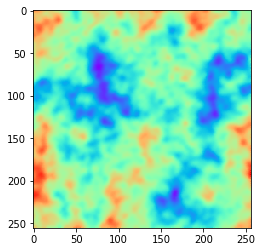

Component 1


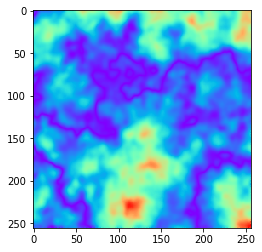

In [69]:
# Show the reconstructed component maps
for i in range(nc):
    print("Component", i)
    plt.imshow(comprecmaps[i], cmap='rainbow');
    plt.show();

In [70]:
# Export reconstructions in a FITS file
hdu = fits.PrimaryHDU(data=comprecmaps, header=components[0].header)
hdu.writeto(reconfile, overwrite=True)
hdu.writeto("Chi2-0.5ent_nograd_recon.fits", overwrite=True)

In [71]:
# Find residuals and export them in a FITS file
residuals = components_data - comprecmaps
hdu = fits.PrimaryHDU(data=residuals, header=components[0].header)
hdu.writeto(errorfile, overwrite=True)
hdu.writeto("Chi2-0.5ent_nograd_resid.fits", overwrite=True)

In [72]:
# Find residual power spectra
residfft = np.fft.fft2(residuals)
residfft = np.fft.fftshift(residfft, axes=(1,2))
residps = np.zeros((nc, topbin+1))
for i in range(nc):
    workspace = np.abs(residfft[i,:,:]**2)
    summ, num = fm.azav(workspace, nx, ny, topbin, bins)
    residps[i,:] = summ

In [73]:
# Find component power spectra
compps = np.zeros((nc, topbin+1))
for i in range(nc):
    workspace = np.abs(compfft[i,:,:]**2)
    summ, num = fm.azav(workspace, nx, ny, topbin, bins)
    compps[i,:] = summ

Component  0


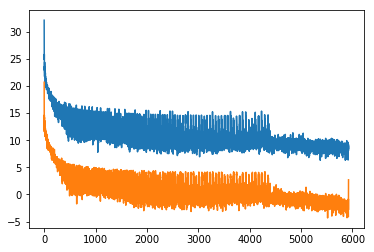

Component  1


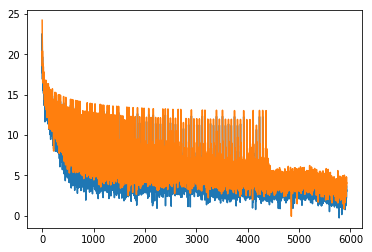

In [74]:
# Show logpower spectra for components and residuals
for i in range(nc):
    print("Component ", i)
    plt.plot(np.log(compps[i,:])), plt.plot(np.log(residps[i,:]))
    plt.show()

In [75]:
dataSynchRecon    = comprecmaps[0]
dataSynch = components_data[0]
dataSynchDB1Recon = comprecmaps[1]

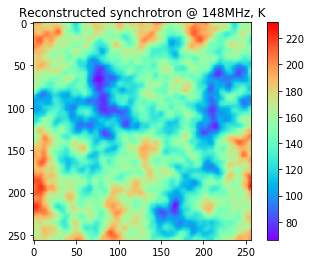

In [76]:
plt.imshow(dataSynchRecon, cmap='rainbow');
plt.title("Reconstructed synchrotron @ 148MHz, K");
plt.colorbar();

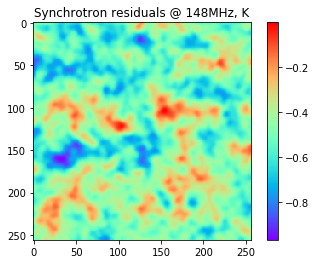

In [77]:
plt.imshow(dataSynch-dataSynchRecon, cmap='rainbow');
plt.title("Synchrotron residuals @ 148MHz, K");
plt.colorbar();

In [78]:
fitsfileHI        = '/home/vlad/software.x32/tests/python/astropy_EoR_forsep/fx=1_RHS=0_fa=1_x_256x256x2048_cuda.fits'
fitsfileTotal     = 'fx=1_RHS=0_fa=1_x_256x256x2048_total_bsvar_fp64.fits'

In [79]:
# Read the modeled data at all 2048 frequencies from fitsfileTotal
hdu_Total = fits.open(fitsfileTotal)
hdu_Total.info()

Filename: fx=1_RHS=0_fa=1_x_256x256x2048_total_bsvar_fp64.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      26   (256, 256, 2048)   float64   


In [80]:
dataTotal = hdu_Total[0].data
print("HI data shape: ", dataTotal.shape)

HI data shape:  (2048, 256, 256)


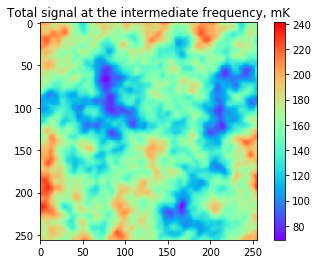

In [81]:
plt.imshow(dataTotal[int(dataTotal.shape[0]/2)], cmap='rainbow');
plt.title("Total signal at the intermediate frequency, mK");
plt.colorbar();

In [82]:
# Read the CosmoHI model from fitsfileHI
hdu_HI = fits.open(fitsfileHI)
hdu_HI.info()

Filename: /home/vlad/software.x32/tests/python/astropy_EoR_forsep/fx=1_RHS=0_fa=1_x_256x256x2048_cuda.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      26   (256, 256, 2048)   float32   


In [83]:
hdu_HI[0].data = hdu_HI[0].data.astype(np.float64, copy=False)
dataHImK = hdu_HI[0].data
print("HI data shape: ", dataHImK.shape)

HI data shape:  (2048, 256, 256)


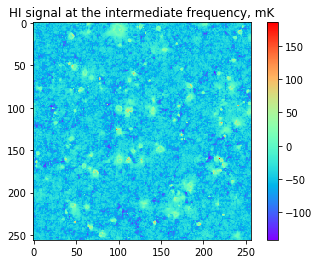

In [84]:
plt.imshow(dataHImK[int(dataHImK.shape[0]/2)], cmap='rainbow');
plt.title("HI signal at the intermediate frequency, mK");
plt.colorbar();

In [85]:
# Convert mK to K
dataHI = dataHImK/1000.

In [86]:
freq0  = 148.0 #MHz
fstart = hdu_HI[0].header['CRVAL3']/1.e6
fdelt  = hdu_HI[0].header['CDELT3']/1.e6
cdelt  = hdu_HI[0].header['CDELT1'] # symmetric pixels, cdeltx = cdelty = cdelt
nx     = hdu_HI[0].header['NAXIS1']
ny     = nx # Square patch
nfreq  = hdu_HI[0].header['NAXIS3']
fend   = fstart + fdelt*(nfreq-1)
print("Fstart = ", fstart, " MHz, Fend = ", fend, " MHz")

Fstart =  88.75  MHz, Fend =  202.83213431013485  MHz


In [87]:
betaSynch = -2.58 # Known mean synchrotron spectral index

In [88]:
# Recover cosmoHI signal for the full 2048channel data set
dataHIRecon2048 = np.zeros_like(dataTotal)
for k in range(nfreq):
    freq = fstart + fdelt*(k) 
    betaSynchCoeff    =  np.power(freq/freq0, betaSynch)
    betaSynchDB1Coeff =  betaSynchCoeff*np.log(freq/freq0)
# Subtract the model of the diffuse component at each 2048 frequency    
    dataHIRecon2048[k] = dataTotal[k] - dataSynchRecon*betaSynchCoeff  - dataSynchDB1Recon*betaSynchDB1Coeff

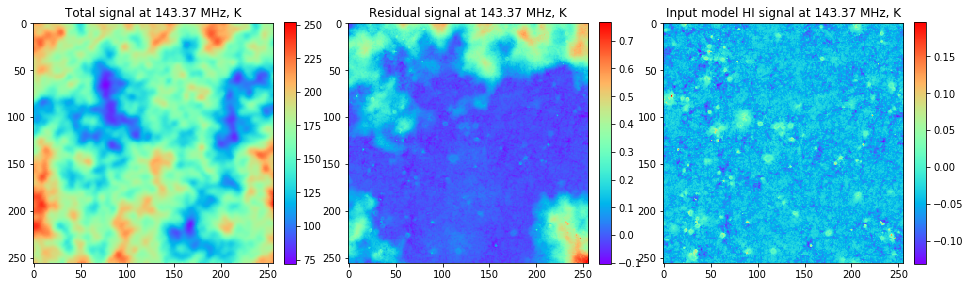

In [89]:
idx = 980
fig=plt.figure(figsize=(16, 16))
fig.add_subplot(1, 3, 1)
im = plt.imshow(dataTotal[idx], cmap='rainbow');
plt.title("Total signal at %5.2f MHz, K"%(fstart + fdelt*idx ));
plt.colorbar(im,fraction=0.046, pad=0.04)
fig.add_subplot(1, 3, 2)
im = plt.imshow(dataHIRecon2048[idx], cmap='rainbow');
plt.title("Residual signal at %5.2f MHz, K"%(fstart + fdelt*idx ));
plt.colorbar(im,fraction=0.046, pad=0.04)
fig.add_subplot(1, 3, 3)
im=plt.imshow(dataHI[idx],cmap='rainbow');
plt.title("Input model HI signal at %5.2f MHz, K"%(fstart + fdelt*idx ));
plt.colorbar(im,fraction=0.046, pad=0.04)
plt.show()

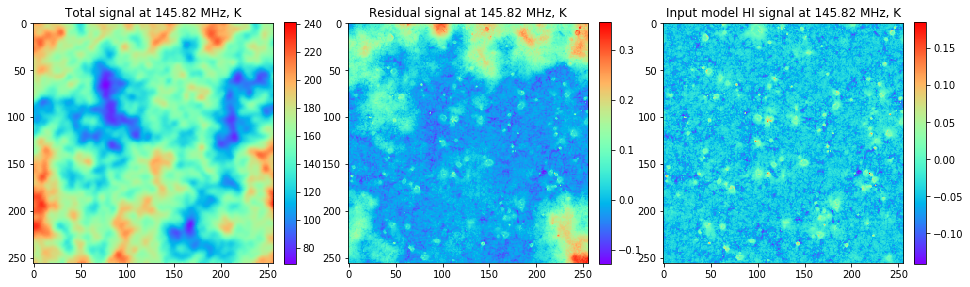

In [90]:
idx = 1024
fig=plt.figure(figsize=(16, 16))
fig.add_subplot(1, 3, 1)
im = plt.imshow(dataTotal[idx], cmap='rainbow');
plt.title("Total signal at %5.2f MHz, K"%(fstart + fdelt*idx ));
plt.colorbar(im,fraction=0.046, pad=0.04)
fig.add_subplot(1, 3, 2)
im = plt.imshow(dataHIRecon2048[idx], cmap='rainbow');
plt.title("Residual signal at %5.2f MHz, K"%(fstart + fdelt*idx ));
plt.colorbar(im,fraction=0.046, pad=0.04)
fig.add_subplot(1, 3, 3)
im=plt.imshow(dataHI[idx],cmap='rainbow');
plt.title("Input model HI signal at %5.2f MHz, K"%(fstart + fdelt*idx ));
plt.colorbar(im,fraction=0.046, pad=0.04)
plt.show()

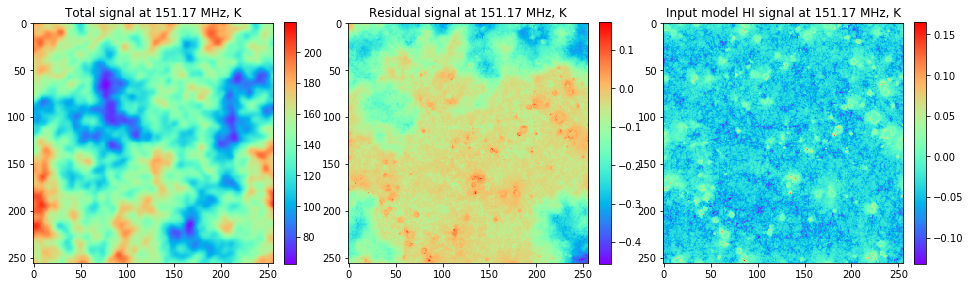

In [91]:
idx=1120
fig=plt.figure(figsize=(16, 16))
fig.add_subplot(1, 3, 1)
im = plt.imshow(dataTotal[idx], cmap='rainbow');
plt.title("Total signal at %5.2f MHz, K"%(fstart + fdelt*idx ));
plt.colorbar(im,fraction=0.046, pad=0.04)
fig.add_subplot(1, 3, 2)
im = plt.imshow(dataHIRecon2048[idx], cmap='rainbow');
plt.title("Residual signal at %5.2f MHz, K"%(fstart + fdelt*idx ));
plt.colorbar(im,fraction=0.046, pad=0.04)
fig.add_subplot(1, 3, 3)
im=plt.imshow(dataHI[idx],cmap='rainbow');
plt.title("Input model HI signal at %5.2f MHz, K"%(fstart + fdelt*idx ));
plt.colorbar(im,fraction=0.046, pad=0.04)
plt.show()